In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
import seaborn as sns

In [9]:
from datetime import datetime

In [10]:
#from pandarallel import pandarallel

In [11]:
#pandarallel.initialize(progress_bar=True)

In [12]:
default_max_columns=pd.get_option('display.max_columns')

In [13]:
default_max_rows=pd.get_option('display.max_rows')

In [14]:
default_precision=pd.get_option('display.precision')

In [15]:
pd.set_option('display.precision', 2)

In [16]:
default_threshold=np.get_printoptions()['threshold']

In [17]:
np.set_printoptions(threshold=10000000)

# Read meta data

In [18]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [19]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [20]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [21]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [22]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [23]:
meta

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,",GBM,IDH-mutant,
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,


# Read raw matrix CORE

In [24]:
#df = pd.read_csv('20210428-EV/dplexonlyreport.csv',index_col=0,header=None)
df = pd.read_csv('20210428-EV/20210513b-report.csv.gz',index_col=0,header=None,low_memory=False)

In [25]:
df.shape

(39, 528)

In [26]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242


In [27]:
df.drop("---",inplace=True)

In [28]:
df.shape

(38, 528)

In [29]:
df.rename({'  ':'sample'},axis='rows',inplace=True)
df.rename({'Subject':'subject'},axis='rows',inplace=True)
df.rename({'Trimmer':'trimmer'},axis='rows',inplace=True)

In [30]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242
STAR Aligned to Transcriptome,111104,112499,112492,112689,112696,112689,92673,93752,93727,92285,...,337860,337076,336880,336843,362402,363298,363259,362012,361905,361853


In [31]:
df=df.T
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to Salmonella,Bowtie2 Aligned to Salmonella %,Bowtie2 Aligned to masked Salmonella,Bowtie2 Aligned to masked Salmonella %,Bowtie2 Aligned to Burkholderia,Bowtie2 Aligned to Burkholderia %,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,45946,3.61,14700,1.15,375543,29.55,277406,21.82,58736,4.62
2,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
3,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
4,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,61284,4.39,18218,1.30,420290,30.10,304330,21.80,75518,5.41
5,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,61285,4.39,18218,1.30,420299,30.10,304339,21.80,75522,5.41


In [32]:
#df=df.merge(meta,left_on='Subject',right_on='subject')
df=df.merge(meta,on='subject')
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,277406,21.82,58736,4.62,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,304330,21.80,75518,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,304339,21.80,75522,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [33]:
#element_counts = pd.read_csv('20210428-EV/rmsk_class_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_family_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/rmsk_name_counts.csv.gz',index_col=0,low_memory=False)
element_counts = pd.read_csv('20210428-EV/mirna_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/mrna_counts.csv.gz',index_col=0,low_memory=False)
#element_counts = pd.read_csv('20210428-EV/gene_counts.csv.gz',index_col=0,low_memory=False)
# diamond_family_counts

element_counts.head()

,SFHH005aa.bbduk1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005aa.bbduk2.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005aa.bbduk3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005aa.cutadapt1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005aa.cutadapt2.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005aa.cutadapt3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005ab.bbduk1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005ab.bbduk2.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005ab.bbduk3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH005a.bbduk1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,...,SFHH006y.bbduk3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006y.cutadapt1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006y.cutadapt2.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006y.cutadapt3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006z.bbduk1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006z.bbduk2.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006z.bbduk3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006z.cutadapt1.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006z.cutadapt2.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts,SFHH006z.cutadapt3.STAR.mirna.Aligned.sortedByCoord.out.bam.mirna_counts
sequence,,,,,,,,,,,,,,,,,,,,,
hsa-let-7a-1-hairpin,30,5,5,5,5,5,10,8,8,250,...,4897,4928,4916,4916,3294,3297,3297,3311,3306,3305
hsa-let-7a-2-3p-mature,0,0,0,0,0,0,0,0,0,6,...,0,0,0,0,47,47,47,47,47,47
hsa-let-7a-2-hairpin,267,267,267,236,236,236,38,36,36,205,...,4858,4882,4882,4882,3287,3291,3291,3305,3306,3305
hsa-let-7a-3-hairpin,89,89,89,91,91,91,11,10,10,95,...,4865,4892,4887,4887,3293,3290,3290,3306,3303,3302
hsa-let-7a-3p-mature,0,0,0,0,0,0,1,1,1,0,...,0,0,0,0,1,1,1,1,1,1


In [34]:
element_counts=element_counts.T
element_counts=element_counts.reset_index()
element_counts[['sample','trimmer','other']]=element_counts['index'].str.split(".",2,expand=True)
element_counts.drop(["index","other"],inplace=True,axis='columns')
element_counts.head()

sequence,hsa-let-7a-1-hairpin,hsa-let-7a-2-3p-mature,hsa-let-7a-2-hairpin,hsa-let-7a-3-hairpin,hsa-let-7a-3p-mature,hsa-let-7a-5p-mature,hsa-let-7b-3p-mature,hsa-let-7b-5p-mature,hsa-let-7b-hairpin,hsa-let-7c-3p-mature,...,hsa-mir-9986-hairpin,hsa-mir-9986-mature,hsa-mir-99a-3p-mature,hsa-mir-99a-5p-mature,hsa-mir-99a-hairpin,hsa-mir-99b-3p-mature,hsa-mir-99b-5p-mature,hsa-mir-99b-hairpin,sample,trimmer
0,30,0,267,89,0,0,2,0,8,0,...,21,1,0,15,117,16,14,74,SFHH005aa,bbduk1
1,5,0,267,89,0,0,2,0,9,1,...,39,1,0,15,117,16,14,56,SFHH005aa,bbduk2
2,5,0,267,89,0,0,2,0,9,1,...,39,1,0,15,117,16,14,56,SFHH005aa,bbduk3
3,5,0,236,91,0,0,1,0,9,1,...,40,0,0,15,112,16,15,57,SFHH005aa,cutadapt1
4,5,0,236,91,0,0,1,0,9,1,...,40,0,0,15,112,16,15,57,SFHH005aa,cutadapt2


In [35]:
df=df.merge(element_counts,on=['sample','trimmer'])
df.shape

(528, 4593)

In [36]:
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-9985-hairpin,hsa-mir-9985-mature,hsa-mir-9986-hairpin,hsa-mir-9986-mature,hsa-mir-99a-3p-mature,hsa-mir-99a-5p-mature,hsa-mir-99a-hairpin,hsa-mir-99b-3p-mature,hsa-mir-99b-5p-mature,hsa-mir-99b-hairpin
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,224,112,21,1,0,15,117,16,14,74
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,221,112,39,1,0,15,117,16,14,56
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,221,112,39,1,0,15,117,16,14,56
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,223,113,40,0,0,15,112,16,15,57
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,223,113,40,0,0,15,112,16,15,57


In [37]:
df.columns  #.tolist()

Index(['sample', 'subject', 'Lab kit', 'trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'hsa-mir-9985-hairpin', 'hsa-mir-9985-mature', 'hsa-mir-9986-hairpin',
       'hsa-mir-9986-mature', 'hsa-mir-99a-3p-mature', 'hsa-mir-99a-5p-mature',
       'hsa-mir-99a-hairpin', 'hsa-mir-99b-3p-mature', 'hsa-mir-99b-5p-mature',
       'hsa-mir-99b-hairpin'],
      dtype='object', length=4593)

In [38]:
#genes=df.columns[92:142]
#genes=df.columns[100:554]
#a=df.columns.tolist().index('STAR Gene Counts')+1
#b=df.columns.tolist().index('STAR miRNA Counts')
#genes=df.columns[a:b]
elements=element_counts.columns[:-2]
elements

Index(['hsa-let-7a-1-hairpin', 'hsa-let-7a-2-3p-mature',
       'hsa-let-7a-2-hairpin', 'hsa-let-7a-3-hairpin', 'hsa-let-7a-3p-mature',
       'hsa-let-7a-5p-mature', 'hsa-let-7b-3p-mature', 'hsa-let-7b-5p-mature',
       'hsa-let-7b-hairpin', 'hsa-let-7c-3p-mature',
       ...
       'hsa-mir-9985-hairpin', 'hsa-mir-9985-mature', 'hsa-mir-9986-hairpin',
       'hsa-mir-9986-mature', 'hsa-mir-99a-3p-mature', 'hsa-mir-99a-5p-mature',
       'hsa-mir-99a-hairpin', 'hsa-mir-99b-3p-mature', 'hsa-mir-99b-5p-mature',
       'hsa-mir-99b-hairpin'],
      dtype='object', name='sequence', length=4549)

In [39]:
df['Raw Read Count'] = pd.to_numeric(df['Raw Read Count'], errors='coerce')

In [40]:
df['Trimmed Read Count'] = pd.to_numeric(df['Trimmed Read Count'], errors='coerce')

In [41]:
pd.set_option('display.max_rows',None)

In [42]:
#df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

In [43]:
#df[['subject','sample','trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

In [44]:
pd.set_option('display.max_rows',default_max_rows)

# Prepping to ttest all items against all other items

In [45]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [46]:
u=df['diag'].unique()
diags=u[0:3]
diags=np.append(diags,u[4])

In [47]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [48]:
type(diags)

numpy.ndarray

In [49]:
diags=diags.tolist()

In [50]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [51]:
# Why was this here?

#import warnings
#warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

pca plots

In [52]:
def ttests_boxplots_and_heatmaps(localdf,columns,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    for col in columns:

        if ( col not in localdf.columns ):
            continue

        for labkit in localdf['Lab kit'].unique():
            #"D-plex","Lexogen":
            for trimmer in 'bbduk2','cutadapt2':
                #localdf['Trimmer'].unique():
                #"bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
                for diag in diags:
                    others=diags.copy()
                    others.remove(diag)
                    for other in others:
                        t, p = stats.ttest_ind(
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==diag))][col],
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==other))][col])
                        if p < heat_p:
                            select_p_values.append([abs(t),p,col,labkit,trimmer])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col','labkit','trimmer'])                        
    pdf=pdf.drop_duplicates().sort_values('p')

    for index, row in pdf.iterrows():
        if row['p'] < box_p:
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+
                  row['labkit']+"  :  "+row['trimmer']+"  :  "+row['col'])
            print("Control and blanks")
            print(localdf[
                (localdf['diag']=='V01 control (S1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank 2 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank1 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
                        
            localdf[((localdf["Lab kit"]==row['labkit']) &
                     (localdf["trimmer"]==row['trimmer']))].boxplot(
                column=row['col'],by=['diag'])
            plt.title(row['col'] + " Normalized by Trimmed Read Count")
            plt.xticks(rotation=75,ha='right')
            plt.show()

    selected=['subject','sample','Lab kit','trimmer','diag','idh']
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)

    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    if len(selected) > 7:
        for trimmer in 'bbduk2','cutadapt2':
            for labkit in dfn['Lab kit'].unique():
                tmp=localdf[selected].copy()
                tmp=tmp[(tmp['trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
                tmp=tmp.drop('trimmer',axis='columns')
                tmp=tmp.drop('Lab kit',axis='columns')
                tmp.set_index(['subject','sample','diag','idh'],inplace=True)
                
                #tmp-=tmp.min() # This may almost always be 0 now.
                tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
                # ...
                #standard_scale int or None, optional
                #Either 0 (rows) or 1 (columns).
                #Whether or not to standardize that dimension, meaning for each row or column,
                #subtract the minimum and divide each by its maximum.
                # how would that deal with 0s or empty cells

                tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this
                
                tmp.reset_index(inplace=True)

                #tmp1=tmp.sort_values(['diag']).T
                tmp=tmp.sort_values(['idh','diag'])
                #print(tmp.head())
                tmp.drop(['subject'],inplace=True,axis='columns')
                tmp.set_index(['sample','idh'],inplace=True)
                
                diagnoses=tmp.pop('diag')
                #lut = dict(zip(diagnoses.unique(), "rgbcmykb"))
                #col_colors = diagnoses.map(lut)
                #print(col_colors)
                #print(tmp.columns)
                
                tmp=tmp.T

                #print('pal')
                network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                                    light=.9, dark=.1, reverse=True,
                                    start=1, rot=-2)
                #print(network_pal)
                network_pal
                #print('lut')
                network_lut = dict(zip(diagnoses.unique(), network_pal))
                #print(network_lut)
                #print('labels')
                # Convert the palette to vectors that will be drawn on the side of the matrix
                network_labels = diagnoses
                #print(network_labels)
                network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
                #print('colors')
                #print(network_colors)
                
                # from http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
                # Create a custom palette to identify the networks
                #network_pal = sns.cubehelix_palette(len(used_networks),
                #                    light=.9, dark=.1, reverse=True,
                #                    start=1, rot=-2)
                #network_lut = dict(zip(map(str, used_networks), network_pal))

                # Convert the palette to vectors that will be drawn on the side of the matrix
                #network_labels = df.columns.get_level_values("network")
                #network_colors = pd.Series(network_labels, index=df.columns).map(network_lut)                
   
                # Create a custom colormap for the heatmap values
                #cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

                # Draw the full plot
                #g = sns.clustermap(df.corr(),

                #                 # Turn off the clustering
                #                 row_cluster=False, col_cluster=False,

                #                  # Add colored class labels
                #                  row_colors=network_colors, col_colors=network_colors,

                #                  # Make the plot look better when many rows/cols
                #                  linewidths=0, xticklabels=False, yticklabels=False)

                # Draw the legend bar for the classes                 
                #for label in network_labels.unique():
                #    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                #                            label=label, linewidth=0)
                #g.ax_col_dendrogram.legend(loc="center", ncol=5)

                
                g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 1 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                
                # Adjust the postion of the main colorbar for the heatmap
                #g.cax.set_position([.97, .2, .03, .45])
                g.cax.set_position([0, .15, .005, .65])
                plt.show()

                g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 2 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                                
                # Adjust the postion of the main colorbar for the heatmap
                # [dist from left,dist from bottom?,width?,height?]
                g.cax.set_position([0, .15, .005, .65])
                plt.show()  
    else:
        print("Not enough data to produce cluster maps")

# Normalize by Trimmed Read Count

In [53]:
dfn=df.copy()

In [54]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-9985-hairpin,hsa-mir-9985-mature,hsa-mir-9986-hairpin,hsa-mir-9986-mature,hsa-mir-99a-3p-mature,hsa-mir-99a-5p-mature,hsa-mir-99a-hairpin,hsa-mir-99b-3p-mature,hsa-mir-99b-5p-mature,hsa-mir-99b-hairpin
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,224,112,21,1,0,15,117,16,14,74
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,221,112,39,1,0,15,117,16,14,56
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,221,112,39,1,0,15,117,16,14,56
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,223,113,40,0,0,15,112,16,15,57
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,223,113,40,0,0,15,112,16,15,57


In [55]:
datetime.now().strftime("%H:%M:%S")

'12:03:37'

In [56]:
dfn[elements]=(1e9*dfn[elements].values)/dfn[['Trimmed Read Count']].values

In [57]:
datetime.now().strftime("%H:%M:%S")

'12:03:59'

In [58]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-9985-hairpin,hsa-mir-9985-mature,hsa-mir-9986-hairpin,hsa-mir-9986-mature,hsa-mir-99a-3p-mature,hsa-mir-99a-5p-mature,hsa-mir-99a-hairpin,hsa-mir-99b-3p-mature,hsa-mir-99b-5p-mature,hsa-mir-99b-hairpin
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,176269.14,88134.57,16525.23,786.92,0.0,11803.74,92069.15,12590.65,11016.82,58231.77
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,160964.56,81574.80,28405.51,728.35,0.0,10925.20,85216.53,11653.54,10196.85,40787.40
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,160961.75,81573.38,28405.01,728.33,0.0,10925.01,85215.04,11653.34,10196.67,40786.69
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,159754.59,80951.88,28655.53,0.00,0.0,10745.82,80235.49,11462.21,10745.82,40834.13
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,159754.37,80951.76,28655.49,0.00,0.0,10745.81,80235.38,11462.20,10745.81,40834.08


In [59]:
datetime.now().strftime("%H:%M:%S")

'12:03:59'

In [60]:
for c in ['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1',
    'EGFR','EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1',
    'RB1','RB1CC1','RB1-DT','TERT','TP53']:
        if( c not in dfn.columns ):
            print("Missing "+c) 

Missing CDKN2A
Missing CDKN2A-DT
Missing CDKN2AIP
Missing CDKN2AIPNL
Missing CDKN2B
Missing CDKN2B-AS1
Missing EGFR
Missing EGFR-AS1
Missing IDH1
Missing IDH1-AS1
Missing IDH2
Missing IDH2-DT
Missing NF1
Missing NOTCH1
Missing RB1
Missing RB1CC1
Missing RB1-DT
Missing TERT
Missing TP53


In [61]:
datetime.now().strftime("%H:%M:%S")

'12:03:59'

# Select Genes (if using Genes)

In [62]:
ttests_boxplots_and_heatmaps(dfn,['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1','EGFR',
                                  'EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1','RB1','RB1CC1',
                                  'RB1-DT','TERT','TP53'],box_p=0.1,heat_p=0.2)

Not enough data to produce cluster maps


In [63]:
datetime.now().strftime("%H:%M:%S")

'12:03:59'

# Elements

 p : 0.00013118249927530502  ( t : 4.8408240809031104 ) :  D-plex  :  bbduk2  :  hsa-mir-602-mature
Control and blanks
73     1546.016804
337       0.000000
Name: hsa-mir-602-mature, dtype: float64
205    4835.45571
Name: hsa-mir-602-mature, dtype: float64
469    4732.218541
Name: hsa-mir-602-mature, dtype: float64


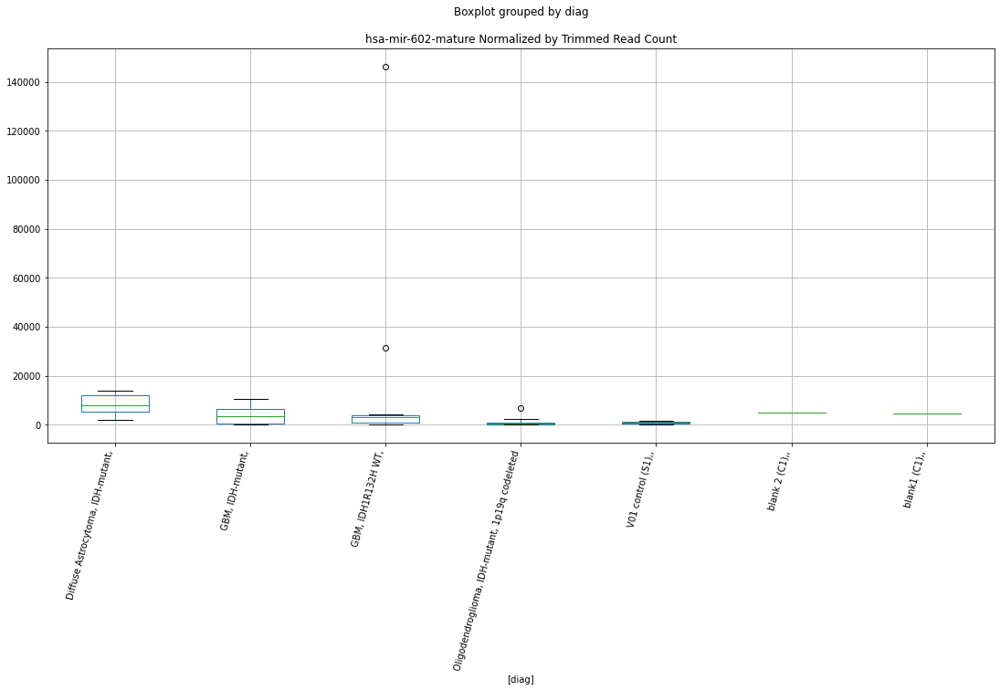

 p : 0.0004591611895880398  ( t : 4.271561802854335 ) :  D-plex  :  cutadapt2  :  hsa-mir-6771-hairpin
Control and blanks
76     29546.954277
340    44036.606750
Name: hsa-mir-6771-hairpin, dtype: float64
208    11992.494815
Name: hsa-mir-6771-hairpin, dtype: float64
472    20806.410224
Name: hsa-mir-6771-hairpin, dtype: float64


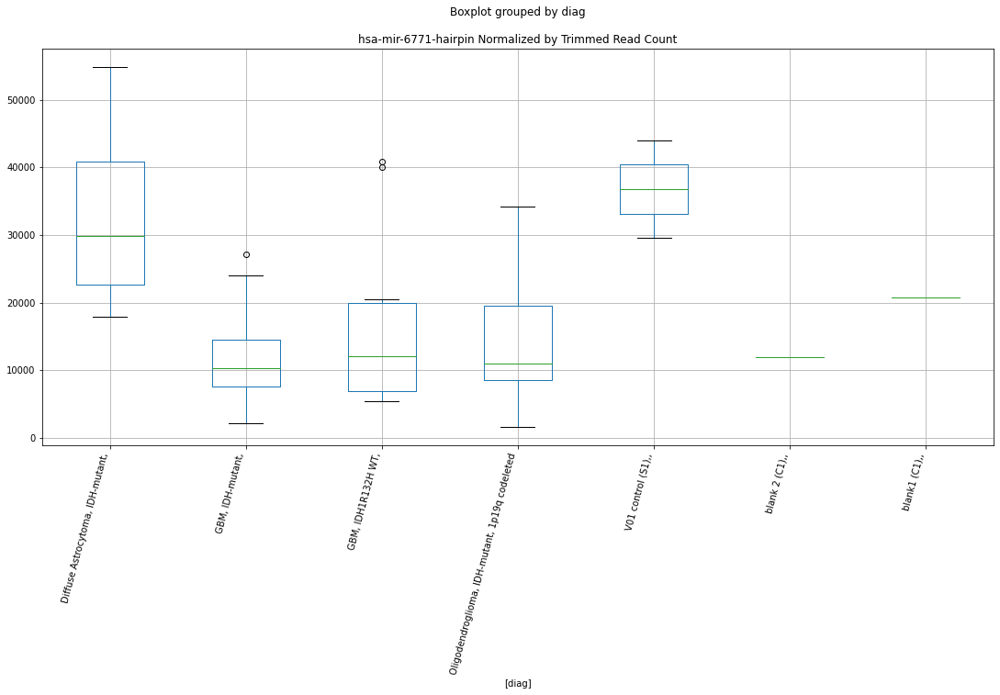

 p : 0.0004685727822030752  ( t : 4.262416314842988 ) :  D-plex  :  bbduk2  :  hsa-mir-6771-hairpin
Control and blanks
73     30147.327671
337    44507.863204
Name: hsa-mir-6771-hairpin, dtype: float64
205    11999.0938
Name: hsa-mir-6771-hairpin, dtype: float64
469    20111.928799
Name: hsa-mir-6771-hairpin, dtype: float64


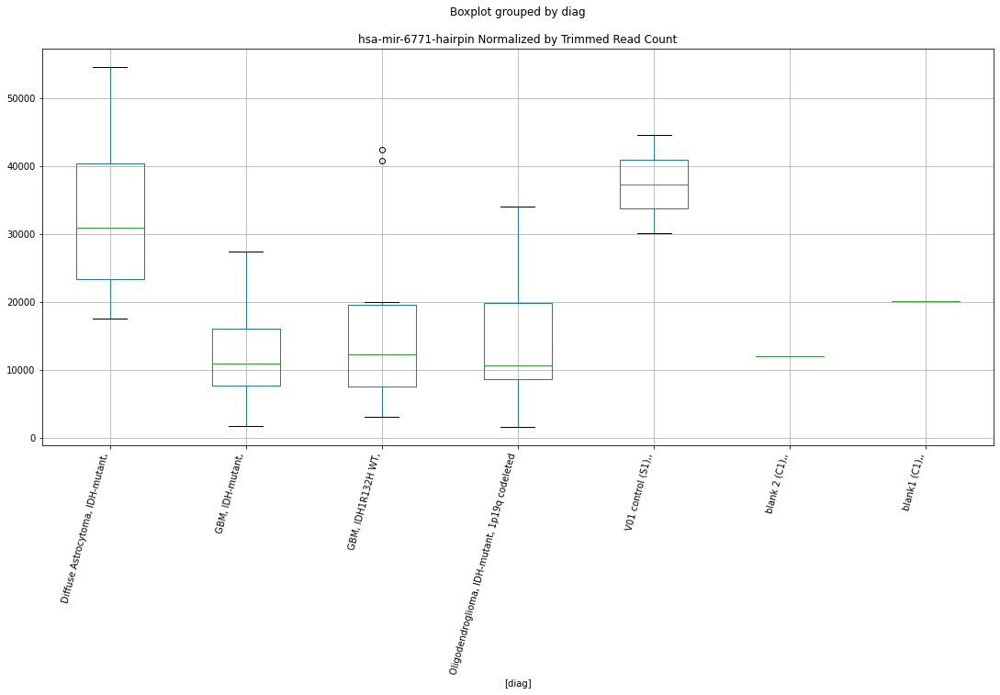

 p : 0.0006326069102628445  ( t : 4.127304919676025 ) :  D-plex  :  cutadapt2  :  hsa-mir-602-mature
Control and blanks
76     757.614212
340      0.000000
Name: hsa-mir-602-mature, dtype: float64
208    4409.005447
Name: hsa-mir-602-mature, dtype: float64
472    4623.646716
Name: hsa-mir-602-mature, dtype: float64


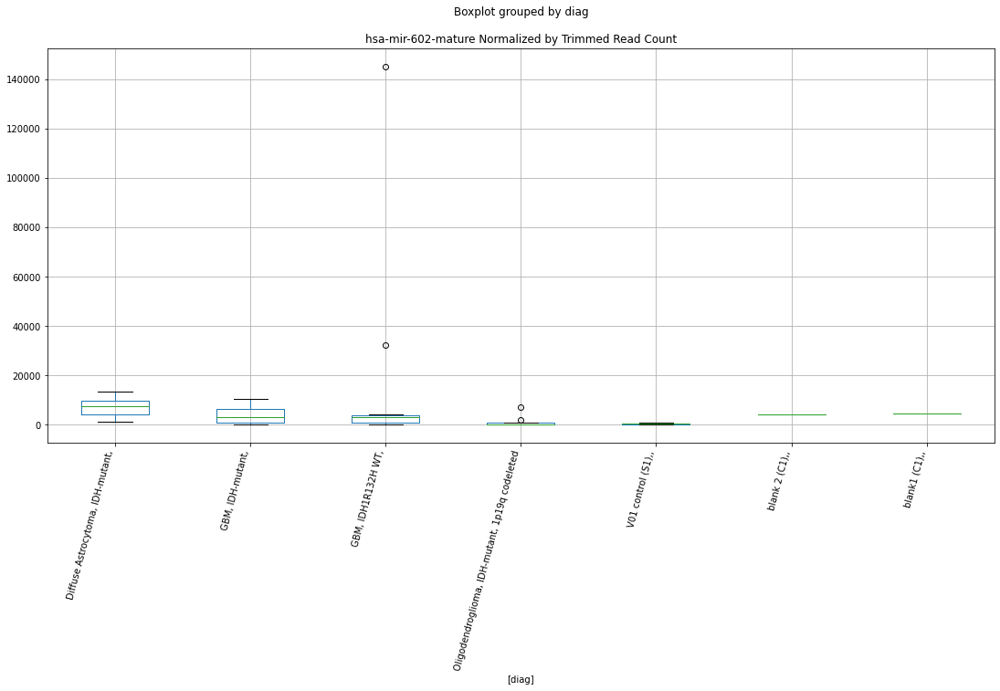

 p : 0.0007094052650137412  ( t : 4.075804404430772 ) :  D-plex  :  cutadapt2  :  hsa-mir-1343-5p-mature
Control and blanks
76     5303.299486
340    2642.196405
Name: hsa-mir-1343-5p-mature, dtype: float64
208    20810.505708
Name: hsa-mir-1343-5p-mature, dtype: float64
472    11559.116791
Name: hsa-mir-1343-5p-mature, dtype: float64


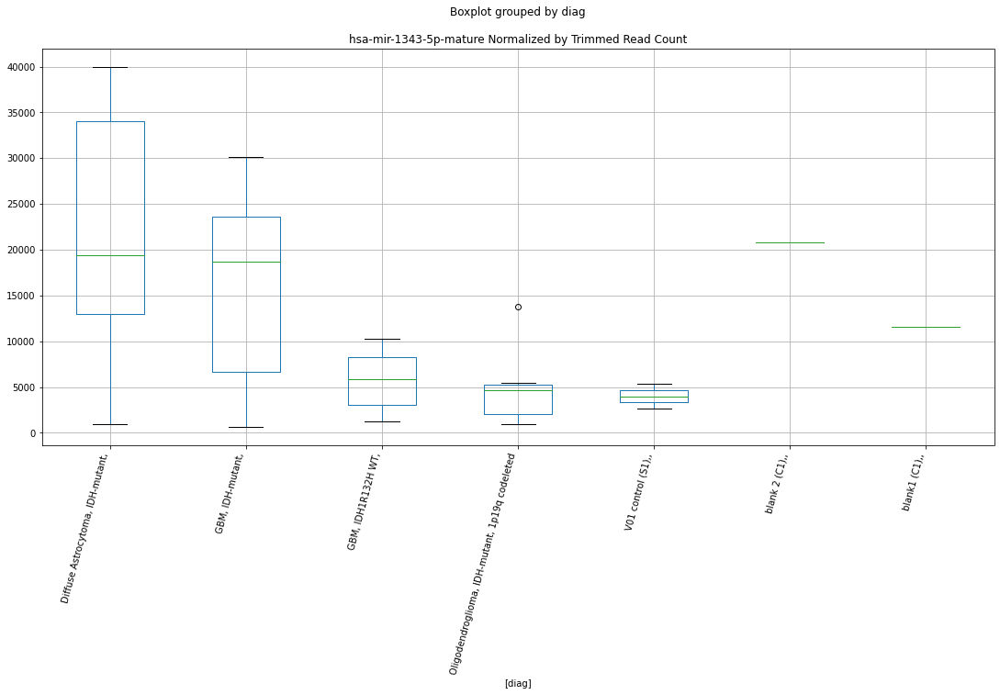

 p : 0.0007211752613799888  ( t : 4.0684108284854235 ) :  D-plex  :  cutadapt2  :  hsa-mir-4436a-hairpin
Control and blanks
76     4545.685273
340    9688.053485
Name: hsa-mir-4436a-hairpin, dtype: float64
208    7936.209804
Name: hsa-mir-4436a-hairpin, dtype: float64
472    14448.895989
Name: hsa-mir-4436a-hairpin, dtype: float64


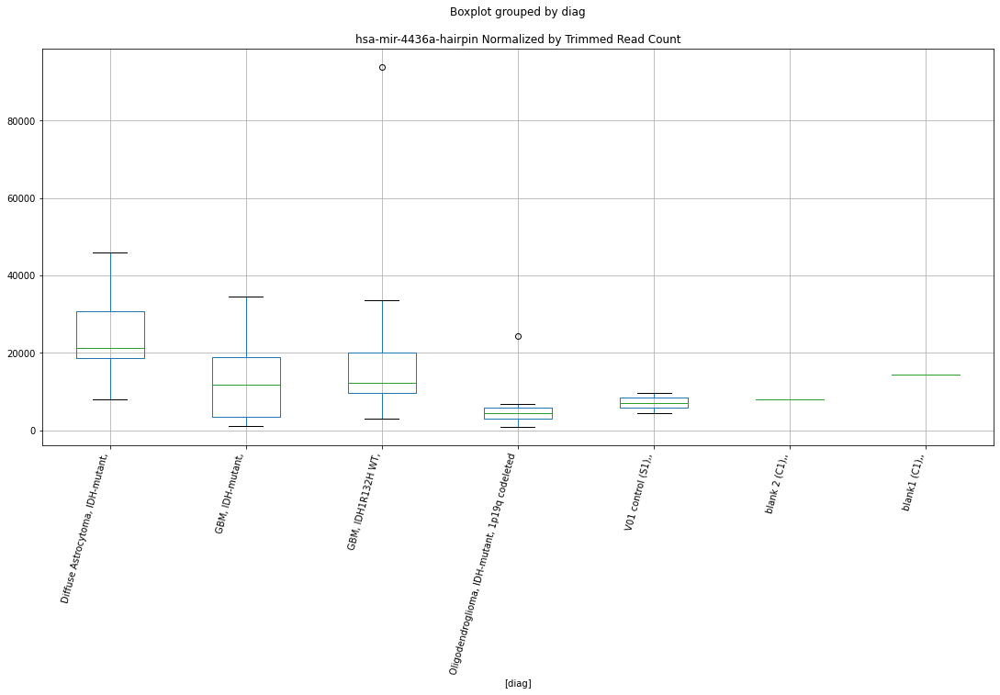

 p : 0.000732647412172634  ( t : 4.061320163522005 ) :  Lexogen  :  cutadapt2  :  hsa-mir-132-hairpin
Control and blanks
82         0.000000
346    46716.463892
Name: hsa-mir-132-hairpin, dtype: float64
214    0.0
Name: hsa-mir-132-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-132-hairpin, dtype: float64


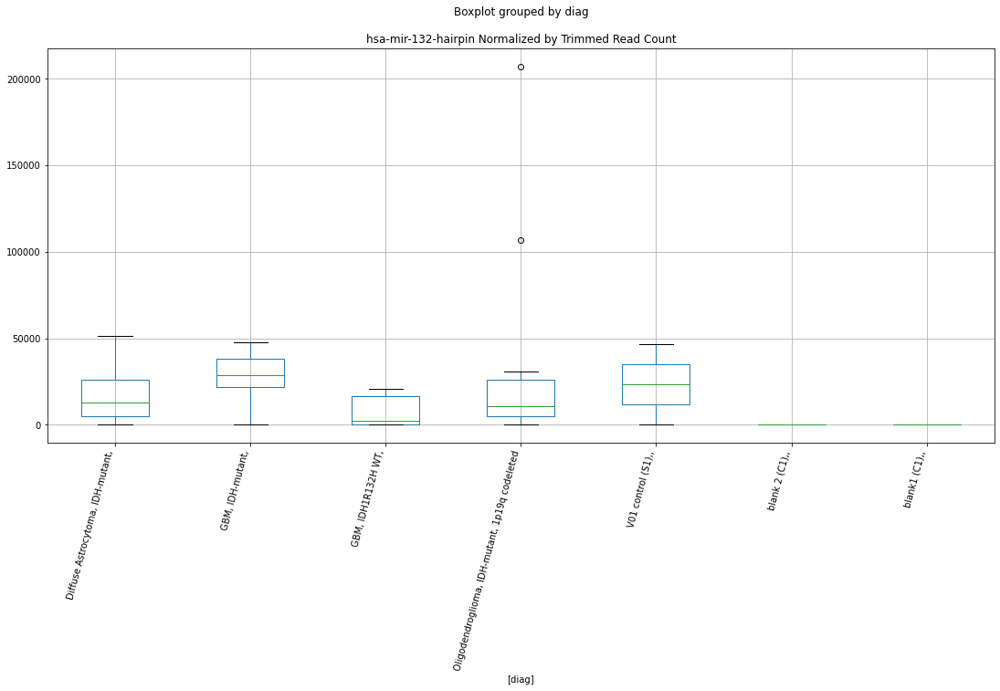

 p : 0.0009253483231942721  ( t : 3.956467306350517 ) :  D-plex  :  cutadapt2  :  hsa-mir-4649-5p-mature
Control and blanks
76        0.000000
340    2642.196405
Name: hsa-mir-4649-5p-mature, dtype: float64
208    4938.0861
Name: hsa-mir-4649-5p-mature, dtype: float64
472    7513.425914
Name: hsa-mir-4649-5p-mature, dtype: float64


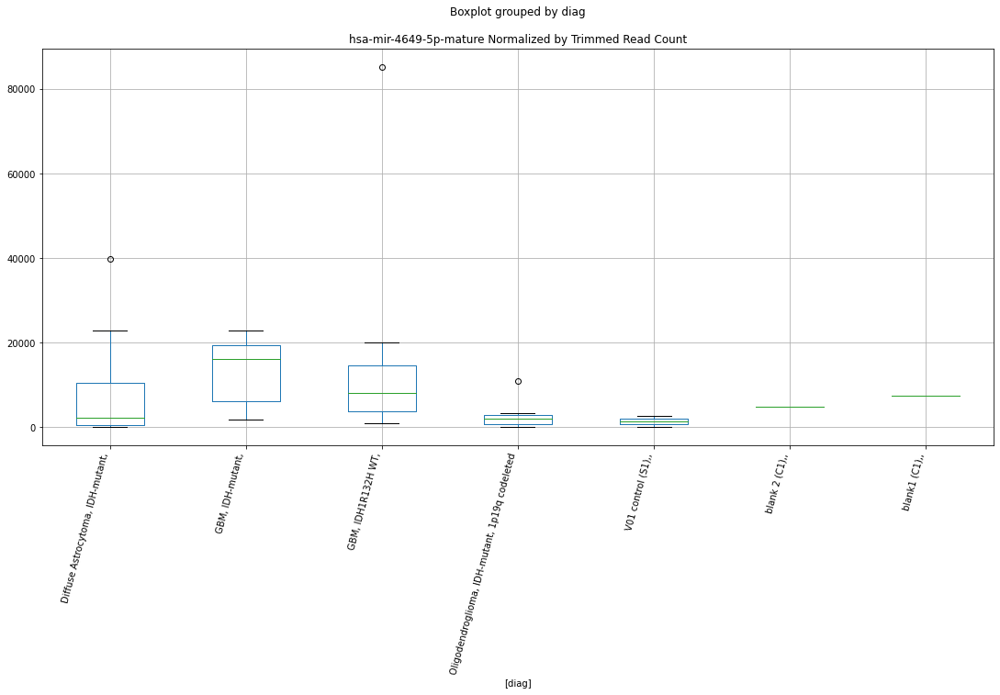

 p : 0.0010366216713766732  ( t : 3.905504993932564 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6780b-3p-mature
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-6780b-3p-mature, dtype: float64
214    1898.585174
Name: hsa-mir-6780b-3p-mature, dtype: float64
478    0.0
Name: hsa-mir-6780b-3p-mature, dtype: float64


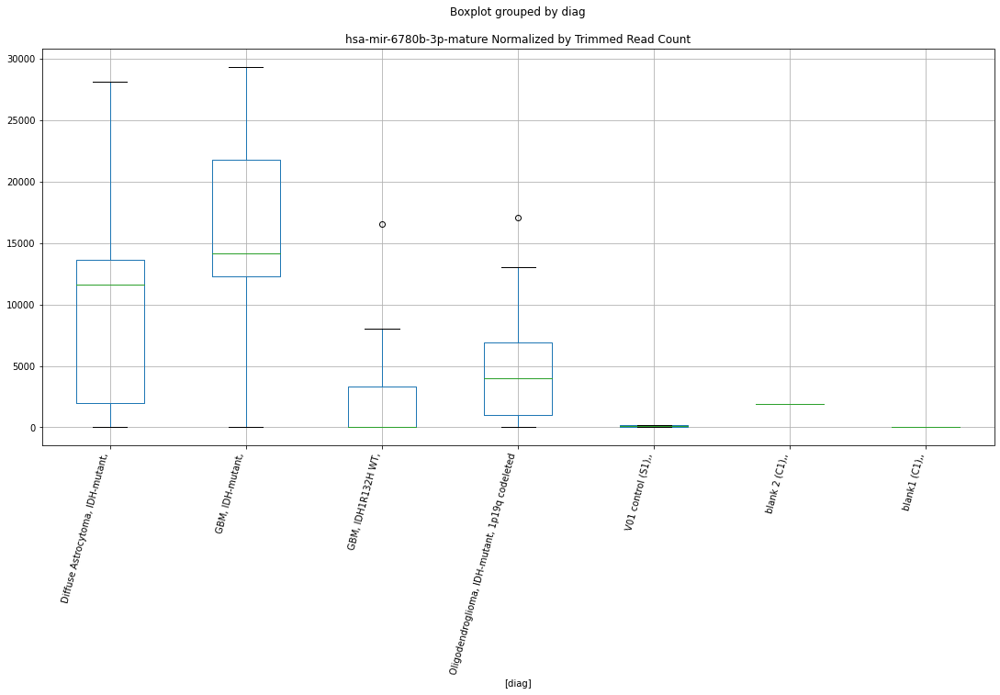

 p : 0.0010747023252143661  ( t : 3.8893157738302118 ) :  Lexogen  :  bbduk2  :  hsa-mir-6780b-3p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-6780b-3p-mature, dtype: float64
211    1913.14434
Name: hsa-mir-6780b-3p-mature, dtype: float64
475    0.0
Name: hsa-mir-6780b-3p-mature, dtype: float64


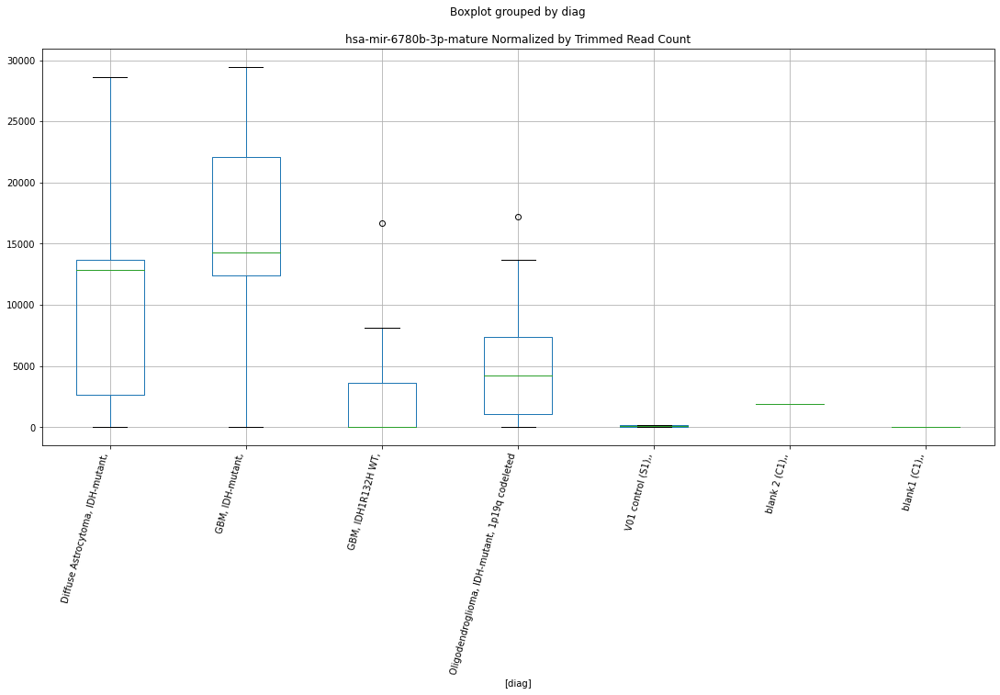

 p : 0.0011405888286168888  ( t : 3.8626162248584666 ) :  D-plex  :  bbduk2  :  hsa-mir-155-hairpin
Control and blanks
73     89668.974612
337     2670.471792
Name: hsa-mir-155-hairpin, dtype: float64
205    20595.459507
Name: hsa-mir-155-hairpin, dtype: float64
469    30759.420516
Name: hsa-mir-155-hairpin, dtype: float64


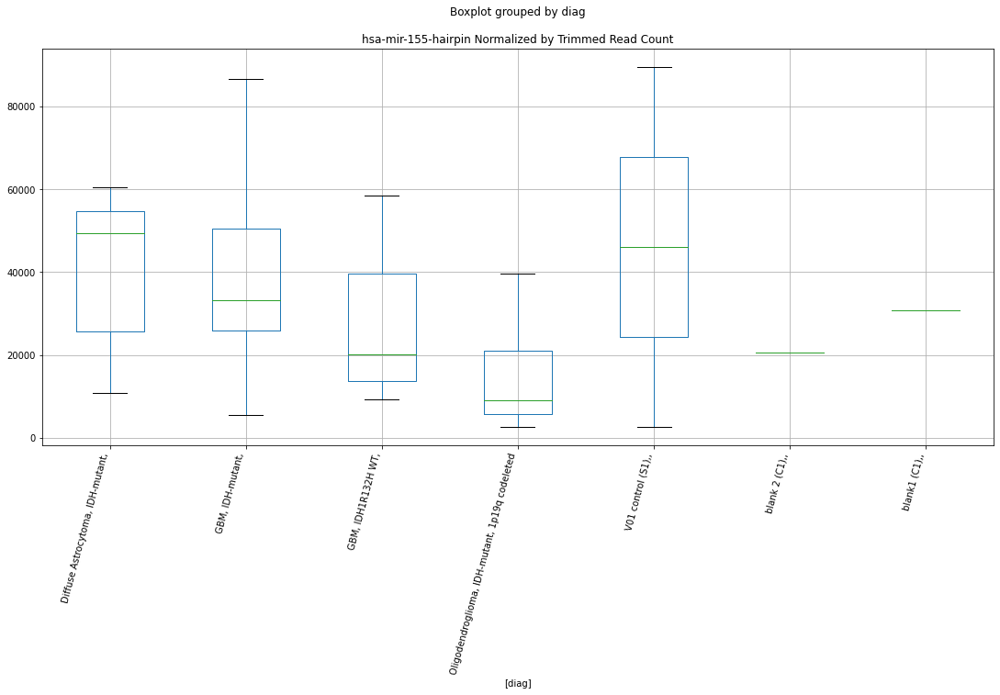

 p : 0.0011765683338475531  ( t : 3.8486802975494823 ) :  D-plex  :  cutadapt2  :  hsa-mir-1343-5p-mature
Control and blanks
76     5303.299486
340    2642.196405
Name: hsa-mir-1343-5p-mature, dtype: float64
208    20810.505708
Name: hsa-mir-1343-5p-mature, dtype: float64
472    11559.116791
Name: hsa-mir-1343-5p-mature, dtype: float64


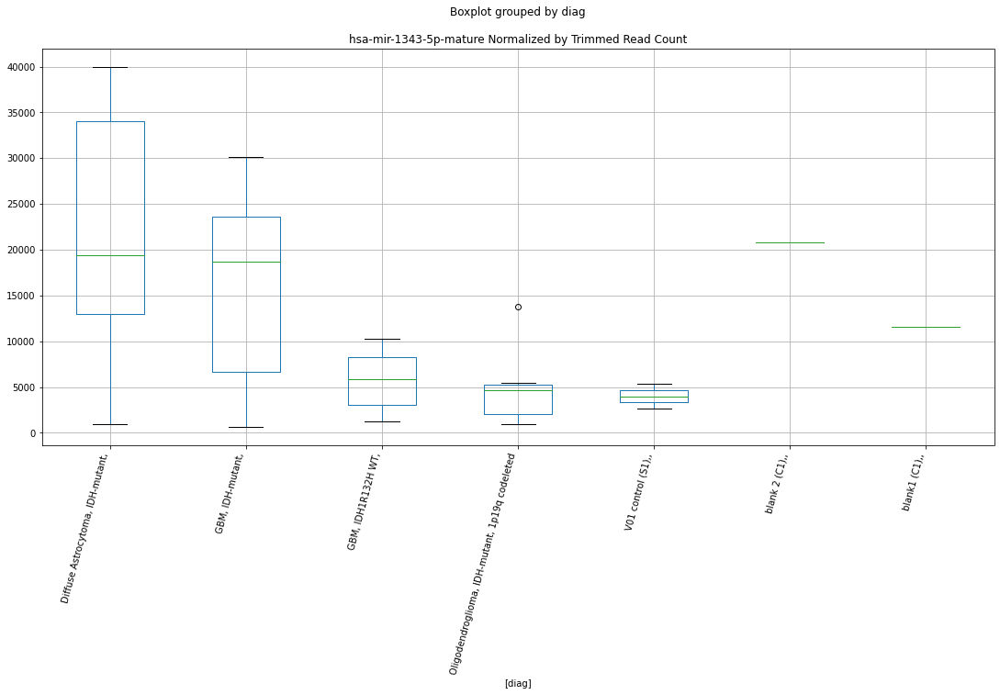

 p : 0.0011871138993874118  ( t : 3.8446763881884656 ) :  D-plex  :  cutadapt2  :  hsa-mir-9-1-hairpin
Control and blanks
76     115157.360260
340    143559.338006
Name: hsa-mir-9-1-hairpin, dtype: float64
208    87121.947623
Name: hsa-mir-9-1-hairpin, dtype: float64
472    41034.864608
Name: hsa-mir-9-1-hairpin, dtype: float64


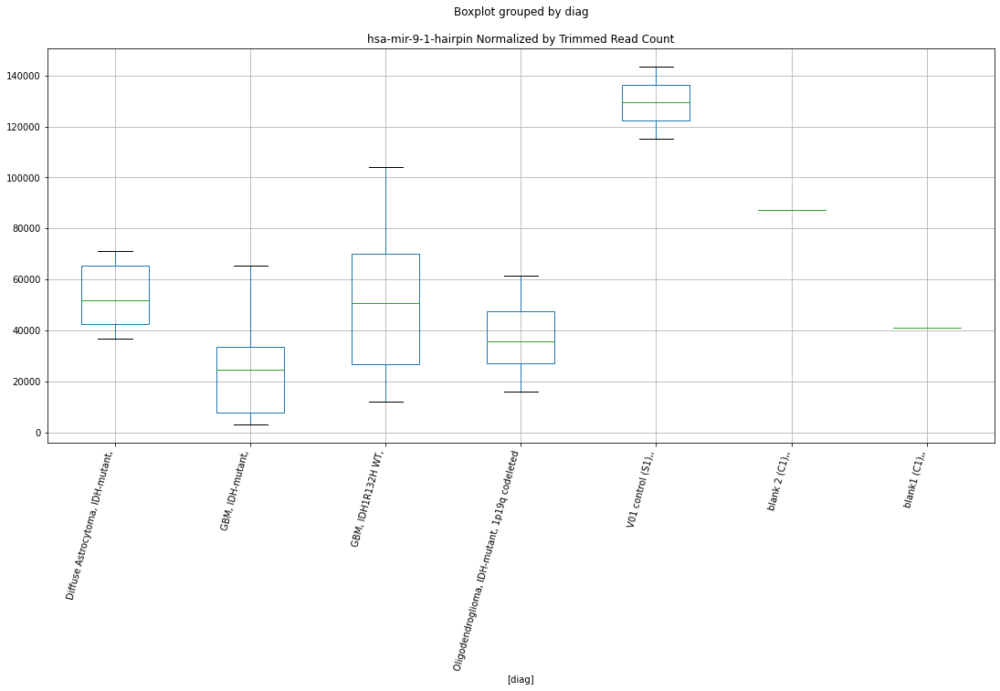

 p : 0.0012091532523075769  ( t : 3.836422145126015 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122b-3p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64
214    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64
478    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64


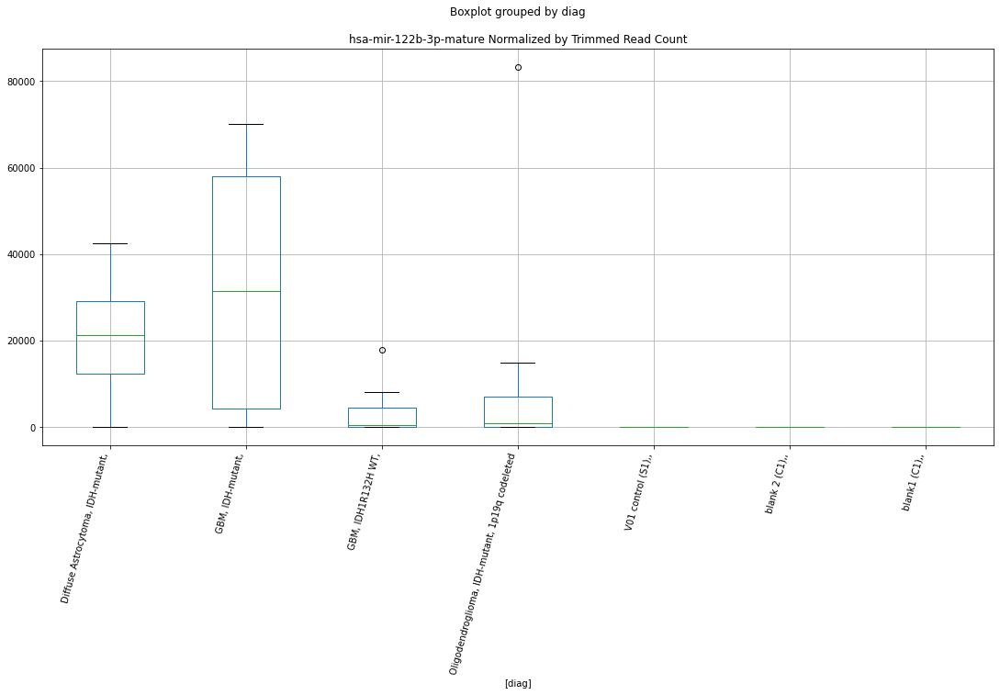

 p : 0.0012887800970030198  ( t : 3.8078043664214687 ) :  Lexogen  :  bbduk2  :  hsa-mir-132-hairpin
Control and blanks
79      2861.197583
343    48195.349552
Name: hsa-mir-132-hairpin, dtype: float64
211    546.612669
Name: hsa-mir-132-hairpin, dtype: float64
475    1197.578688
Name: hsa-mir-132-hairpin, dtype: float64


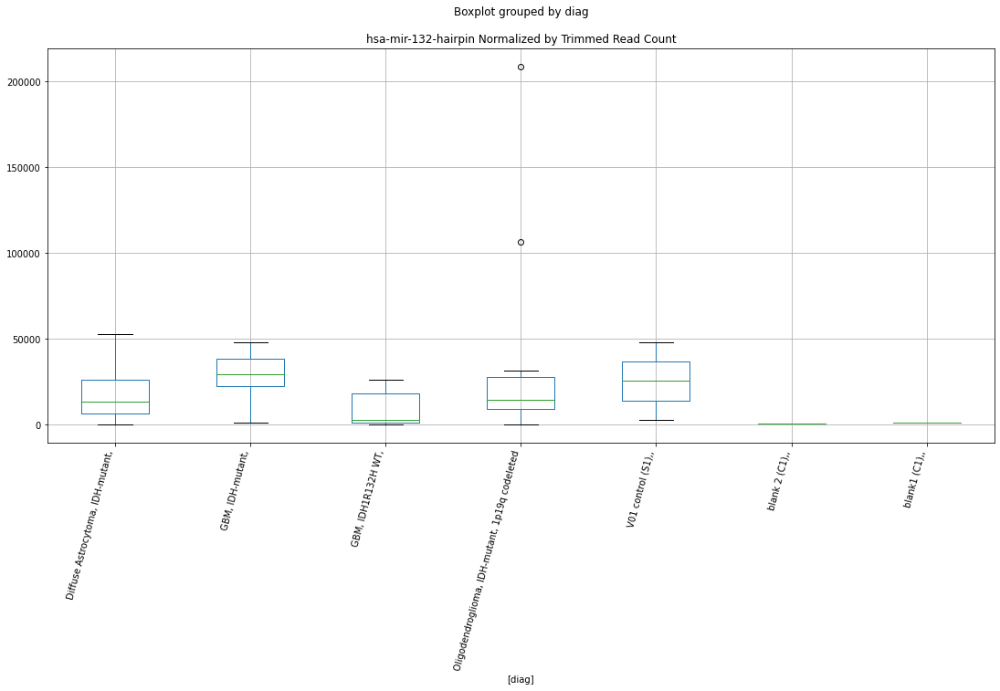

 p : 0.0013240533965704398  ( t : 3.795687545096537 ) :  D-plex  :  bbduk2  :  hsa-mir-4436a-hairpin
Control and blanks
73     4638.050411
337    9791.729905
Name: hsa-mir-4436a-hairpin, dtype: float64
205    8954.547612
Name: hsa-mir-4436a-hairpin, dtype: float64
469    15379.710258
Name: hsa-mir-4436a-hairpin, dtype: float64


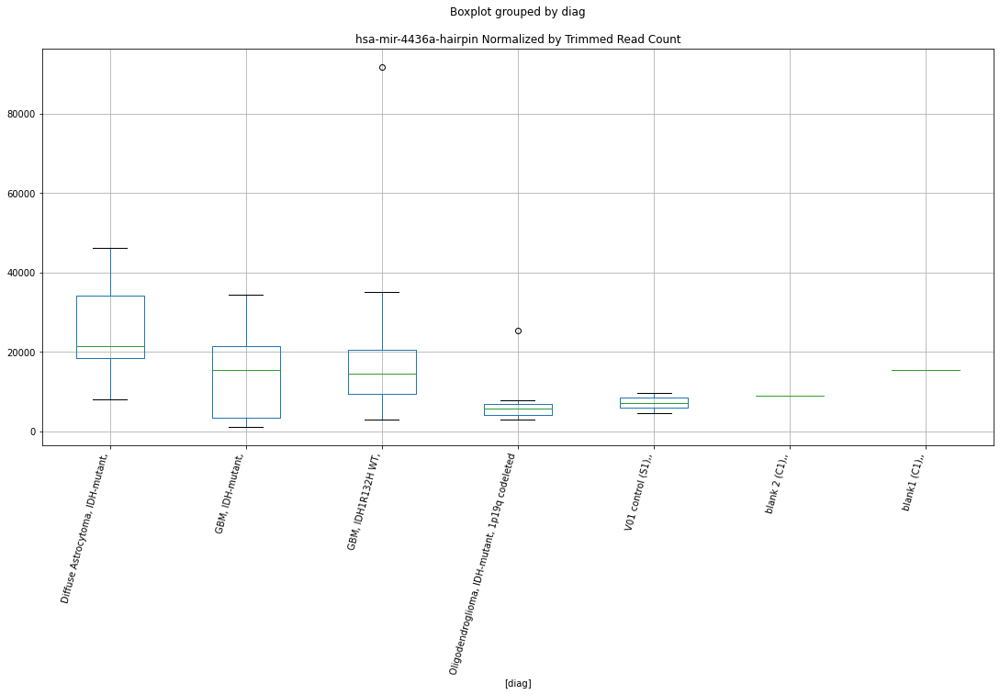

 p : 0.0013310485241096622  ( t : 3.7933229740142016 ) :  Lexogen  :  bbduk2  :  hsa-mir-122b-3p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-122b-3p-mature, dtype: float64
211    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64
475    239.515738
Name: hsa-mir-122b-3p-mature, dtype: float64


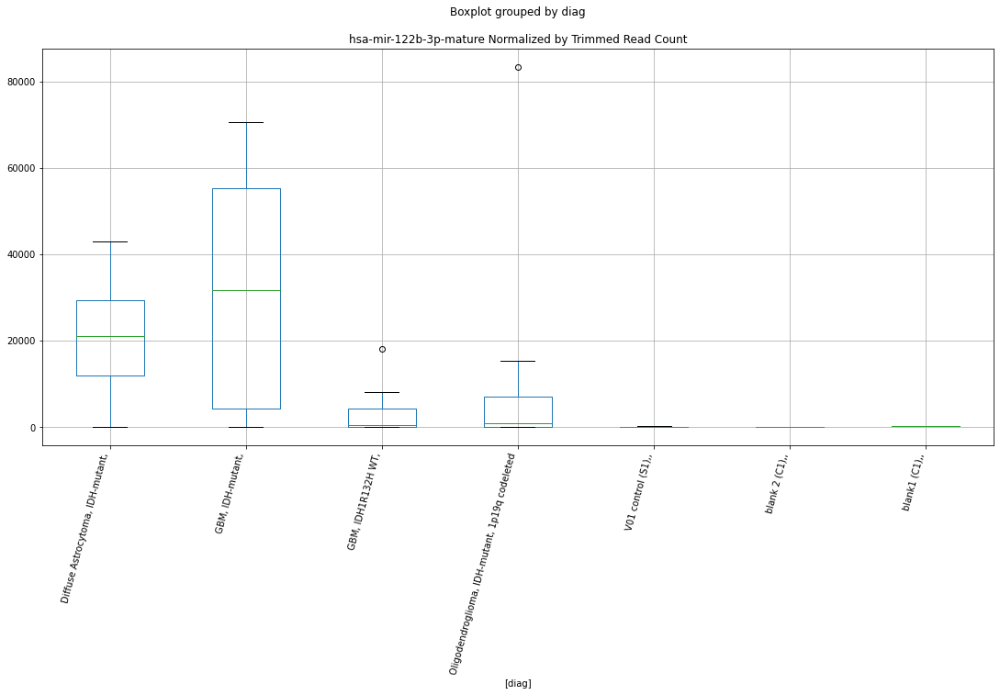

 p : 0.0014144847751123197  ( t : 3.766038076207558 ) :  D-plex  :  bbduk2  :  hsa-mir-6771-hairpin
Control and blanks
73     30147.327671
337    44507.863204
Name: hsa-mir-6771-hairpin, dtype: float64
205    11999.0938
Name: hsa-mir-6771-hairpin, dtype: float64
469    20111.928799
Name: hsa-mir-6771-hairpin, dtype: float64


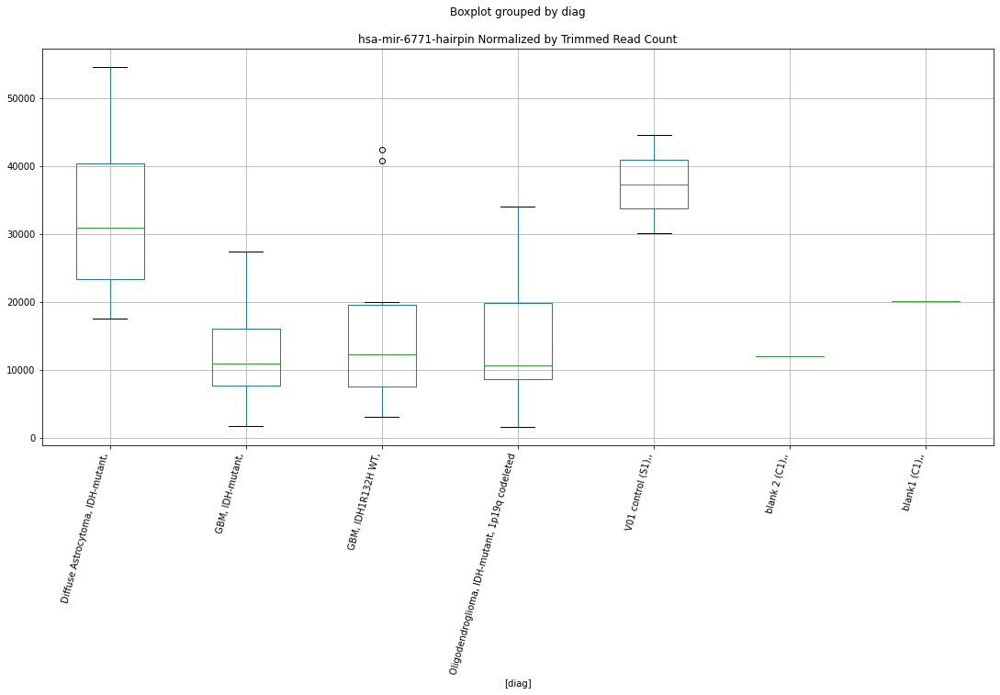

 p : 0.0015095008157605299  ( t : 3.7368574720682837 ) :  D-plex  :  cutadapt2  :  hsa-mir-155-hairpin
Control and blanks
76     87883.248619
340     2642.196405
Name: hsa-mir-155-hairpin, dtype: float64
208    19752.3444
Name: hsa-mir-155-hairpin, dtype: float64
472    29475.747817
Name: hsa-mir-155-hairpin, dtype: float64


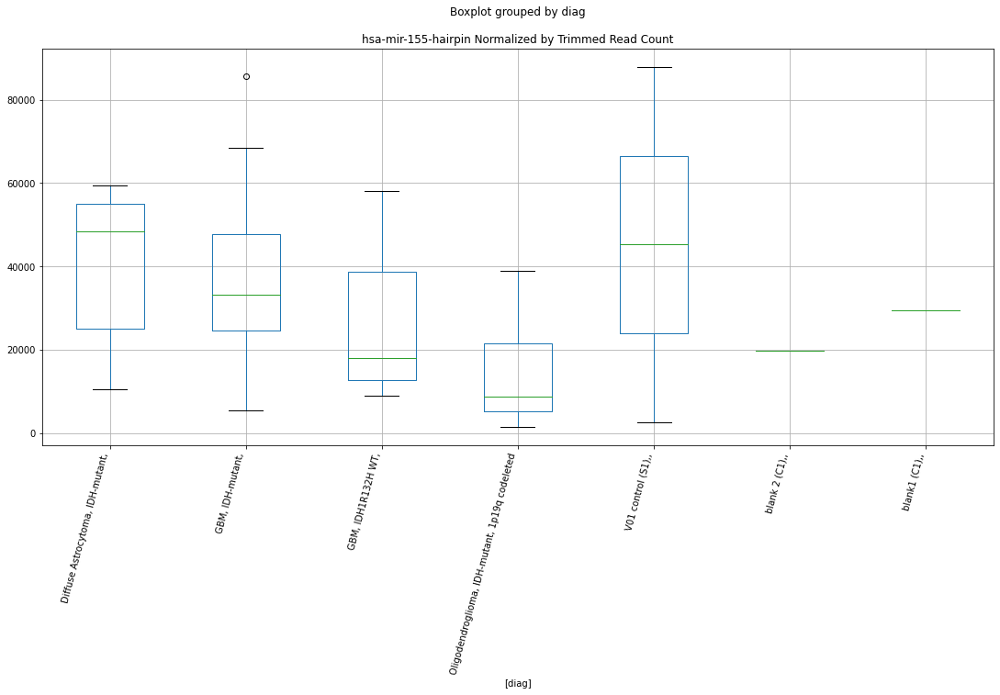

 p : 0.001550749328953491  ( t : 3.724755593330319 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6500-3p-mature
Control and blanks
82        0.000000
346    9679.988014
Name: hsa-mir-6500-3p-mature, dtype: float64
214    18443.398836
Name: hsa-mir-6500-3p-mature, dtype: float64
478    9023.498377
Name: hsa-mir-6500-3p-mature, dtype: float64


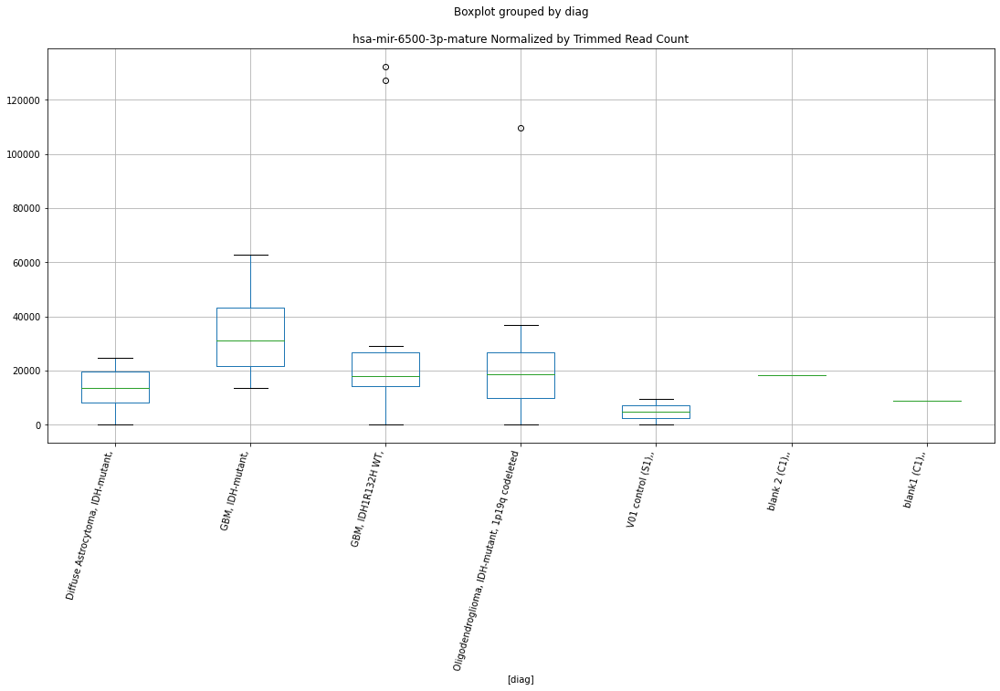

 p : 0.0015789334125351955  ( t : 3.7166698125498714 ) :  D-plex  :  cutadapt2  :  hsa-mir-3620-3p-mature
Control and blanks
76     0.0
340    0.0
Name: hsa-mir-3620-3p-mature, dtype: float64
208    1234.521525
Name: hsa-mir-3620-3p-mature, dtype: float64
472    3467.735037
Name: hsa-mir-3620-3p-mature, dtype: float64


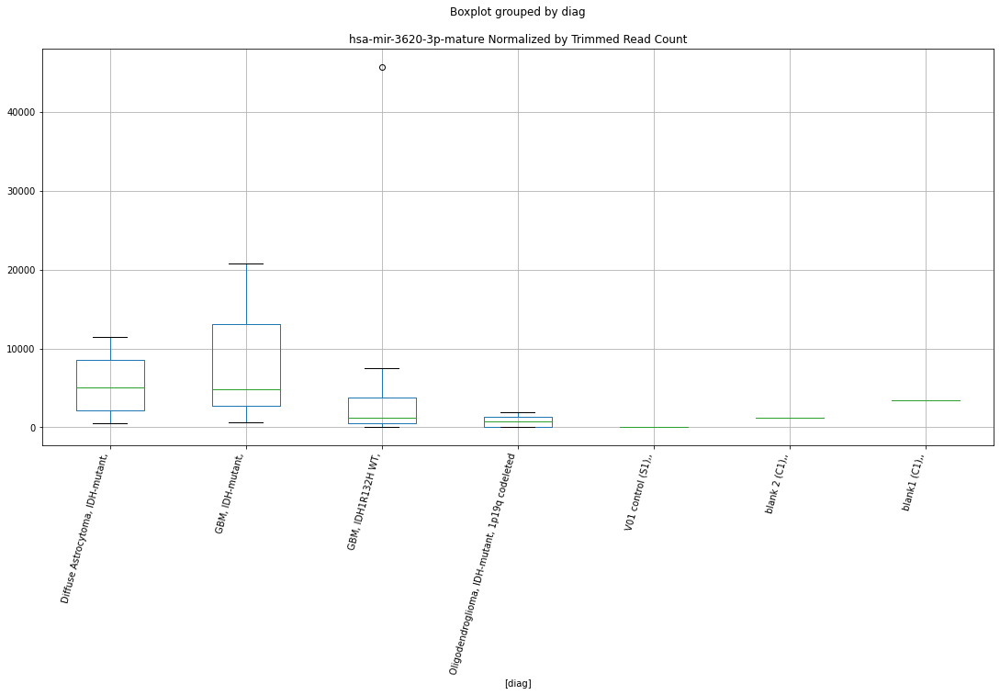

 p : 0.0015790594962966434  ( t : 3.716633964294697 ) :  D-plex  :  cutadapt2  :  hsa-mir-6771-hairpin
Control and blanks
76     29546.954277
340    44036.606750
Name: hsa-mir-6771-hairpin, dtype: float64
208    11992.494815
Name: hsa-mir-6771-hairpin, dtype: float64
472    20806.410224
Name: hsa-mir-6771-hairpin, dtype: float64


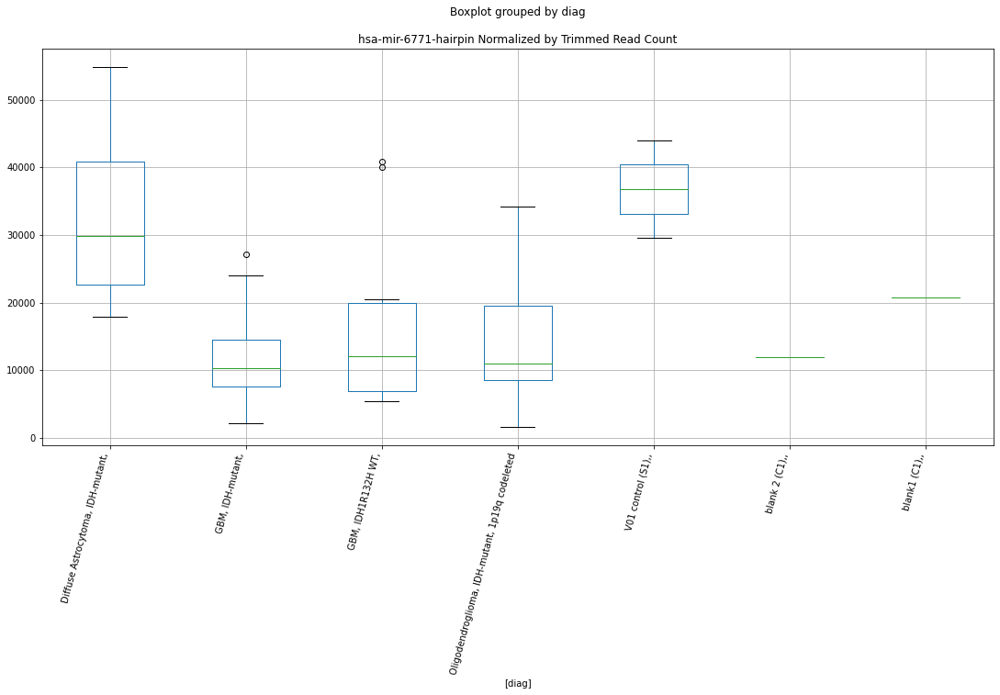

 p : 0.0016268400849200767  ( t : 3.7032502340848295 ) :  D-plex  :  cutadapt2  :  hsa-mir-320a-hairpin
Control and blanks
76     48487.309583
340    36990.749670
Name: hsa-mir-320a-hairpin, dtype: float64
208    24161.349847
Name: hsa-mir-320a-hairpin, dtype: float64
472    30631.659496
Name: hsa-mir-320a-hairpin, dtype: float64


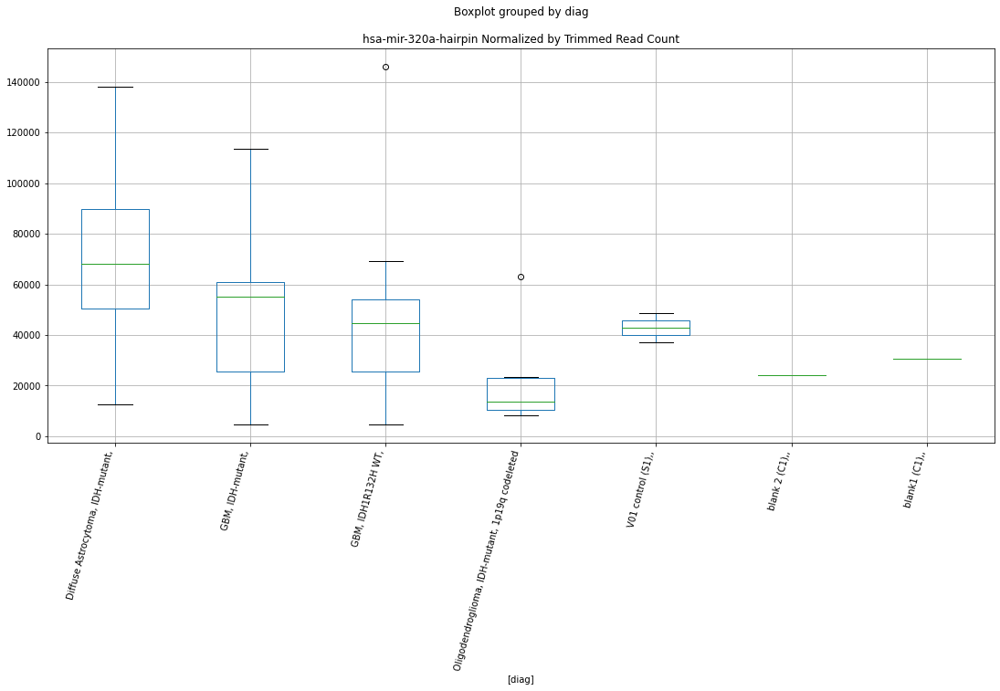

 p : 0.0017077385664893158  ( t : 3.681458339694662 ) :  D-plex  :  cutadapt2  :  hsa-mir-320e-hairpin
Control and blanks
76     78791.878073
340    16733.910565
Name: hsa-mir-320e-hairpin, dtype: float64
208    67016.882787
Name: hsa-mir-320e-hairpin, dtype: float64
472    24852.101101
Name: hsa-mir-320e-hairpin, dtype: float64


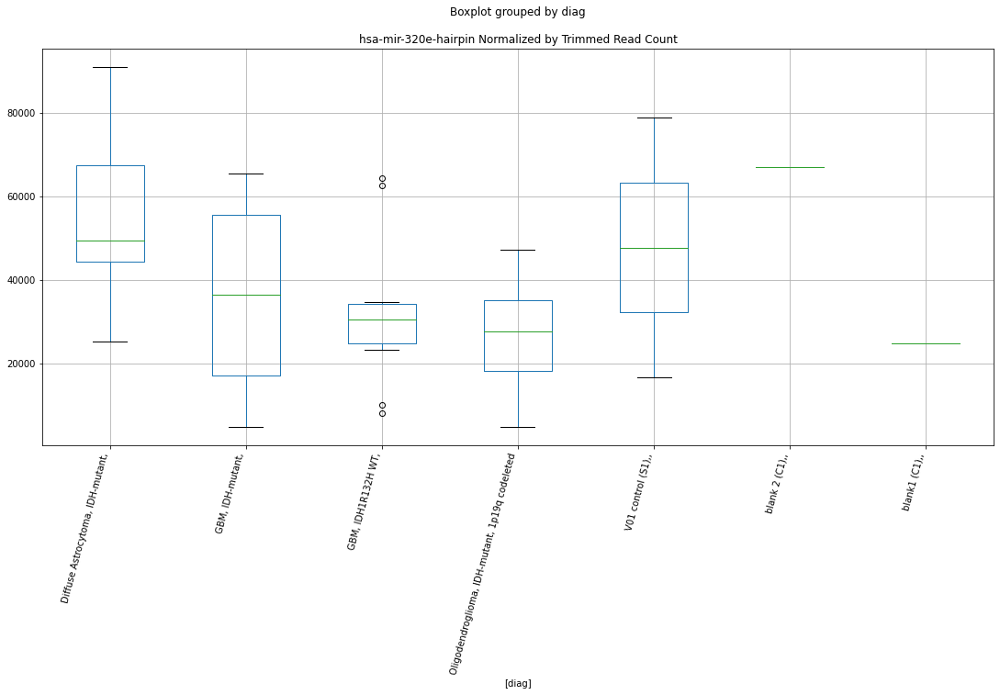

 p : 0.001739022462807183  ( t : 3.6733057655221018 ) :  D-plex  :  bbduk2  :  hsa-mir-764-hairpin
Control and blanks
73      3092.033607
337    35606.290563
Name: hsa-mir-764-hairpin, dtype: float64
205    15760.003797
Name: hsa-mir-764-hairpin, dtype: float64
469    18928.874164
Name: hsa-mir-764-hairpin, dtype: float64


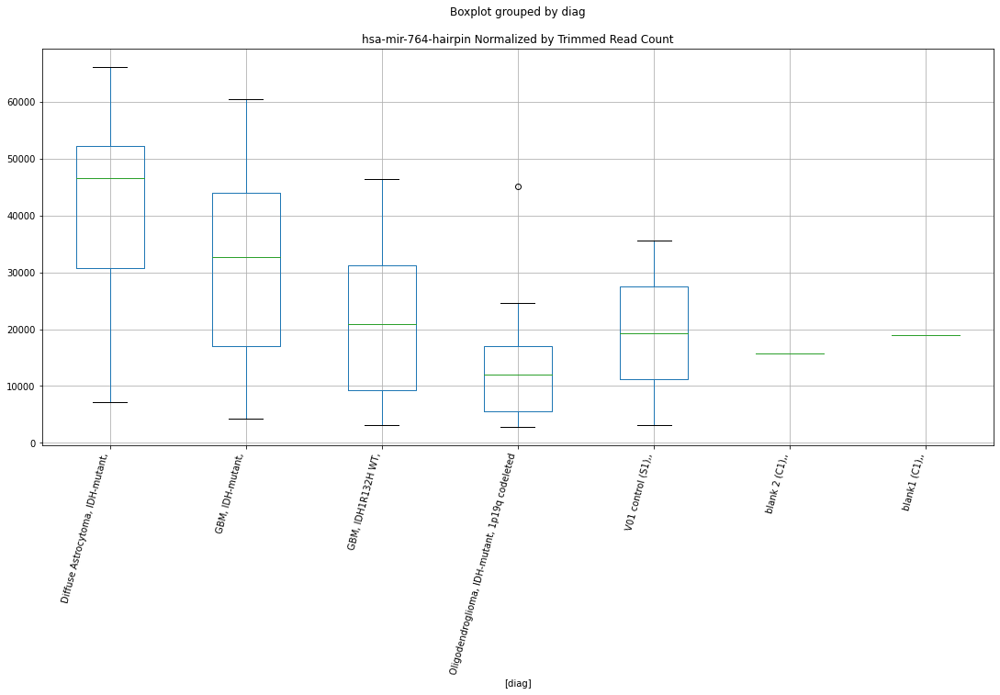

 p : 0.0017511348168206707  ( t : 3.670188428185476 ) :  Lexogen  :  bbduk2  :  hsa-mir-6500-3p-mature
Control and blanks
79      1430.598791
343    10191.087130
Name: hsa-mir-6500-3p-mature, dtype: float64
211    19678.05607
Name: hsa-mir-6500-3p-mature, dtype: float64
475    10059.660975
Name: hsa-mir-6500-3p-mature, dtype: float64


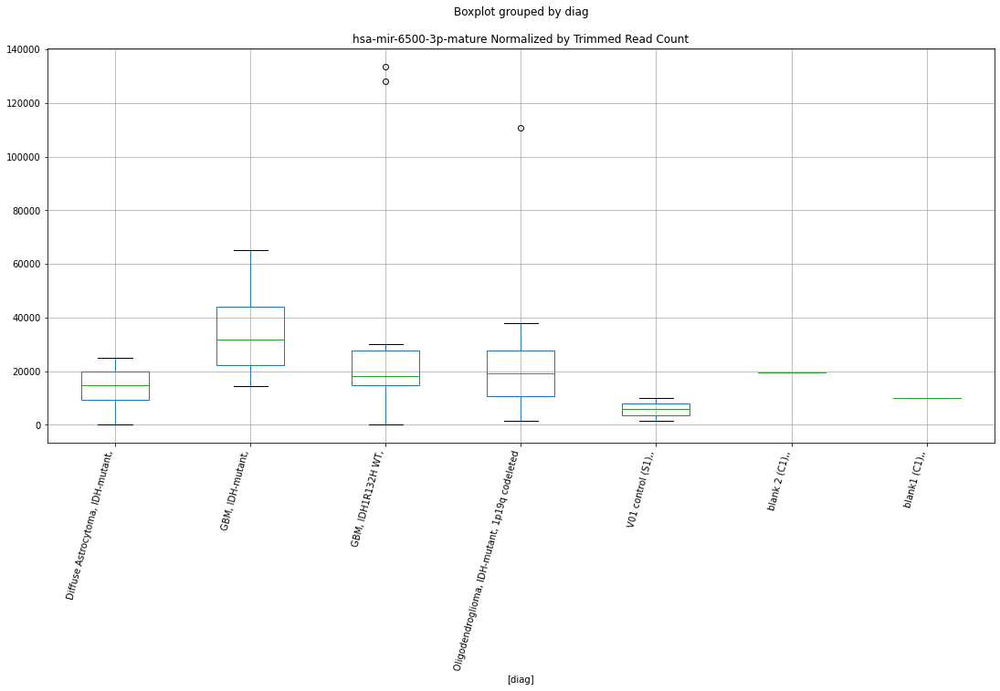

 p : 0.001763104674267819  ( t : 3.6671287757764968 ) :  D-plex  :  cutadapt2  :  hsa-mir-6739-5p-mature
Control and blanks
76     23486.040579
340    44917.338885
Name: hsa-mir-6739-5p-mature, dtype: float64
208    10405.252854
Name: hsa-mir-6739-5p-mature, dtype: float64
472    6935.470075
Name: hsa-mir-6739-5p-mature, dtype: float64


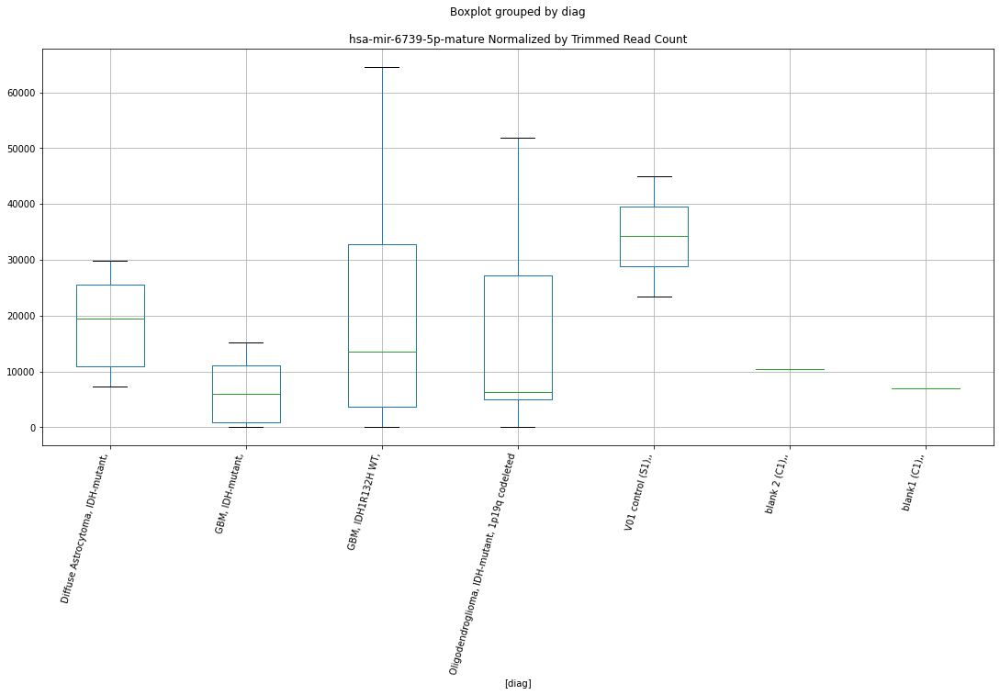

 p : 0.0017715909317917212  ( t : 3.664972074106922 ) :  Lexogen  :  cutadapt2  :  hsa-mir-99b-hairpin
Control and blanks
82         0.000000
346    32406.916394
Name: hsa-mir-99b-hairpin, dtype: float64
214    2169.811628
Name: hsa-mir-99b-hairpin, dtype: float64
478    5699.051607
Name: hsa-mir-99b-hairpin, dtype: float64


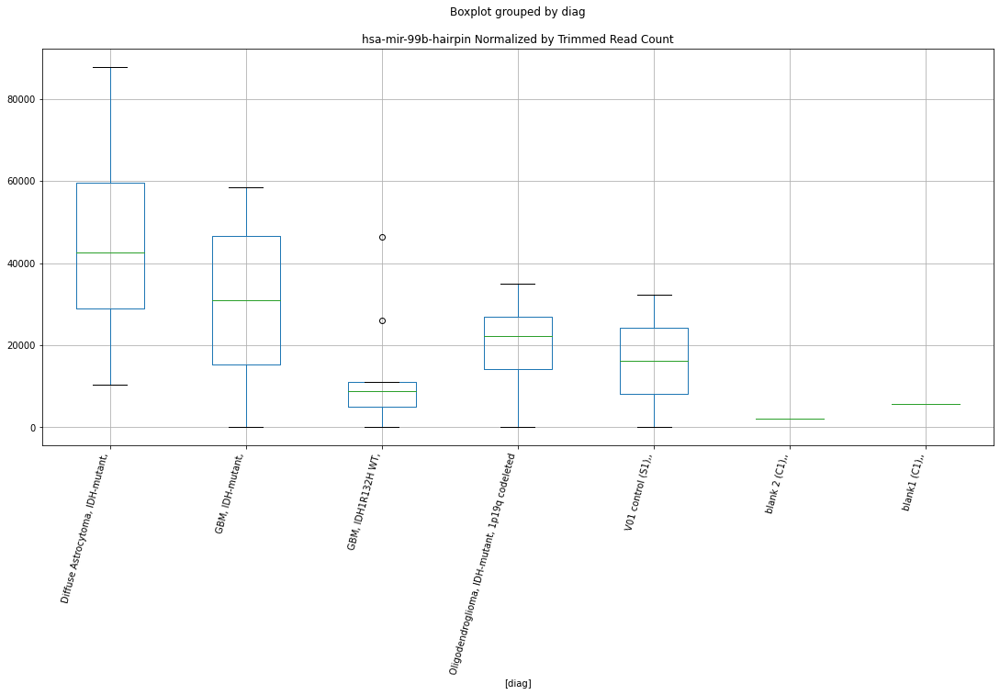

 p : 0.0017913412881190246  ( t : 3.6599922501499402 ) :  D-plex  :  bbduk2  :  hsa-mir-3124-5p-mature
Control and blanks
73      3092.033607
337    19583.459810
Name: hsa-mir-3124-5p-mature, dtype: float64
205    10387.27523
Name: hsa-mir-3124-5p-mature, dtype: float64
469    15971.237576
Name: hsa-mir-3124-5p-mature, dtype: float64


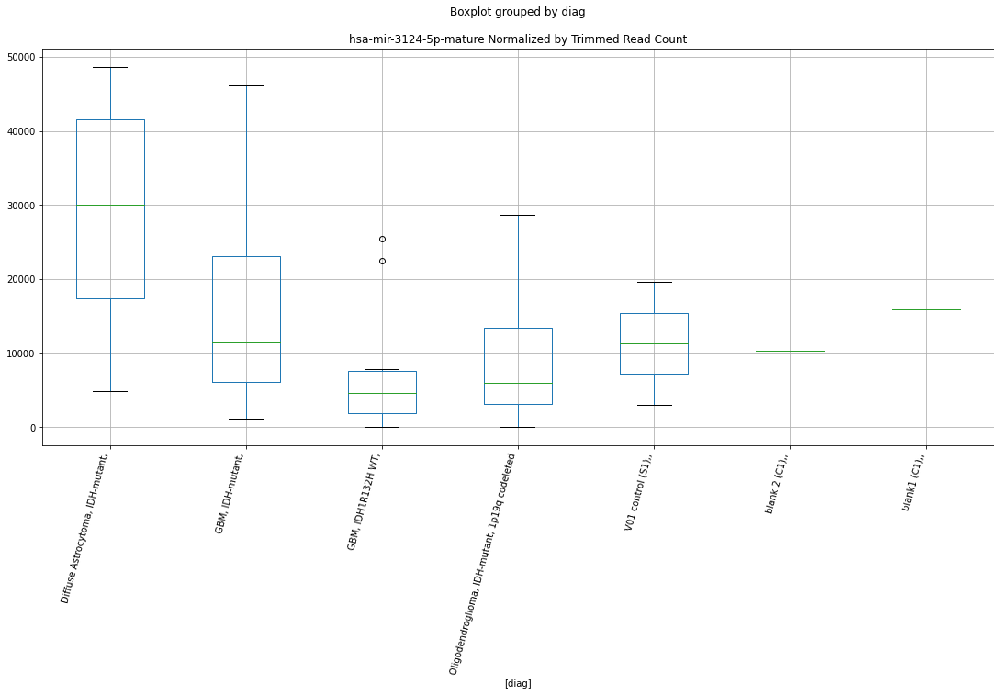

 p : 0.0018222934295661255  ( t : 3.652296862541445 ) :  Lexogen  :  cutadapt2  :  hsa-mir-584-5p-mature
Control and blanks
82      1420.051122
346    32196.481871
Name: hsa-mir-584-5p-mature, dtype: float64
214    5966.981976
Name: hsa-mir-584-5p-mature, dtype: float64
478    1187.302418
Name: hsa-mir-584-5p-mature, dtype: float64


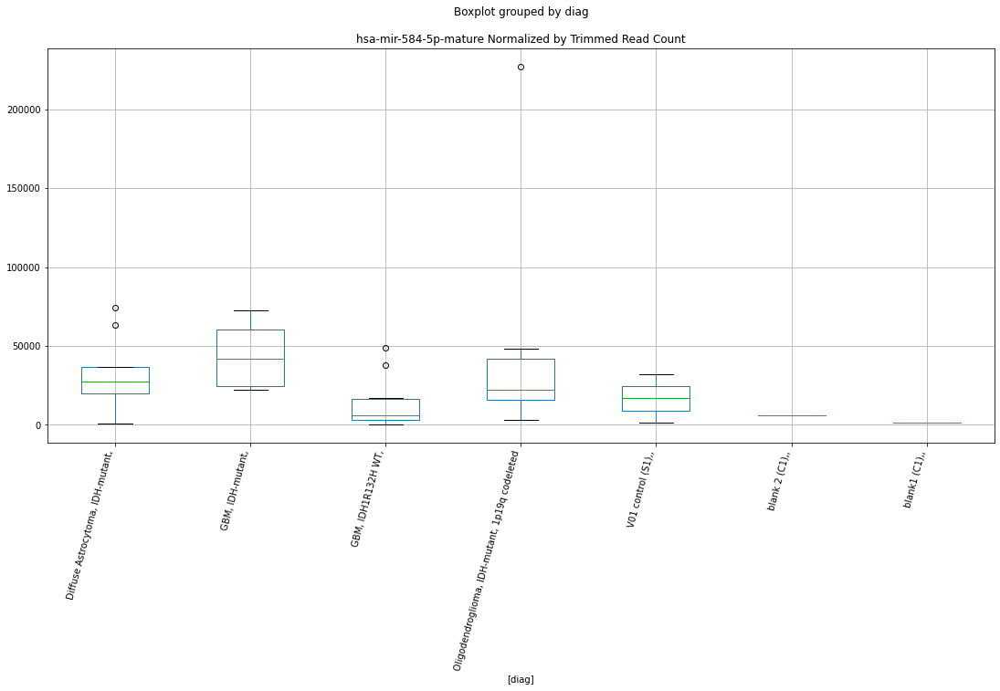

 p : 0.0018431915576905171  ( t : 3.647174306238617 ) :  D-plex  :  cutadapt2  :  hsa-mir-3059-hairpin
Control and blanks
76     179554.568300
340     85431.017096
Name: hsa-mir-3059-hairpin, dtype: float64
208    159429.636947
Name: hsa-mir-3059-hairpin, dtype: float64
472    107499.786156
Name: hsa-mir-3059-hairpin, dtype: float64


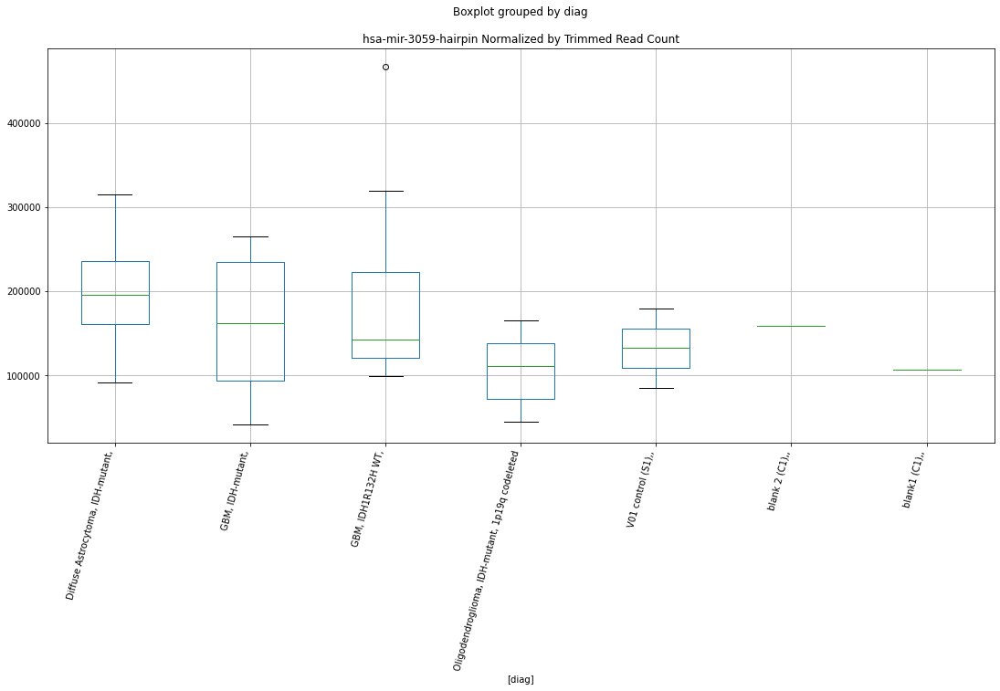

 p : 0.0018582831804815534  ( t : 3.6435108356284642 ) :  Lexogen  :  bbduk2  :  hsa-mir-11401-hairpin
Control and blanks
79         0.000000
343    12314.230282
Name: hsa-mir-11401-hairpin, dtype: float64
211    0.0
Name: hsa-mir-11401-hairpin, dtype: float64
475    0.0
Name: hsa-mir-11401-hairpin, dtype: float64


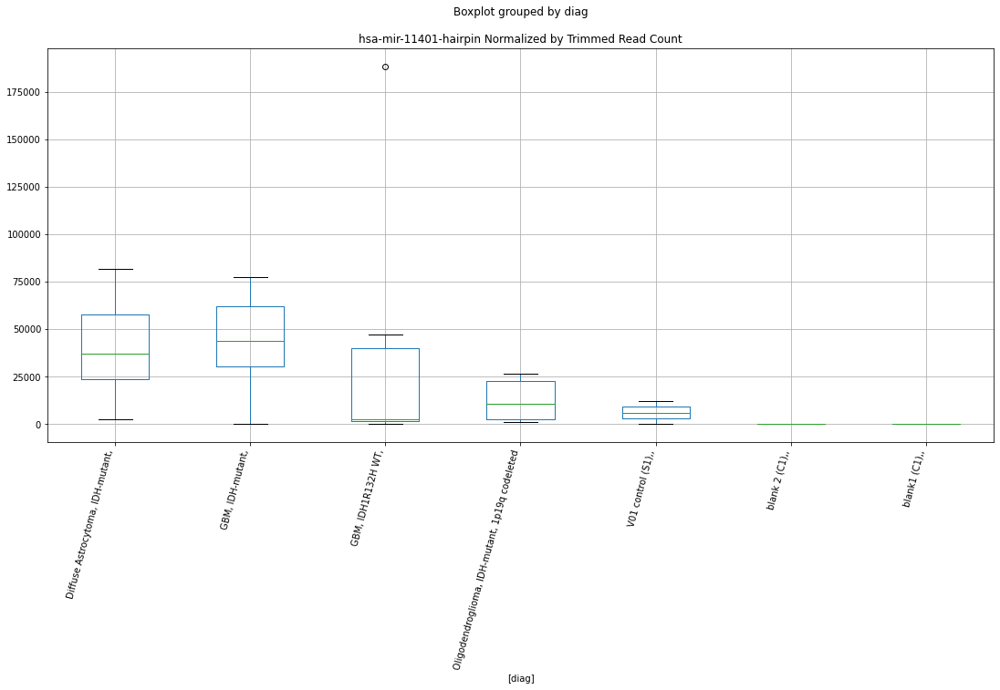

 p : 0.0018752177020990924  ( t : 3.6394350664376467 ) :  Lexogen  :  bbduk2  :  hsa-mir-584-5p-mature
Control and blanks
79      1430.598791
343    32271.775912
Name: hsa-mir-584-5p-mature, dtype: float64
211    6286.045689
Name: hsa-mir-584-5p-mature, dtype: float64
475    1197.578688
Name: hsa-mir-584-5p-mature, dtype: float64


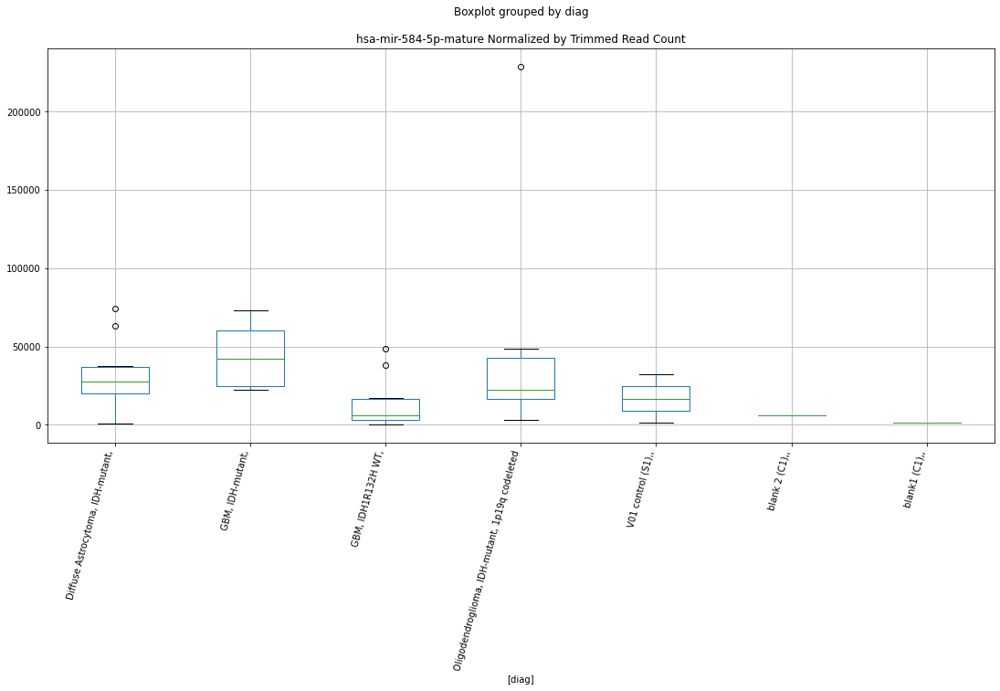

 p : 0.001922305395350689  ( t : 3.6282915726331995 ) :  Lexogen  :  bbduk2  :  hsa-mir-99b-hairpin
Control and blanks
79         0.000000
343    32908.718857
Name: hsa-mir-99b-hairpin, dtype: float64
211    2186.450674
Name: hsa-mir-99b-hairpin, dtype: float64
475    5748.3777
Name: hsa-mir-99b-hairpin, dtype: float64


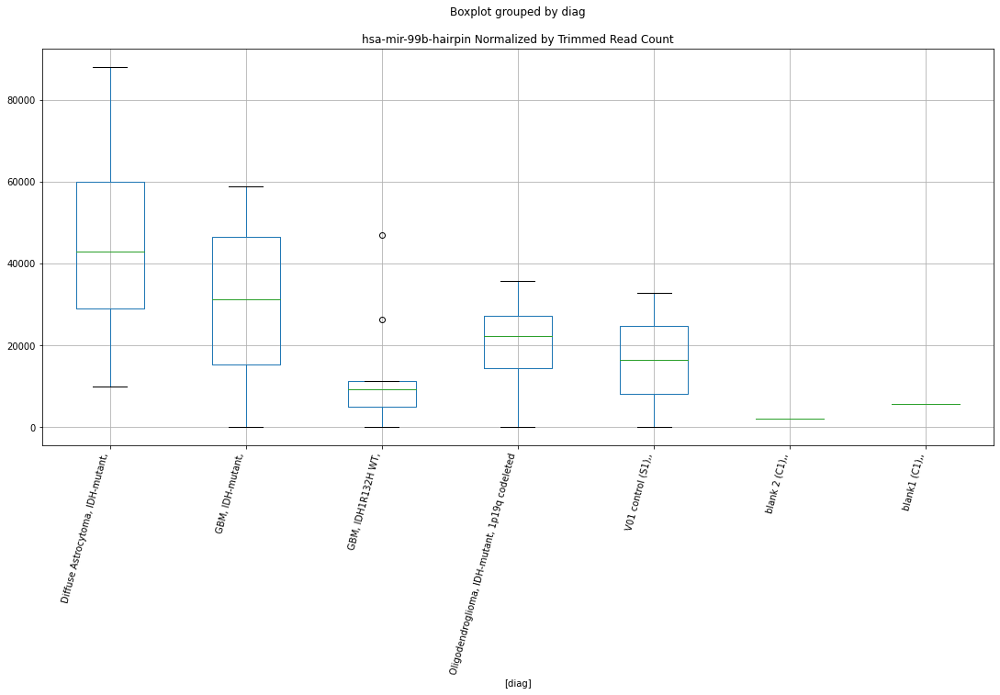

 p : 0.0019476956159317088  ( t : 3.6223949588625413 ) :  Lexogen  :  cutadapt2  :  hsa-mir-11401-hairpin
Control and blanks
82         0.00000
346    10311.29158
Name: hsa-mir-11401-hairpin, dtype: float64
214    0.0
Name: hsa-mir-11401-hairpin, dtype: float64
478    0.0
Name: hsa-mir-11401-hairpin, dtype: float64


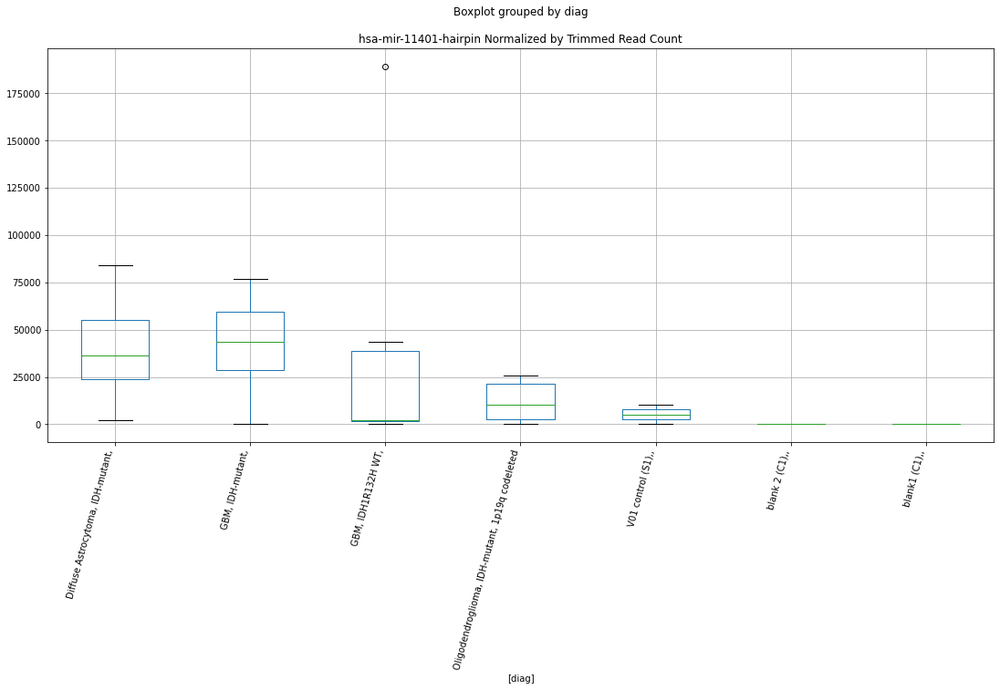

 p : 0.001973032618072082  ( t : 3.6165863724002483 ) :  Lexogen  :  bbduk2  :  hsa-mir-3924-hairpin
Control and blanks
79         0.000000
343    28025.489607
Name: hsa-mir-3924-hairpin, dtype: float64
211    6559.352023
Name: hsa-mir-3924-hairpin, dtype: float64
475    1437.094425
Name: hsa-mir-3924-hairpin, dtype: float64


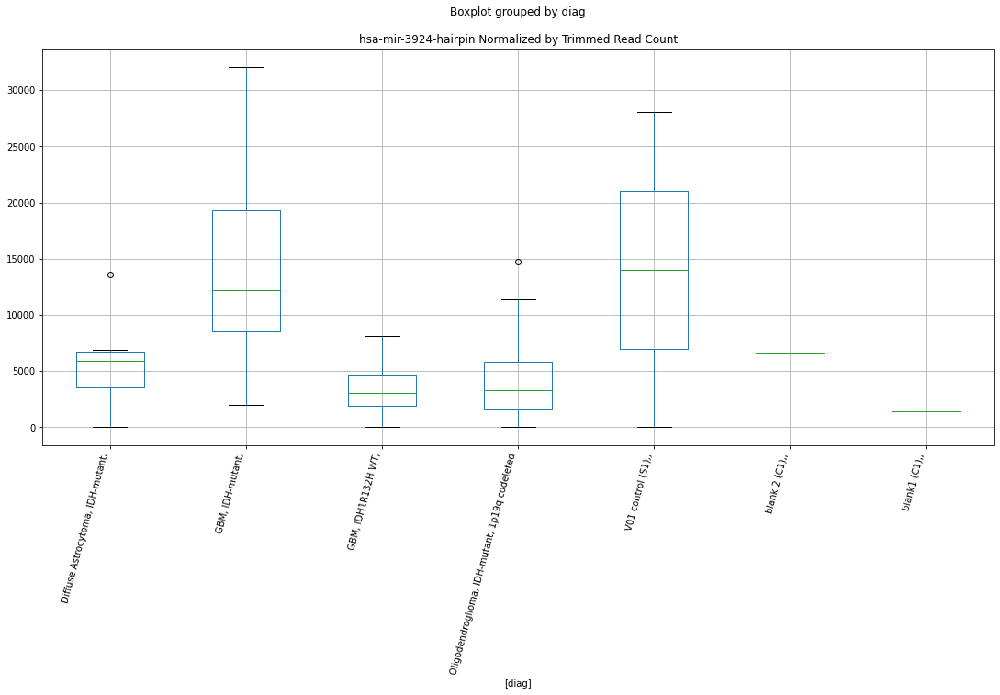

 p : 0.0020899545453487113  ( t : 3.5907074370092085 ) :  D-plex  :  cutadapt2  :  hsa-mir-657-mature
Control and blanks
76     757.614212
340      0.000000
Name: hsa-mir-657-mature, dtype: float64
208    6525.328061
Name: hsa-mir-657-mature, dtype: float64
472    11559.116791
Name: hsa-mir-657-mature, dtype: float64


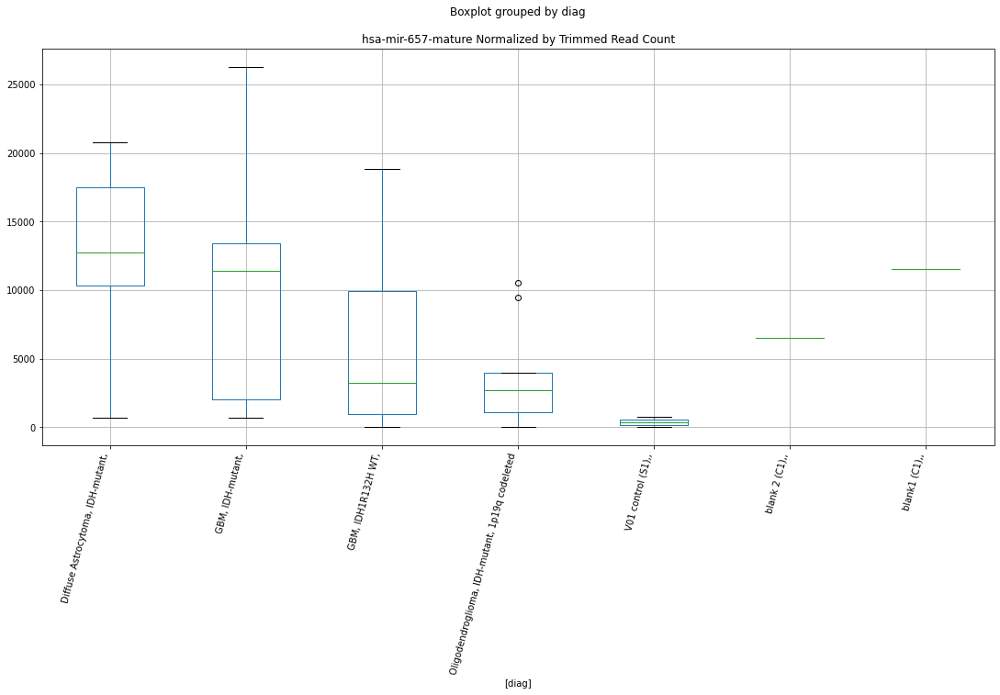

 p : 0.0021127714852487746  ( t : 3.5858253104031372 ) :  D-plex  :  bbduk2  :  hsa-mir-1252-hairpin
Control and blanks
73      40969.445297
337    150436.577630
Name: hsa-mir-1252-hairpin, dtype: float64
205    37430.009017
Name: hsa-mir-1252-hairpin, dtype: float64
469    59744.25908
Name: hsa-mir-1252-hairpin, dtype: float64


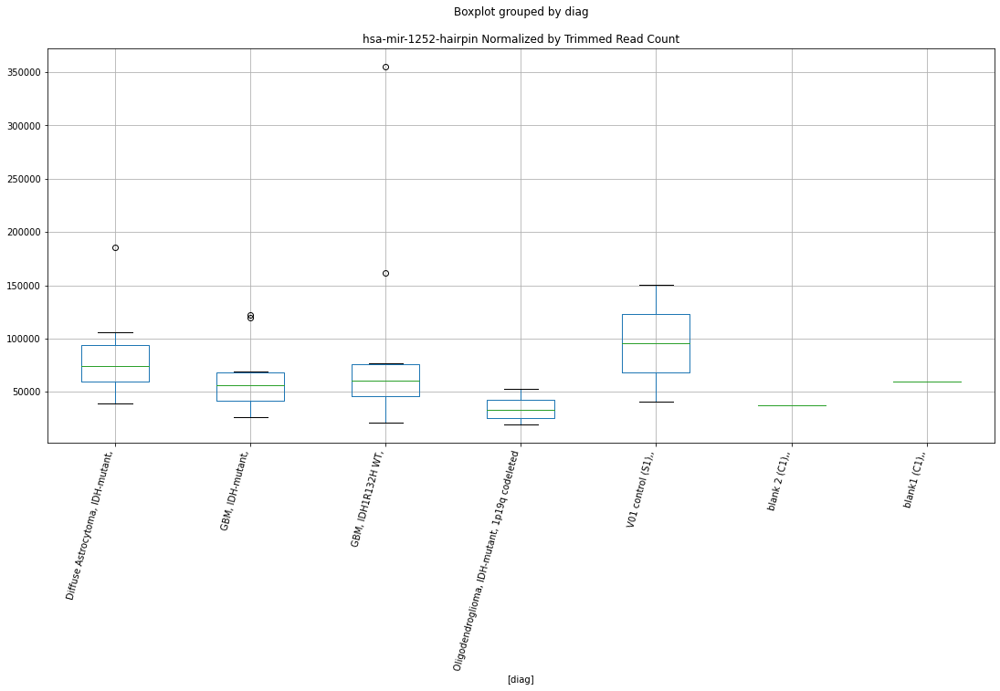

 p : 0.002124200813537667  ( t : 3.5833994260056663 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3166-hairpin
Control and blanks
82     1420.051122
346       0.000000
Name: hsa-mir-3166-hairpin, dtype: float64
214    1898.585174
Name: hsa-mir-3166-hairpin, dtype: float64
478    474.920967
Name: hsa-mir-3166-hairpin, dtype: float64


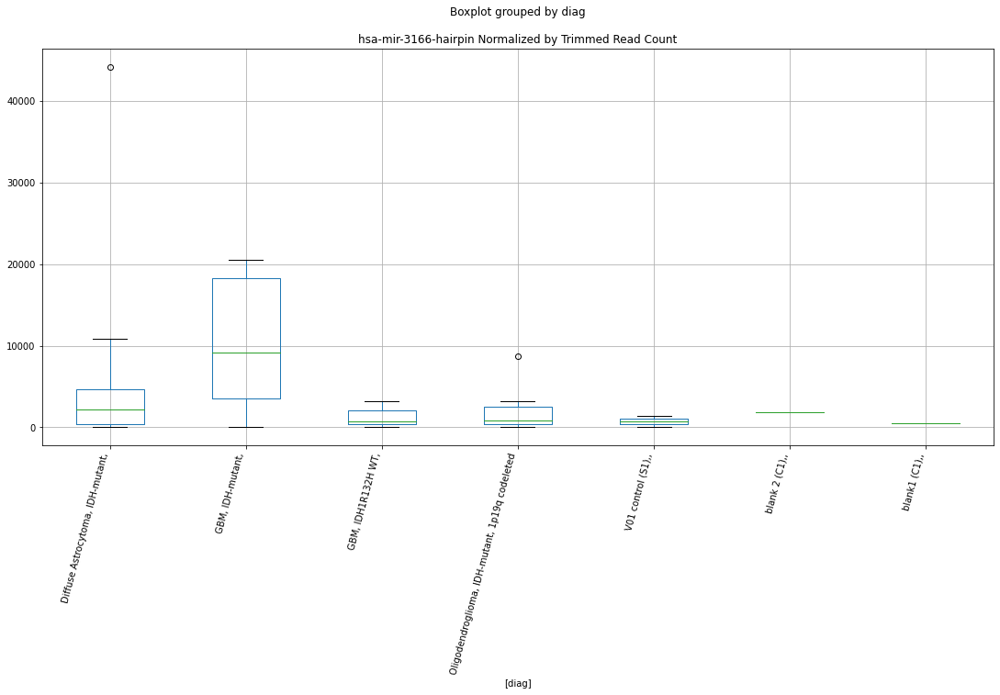

 p : 0.002146552961313594  ( t : 3.578692385092893 ) :  Lexogen  :  bbduk2  :  hsa-mir-9902-2-hairpin
Control and blanks
79       0.000000
343    636.942946
Name: hsa-mir-9902-2-hairpin, dtype: float64
211    0.0
Name: hsa-mir-9902-2-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-9902-2-hairpin, dtype: float64


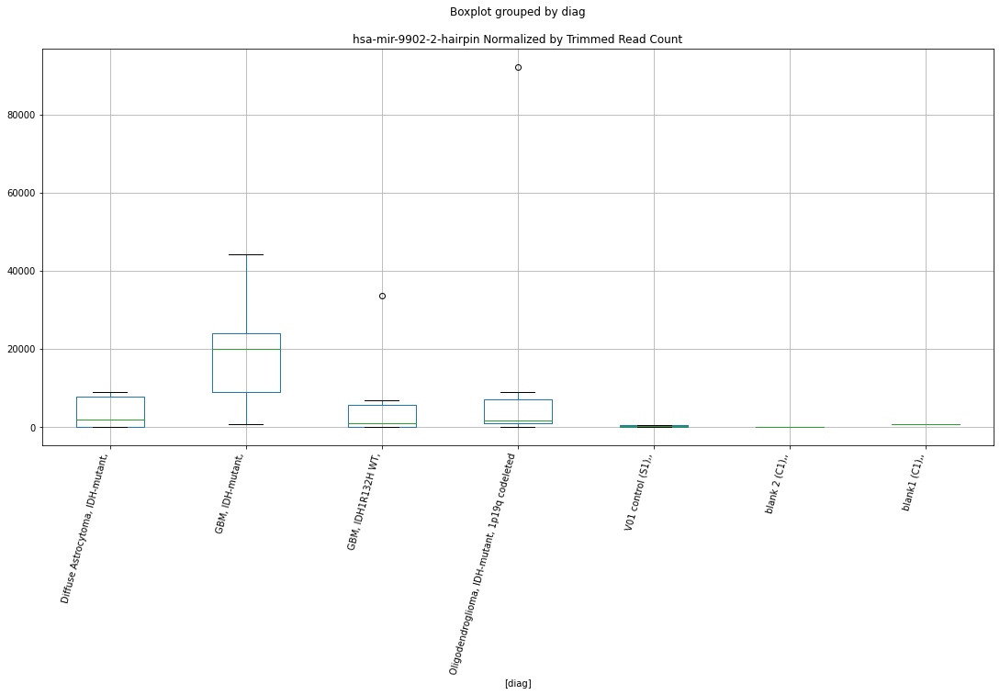

 p : 0.002146552961313594  ( t : 3.578692385092893 ) :  Lexogen  :  bbduk2  :  hsa-mir-9902-1-hairpin
Control and blanks
79       0.000000
343    636.942946
Name: hsa-mir-9902-1-hairpin, dtype: float64
211    0.0
Name: hsa-mir-9902-1-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-9902-1-hairpin, dtype: float64


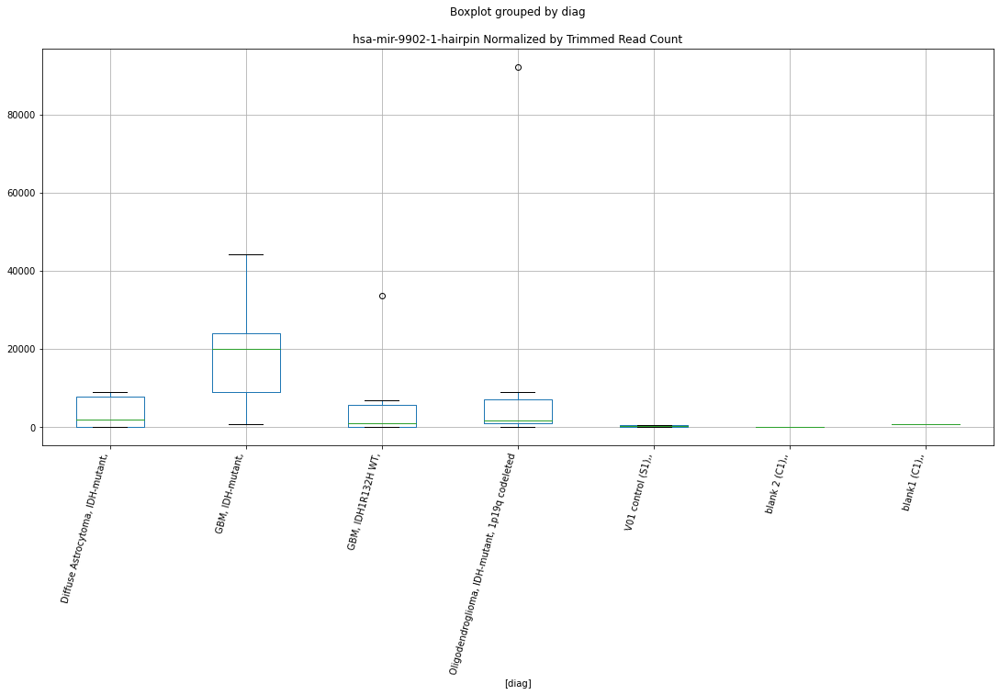

 p : 0.0021512648706462113  ( t : 3.5777063353904164 ) :  D-plex  :  bbduk2  :  hsa-mir-657-mature
Control and blanks
73     773.008402
337      0.000000
Name: hsa-mir-657-mature, dtype: float64
205    6626.365233
Name: hsa-mir-657-mature, dtype: float64
469    11830.546352
Name: hsa-mir-657-mature, dtype: float64


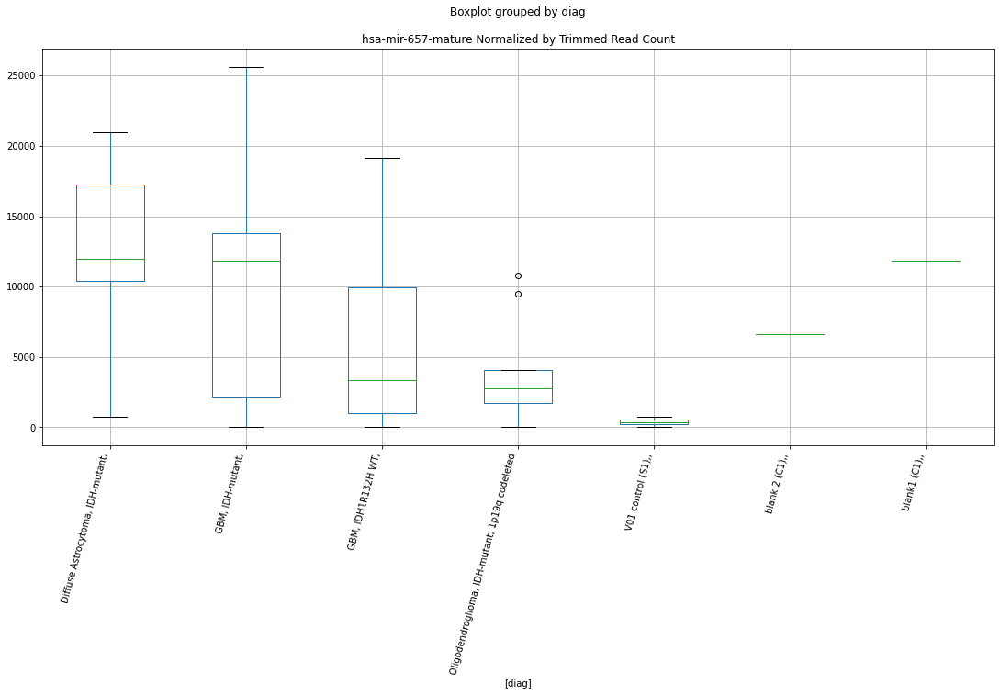

 p : 0.00223966619353589  ( t : 3.5595937148758963 ) :  D-plex  :  bbduk2  :  hsa-mir-320a-hairpin
Control and blanks
73     51018.554521
337    37386.605092
Name: hsa-mir-320a-hairpin, dtype: float64
205    24893.642361
Name: hsa-mir-320a-hairpin, dtype: float64
469    32534.002469
Name: hsa-mir-320a-hairpin, dtype: float64


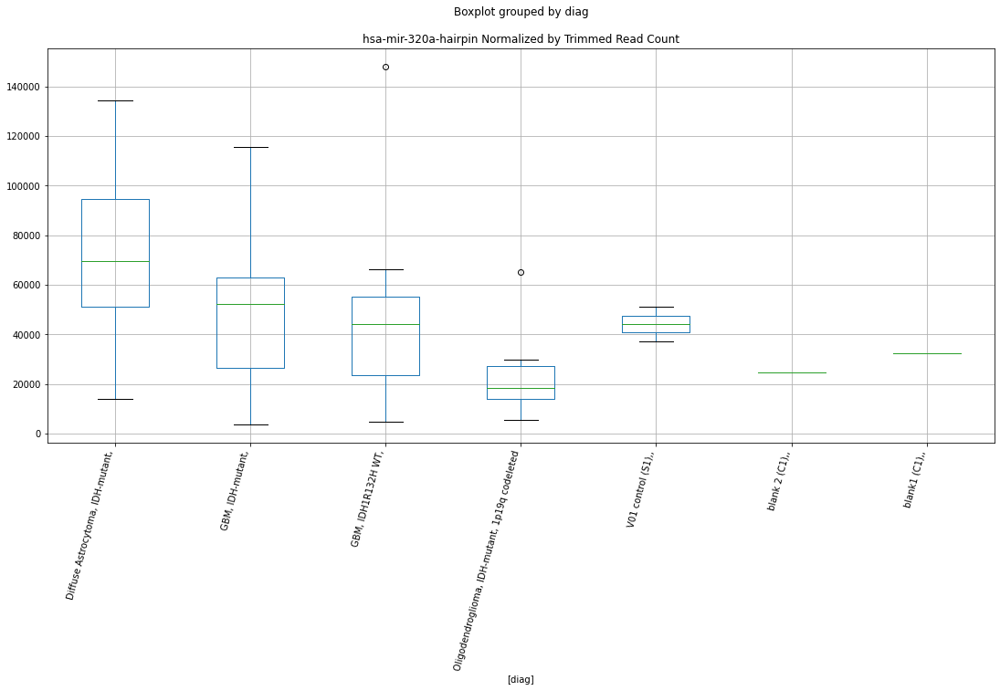

 p : 0.002243992903747875  ( t : 3.5587255184835693 ) :  Lexogen  :  bbduk2  :  hsa-mir-1263-hairpin
Control and blanks
79        0.000000
343    1698.514522
Name: hsa-mir-1263-hairpin, dtype: float64
211    273.306334
Name: hsa-mir-1263-hairpin, dtype: float64
475    1916.1259
Name: hsa-mir-1263-hairpin, dtype: float64


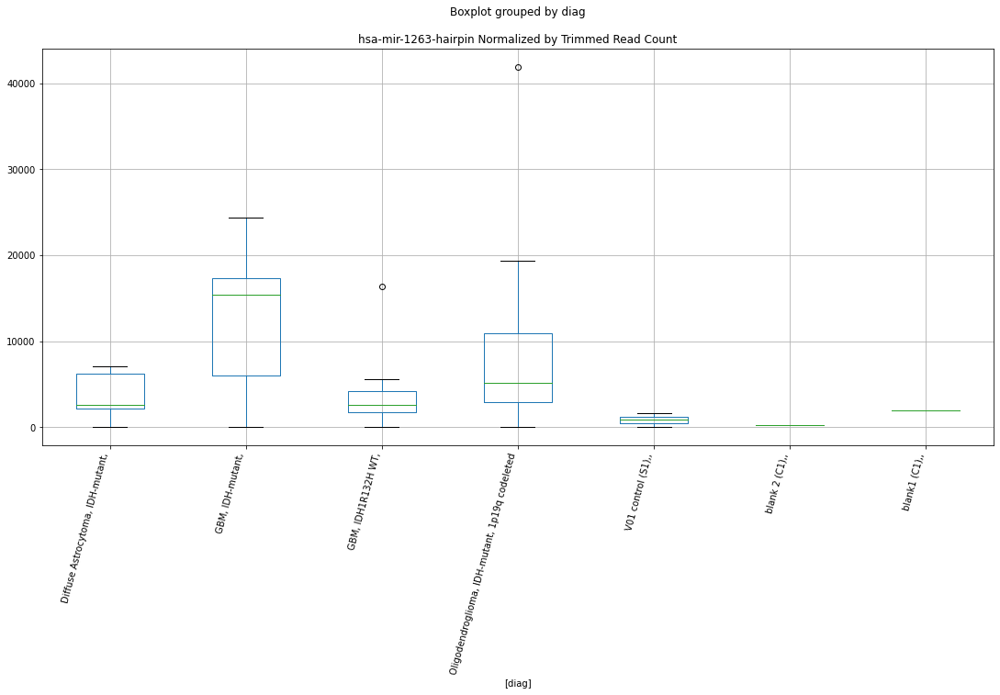

 p : 0.002302408946530855  ( t : 3.547163598688415 ) :  D-plex  :  bbduk2  :  hsa-mir-4649-5p-mature
Control and blanks
73        0.000000
337    1780.314528
Name: hsa-mir-4649-5p-mature, dtype: float64
205    5193.637615
Name: hsa-mir-4649-5p-mature, dtype: float64
469    7098.327811
Name: hsa-mir-4649-5p-mature, dtype: float64


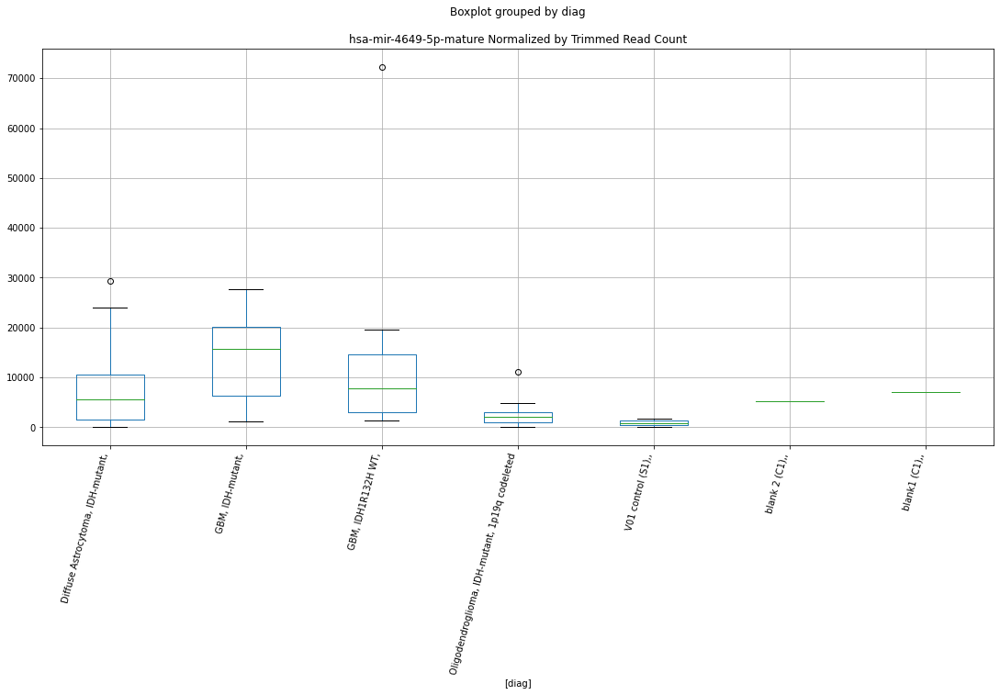

 p : 0.0023173849165083766  ( t : 3.5442463467595413 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4284-hairpin
Control and blanks
82         0.000000
346    15572.154631
Name: hsa-mir-4284-hairpin, dtype: float64
214    5966.981976
Name: hsa-mir-4284-hairpin, dtype: float64
478    474.920967
Name: hsa-mir-4284-hairpin, dtype: float64


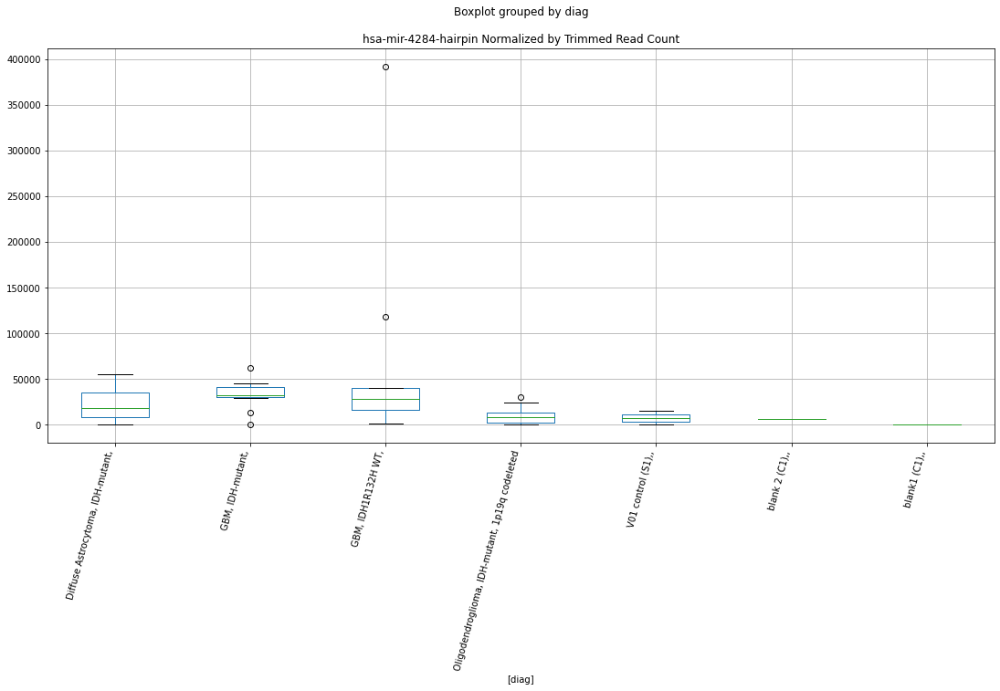

 p : 0.0023278847583940673  ( t : 3.542212149969545 ) :  D-plex  :  cutadapt2  :  hsa-mir-764-hairpin
Control and blanks
76      3788.071061
340    63412.713721
Name: hsa-mir-764-hairpin, dtype: float64
208    15696.05939
Name: hsa-mir-764-hairpin, dtype: float64
472    18494.586866
Name: hsa-mir-764-hairpin, dtype: float64


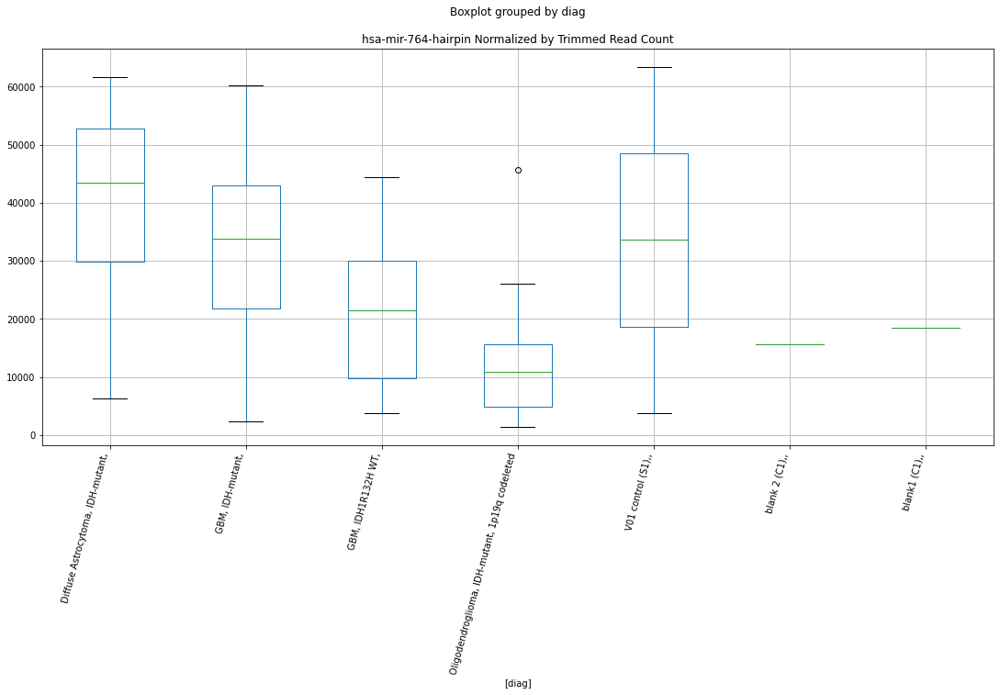

 p : 0.002328924219441104  ( t : 3.542011264075856 ) :  Lexogen  :  bbduk2  :  hsa-mir-4284-hairpin
Control and blanks
79      1430.598791
343    15923.573641
Name: hsa-mir-4284-hairpin, dtype: float64
211    6286.045689
Name: hsa-mir-4284-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-4284-hairpin, dtype: float64


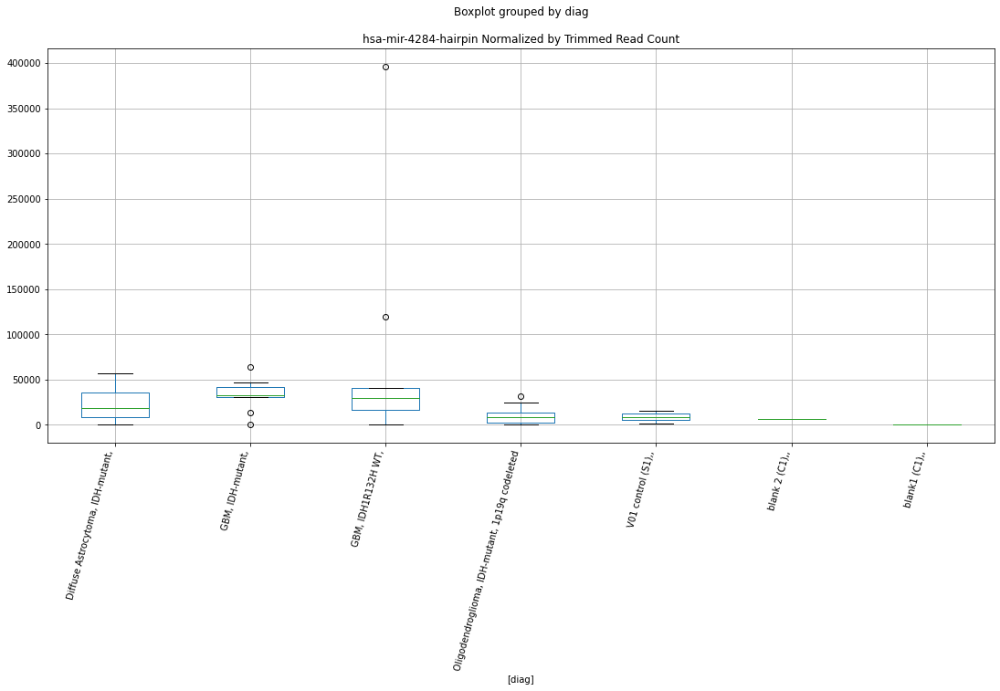

 p : 0.0023925178171685466  ( t : 3.5298872487896427 ) :  D-plex  :  bbduk2  :  hsa-mir-6760-5p-mature
Control and blanks
73     14687.159635
337    16912.988018
Name: hsa-mir-6760-5p-mature, dtype: float64
205    9850.002373
Name: hsa-mir-6760-5p-mature, dtype: float64
469    10647.491717
Name: hsa-mir-6760-5p-mature, dtype: float64


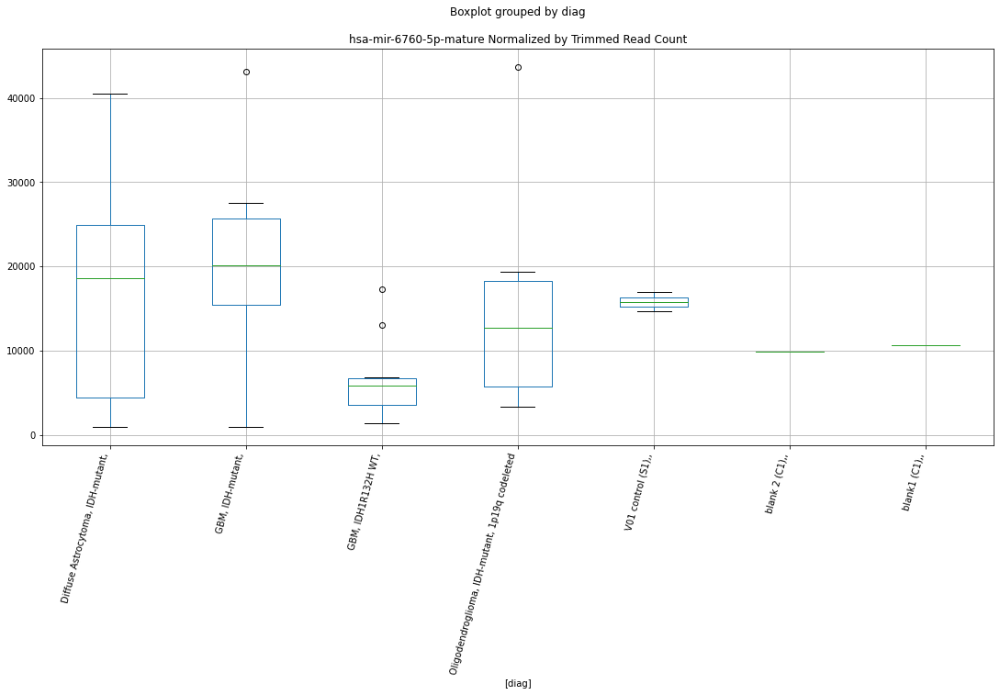

 p : 0.002455438964907454  ( t : 3.5182017632349663 ) :  D-plex  :  cutadapt2  :  hsa-mir-6760-5p-mature
Control and blanks
76     13637.055820
340    16733.910565
Name: hsa-mir-6760-5p-mature, dtype: float64
208    9523.451765
Name: hsa-mir-6760-5p-mature, dtype: float64
472    10981.160951
Name: hsa-mir-6760-5p-mature, dtype: float64


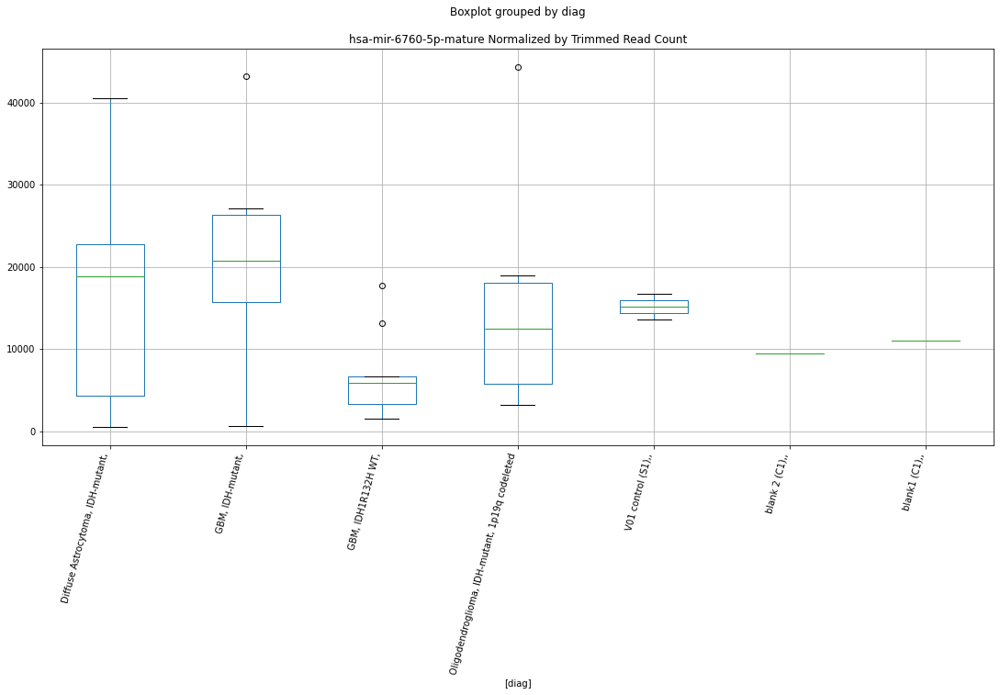

 p : 0.0024698397436578273  ( t : 3.51556904291535 ) :  D-plex  :  bbduk2  :  hsa-mir-3059-hairpin
Control and blanks
73     184749.008037
337     83674.782824
Name: hsa-mir-3059-hairpin, dtype: float64
205    176225.497
Name: hsa-mir-3059-hairpin, dtype: float64
469    105291.862536
Name: hsa-mir-3059-hairpin, dtype: float64


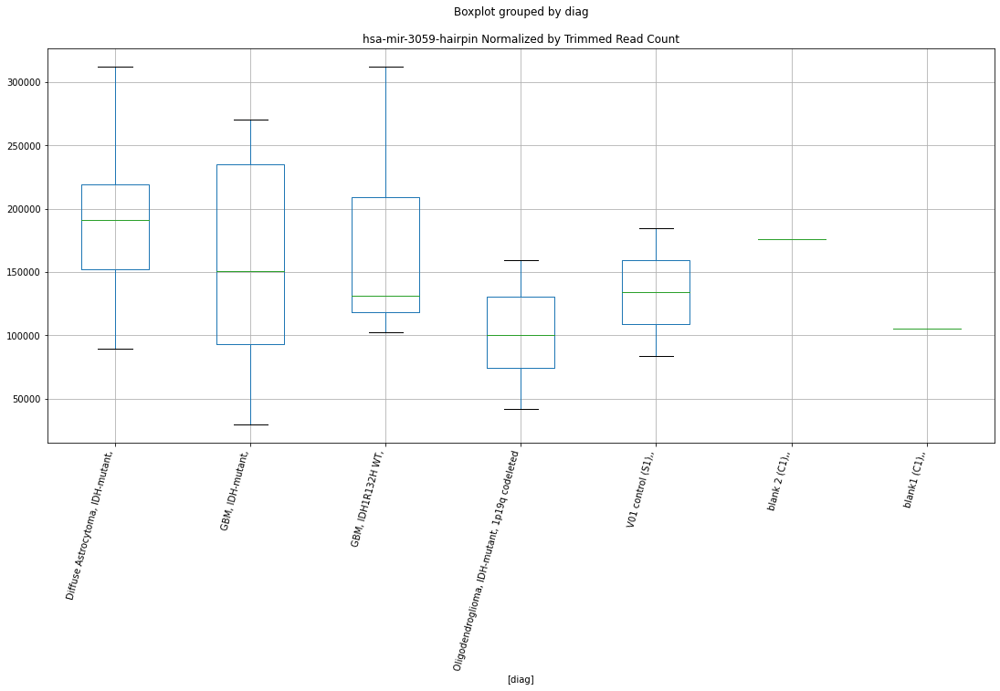

 p : 0.0024743781865968107  ( t : 3.5147424847792648 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1263-hairpin
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-1263-hairpin, dtype: float64
214    0.0
Name: hsa-mir-1263-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-1263-hairpin, dtype: float64


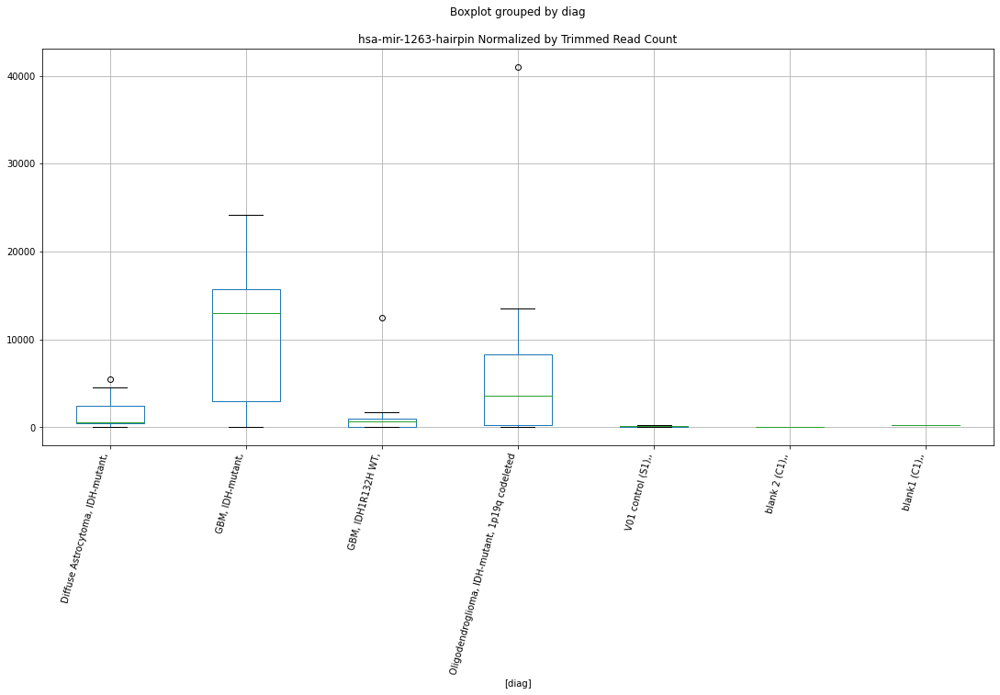

 p : 0.0024744346514234635  ( t : 3.514732210655606 ) :  Lexogen  :  bbduk2  :  hsa-mir-3665-hairpin
Control and blanks
79     15736.586706
343    26963.918031
Name: hsa-mir-3665-hairpin, dtype: float64
211    9019.109032
Name: hsa-mir-3665-hairpin, dtype: float64
475    12454.81835
Name: hsa-mir-3665-hairpin, dtype: float64


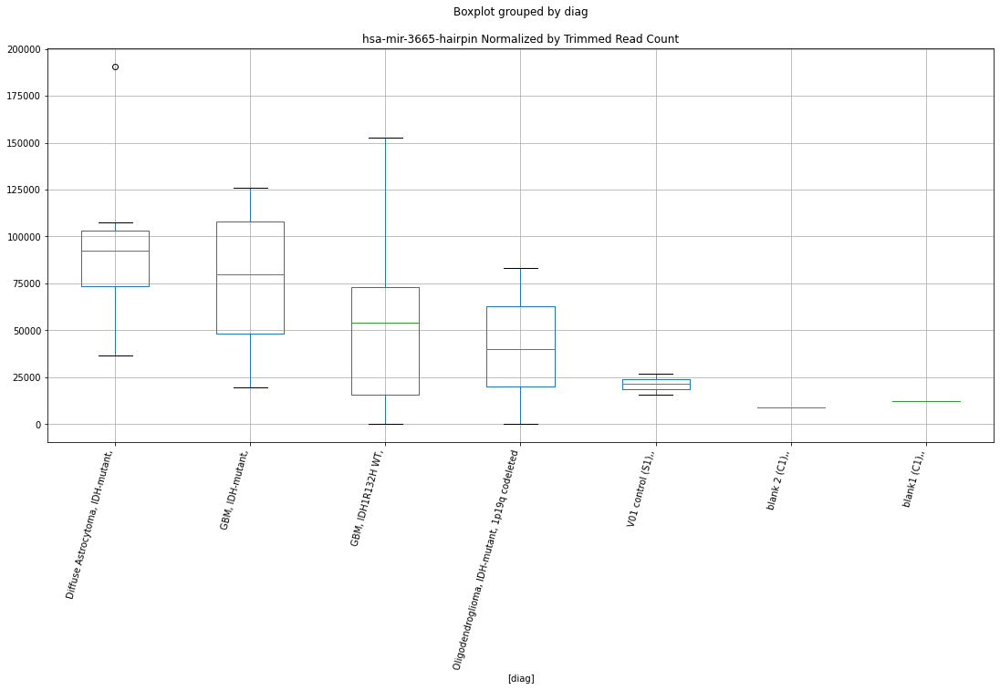

 p : 0.00249853096413562  ( t : 3.510368797082545 ) :  Lexogen  :  bbduk2  :  hsa-mir-6824-hairpin
Control and blanks
79         0.000000
343    16772.830901
Name: hsa-mir-6824-hairpin, dtype: float64
211    3279.676012
Name: hsa-mir-6824-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-6824-hairpin, dtype: float64


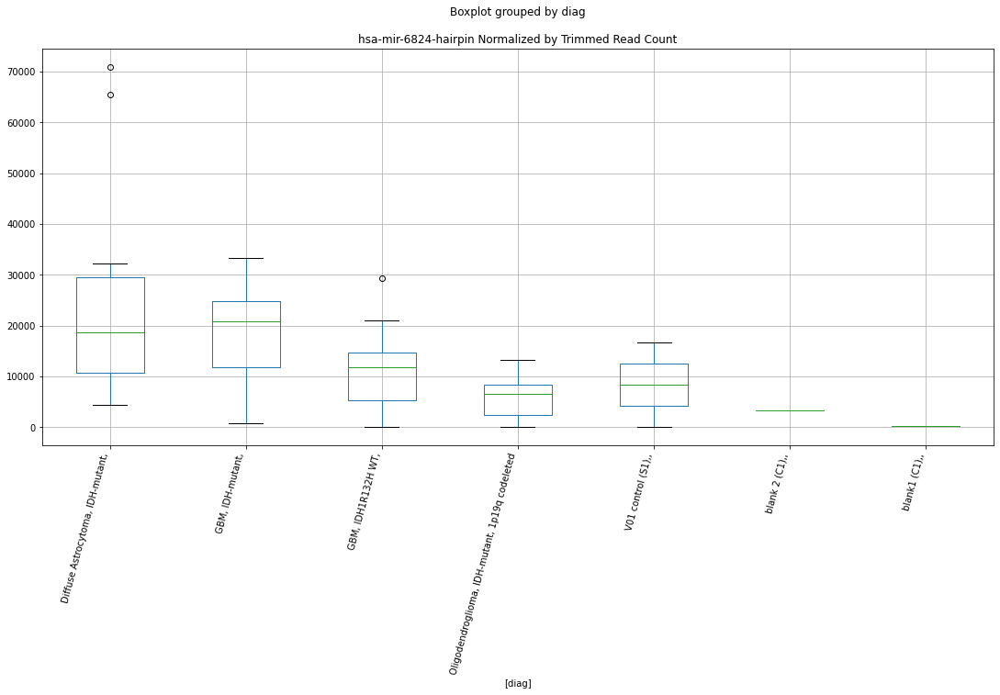

 p : 0.0025094545401447843  ( t : 3.508404444315338 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3665-hairpin
Control and blanks
82     15620.562340
346    26514.749777
Name: hsa-mir-3665-hairpin, dtype: float64
214    8950.472965
Name: hsa-mir-3665-hairpin, dtype: float64
478    12347.945148
Name: hsa-mir-3665-hairpin, dtype: float64


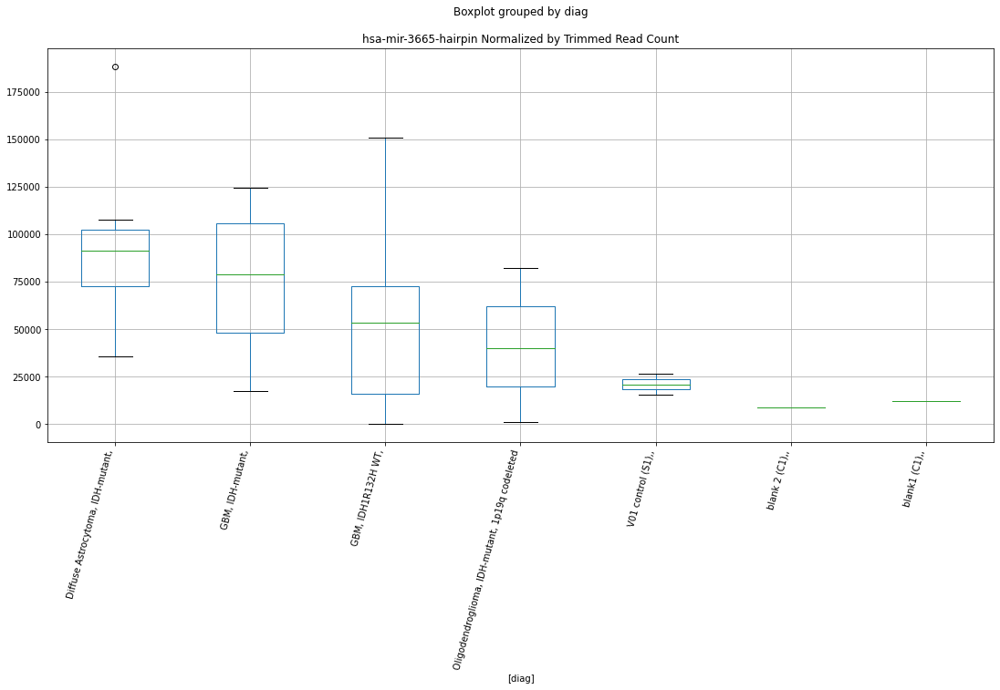

 p : 0.0025601570478887246  ( t : 3.4993962508647467 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6824-hairpin
Control and blanks
82         0.000000
346    16413.892719
Name: hsa-mir-6824-hairpin, dtype: float64
214    3254.717442
Name: hsa-mir-6824-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-6824-hairpin, dtype: float64


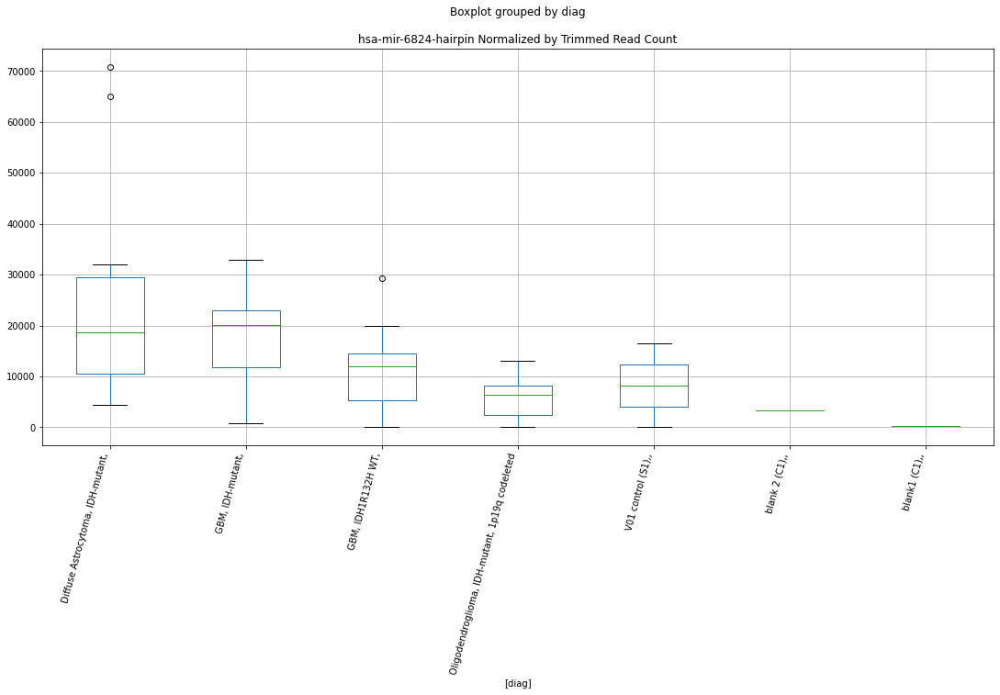

 p : 0.002663284168237664  ( t : 3.4816064670993527 ) :  D-plex  :  bbduk2  :  hsa-mir-6809-hairpin
Control and blanks
73     47926.520913
337    84564.940088
Name: hsa-mir-6809-hairpin, dtype: float64
205    46026.374725
Name: hsa-mir-6809-hairpin, dtype: float64
469    46730.658092
Name: hsa-mir-6809-hairpin, dtype: float64


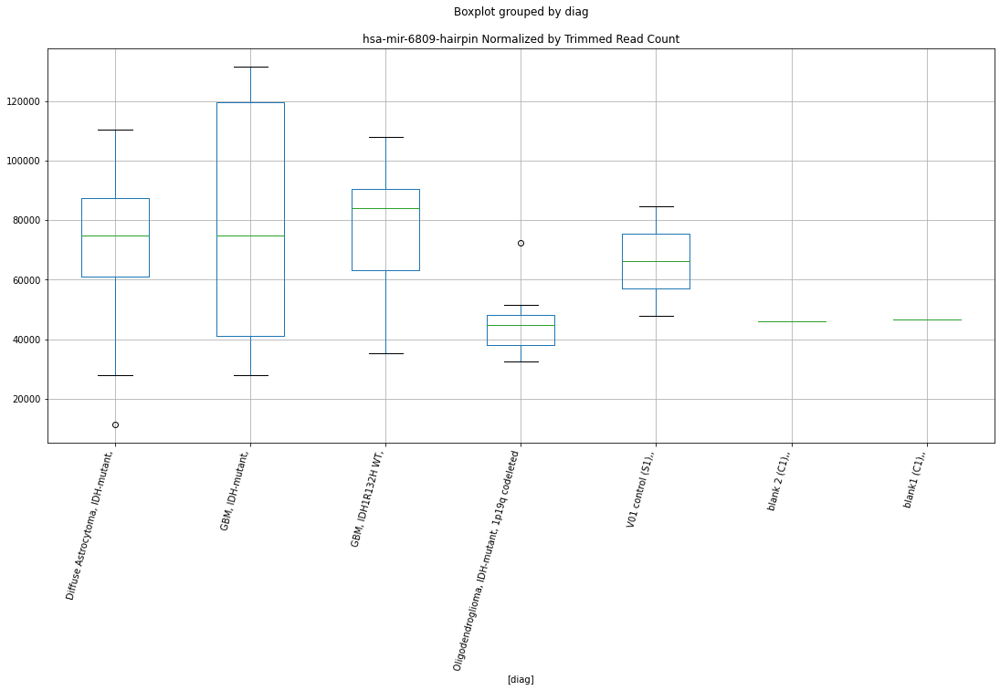

 p : 0.002665357765034199  ( t : 3.4812557991308957 ) :  D-plex  :  cutadapt2  :  hsa-mir-1252-hairpin
Control and blanks
76      60609.136979
340    146201.534412
Name: hsa-mir-1252-hairpin, dtype: float64
208    31039.398344
Name: hsa-mir-1252-hairpin, dtype: float64
472    50282.158041
Name: hsa-mir-1252-hairpin, dtype: float64


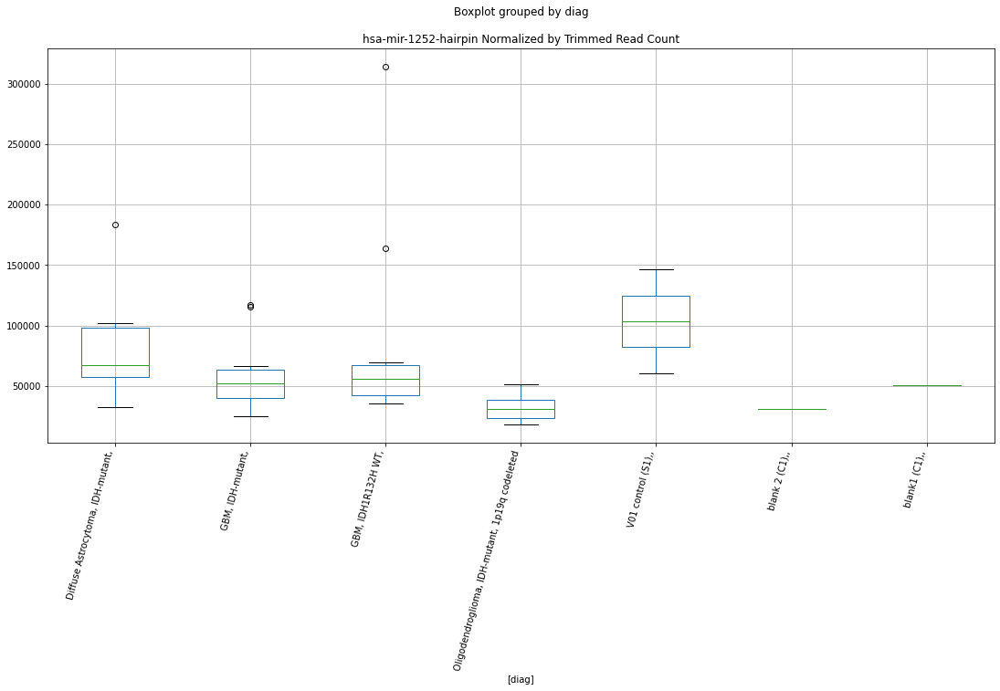

 p : 0.0027890760796495696  ( t : 3.460807616092662 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6833-hairpin
Control and blanks
82         0.000000
346    12626.071322
Name: hsa-mir-6833-hairpin, dtype: float64
214    2441.038081
Name: hsa-mir-6833-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-6833-hairpin, dtype: float64


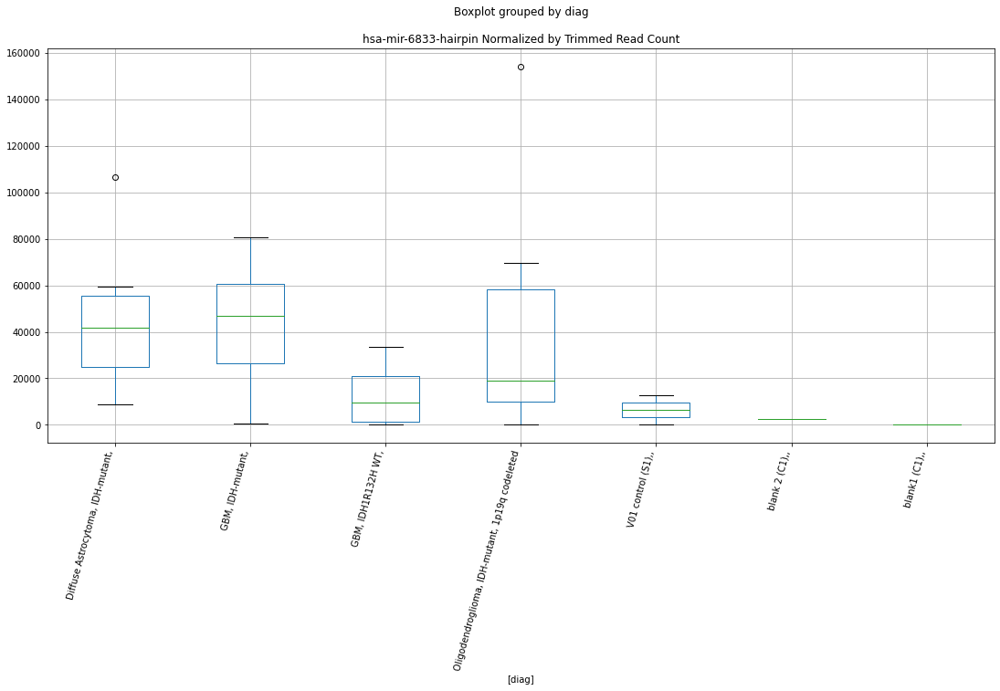

 p : 0.0028692021382596797  ( t : 3.4480375803136893 ) :  D-plex  :  bbduk2  :  hsa-mir-564-hairpin
Control and blanks
73     40196.436895
337    35606.290563
Name: hsa-mir-564-hairpin, dtype: float64
205    67159.107088
Name: hsa-mir-564-hairpin, dtype: float64
469    33717.057104
Name: hsa-mir-564-hairpin, dtype: float64


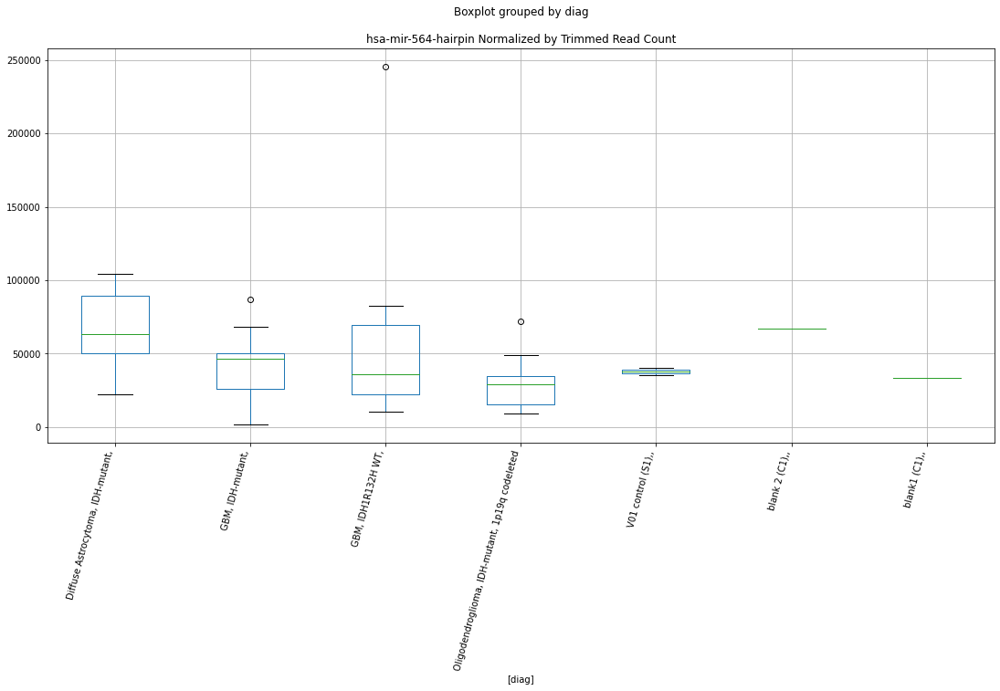

 p : 0.0029210902809868626  ( t : 3.439954648524009 ) :  Lexogen  :  bbduk2  :  hsa-mir-134-hairpin
Control and blanks
79       0.00000
343    424.62863
Name: hsa-mir-134-hairpin, dtype: float64
211    1093.225337
Name: hsa-mir-134-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-134-hairpin, dtype: float64


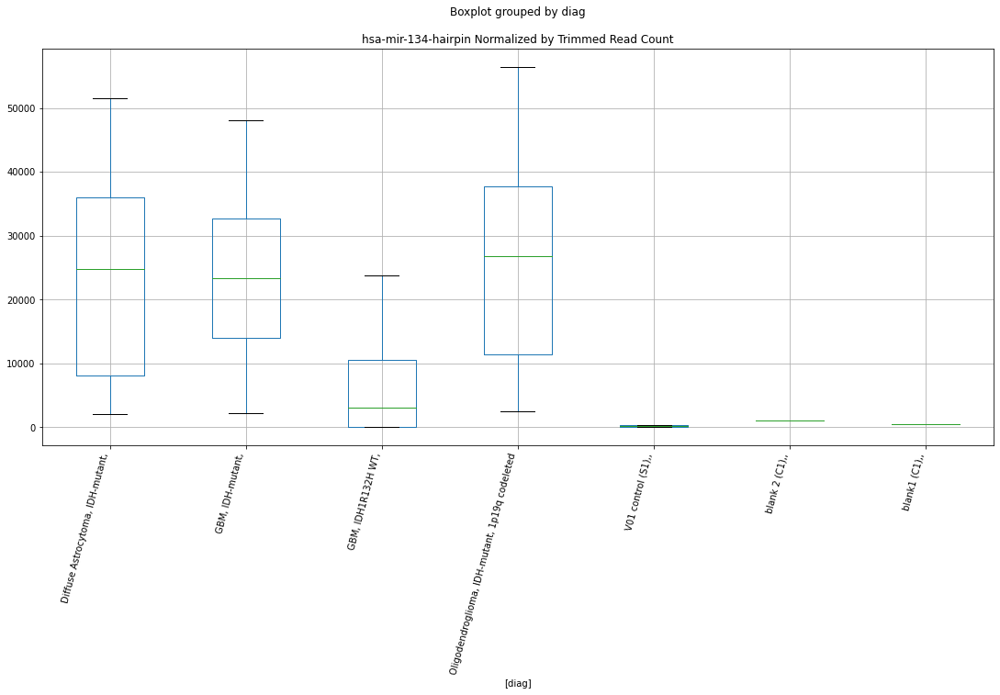

 p : 0.003066078624065843  ( t : 3.4180992090274582 ) :  D-plex  :  bbduk2  :  hsa-mir-3124-5p-mature
Control and blanks
73      3092.033607
337    19583.459810
Name: hsa-mir-3124-5p-mature, dtype: float64
205    10387.27523
Name: hsa-mir-3124-5p-mature, dtype: float64
469    15971.237576
Name: hsa-mir-3124-5p-mature, dtype: float64


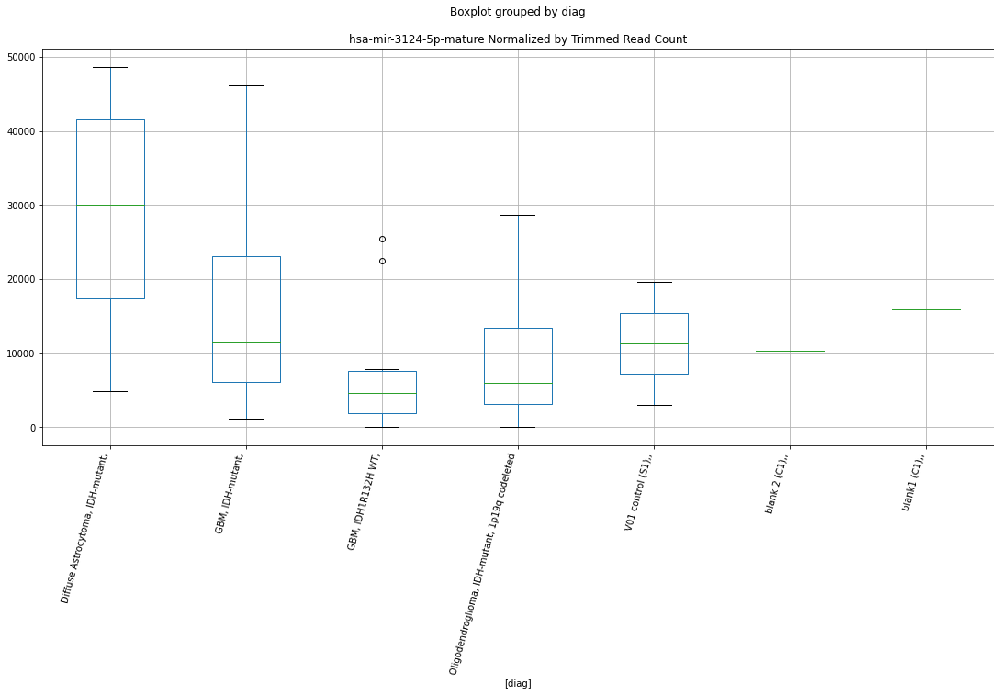

 p : 0.003068881965836503  ( t : 3.4176867698300053 ) :  Lexogen  :  cutadapt2  :  hsa-mir-134-hairpin
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-134-hairpin, dtype: float64
214    1084.905814
Name: hsa-mir-134-hairpin, dtype: float64
478    474.920967
Name: hsa-mir-134-hairpin, dtype: float64


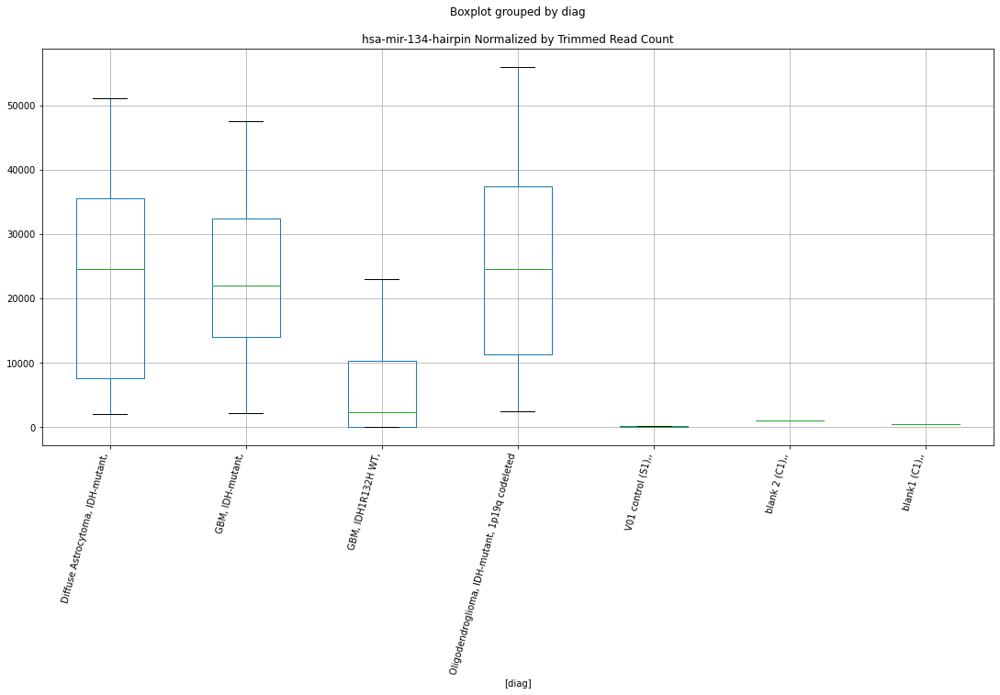

 p : 0.003201745211903595  ( t : 3.398554115622594 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6500-hairpin
Control and blanks
82        0.000000
346    9890.422536
Name: hsa-mir-6500-hairpin, dtype: float64
214    18443.398836
Name: hsa-mir-6500-hairpin, dtype: float64
478    9023.498377
Name: hsa-mir-6500-hairpin, dtype: float64


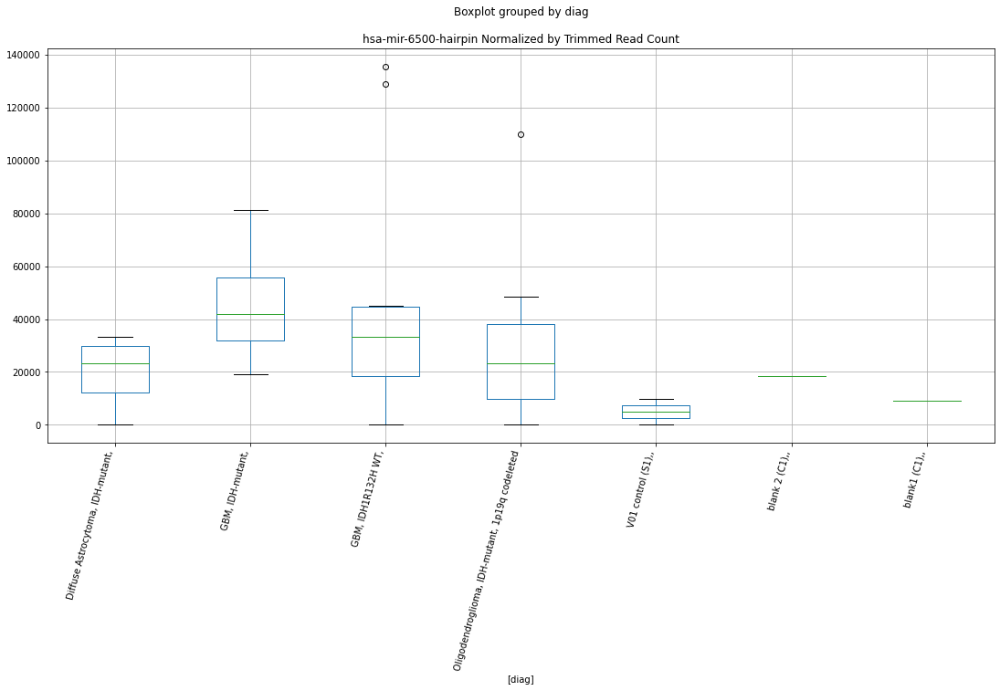

 p : 0.0032164211735839134  ( t : 3.396488991776138 ) :  D-plex  :  bbduk2  :  hsa-mir-302d-hairpin
Control and blanks
73     31693.344475
337    18693.302546
Name: hsa-mir-302d-hairpin, dtype: float64
205    10924.548086
Name: hsa-mir-302d-hairpin, dtype: float64
469    10647.491717
Name: hsa-mir-302d-hairpin, dtype: float64


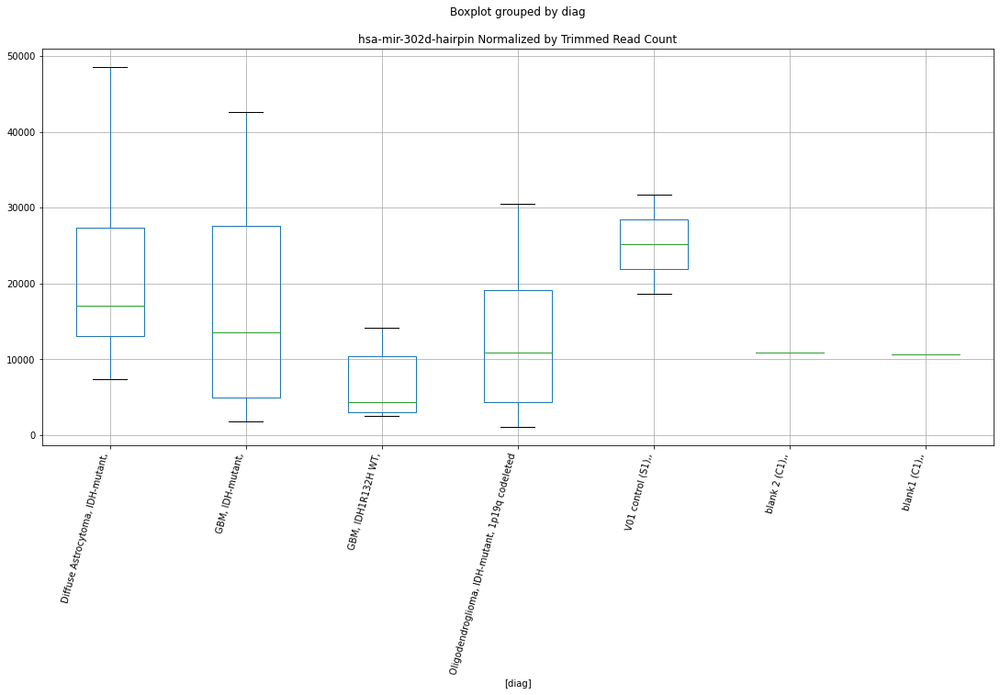

 p : 0.0032183722070254707  ( t : 3.396215153053772 ) :  Lexogen  :  bbduk2  :  hsa-mir-6833-hairpin
Control and blanks
79         0.000000
343    13163.487543
Name: hsa-mir-6833-hairpin, dtype: float64
211    2459.757009
Name: hsa-mir-6833-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-6833-hairpin, dtype: float64


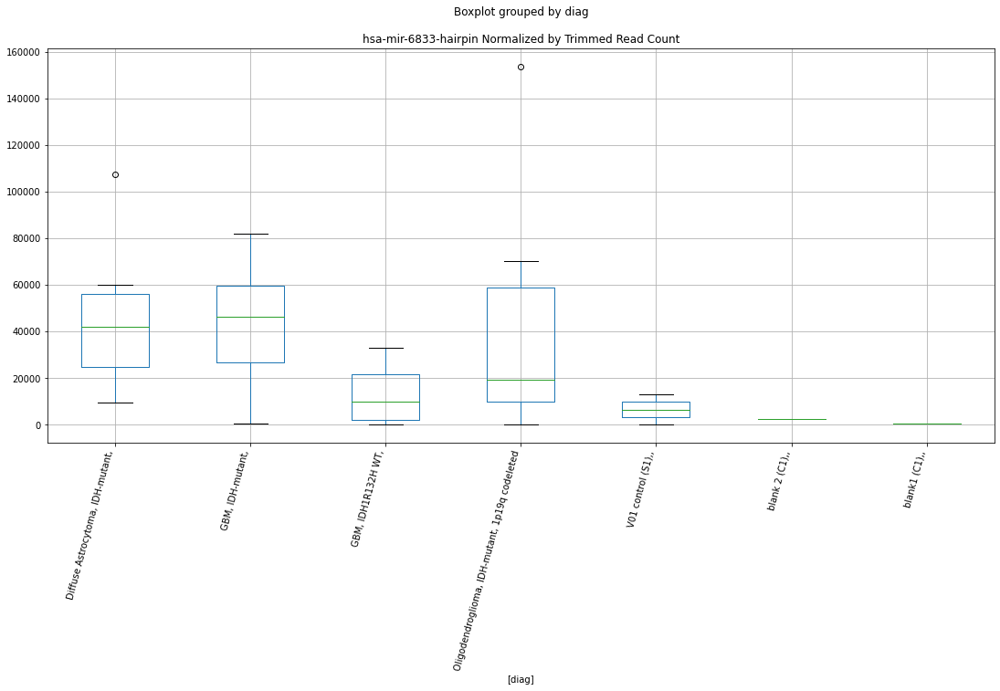

 p : 0.0032192140638032797  ( t : 3.3960970442121305 ) :  D-plex  :  cutadapt2  :  hsa-mir-302d-hairpin
Control and blanks
76     30304.568489
340    15853.178430
Name: hsa-mir-302d-hairpin, dtype: float64
208    10228.892636
Name: hsa-mir-302d-hairpin, dtype: float64
472    10981.160951
Name: hsa-mir-302d-hairpin, dtype: float64


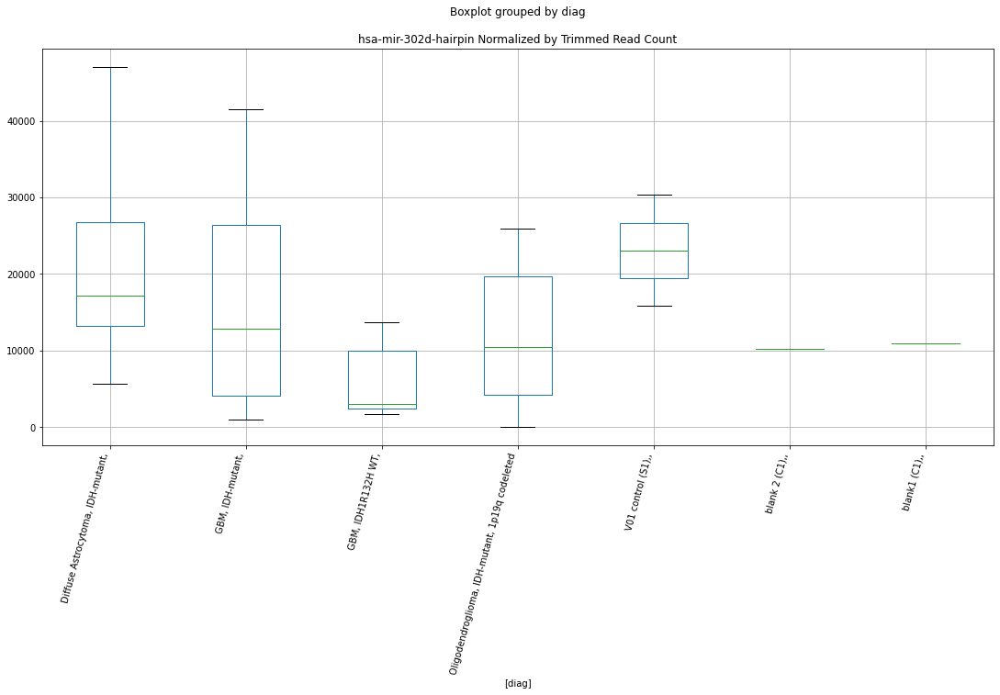

 p : 0.003236749366493834  ( t : 3.393643820881382 ) :  Lexogen  :  bbduk2  :  hsa-mir-3166-hairpin
Control and blanks
79     1430.598791
343     636.942946
Name: hsa-mir-3166-hairpin, dtype: float64
211    1639.838006
Name: hsa-mir-3166-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-3166-hairpin, dtype: float64


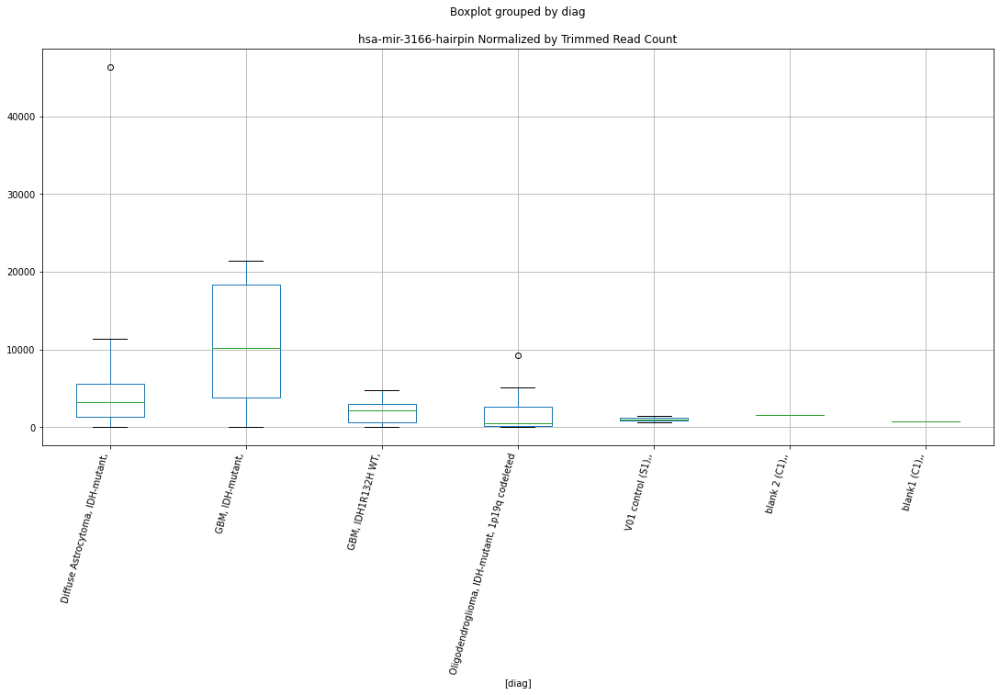

 p : 0.003246724369233098  ( t : 3.39225414266523 ) :  Lexogen  :  bbduk2  :  hsa-mir-4706-mature
Control and blanks
79        0.000000
343    1061.571576
Name: hsa-mir-4706-mature, dtype: float64
211    273.306334
Name: hsa-mir-4706-mature, dtype: float64
475    0.0
Name: hsa-mir-4706-mature, dtype: float64


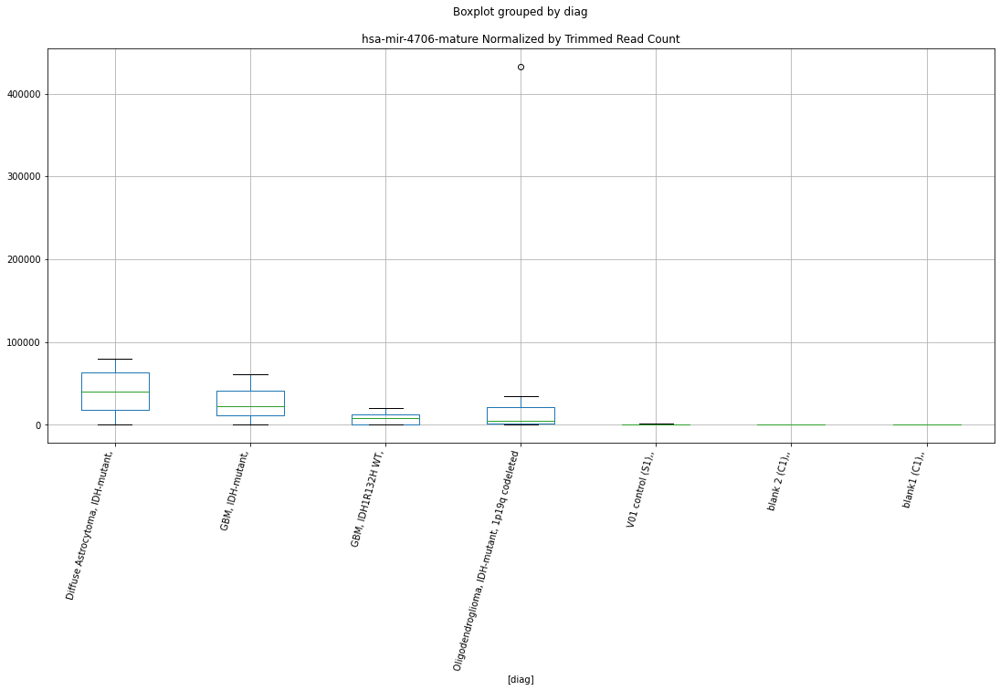

 p : 0.0032505042042947764  ( t : 3.39172865102636 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3924-hairpin
Control and blanks
82         0.000000
346    26093.880732
Name: hsa-mir-3924-hairpin, dtype: float64
214    5966.981976
Name: hsa-mir-3924-hairpin, dtype: float64
478    474.920967
Name: hsa-mir-3924-hairpin, dtype: float64


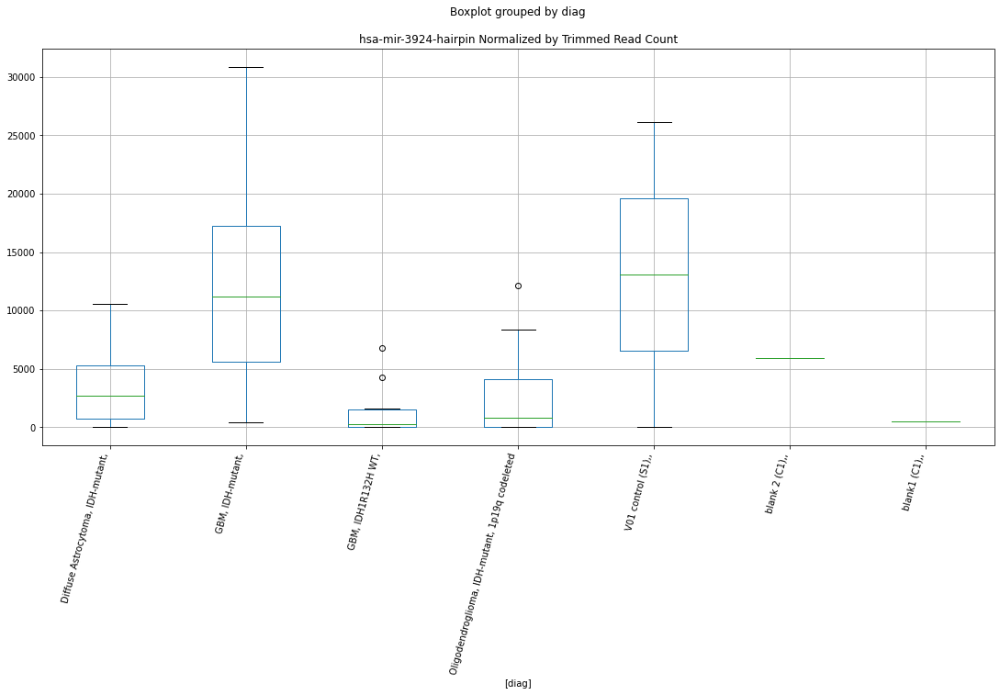

 p : 0.003265323549152018  ( t : 3.3896741895568865 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4706-mature
Control and blanks
82        0.000000
346    1473.041654
Name: hsa-mir-4706-mature, dtype: float64
214    0.0
Name: hsa-mir-4706-mature, dtype: float64
478    0.0
Name: hsa-mir-4706-mature, dtype: float64


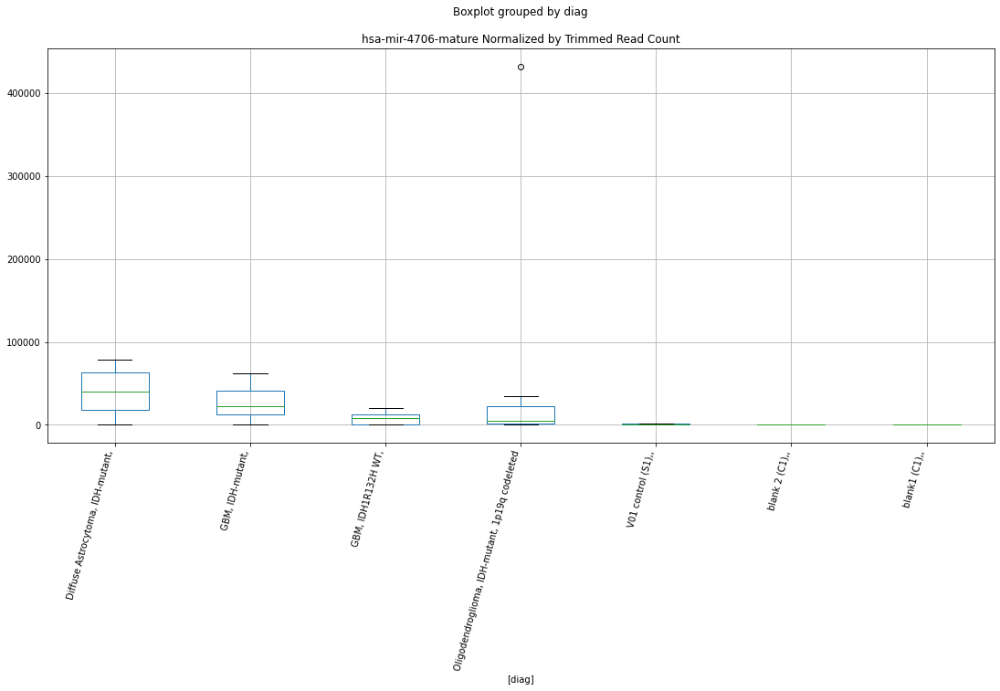

 p : 0.0033110545669415284  ( t : 3.3833918185965906 ) :  D-plex  :  bbduk2  :  hsa-mir-1343-5p-mature
Control and blanks
73     5411.058813
337    1780.314528
Name: hsa-mir-1343-5p-mature, dtype: float64
205    18983.640937
Name: hsa-mir-1343-5p-mature, dtype: float64
469    10647.491717
Name: hsa-mir-1343-5p-mature, dtype: float64


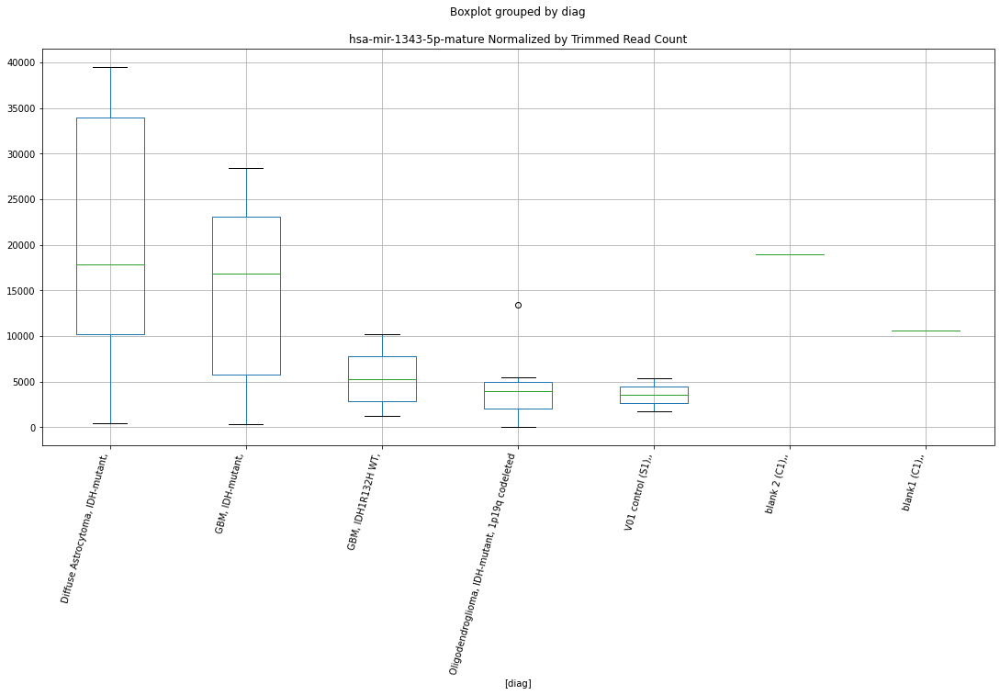

 p : 0.0033766753230109925  ( t : 3.374524962630249 ) :  D-plex  :  bbduk2  :  hsa-mir-3613-hairpin
Control and blanks
73     138368.503927
337    170910.194704
Name: hsa-mir-3613-hairpin, dtype: float64
205    116946.39181
Name: hsa-mir-3613-hairpin, dtype: float64
469    107657.971807
Name: hsa-mir-3613-hairpin, dtype: float64


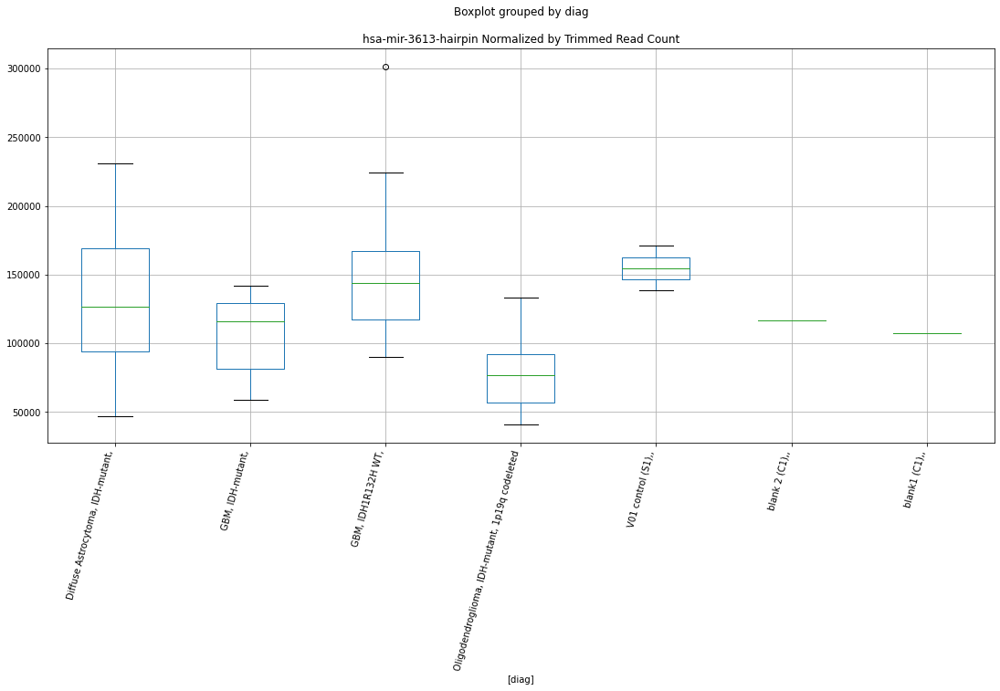

 p : 0.003459284784718029  ( t : 3.363601028891182 ) :  D-plex  :  bbduk2  :  hsa-mir-3620-3p-mature
Control and blanks
73     0.0
337    0.0
Name: hsa-mir-3620-3p-mature, dtype: float64
205    1432.727618
Name: hsa-mir-3620-3p-mature, dtype: float64
469    3549.163906
Name: hsa-mir-3620-3p-mature, dtype: float64


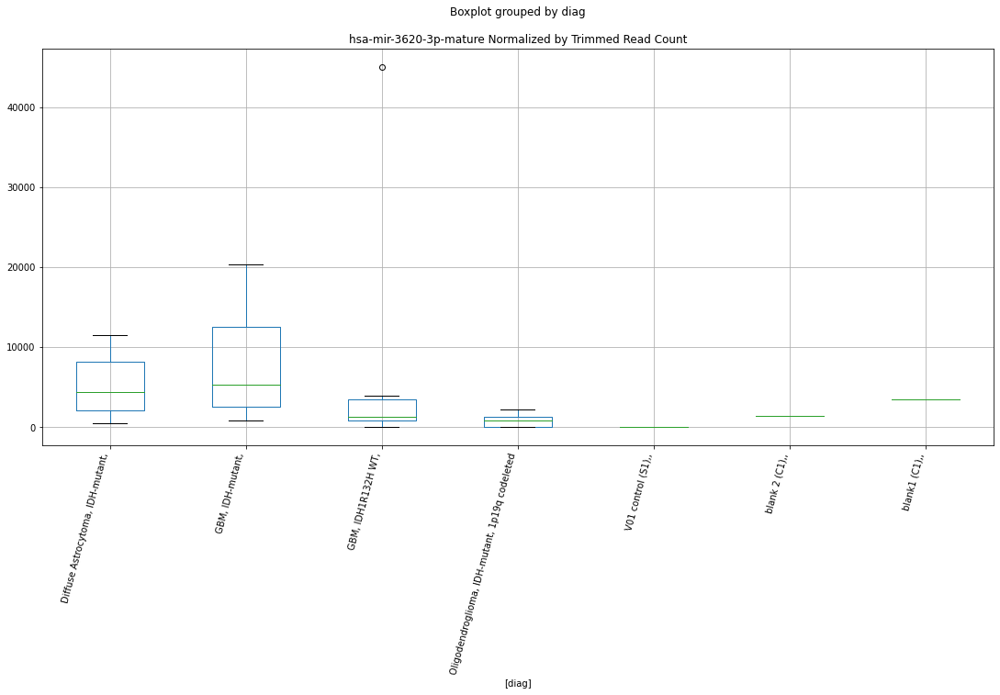

 p : 0.003652104224967022  ( t : 3.3390720180122577 ) :  D-plex  :  cutadapt2  :  hsa-mir-411-hairpin
Control and blanks
76     24243.654792
340    41394.410345
Name: hsa-mir-411-hairpin, dtype: float64
208    22574.107886
Name: hsa-mir-411-hairpin, dtype: float64
472    35255.306213
Name: hsa-mir-411-hairpin, dtype: float64


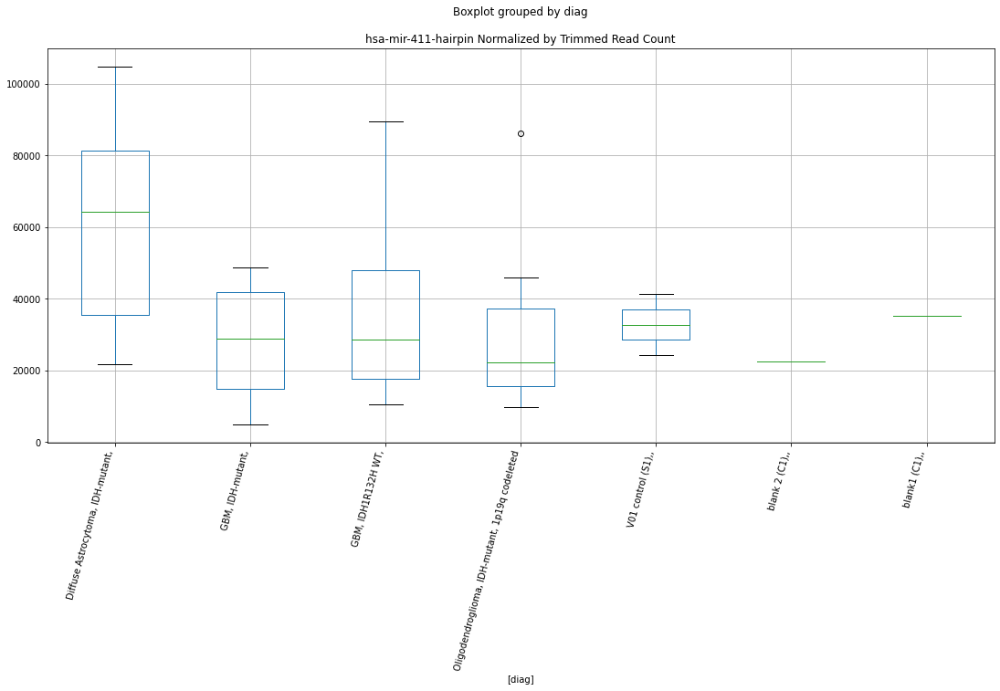

 p : 0.0036677451556454063  ( t : 3.3371385805569145 ) :  D-plex  :  cutadapt2  :  hsa-mir-1343-5p-mature
Control and blanks
76     5303.299486
340    2642.196405
Name: hsa-mir-1343-5p-mature, dtype: float64
208    20810.505708
Name: hsa-mir-1343-5p-mature, dtype: float64
472    11559.116791
Name: hsa-mir-1343-5p-mature, dtype: float64


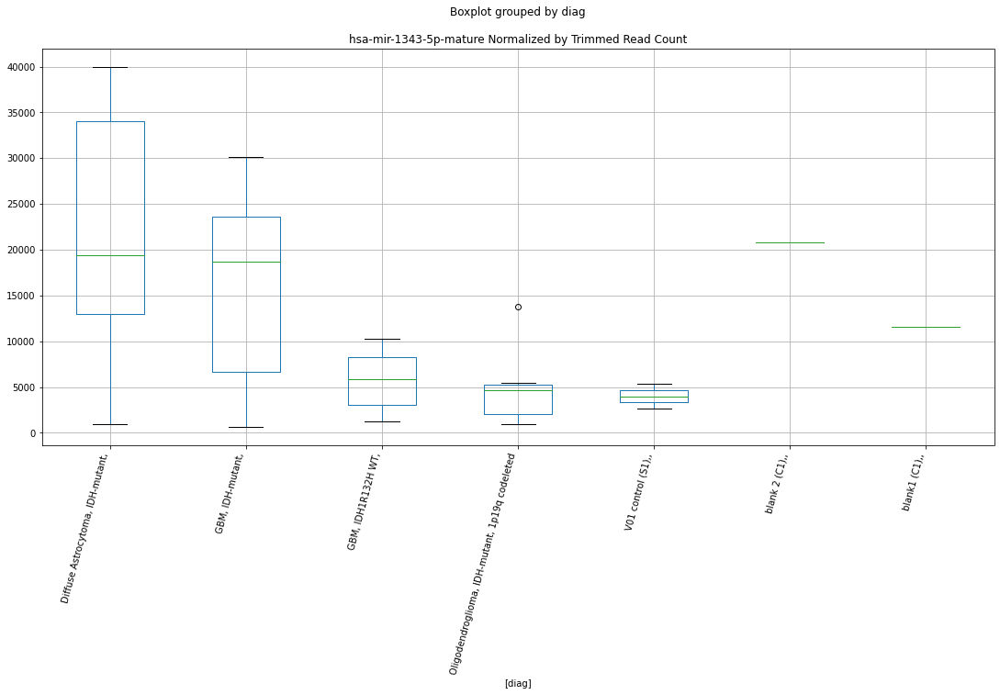

 p : 0.0036730074287564403  ( t : 3.336489914753384 ) :  D-plex  :  bbduk2  :  hsa-mir-4272-mature
Control and blanks
73     773.008402
337    890.157264
Name: hsa-mir-4272-mature, dtype: float64
205    78083.655175
Name: hsa-mir-4272-mature, dtype: float64
469    11830.546352
Name: hsa-mir-4272-mature, dtype: float64


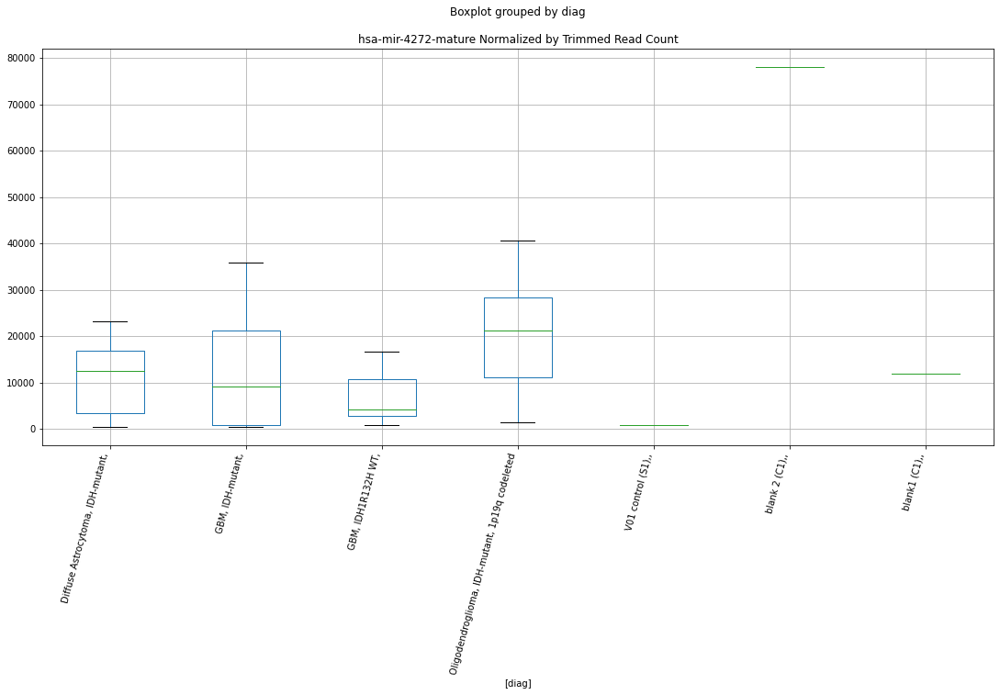

 p : 0.0037497785971616006  ( t : 3.327129187617466 ) :  D-plex  :  cutadapt2  :  hsa-mir-8081-hairpin
Control and blanks
76      87125.634407
340    108330.052606
Name: hsa-mir-8081-hairpin, dtype: float64
208    39328.328583
Name: hsa-mir-8081-hairpin, dtype: float64
472    251988.746044
Name: hsa-mir-8081-hairpin, dtype: float64


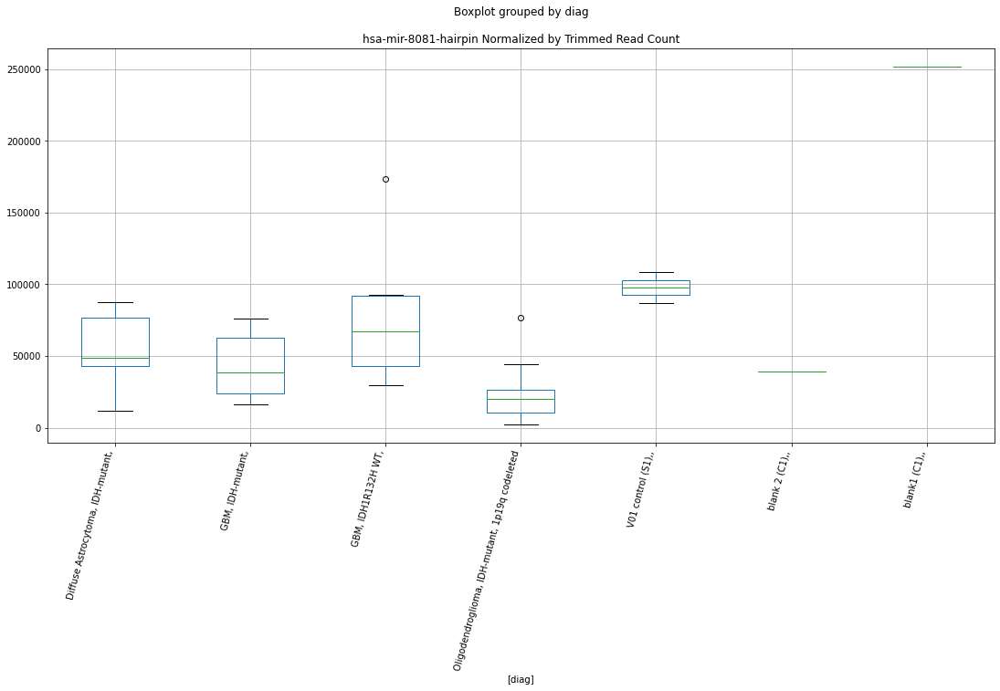

 p : 0.003785130870310127  ( t : 3.3228819346713134 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122b-hairpin
Control and blanks
82      2840.102244
346    21885.190292
Name: hsa-mir-122b-hairpin, dtype: float64
214    4068.396802
Name: hsa-mir-122b-hairpin, dtype: float64
478    4986.670156
Name: hsa-mir-122b-hairpin, dtype: float64


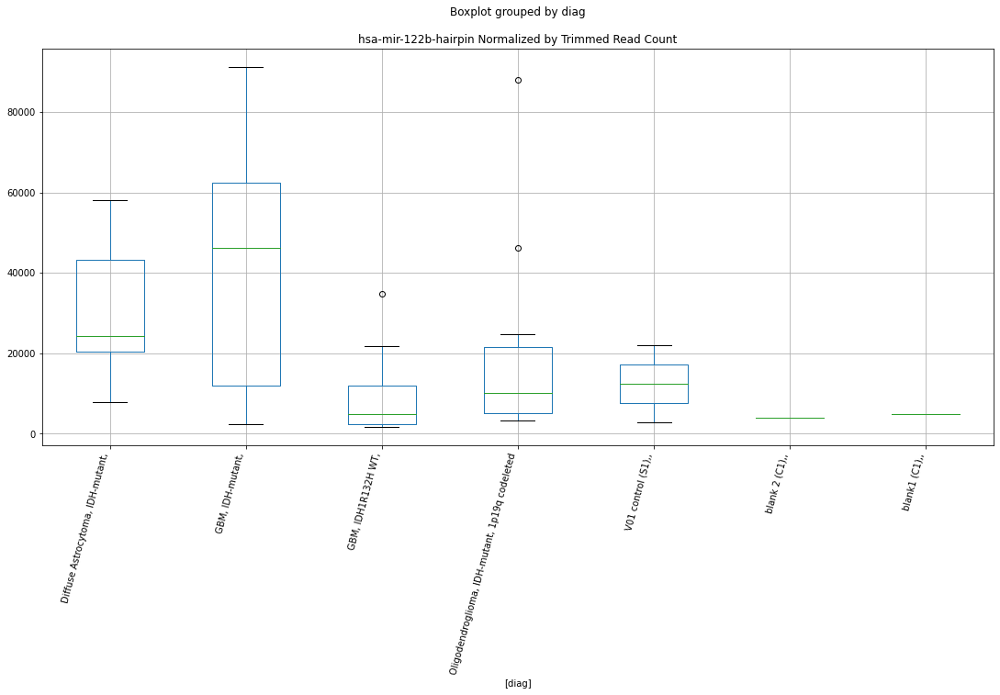

 p : 0.0038145034849908694  ( t : 3.3193826687303454 ) :  Lexogen  :  bbduk2  :  hsa-mir-6850-hairpin
Control and blanks
79         0.000000
343    22717.631727
Name: hsa-mir-6850-hairpin, dtype: float64
211    8199.190029
Name: hsa-mir-6850-hairpin, dtype: float64
475    6227.409175
Name: hsa-mir-6850-hairpin, dtype: float64


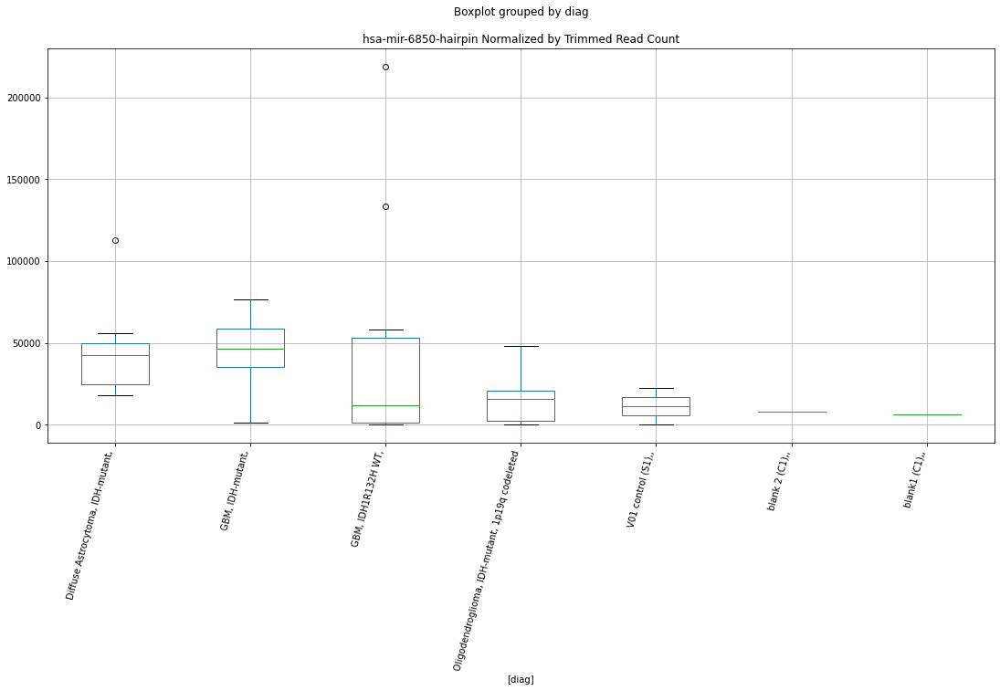

 p : 0.0038307836923008117  ( t : 3.3174545513600022 ) :  Lexogen  :  bbduk2  :  hsa-mir-7159-5p-mature
Control and blanks
79     20028.383080
343      212.314315
Name: hsa-mir-7159-5p-mature, dtype: float64
211    0.0
Name: hsa-mir-7159-5p-mature, dtype: float64
475    0.0
Name: hsa-mir-7159-5p-mature, dtype: float64


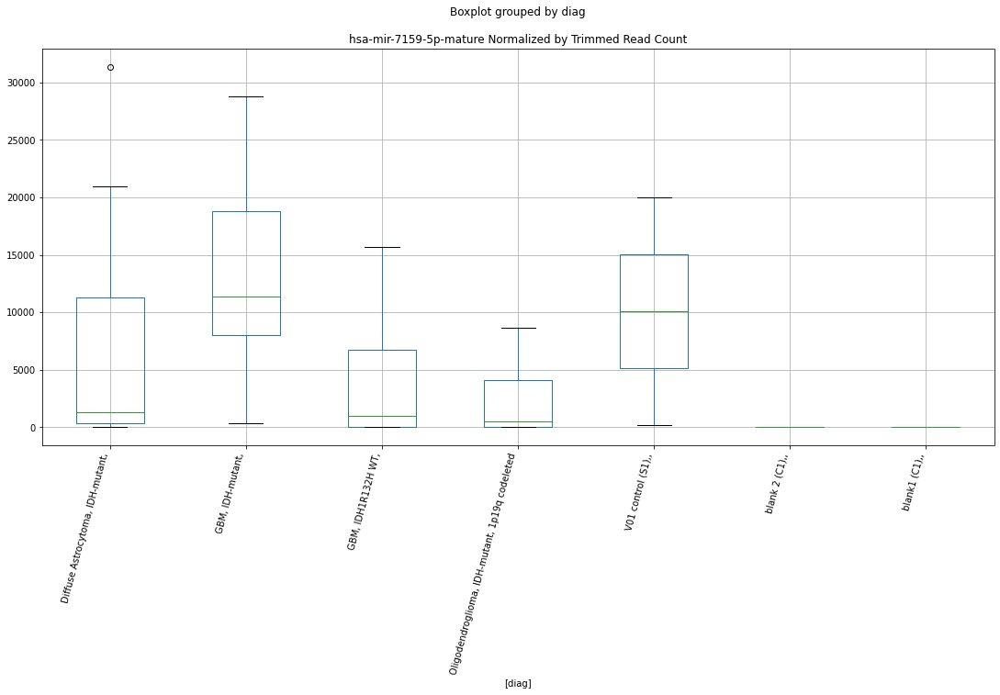

 p : 0.003839641357217286  ( t : 3.3164088932513134 ) :  Lexogen  :  cutadapt2  :  hsa-mir-9902-2-hairpin
Control and blanks
82       0.000000
346    631.303566
Name: hsa-mir-9902-2-hairpin, dtype: float64
214    0.0
Name: hsa-mir-9902-2-hairpin, dtype: float64
478    0.0
Name: hsa-mir-9902-2-hairpin, dtype: float64


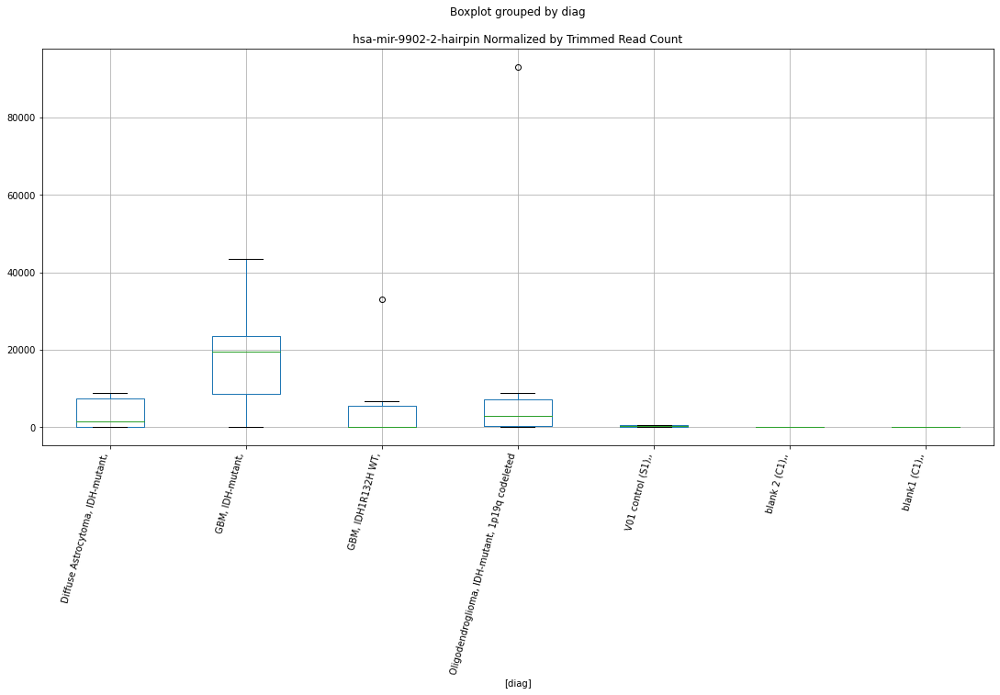

 p : 0.003839641357217286  ( t : 3.3164088932513134 ) :  Lexogen  :  cutadapt2  :  hsa-mir-9902-1-hairpin
Control and blanks
82       0.000000
346    631.303566
Name: hsa-mir-9902-1-hairpin, dtype: float64
214    0.0
Name: hsa-mir-9902-1-hairpin, dtype: float64
478    0.0
Name: hsa-mir-9902-1-hairpin, dtype: float64


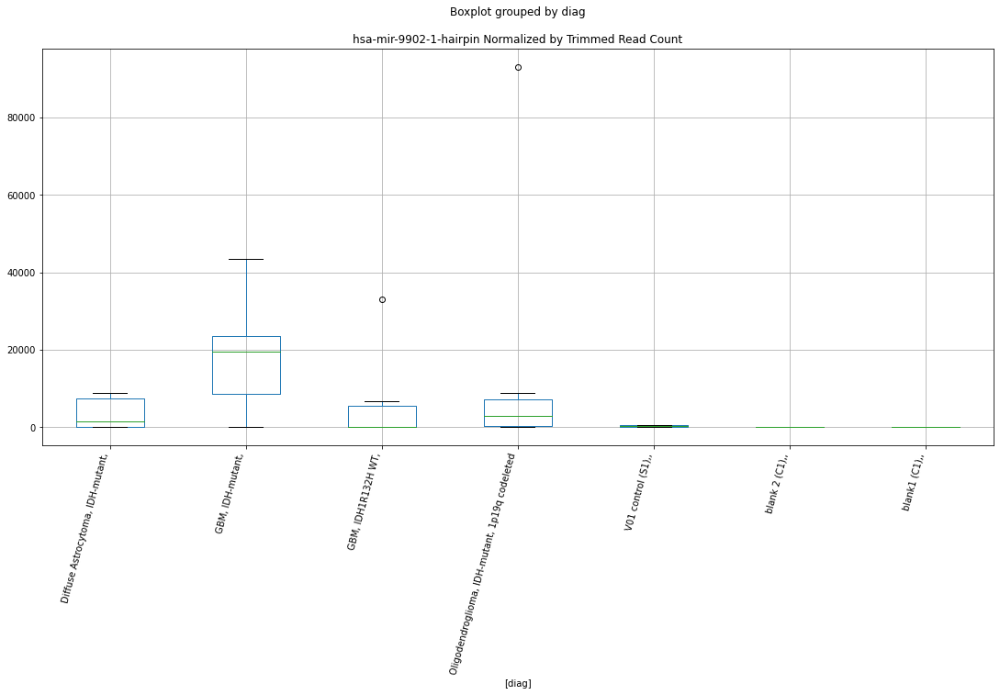

 p : 0.003850157715924152  ( t : 3.315170501349126 ) :  D-plex  :  cutadapt2  :  hsa-mir-6818-hairpin
Control and blanks
76     37123.09640
340    38752.21394
Name: hsa-mir-6818-hairpin, dtype: float64
208    12521.575468
Name: hsa-mir-6818-hairpin, dtype: float64
472    17916.631026
Name: hsa-mir-6818-hairpin, dtype: float64


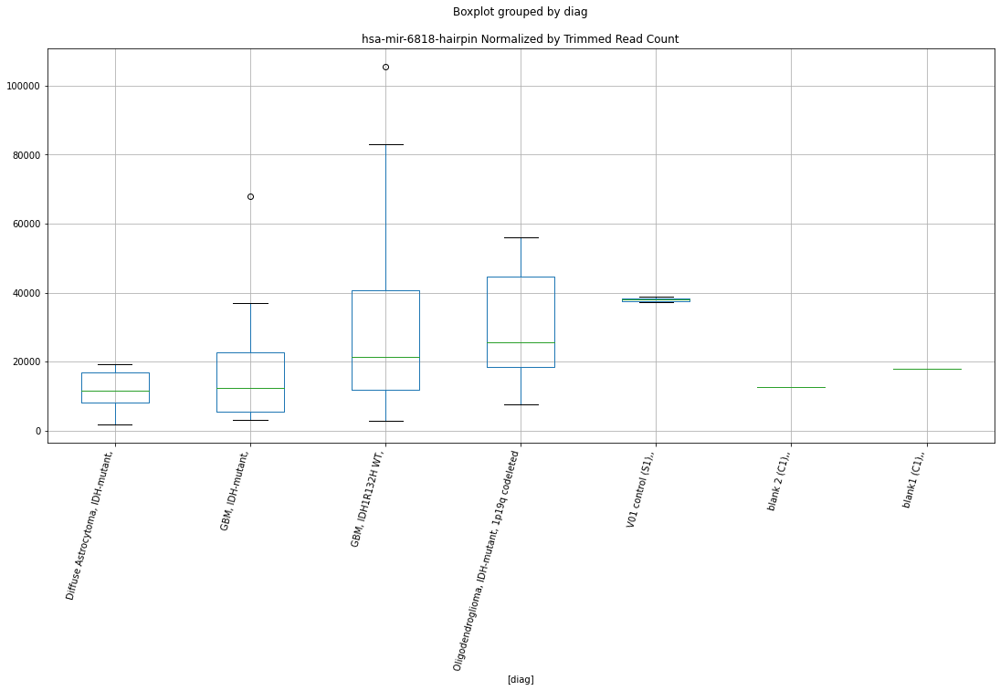

 p : 0.003920636019132662  ( t : 3.306955959191185 ) :  Lexogen  :  bbduk2  :  hsa-mir-6500-hairpin
Control and blanks
79      1430.598791
343    10403.401445
Name: hsa-mir-6500-hairpin, dtype: float64
211    19678.05607
Name: hsa-mir-6500-hairpin, dtype: float64
475    10059.660975
Name: hsa-mir-6500-hairpin, dtype: float64


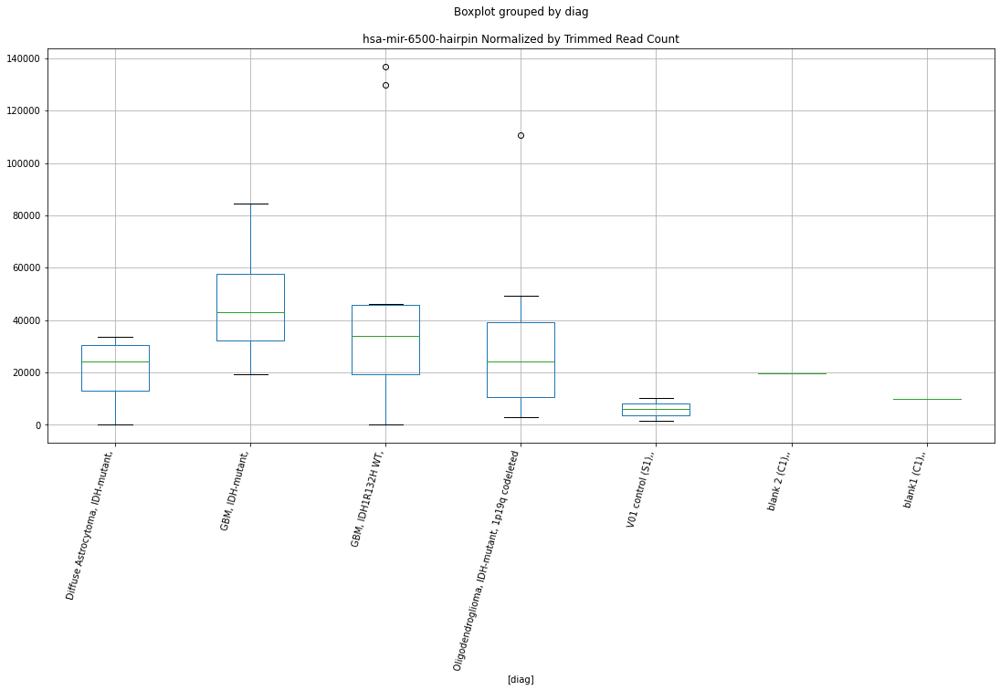

 p : 0.003928153951898716  ( t : 3.3060883006182578 ) :  D-plex  :  cutadapt2  :  hsa-mir-3613-hairpin
Control and blanks
76     130309.644505
340    203449.123187
Name: hsa-mir-3613-hairpin, dtype: float64
208    119748.587928
Name: hsa-mir-3613-hairpin, dtype: float64
472    89005.199291
Name: hsa-mir-3613-hairpin, dtype: float64


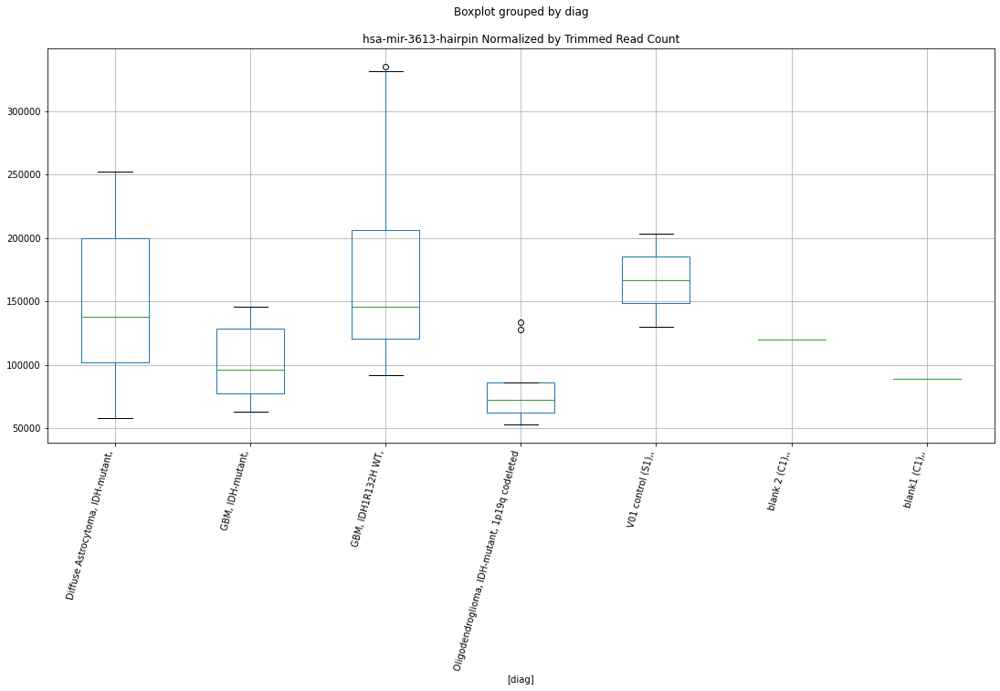

 p : 0.004164432928499834  ( t : 3.279619437691926 ) :  Lexogen  :  cutadapt2  :  hsa-mir-7159-5p-mature
Control and blanks
82     19880.715706
346      210.434522
Name: hsa-mir-7159-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-7159-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-7159-5p-mature, dtype: float64


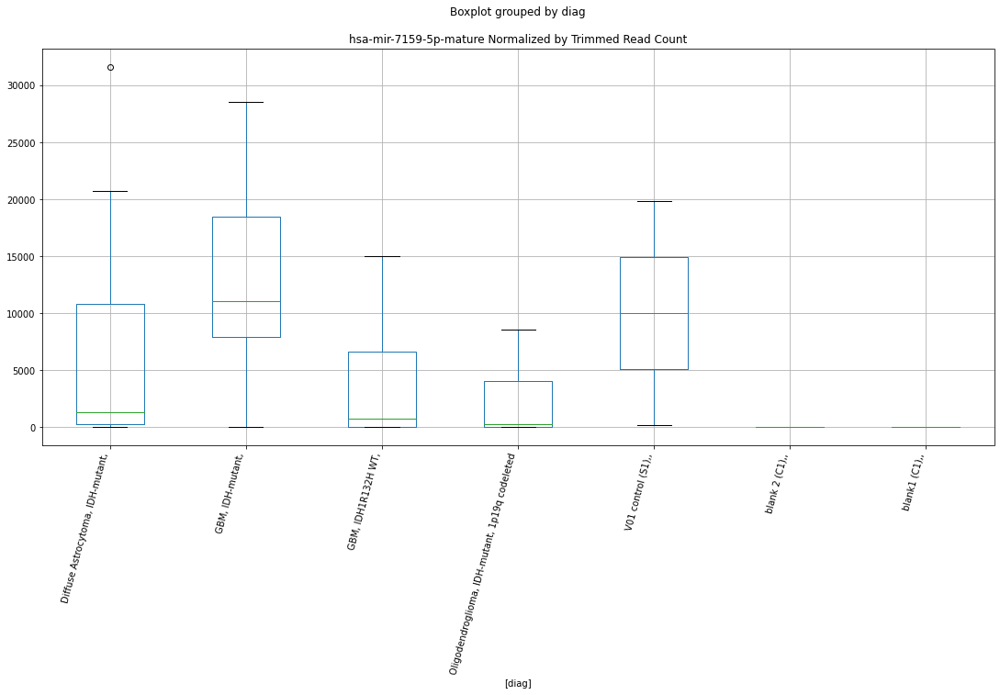

 p : 0.004186641062878626  ( t : 3.2772079583817746 ) :  D-plex  :  cutadapt2  :  hsa-mir-7515-hairpin
Control and blanks
76      4545.685273
340    70458.570801
Name: hsa-mir-7515-hairpin, dtype: float64
208    17459.661568
Name: hsa-mir-7515-hairpin, dtype: float64
472    21384.366063
Name: hsa-mir-7515-hairpin, dtype: float64


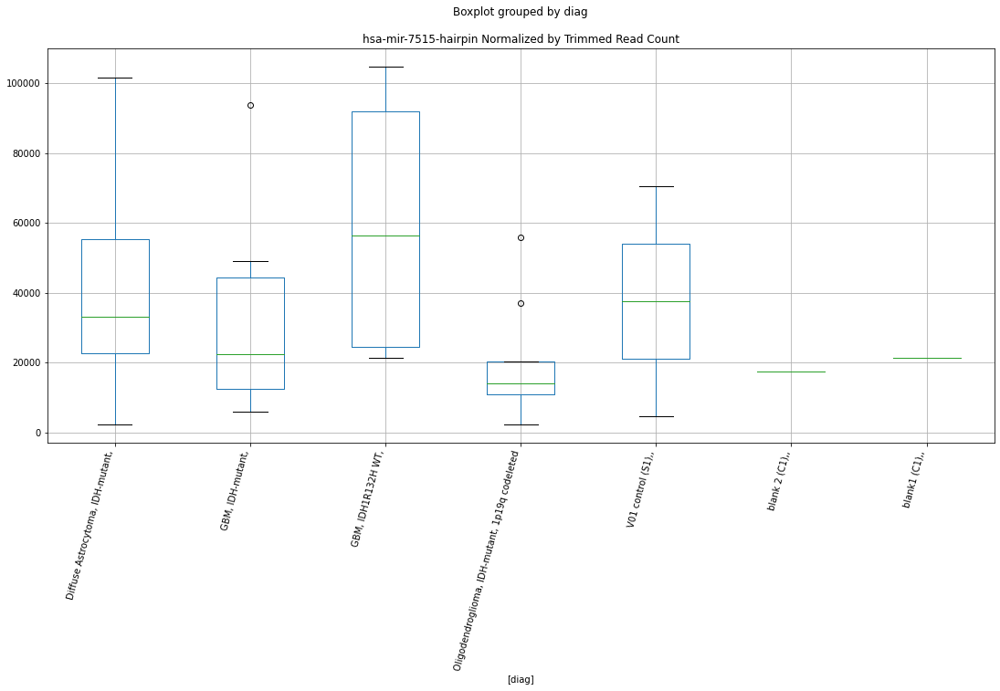

 p : 0.0042847403251249855  ( t : 3.266703990458317 ) :  Lexogen  :  bbduk2  :  hsa-mir-122b-3p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-122b-3p-mature, dtype: float64
211    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64
475    239.515738
Name: hsa-mir-122b-3p-mature, dtype: float64


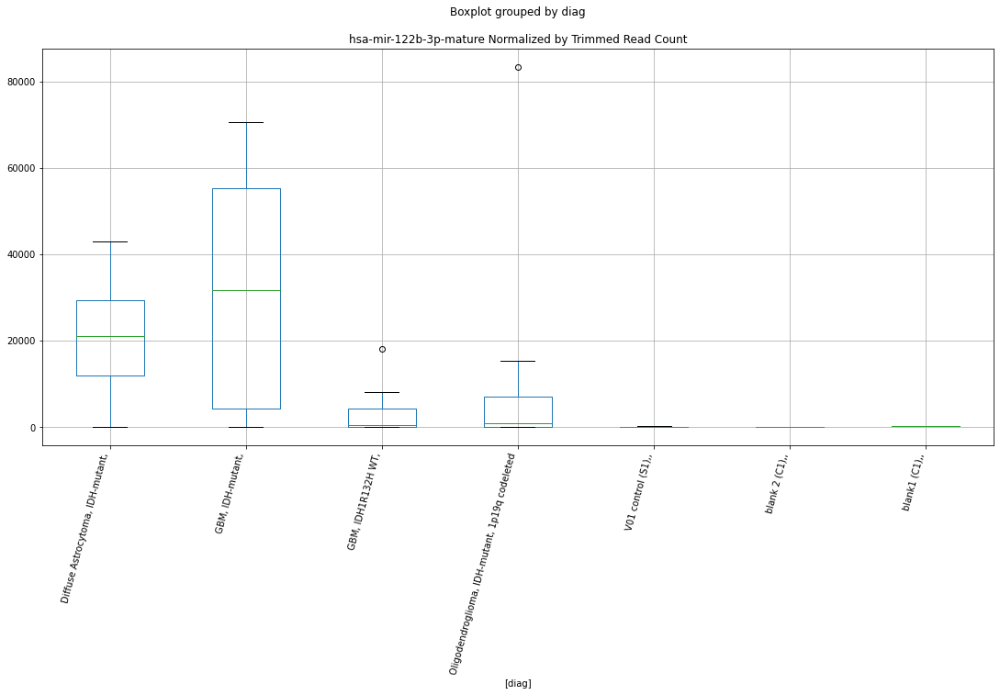

 p : 0.004321718352016271  ( t : 3.2628057543356896 ) :  Lexogen  :  cutadapt2  :  hsa-mir-11401-hairpin
Control and blanks
82         0.00000
346    10311.29158
Name: hsa-mir-11401-hairpin, dtype: float64
214    0.0
Name: hsa-mir-11401-hairpin, dtype: float64
478    0.0
Name: hsa-mir-11401-hairpin, dtype: float64


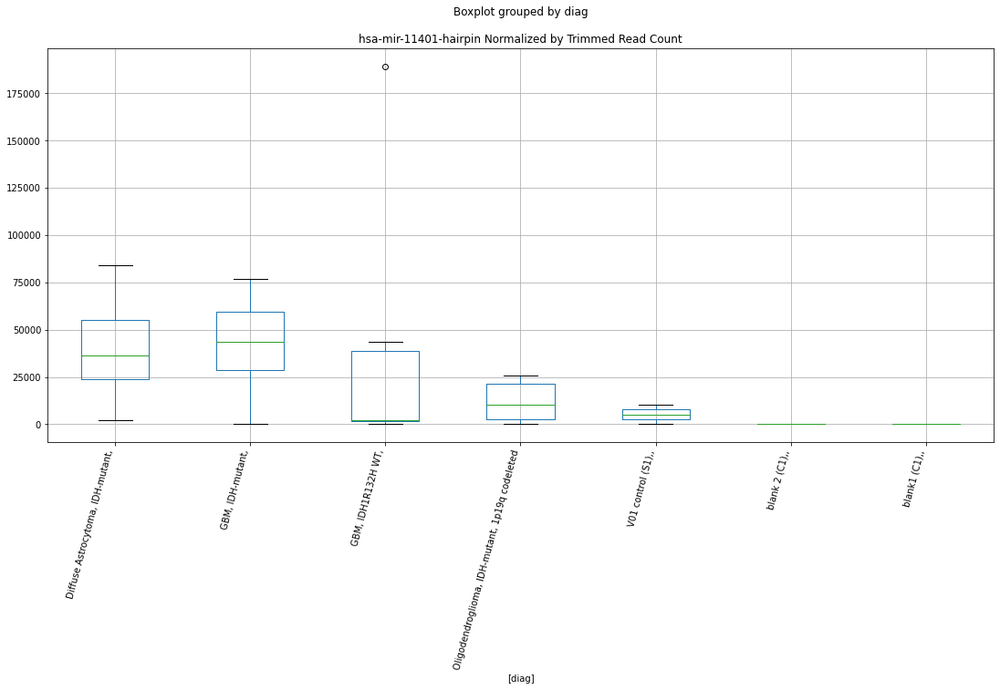

 p : 0.004380828898925913  ( t : 3.256641803361778 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1278-hairpin
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-1278-hairpin, dtype: float64
214    8136.793604
Name: hsa-mir-1278-hairpin, dtype: float64
478    0.0
Name: hsa-mir-1278-hairpin, dtype: float64


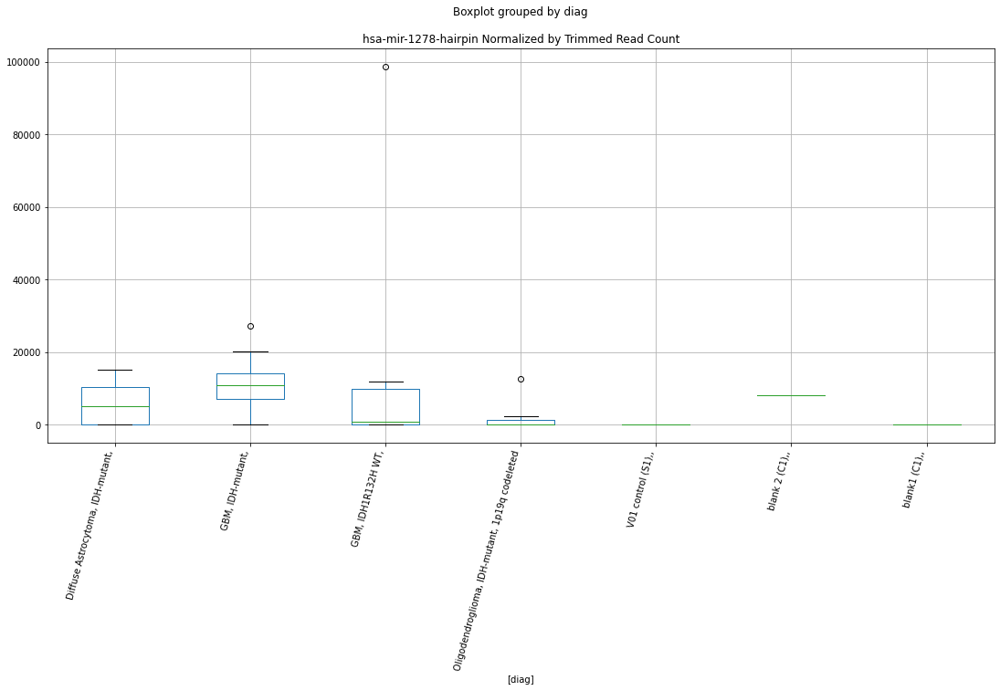

 p : 0.004383810873053431  ( t : 3.2563330152780314 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122-5p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-122-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-122-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-122-5p-mature, dtype: float64


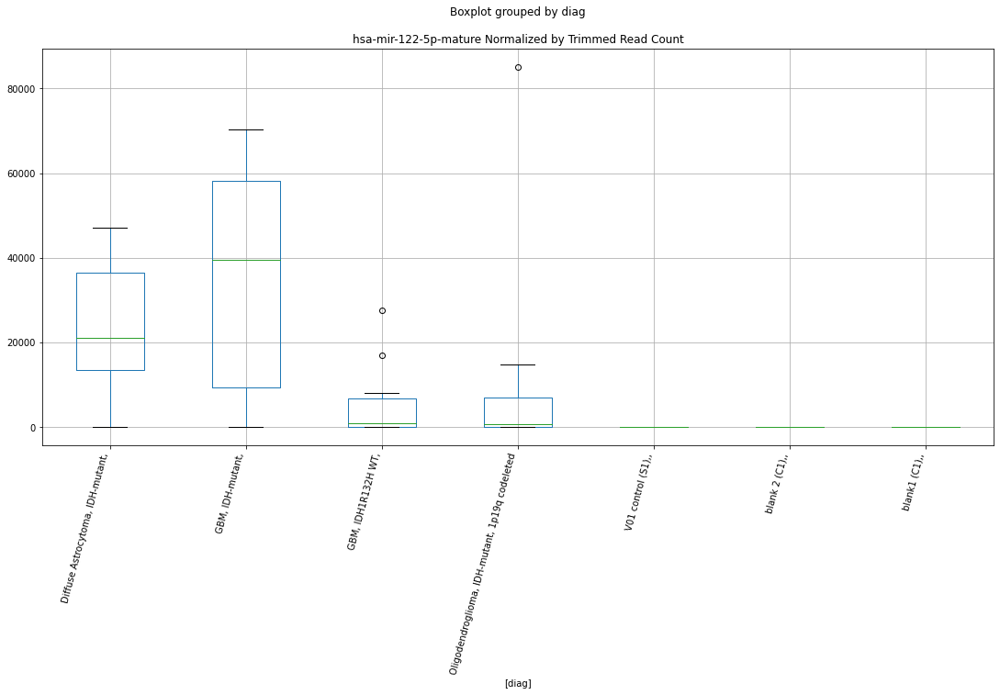

 p : 0.004395836690329788  ( t : 3.2550898118550613 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122b-3p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64
214    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64
478    0.0
Name: hsa-mir-122b-3p-mature, dtype: float64


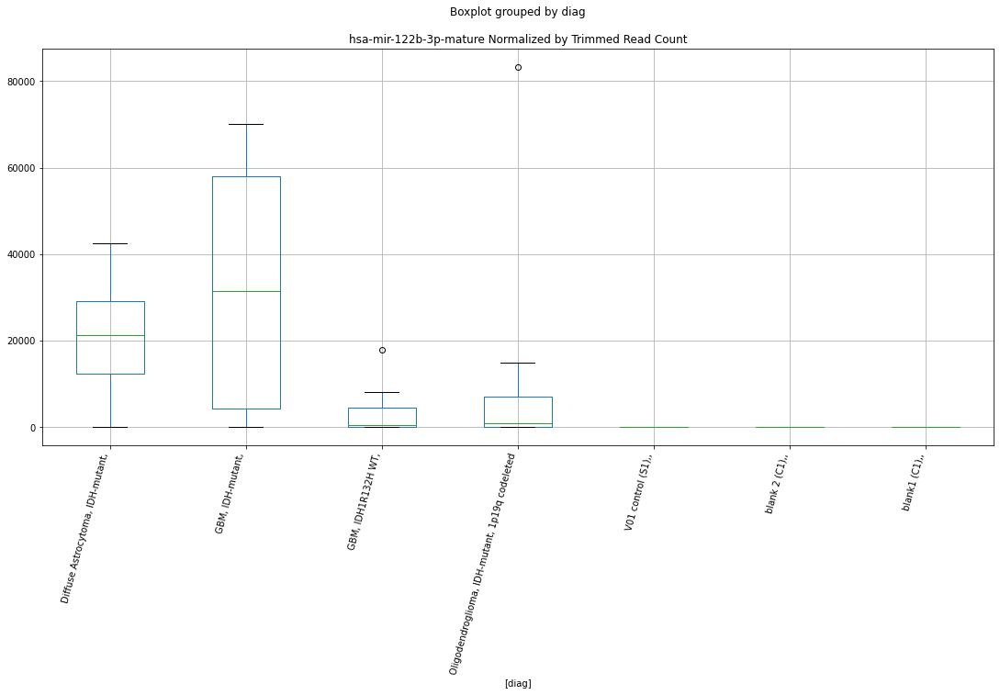

 p : 0.004456557573944767  ( t : 3.2488631569317925 ) :  D-plex  :  bbduk2  :  hsa-mir-4477b-hairpin
Control and blanks
73      5411.058813
337    19583.459810
Name: hsa-mir-4477b-hairpin, dtype: float64
205    28833.64331
Name: hsa-mir-4477b-hairpin, dtype: float64
469    33125.529787
Name: hsa-mir-4477b-hairpin, dtype: float64


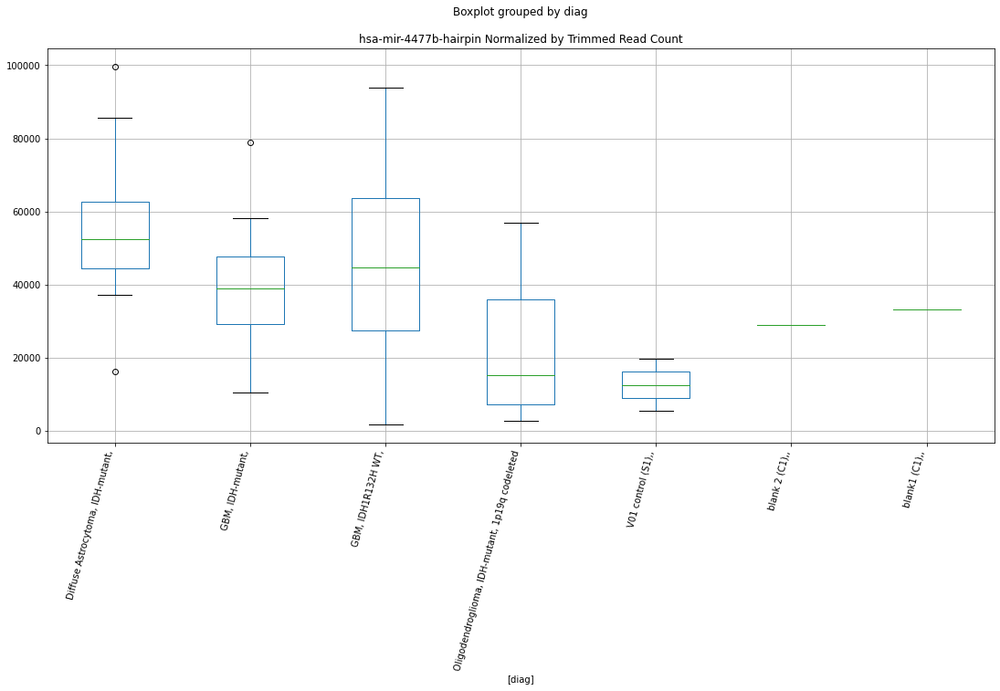

 p : 0.004456557573944767  ( t : 3.2488631569317925 ) :  D-plex  :  bbduk2  :  hsa-mir-4477a-hairpin
Control and blanks
73      5411.058813
337    19583.459810
Name: hsa-mir-4477a-hairpin, dtype: float64
205    28833.64331
Name: hsa-mir-4477a-hairpin, dtype: float64
469    33125.529787
Name: hsa-mir-4477a-hairpin, dtype: float64


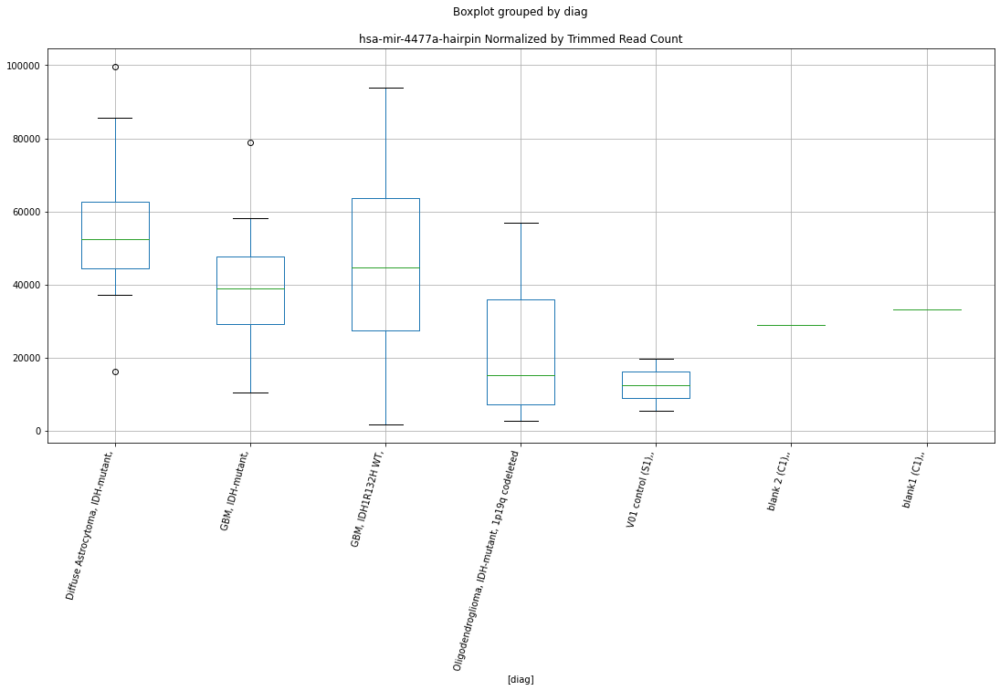

 p : 0.004520040592423262  ( t : 3.2424416508882934 ) :  D-plex  :  cutadapt2  :  hsa-mir-4713-hairpin
Control and blanks
76     9091.370547
340    4403.660675
Name: hsa-mir-4713-hairpin, dtype: float64
208    70015.006491
Name: hsa-mir-4713-hairpin, dtype: float64
472    45658.511324
Name: hsa-mir-4713-hairpin, dtype: float64


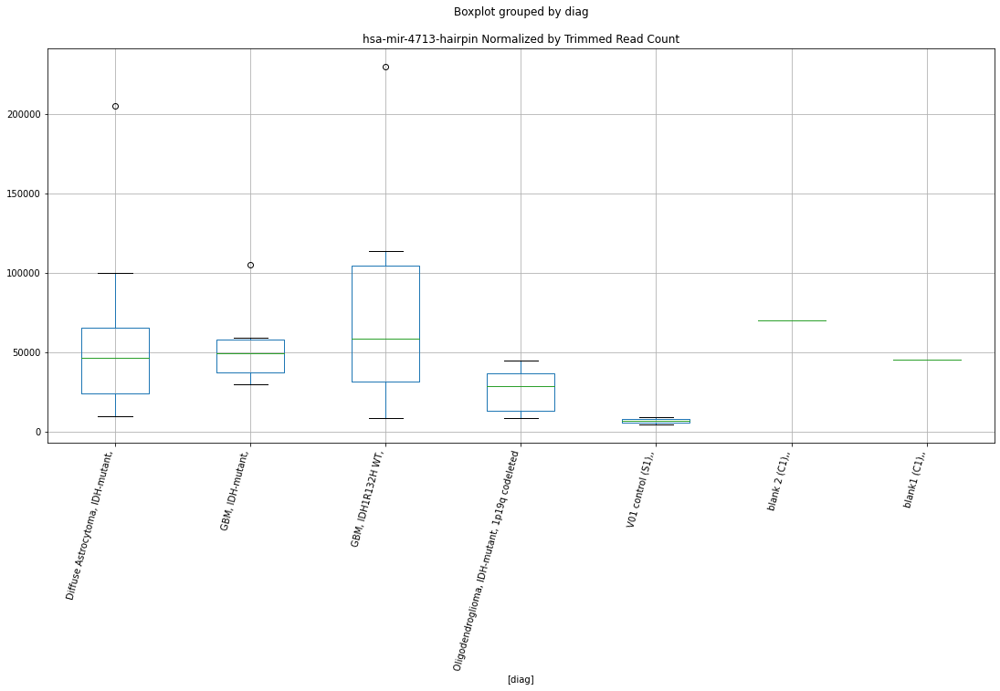

 p : 0.004560167142642467  ( t : 3.2384282070588584 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6850-hairpin
Control and blanks
82         0.000000
346    22516.493858
Name: hsa-mir-6850-hairpin, dtype: float64
214    8136.793604
Name: hsa-mir-6850-hairpin, dtype: float64
478    5936.51209
Name: hsa-mir-6850-hairpin, dtype: float64


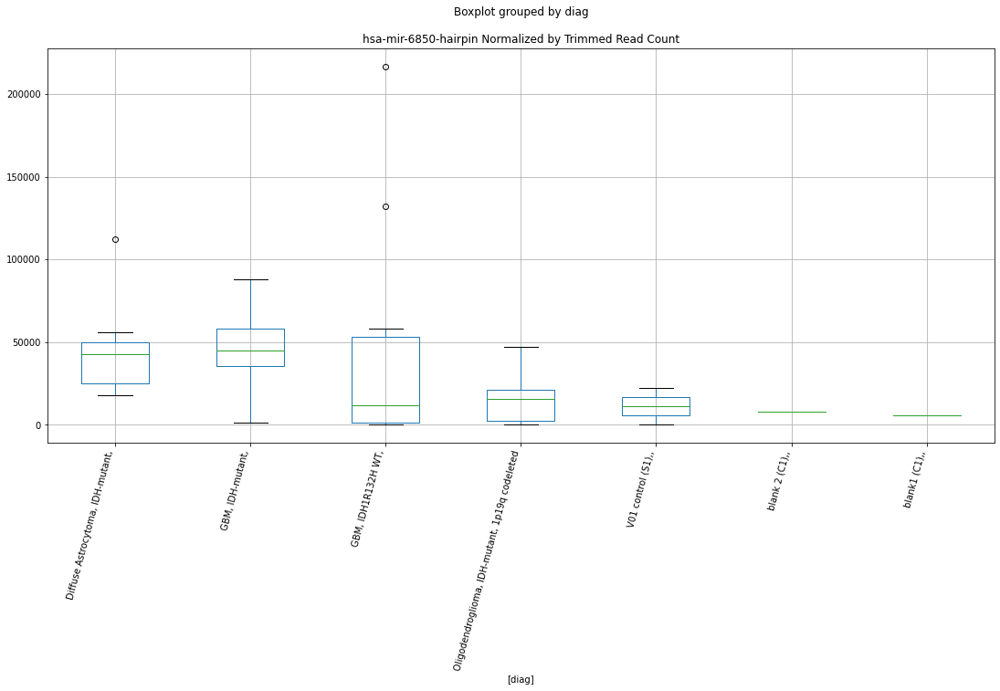

 p : 0.004567814590117807  ( t : 3.237667243777856 ) :  Lexogen  :  bbduk2  :  hsa-mir-4491-hairpin
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-4491-hairpin, dtype: float64
211    0.0
Name: hsa-mir-4491-hairpin, dtype: float64
475    0.0
Name: hsa-mir-4491-hairpin, dtype: float64


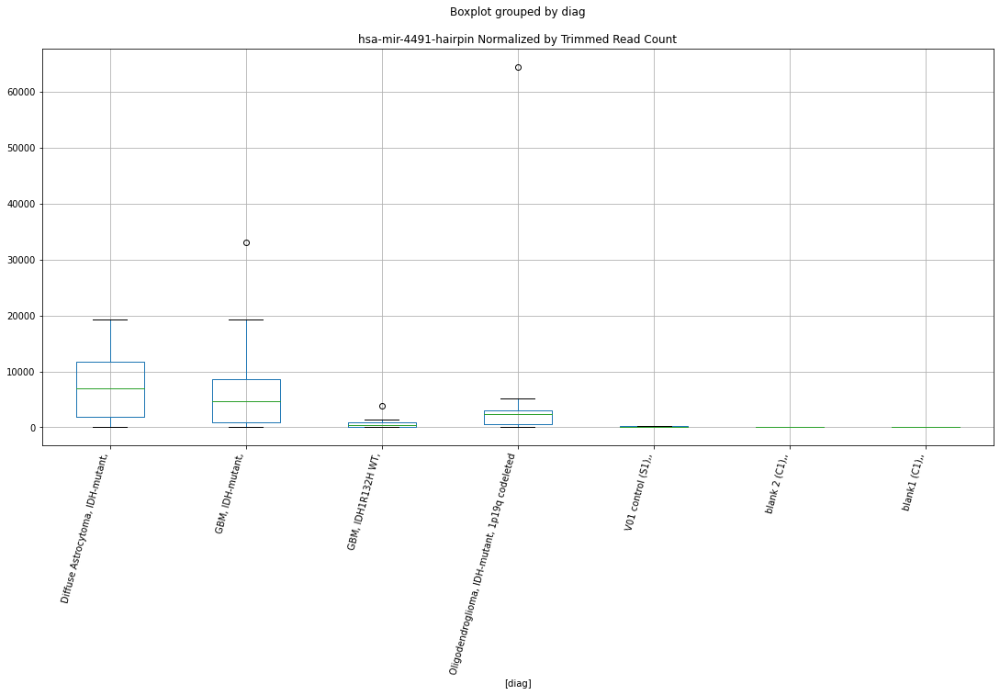

 p : 0.0045858609405420355  ( t : 3.2358764743847295 ) :  Lexogen  :  bbduk2  :  hsa-mir-6786-hairpin
Control and blanks
79     18597.784289
343    17197.459532
Name: hsa-mir-6786-hairpin, dtype: float64
211    11478.866041
Name: hsa-mir-6786-hairpin, dtype: float64
475    10778.208188
Name: hsa-mir-6786-hairpin, dtype: float64


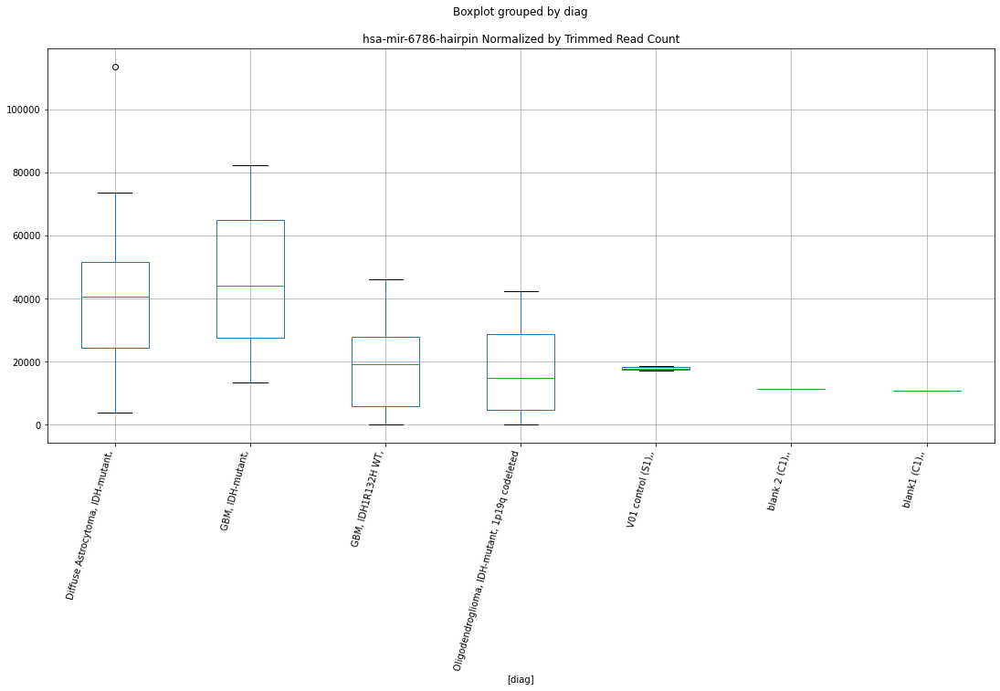

 p : 0.004603686065866517  ( t : 3.234114429809113 ) :  Lexogen  :  bbduk2  :  hsa-mir-11401-hairpin
Control and blanks
79         0.000000
343    12314.230282
Name: hsa-mir-11401-hairpin, dtype: float64
211    0.0
Name: hsa-mir-11401-hairpin, dtype: float64
475    0.0
Name: hsa-mir-11401-hairpin, dtype: float64


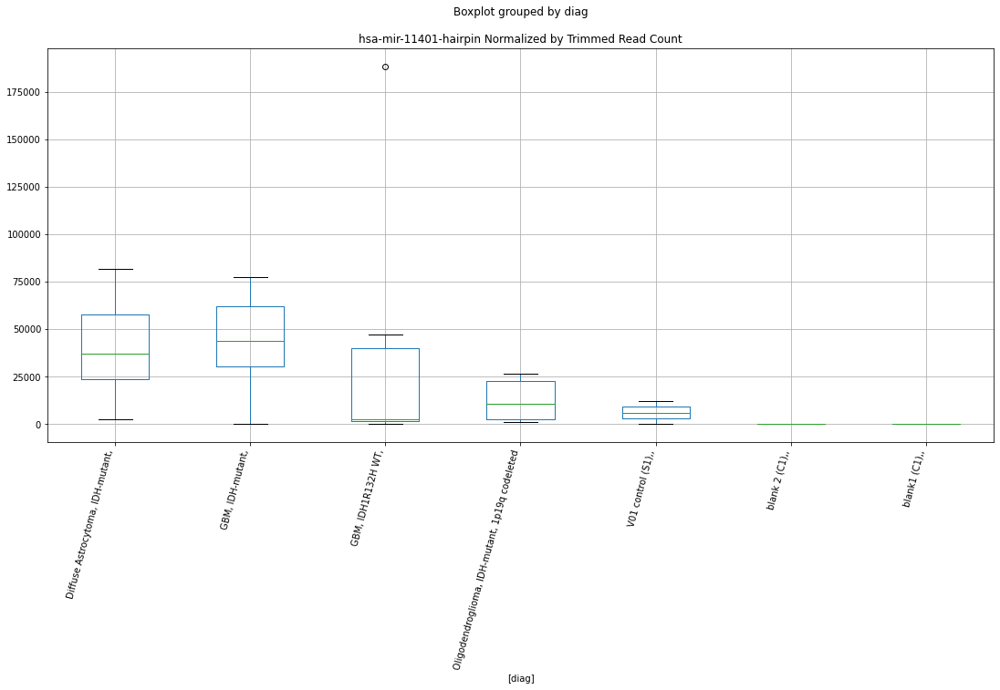

 p : 0.004653595082999483  ( t : 3.2292162002165825 ) :  Lexogen  :  bbduk2  :  hsa-mir-3166-hairpin
Control and blanks
79     1430.598791
343     636.942946
Name: hsa-mir-3166-hairpin, dtype: float64
211    1639.838006
Name: hsa-mir-3166-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-3166-hairpin, dtype: float64


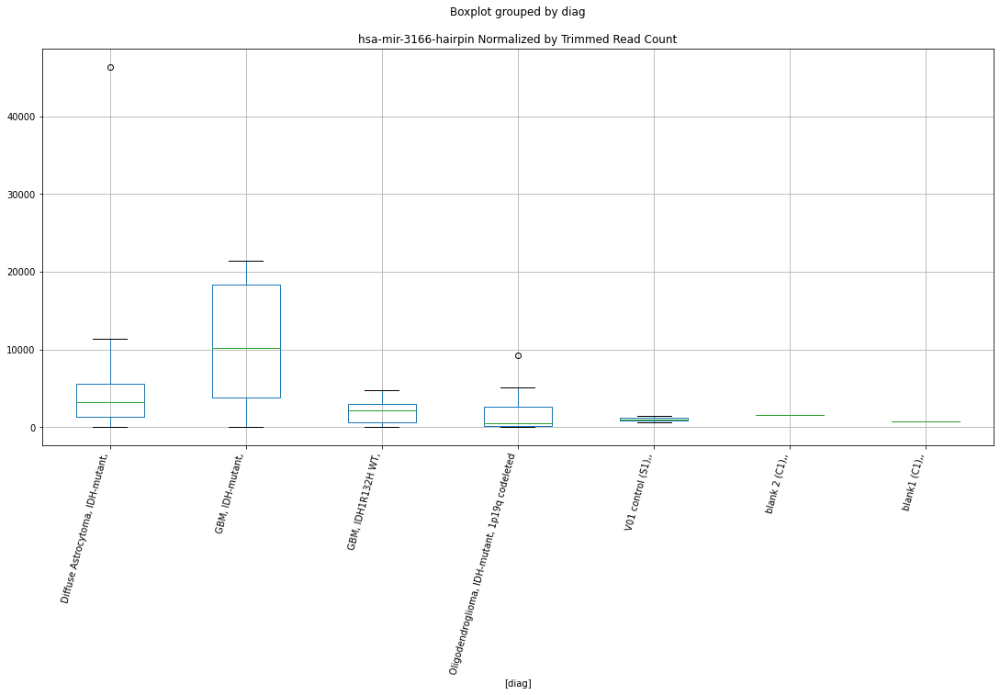

 p : 0.004686514265608995  ( t : 3.2260135202398255 ) :  Lexogen  :  bbduk2  :  hsa-mir-7854-hairpin
Control and blanks
79         0.000000
343    14437.373434
Name: hsa-mir-7854-hairpin, dtype: float64
211    0.0
Name: hsa-mir-7854-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-7854-hairpin, dtype: float64


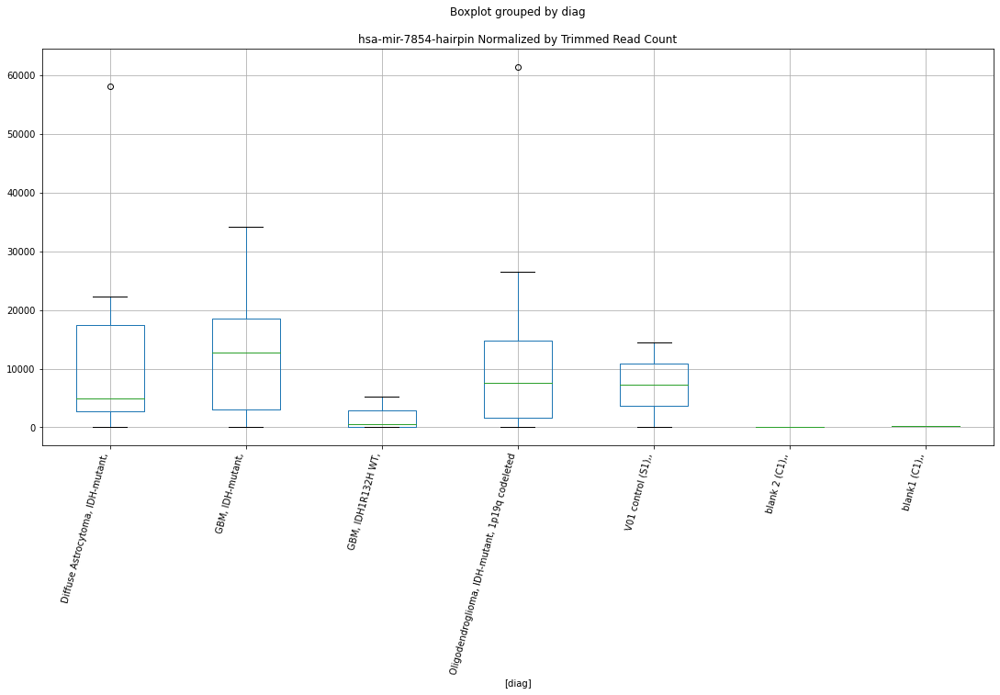

 p : 0.004701133027256858  ( t : 3.2245983391221893 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1263-hairpin
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-1263-hairpin, dtype: float64
214    0.0
Name: hsa-mir-1263-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-1263-hairpin, dtype: float64


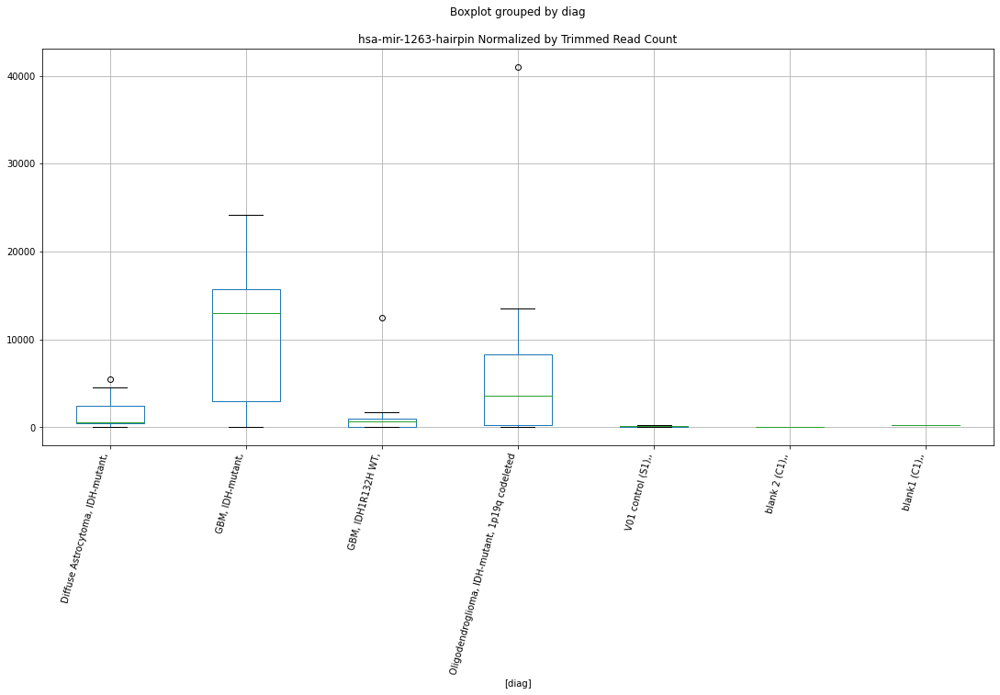

 p : 0.004709574792145653  ( t : 3.2237830908889715 ) :  Lexogen  :  cutadapt2  :  hsa-mir-493-5p-mature
Control and blanks
82       0.000000
346    420.869044
Name: hsa-mir-493-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-493-5p-mature, dtype: float64
478    5699.051607
Name: hsa-mir-493-5p-mature, dtype: float64


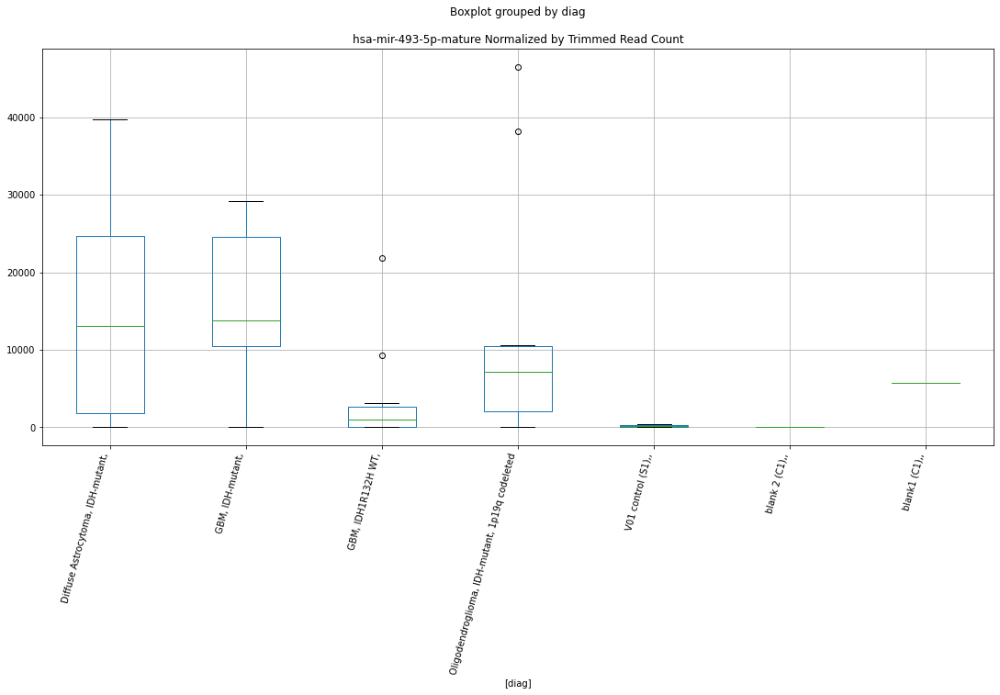

 p : 0.004756527562172346  ( t : 3.2192746897099327 ) :  Lexogen  :  bbduk2  :  hsa-mir-122-5p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-122-5p-mature, dtype: float64
211    0.0
Name: hsa-mir-122-5p-mature, dtype: float64
475    239.515738
Name: hsa-mir-122-5p-mature, dtype: float64


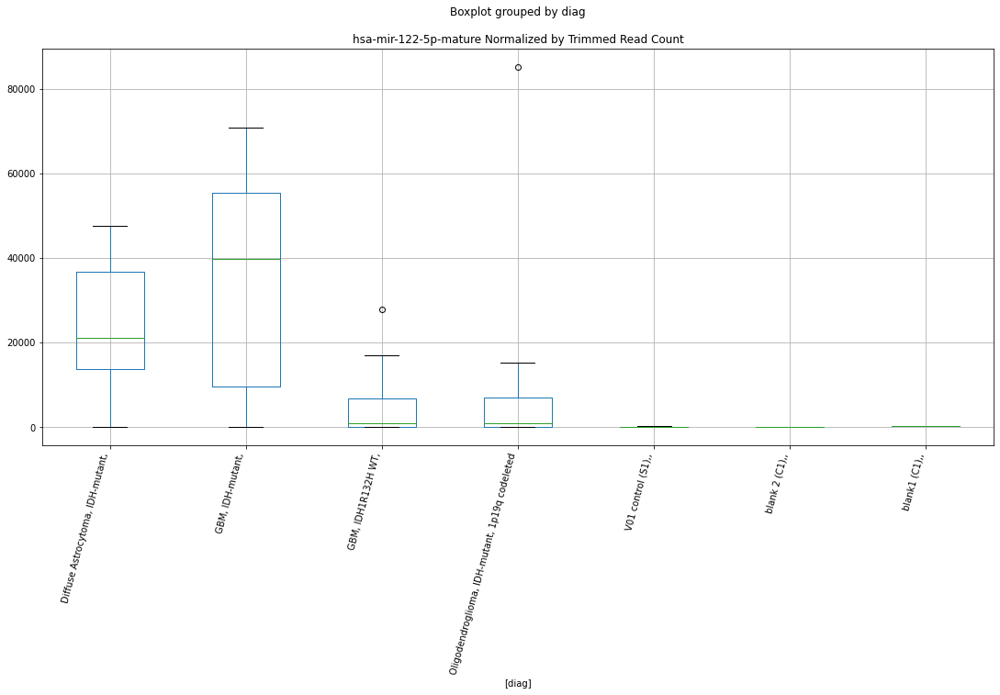

 p : 0.0047693602536653884  ( t : 3.2180500853661913 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122-hairpin
Control and blanks
82      2840.102244
346    21885.190292
Name: hsa-mir-122-hairpin, dtype: float64
214    4068.396802
Name: hsa-mir-122-hairpin, dtype: float64
478    4986.670156
Name: hsa-mir-122-hairpin, dtype: float64


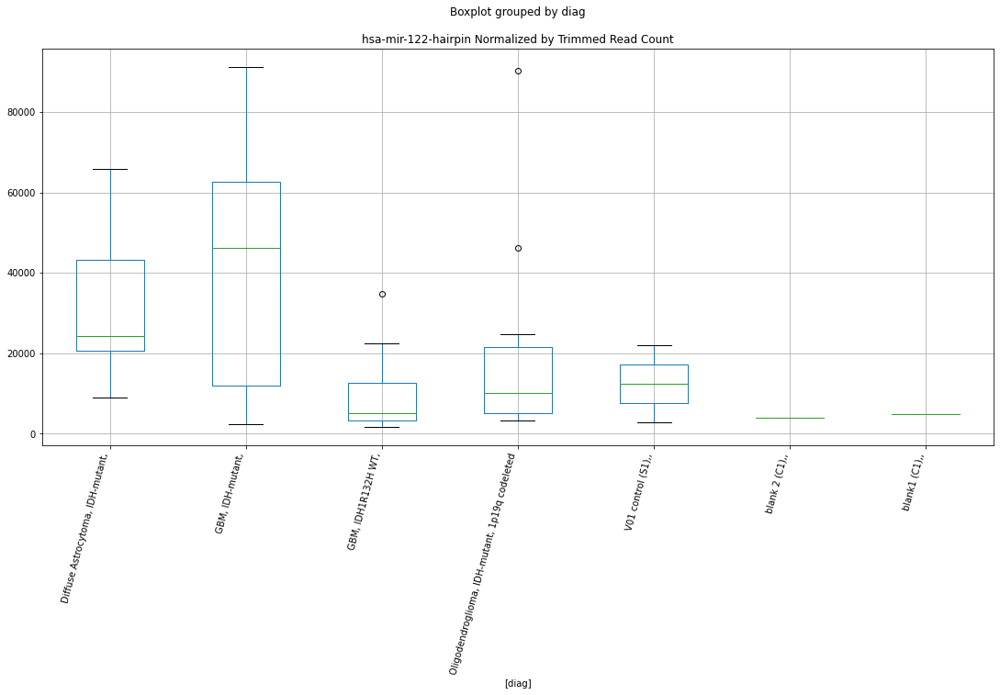

 p : 0.00479008613998698  ( t : 3.2160790487456636 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6786-hairpin
Control and blanks
82     18460.664584
346    17045.196285
Name: hsa-mir-6786-hairpin, dtype: float64
214    11120.284592
Name: hsa-mir-6786-hairpin, dtype: float64
478    10685.721762
Name: hsa-mir-6786-hairpin, dtype: float64


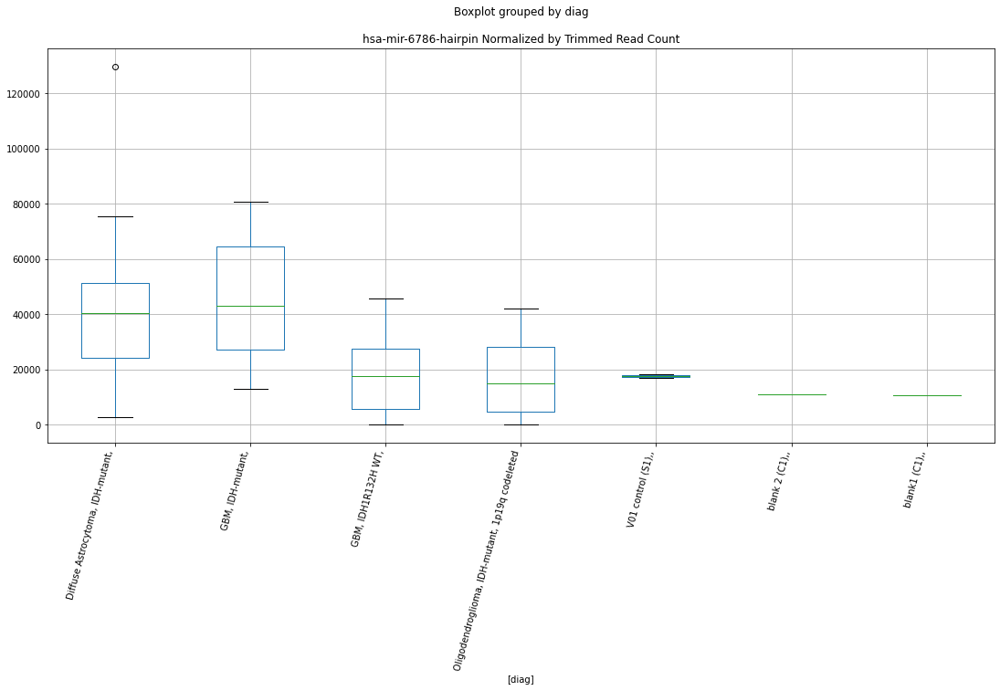

 p : 0.004796868321126092  ( t : 3.215435876393466 ) :  D-plex  :  bbduk2  :  hsa-mir-4296-hairpin
Control and blanks
73     27055.294064
337     2670.471792
Name: hsa-mir-4296-hairpin, dtype: float64
205    48712.739008
Name: hsa-mir-4296-hairpin, dtype: float64
469    27210.25661
Name: hsa-mir-4296-hairpin, dtype: float64


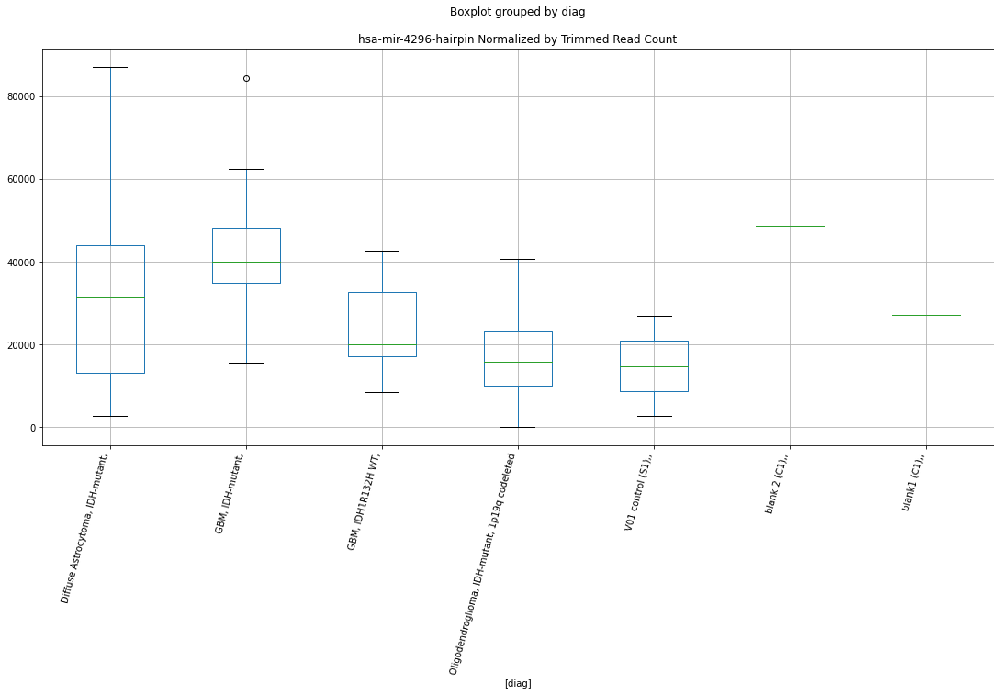

 p : 0.004806390871719768  ( t : 3.2145343299181146 ) :  Lexogen  :  bbduk2  :  hsa-mir-493-5p-mature
Control and blanks
79       0.00000
343    424.62863
Name: hsa-mir-493-5p-mature, dtype: float64
211    0.0
Name: hsa-mir-493-5p-mature, dtype: float64
475    5748.3777
Name: hsa-mir-493-5p-mature, dtype: float64


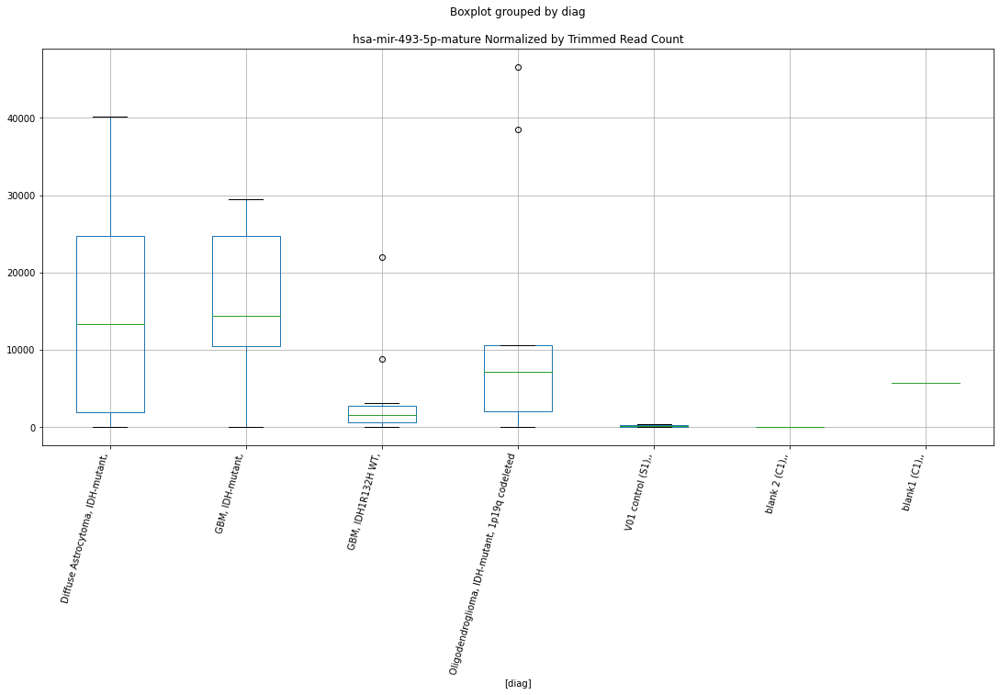

 p : 0.004812898952681653  ( t : 3.2139191844062776 ) :  Lexogen  :  cutadapt2  :  hsa-mir-7854-hairpin
Control and blanks
82         0.000000
346    14099.112976
Name: hsa-mir-7854-hairpin, dtype: float64
214    0.0
Name: hsa-mir-7854-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-7854-hairpin, dtype: float64


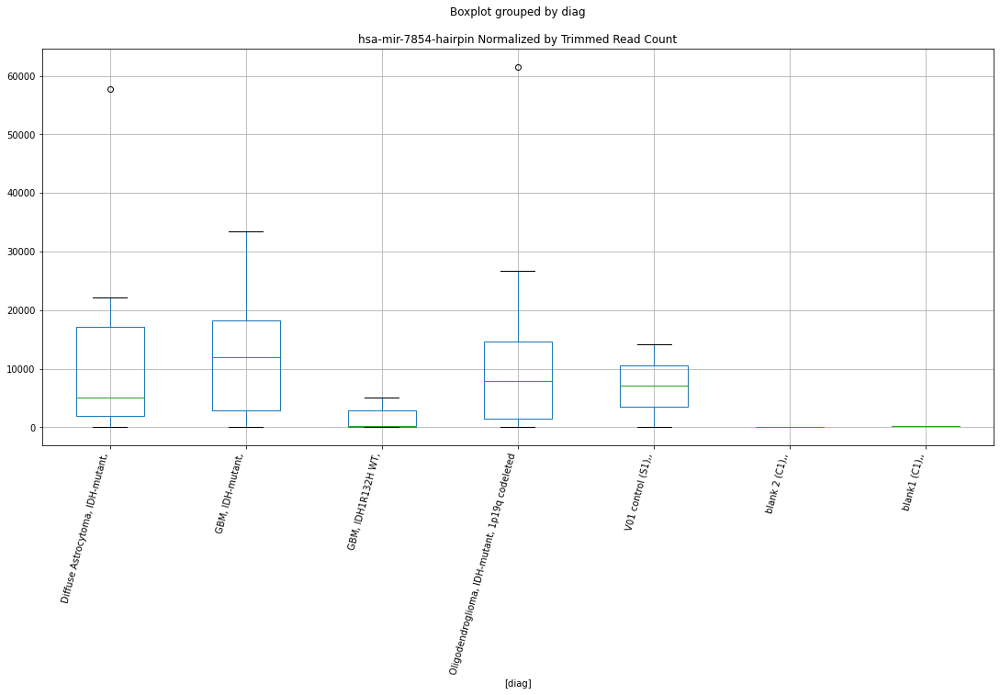

 p : 0.004851709871630249  ( t : 3.2102676044904705 ) :  Lexogen  :  bbduk2  :  hsa-mir-122-5p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-122-5p-mature, dtype: float64
211    0.0
Name: hsa-mir-122-5p-mature, dtype: float64
475    239.515738
Name: hsa-mir-122-5p-mature, dtype: float64


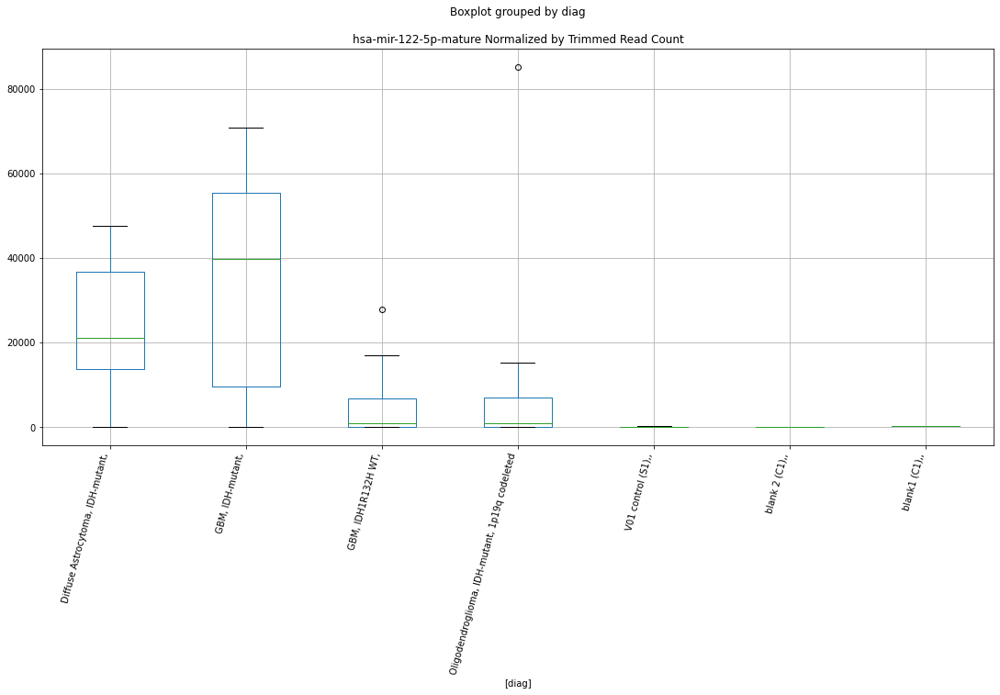

 p : 0.0048558814425855605  ( t : 3.2098768212387814 ) :  Lexogen  :  cutadapt2  :  hsa-mir-219b-5p-mature
Control and blanks
82        0.000000
346    5471.297573
Name: hsa-mir-219b-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-219b-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-219b-5p-mature, dtype: float64


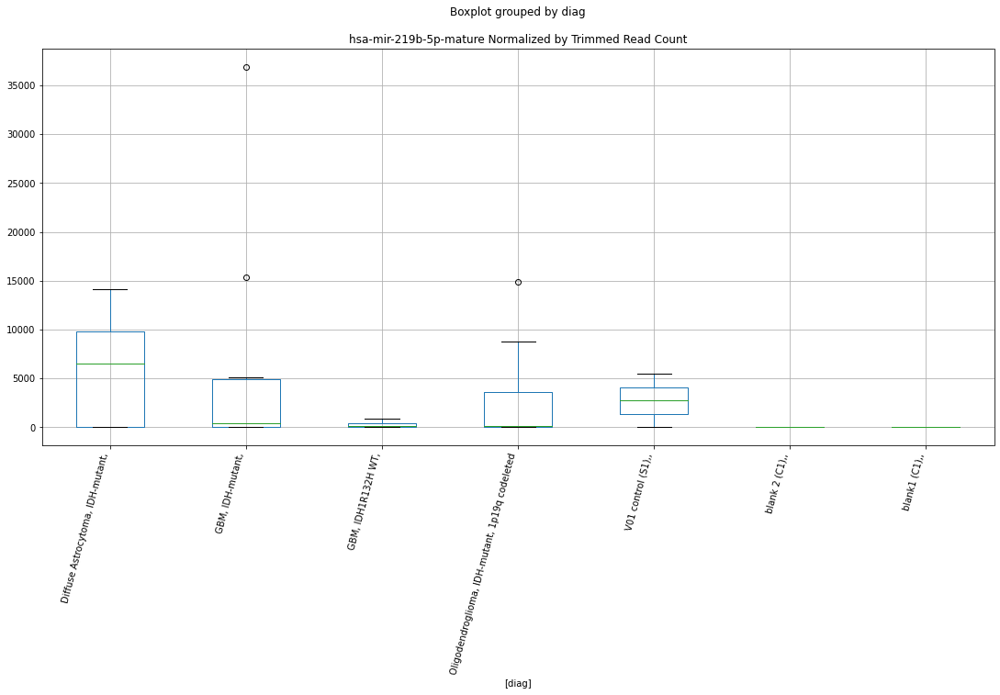

 p : 0.0048806339561821635  ( t : 3.207564806539963 ) :  D-plex  :  cutadapt2  :  hsa-mir-564-hairpin
Control and blanks
76     39395.939036
340    35229.285400
Name: hsa-mir-564-hairpin, dtype: float64
208    67722.323659
Name: hsa-mir-564-hairpin, dtype: float64
472    30631.659496
Name: hsa-mir-564-hairpin, dtype: float64


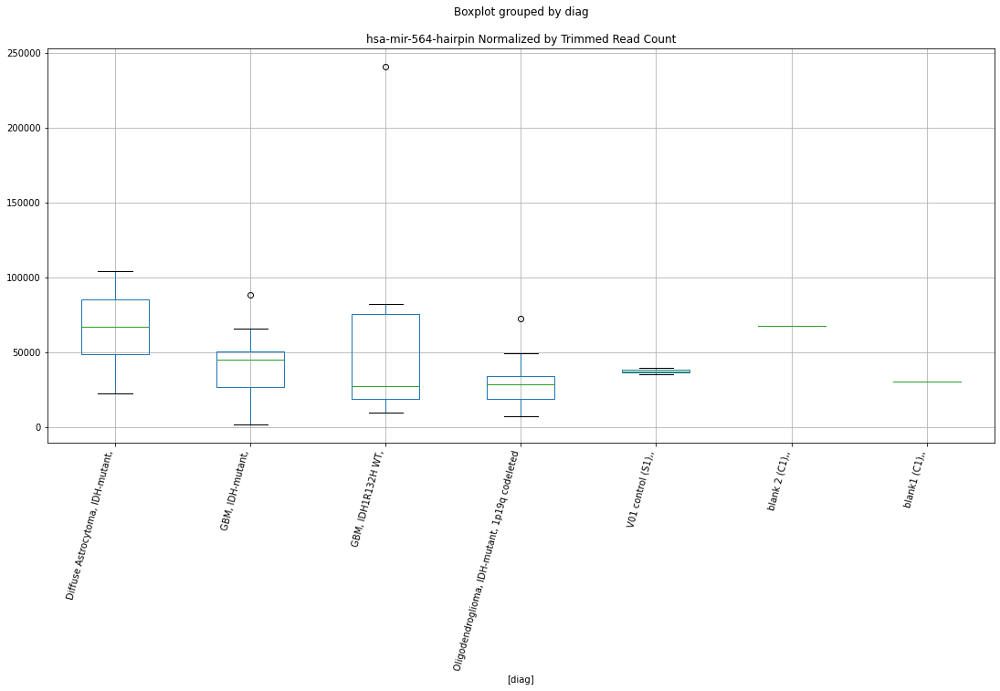

 p : 0.004885832454251493  ( t : 3.2070806994257626 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122-5p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-122-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-122-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-122-5p-mature, dtype: float64


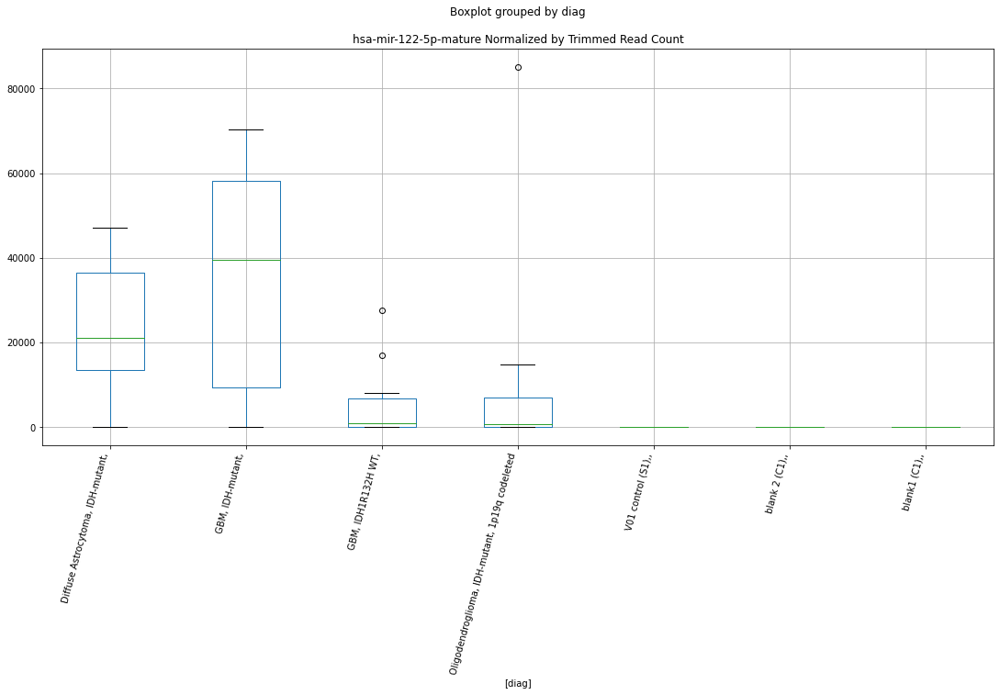

 p : 0.004886535968756091  ( t : 3.207015223815086 ) :  D-plex  :  cutadapt2  :  hsa-mir-4296-hairpin
Control and blanks
76     37123.096400
340      880.732135
Name: hsa-mir-4296-hairpin, dtype: float64
208    47088.178169
Name: hsa-mir-4296-hairpin, dtype: float64
472    24852.101101
Name: hsa-mir-4296-hairpin, dtype: float64


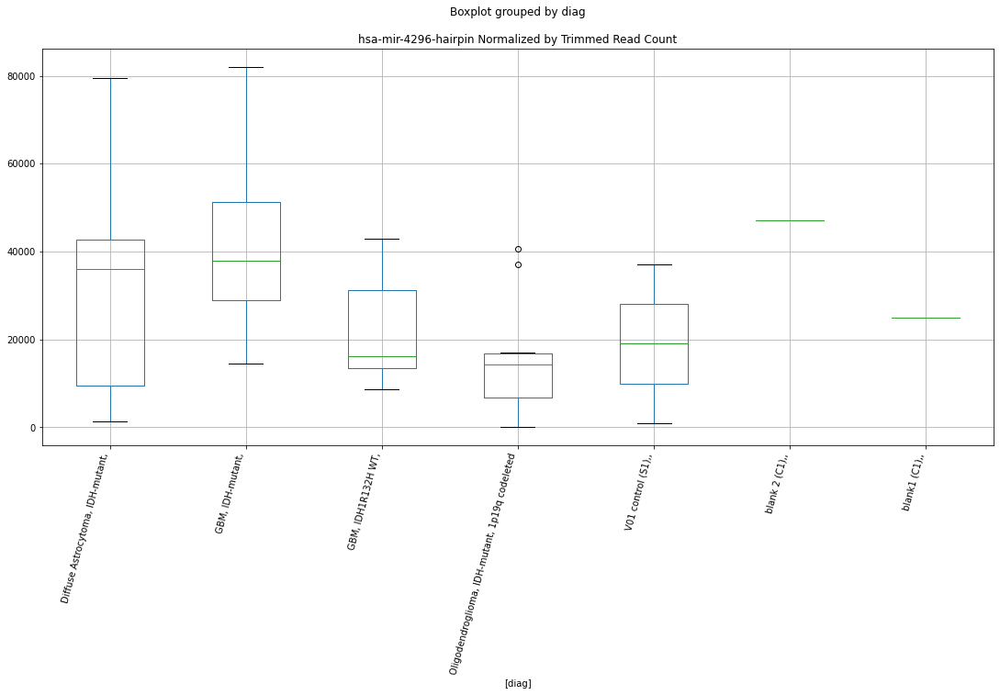

 p : 0.004901534855005934  ( t : 3.2056214806065544 ) :  D-plex  :  bbduk2  :  hsa-mir-3667-hairpin
Control and blanks
73     157693.713973
337     25814.560658
Name: hsa-mir-3667-hairpin, dtype: float64
205    75218.199939
Name: hsa-mir-3667-hairpin, dtype: float64
469    97010.480089
Name: hsa-mir-3667-hairpin, dtype: float64


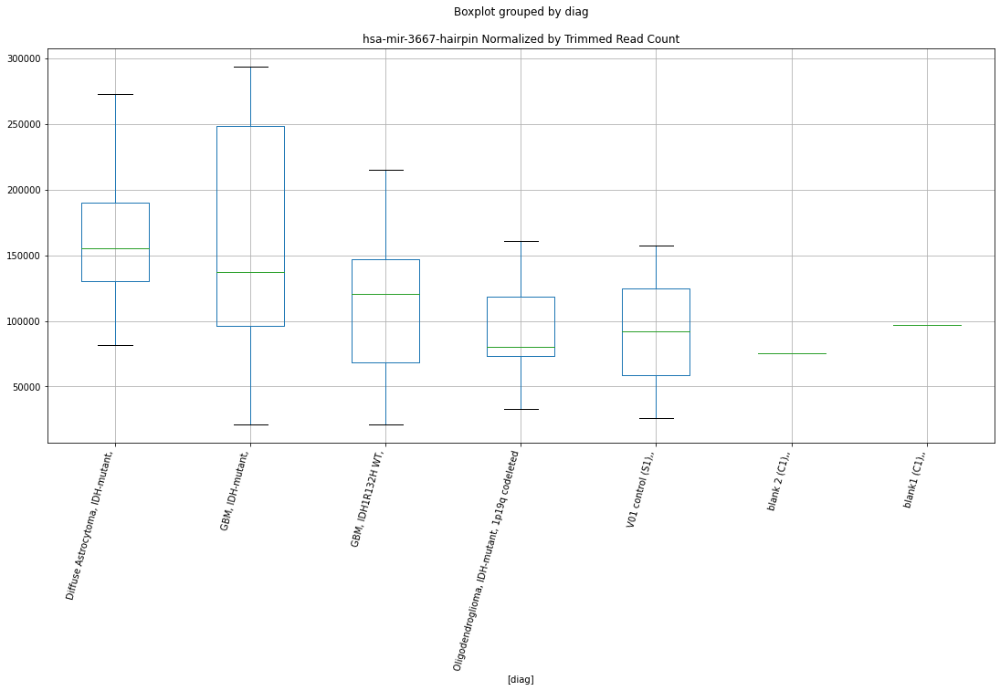

 p : 0.004932727920620624  ( t : 3.2027362540113997 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4491-hairpin
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-4491-hairpin, dtype: float64
214    0.0
Name: hsa-mir-4491-hairpin, dtype: float64
478    0.0
Name: hsa-mir-4491-hairpin, dtype: float64


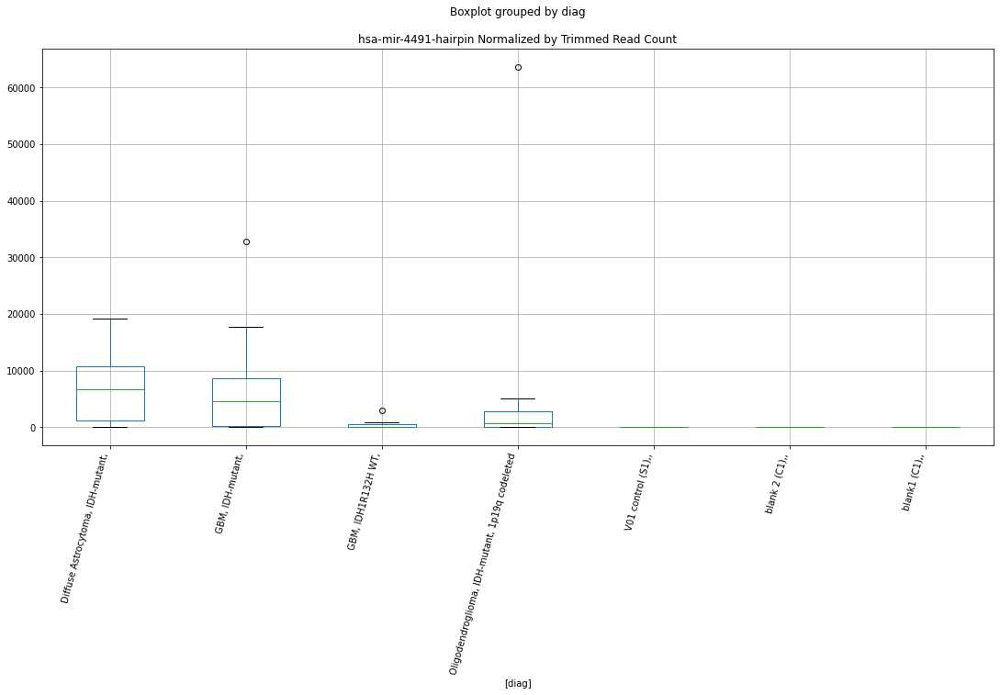

 p : 0.0050346457897849275  ( t : 3.193432316869055 ) :  Lexogen  :  bbduk2  :  hsa-mir-8088-hairpin
Control and blanks
79     2861.197583
343    1273.885891
Name: hsa-mir-8088-hairpin, dtype: float64
211    4372.901349
Name: hsa-mir-8088-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-8088-hairpin, dtype: float64


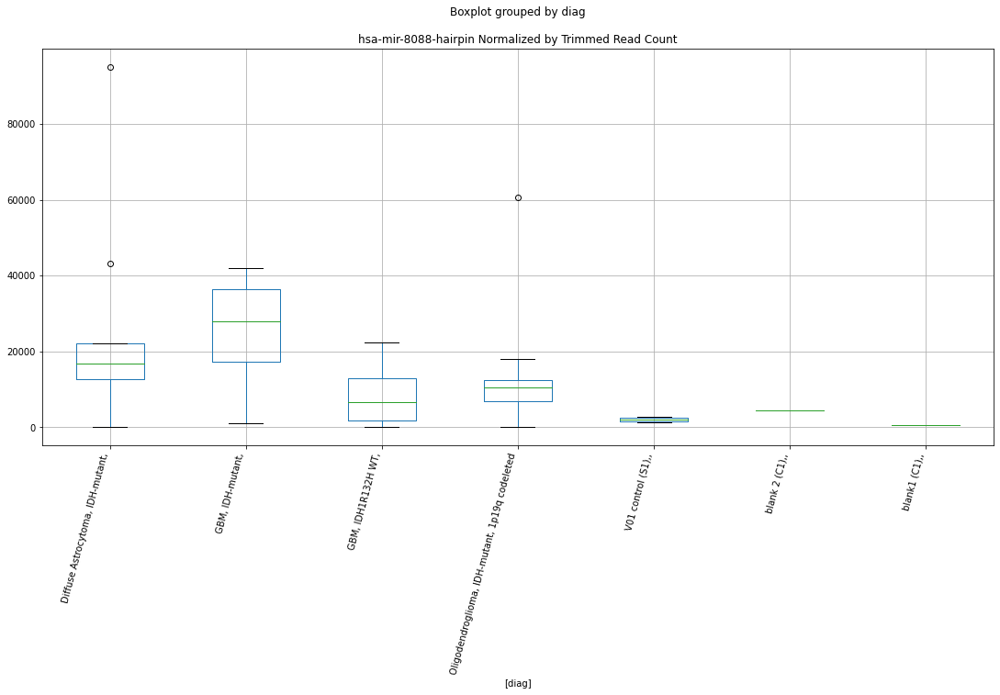

 p : 0.005077723845579882  ( t : 3.18955511238308 ) :  D-plex  :  bbduk2  :  hsa-mir-6733-3p-mature
Control and blanks
73     15460.168037
337     9791.729905
Name: hsa-mir-6733-3p-mature, dtype: float64
205    10387.27523
Name: hsa-mir-6733-3p-mature, dtype: float64
469    39040.802963
Name: hsa-mir-6733-3p-mature, dtype: float64


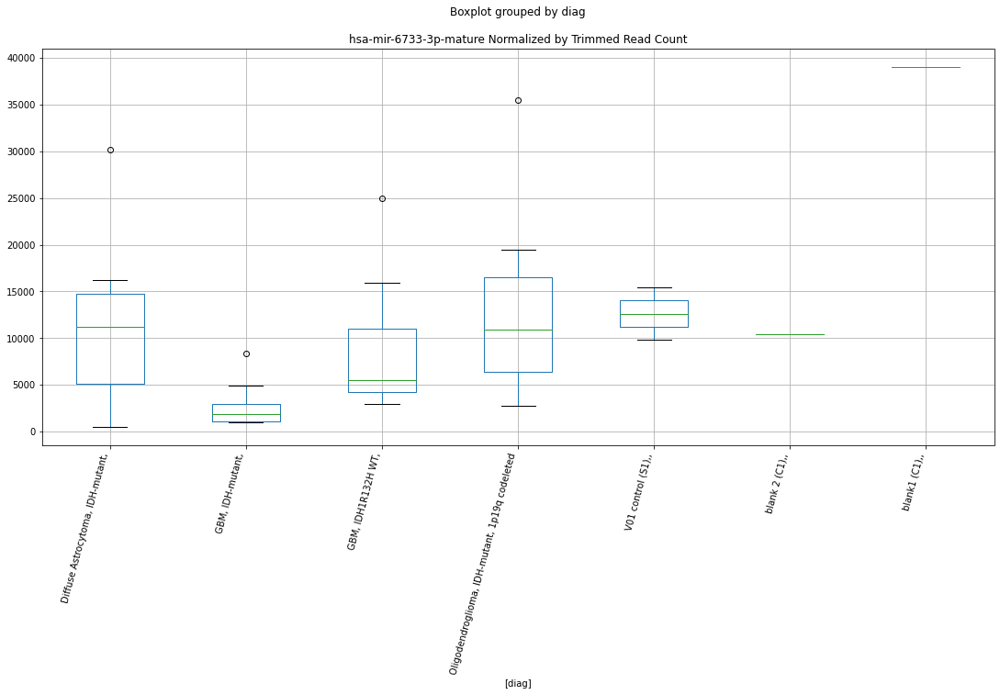

 p : 0.005111365747418815  ( t : 3.186549529630829 ) :  D-plex  :  bbduk2  :  hsa-mir-1343-5p-mature
Control and blanks
73     5411.058813
337    1780.314528
Name: hsa-mir-1343-5p-mature, dtype: float64
205    18983.640937
Name: hsa-mir-1343-5p-mature, dtype: float64
469    10647.491717
Name: hsa-mir-1343-5p-mature, dtype: float64


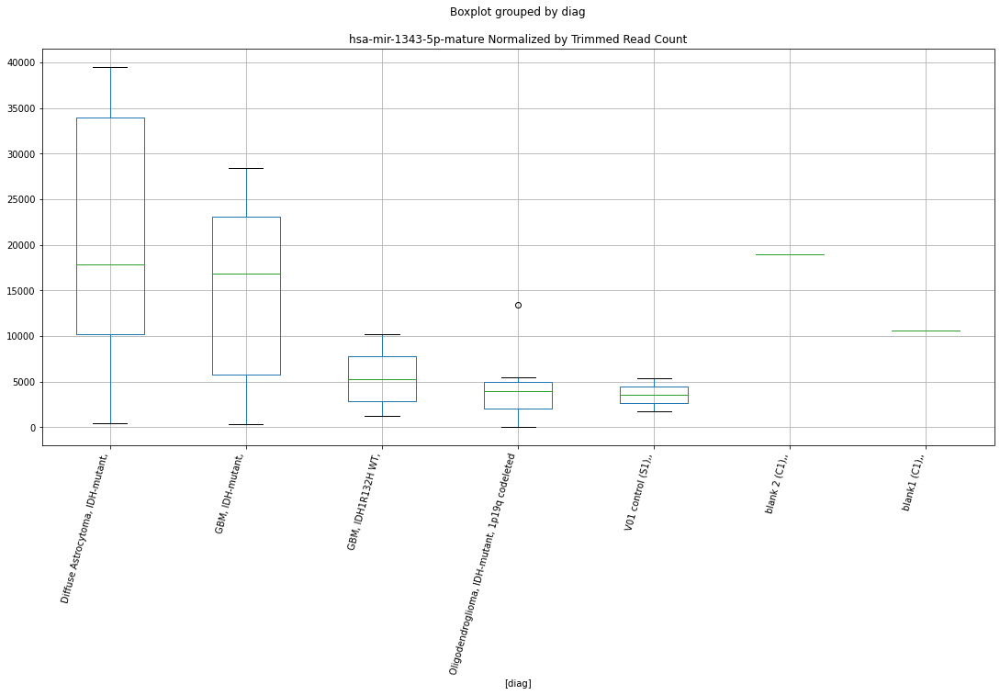

 p : 0.0051328541107238295  ( t : 3.184639867196645 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3166-hairpin
Control and blanks
82     1420.051122
346       0.000000
Name: hsa-mir-3166-hairpin, dtype: float64
214    1898.585174
Name: hsa-mir-3166-hairpin, dtype: float64
478    474.920967
Name: hsa-mir-3166-hairpin, dtype: float64


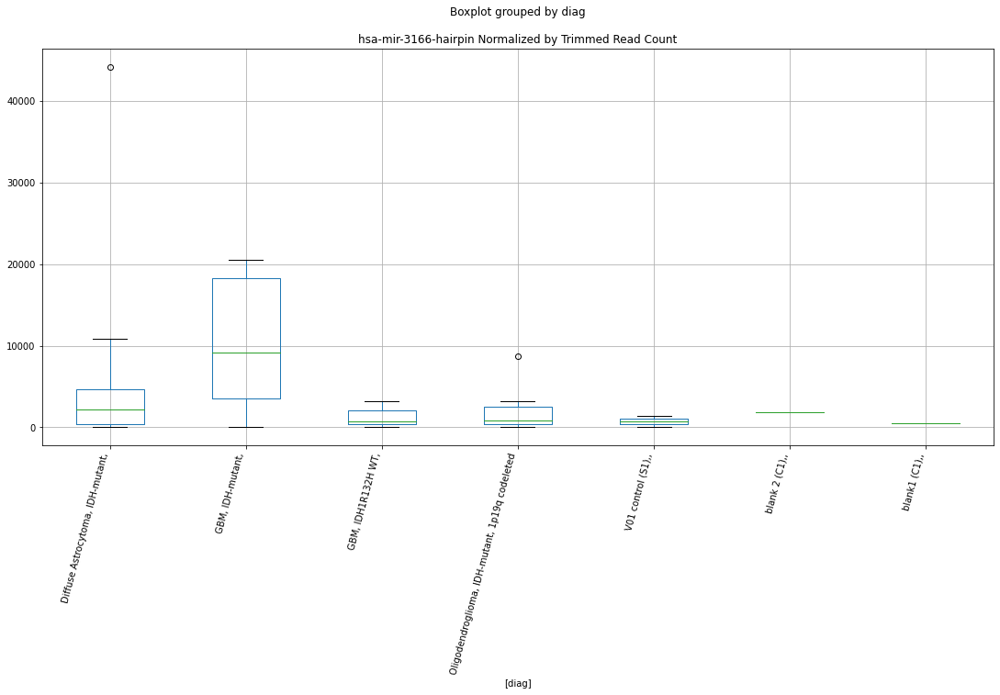

 p : 0.005135583819821386  ( t : 3.184397839379857 ) :  D-plex  :  cutadapt2  :  hsa-mir-3667-hairpin
Control and blanks
76     155310.913508
340     25541.231915
Name: hsa-mir-3667-hairpin, dtype: float64
208    78480.296948
Name: hsa-mir-3667-hairpin, dtype: float64
472    98252.492724
Name: hsa-mir-3667-hairpin, dtype: float64


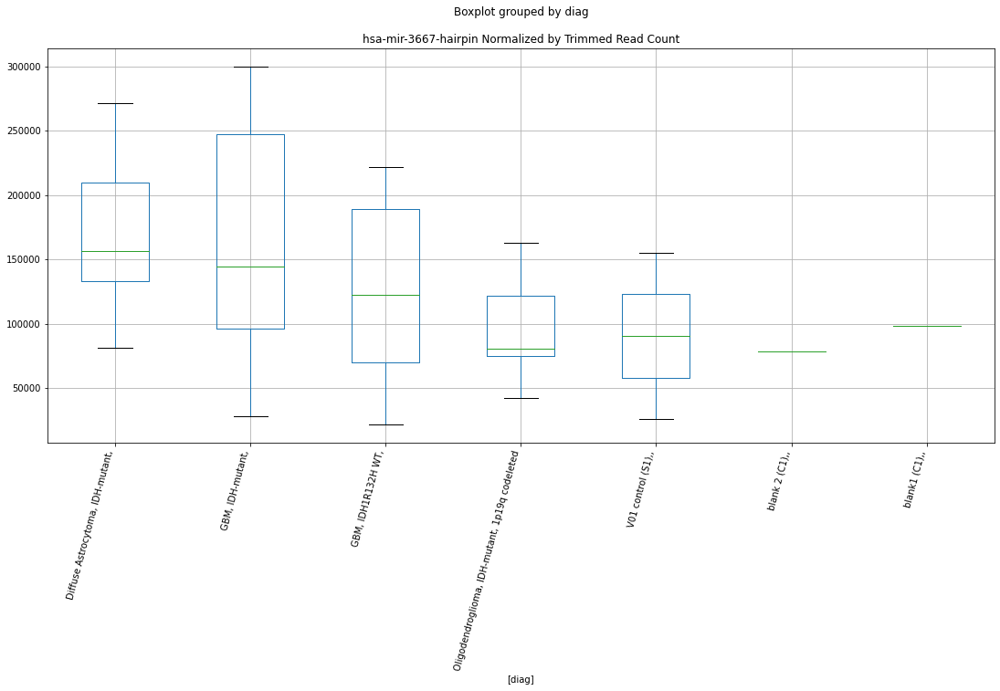

 p : 0.005277784366690491  ( t : 3.1719607216958527 ) :  Lexogen  :  cutadapt2  :  hsa-mir-219b-hairpin
Control and blanks
82         0.000000
346    19359.976027
Name: hsa-mir-219b-hairpin, dtype: float64
214    0.0
Name: hsa-mir-219b-hairpin, dtype: float64
478    10923.182246
Name: hsa-mir-219b-hairpin, dtype: float64


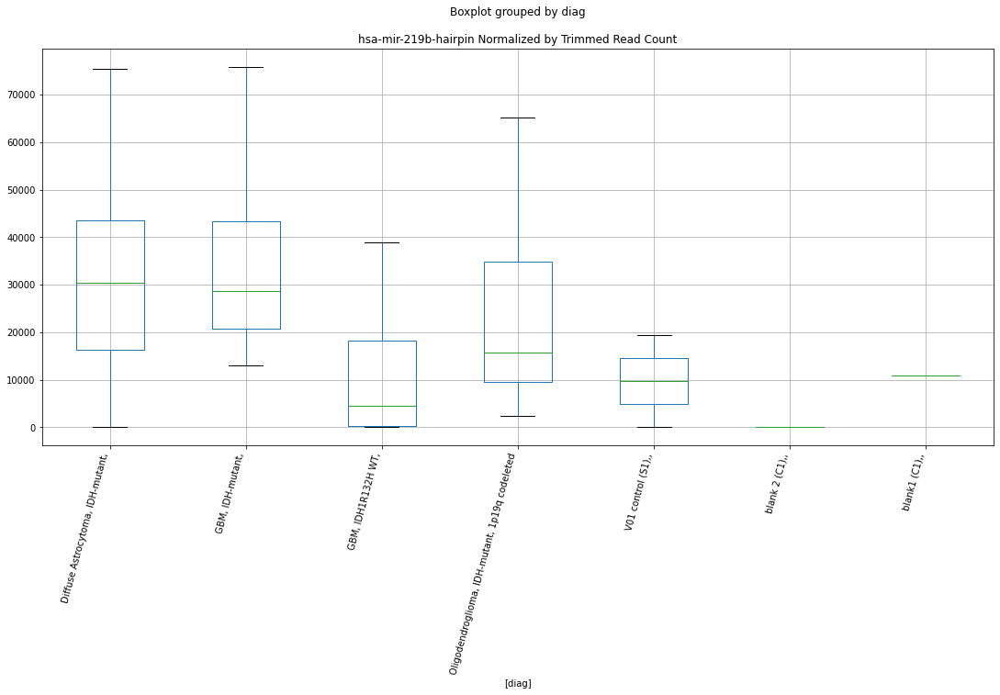

 p : 0.005302141318963059  ( t : 3.1698633591429393 ) :  D-plex  :  bbduk2  :  hsa-mir-129-2-hairpin
Control and blanks
73     21644.235251
337    31155.504243
Name: hsa-mir-129-2-hairpin, dtype: float64
205    28117.279501
Name: hsa-mir-129-2-hairpin, dtype: float64
469    39632.33028
Name: hsa-mir-129-2-hairpin, dtype: float64


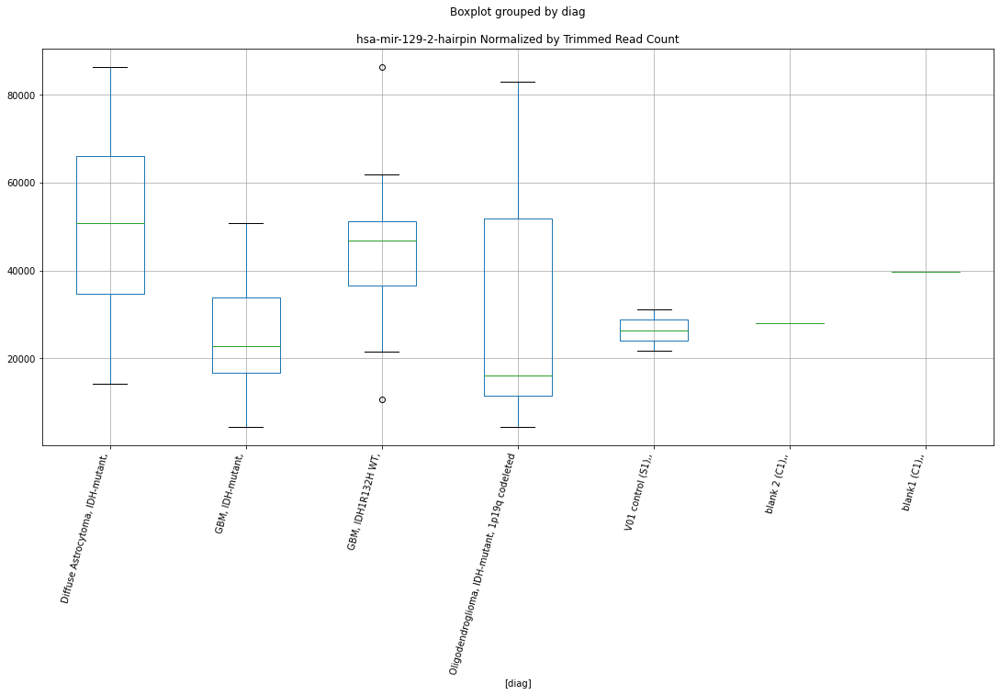

 p : 0.005321884848007053  ( t : 3.168170160178327 ) :  D-plex  :  bbduk2  :  hsa-mir-6818-hairpin
Control and blanks
73     39423.428493
337    40057.076884
Name: hsa-mir-6818-hairpin, dtype: float64
205    13431.821418
Name: hsa-mir-6818-hairpin, dtype: float64
469    19520.401481
Name: hsa-mir-6818-hairpin, dtype: float64


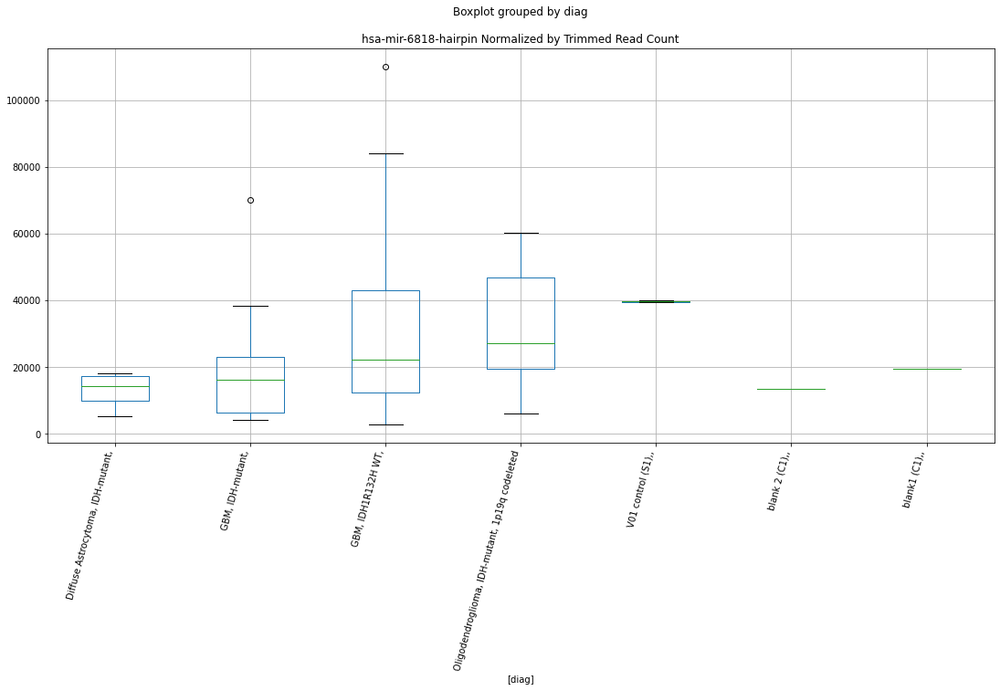

 p : 0.0053228556185249635  ( t : 3.1680870657574465 ) :  D-plex  :  cutadapt2  :  hsa-mir-29c-hairpin
Control and blanks
76      7576.142122
340    49320.999561
Name: hsa-mir-29c-hairpin, dtype: float64
208    51497.183616
Name: hsa-mir-29c-hairpin, dtype: float64
472    21384.366063
Name: hsa-mir-29c-hairpin, dtype: float64


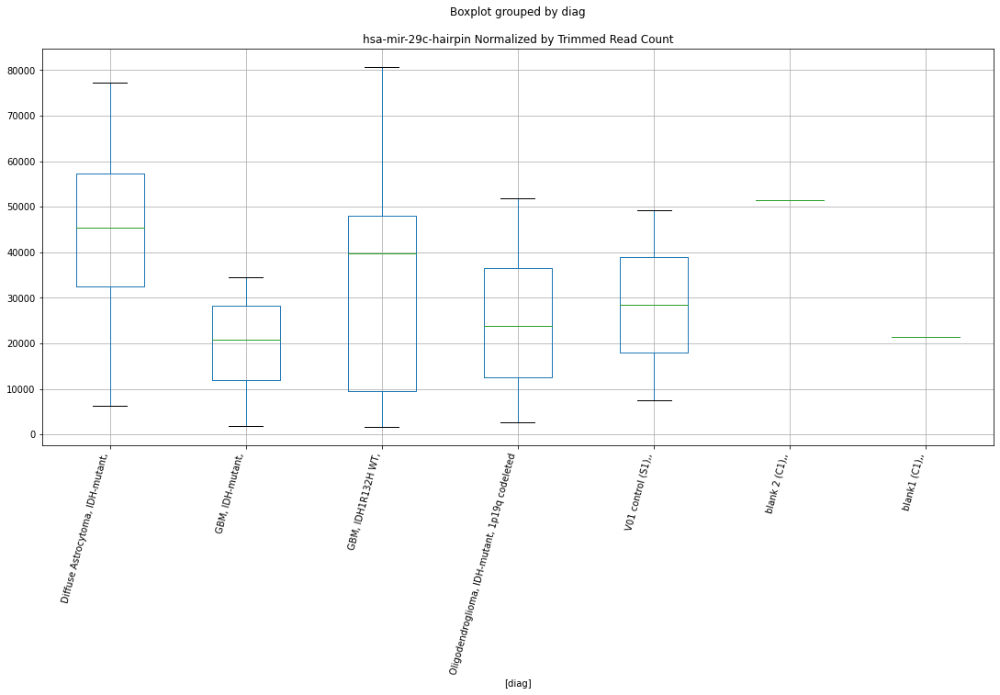

 p : 0.005338500792539573  ( t : 3.166749936333392 ) :  D-plex  :  bbduk2  :  hsa-mir-8078-mature
Control and blanks
73     30147.327671
337        0.000000
Name: hsa-mir-8078-mature, dtype: float64
205    1970.000475
Name: hsa-mir-8078-mature, dtype: float64
469    1183.054635
Name: hsa-mir-8078-mature, dtype: float64


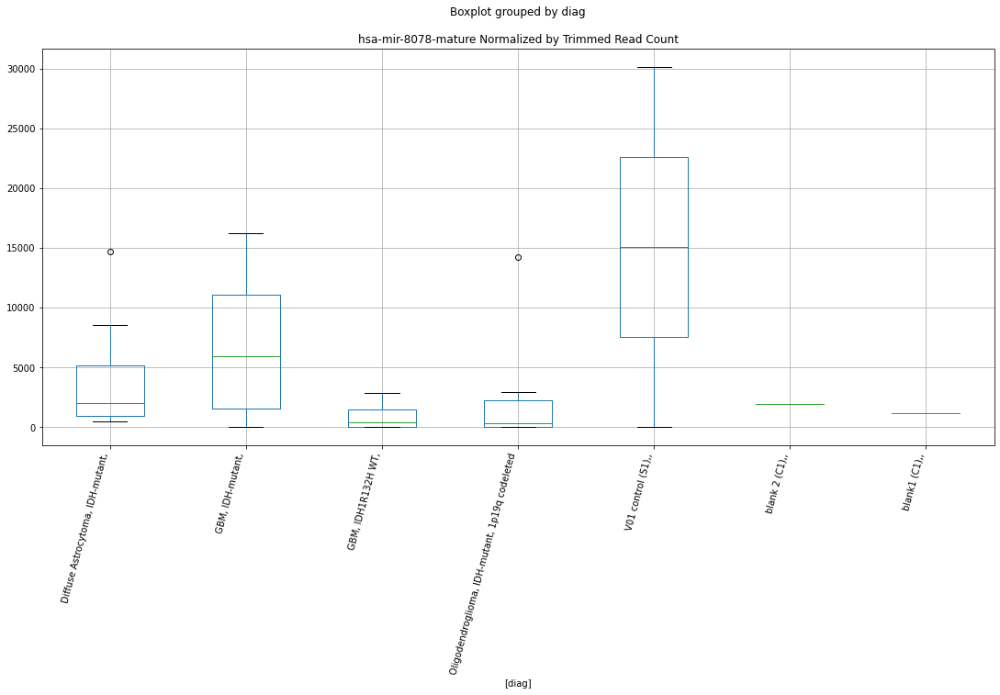

 p : 0.005390858065524285  ( t : 3.1623028810778933 ) :  Lexogen  :  bbduk2  :  hsa-mir-1278-hairpin
Control and blanks
79        0.000000
343    1061.571576
Name: hsa-mir-1278-hairpin, dtype: float64
211    8199.190029
Name: hsa-mir-1278-hairpin, dtype: float64
475    0.0
Name: hsa-mir-1278-hairpin, dtype: float64


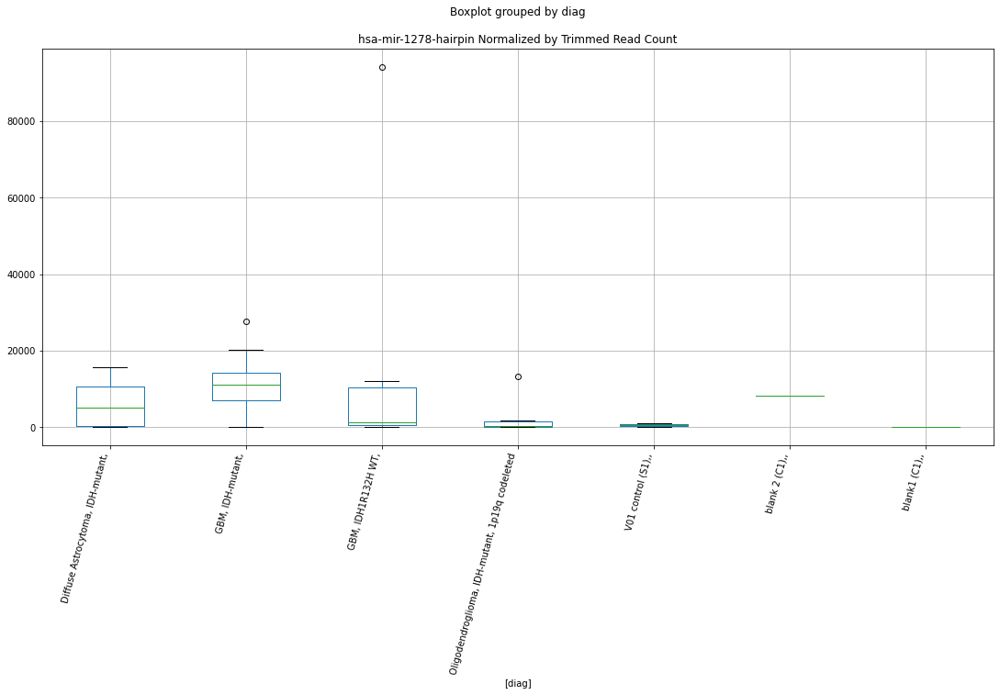

 p : 0.005411189210548118  ( t : 3.160587395778221 ) :  D-plex  :  bbduk2  :  hsa-mir-1343-5p-mature
Control and blanks
73     5411.058813
337    1780.314528
Name: hsa-mir-1343-5p-mature, dtype: float64
205    18983.640937
Name: hsa-mir-1343-5p-mature, dtype: float64
469    10647.491717
Name: hsa-mir-1343-5p-mature, dtype: float64


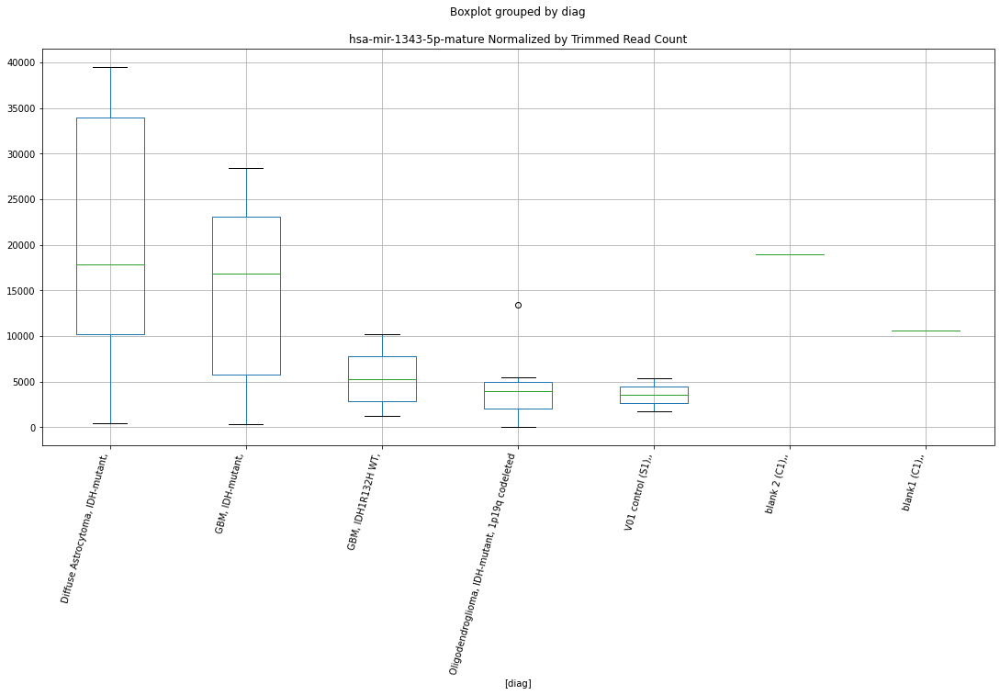

 p : 0.00542704447770997  ( t : 3.159253940862934 ) :  D-plex  :  cutadapt2  :  hsa-mir-891a-5p-mature
Control and blanks
76     0.0
340    0.0
Name: hsa-mir-891a-5p-mature, dtype: float64
208    5643.526972
Name: hsa-mir-891a-5p-mature, dtype: float64
472    10981.160951
Name: hsa-mir-891a-5p-mature, dtype: float64


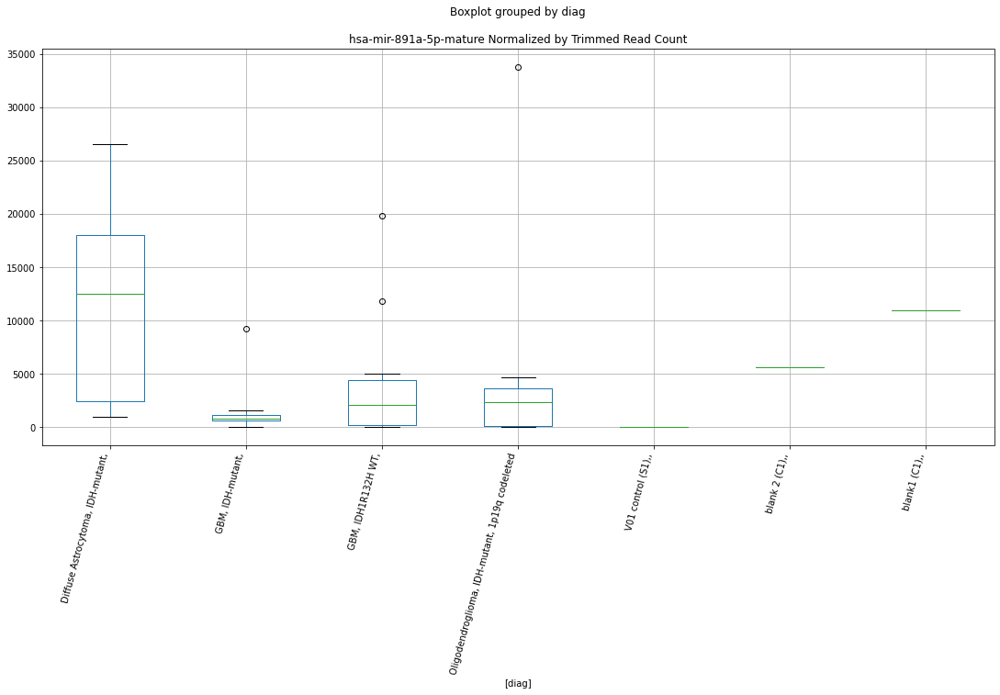

 p : 0.005427396219197341  ( t : 3.1592244020143645 ) :  Lexogen  :  bbduk2  :  hsa-mir-6780b-hairpin
Control and blanks
79      1430.598791
343    14225.059119
Name: hsa-mir-6780b-hairpin, dtype: float64
211    5192.820352
Name: hsa-mir-6780b-hairpin, dtype: float64
475    0.0
Name: hsa-mir-6780b-hairpin, dtype: float64


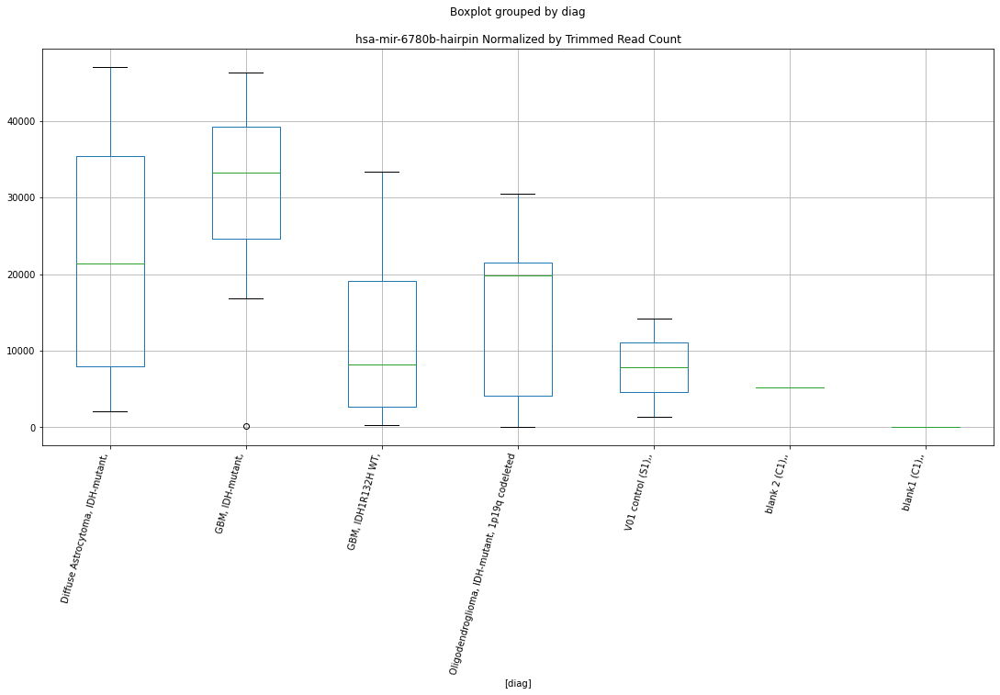

 p : 0.005439588311200031  ( t : 3.15820167919097 ) :  Lexogen  :  cutadapt2  :  hsa-mir-8088-hairpin
Control and blanks
82     1420.051122
346     420.869044
Name: hsa-mir-8088-hairpin, dtype: float64
214    3525.943895
Name: hsa-mir-8088-hairpin, dtype: float64
478    0.0
Name: hsa-mir-8088-hairpin, dtype: float64


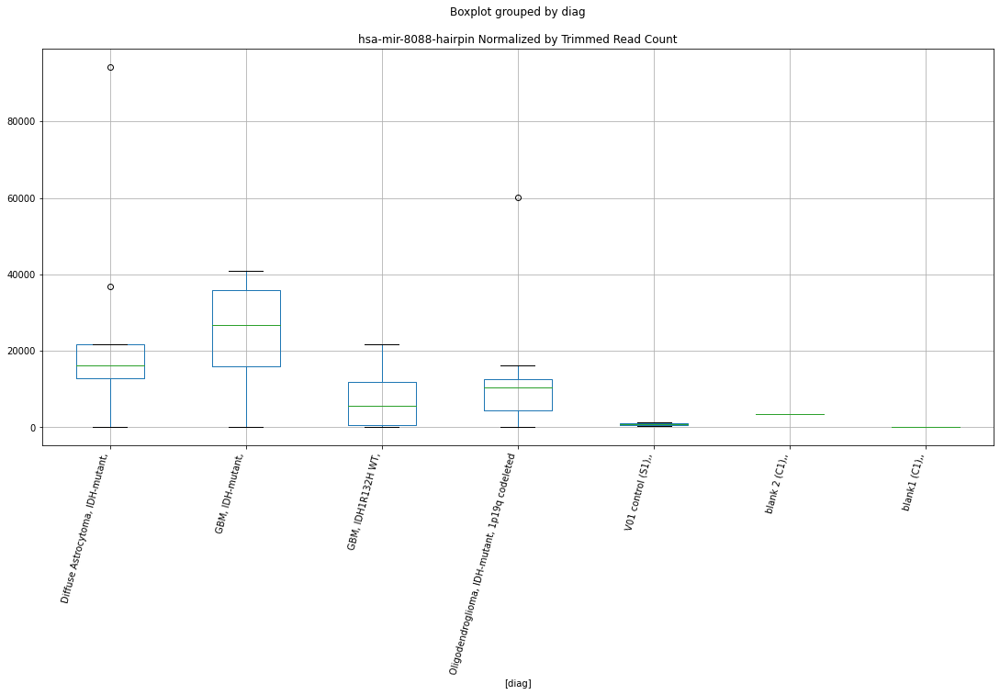

 p : 0.005526158539799018  ( t : 3.151003616567813 ) :  D-plex  :  bbduk2  :  hsa-mir-7515-hairpin
Control and blanks
73      3865.042009
337    71212.581127
Name: hsa-mir-7515-hairpin, dtype: float64
205    18625.459032
Name: hsa-mir-7515-hairpin, dtype: float64
469    24252.620022
Name: hsa-mir-7515-hairpin, dtype: float64


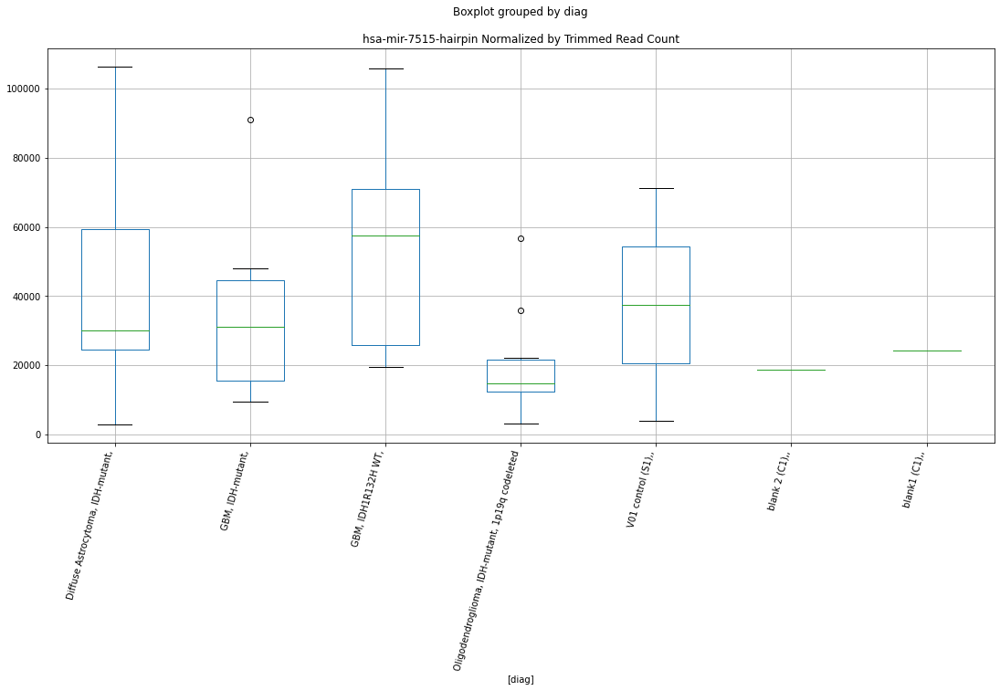

 p : 0.005526215053837208  ( t : 3.150998953687978 ) :  Lexogen  :  cutadapt2  :  hsa-mir-128-2-hairpin
Control and blanks
82        0.000000
346    6523.470183
Name: hsa-mir-128-2-hairpin, dtype: float64
214    0.0
Name: hsa-mir-128-2-hairpin, dtype: float64
478    0.0
Name: hsa-mir-128-2-hairpin, dtype: float64


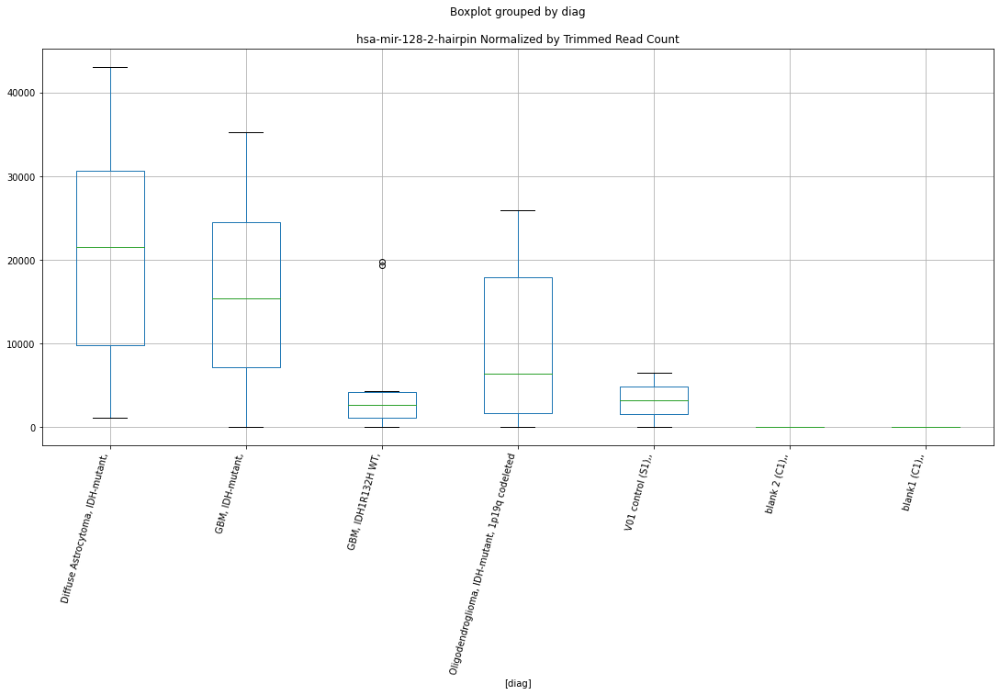

 p : 0.005539237561140612  ( t : 3.149925728950164 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6833-hairpin
Control and blanks
82         0.000000
346    12626.071322
Name: hsa-mir-6833-hairpin, dtype: float64
214    2441.038081
Name: hsa-mir-6833-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-6833-hairpin, dtype: float64


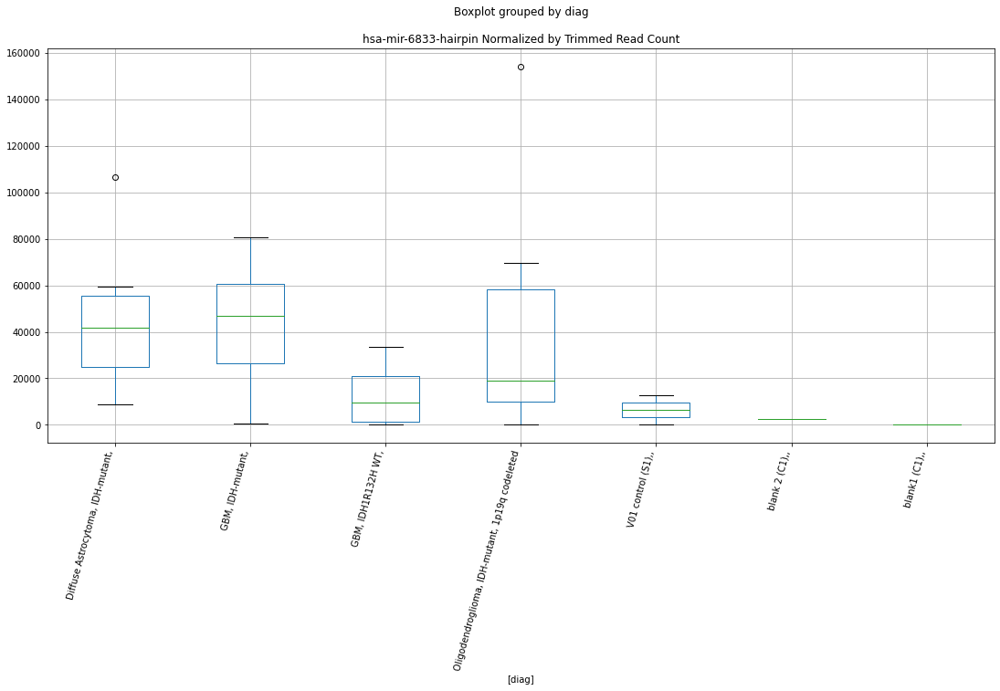

 p : 0.005607119905787648  ( t : 3.1443709607587578 ) :  D-plex  :  cutadapt2  :  hsa-mir-3124-5p-mature
Control and blanks
76      3030.456849
340    19376.106970
Name: hsa-mir-3124-5p-mature, dtype: float64
208    10052.532418
Name: hsa-mir-3124-5p-mature, dtype: float64
472    16182.763507
Name: hsa-mir-3124-5p-mature, dtype: float64


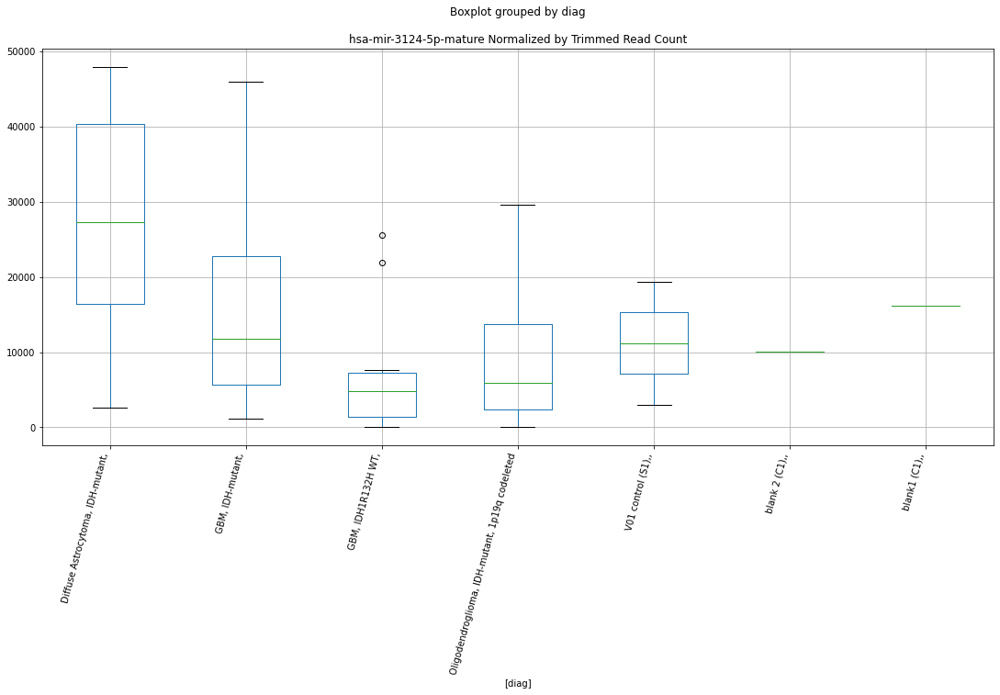

 p : 0.0056205921759897234  ( t : 3.143276352687564 ) :  D-plex  :  bbduk2  :  hsa-mir-891a-5p-mature
Control and blanks
73     0.0
337    0.0
Name: hsa-mir-891a-5p-mature, dtype: float64
205    6089.092376
Name: hsa-mir-891a-5p-mature, dtype: float64
469    11830.546352
Name: hsa-mir-891a-5p-mature, dtype: float64


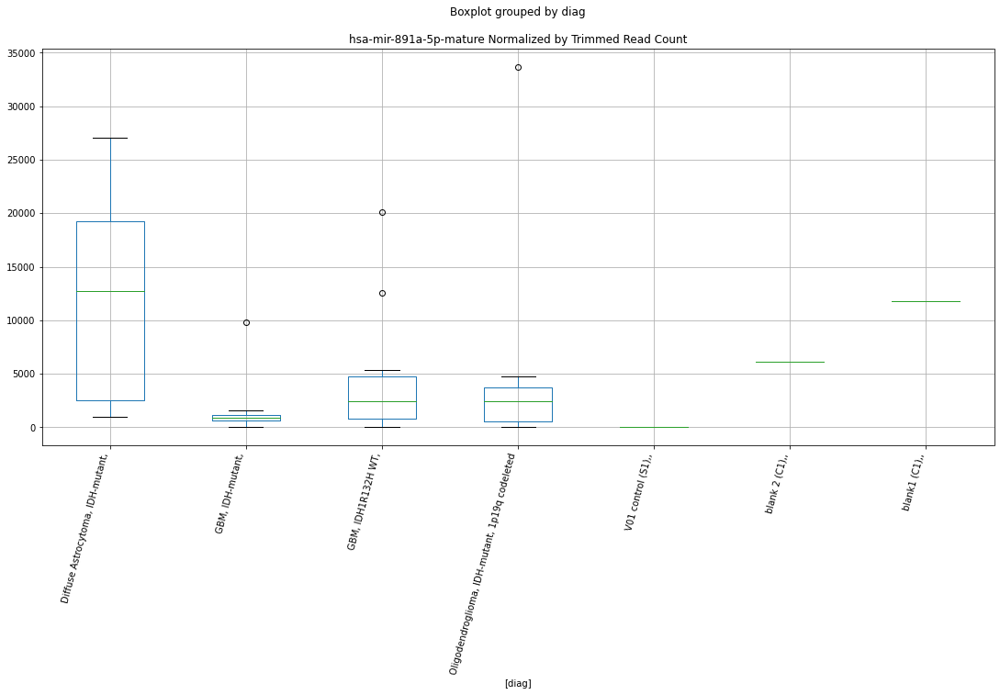

 p : 0.005630314394452968  ( t : 3.1424880238290136 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6780b-hairpin
Control and blanks
82         0.000000
346    13888.678454
Name: hsa-mir-6780b-hairpin, dtype: float64
214    5153.302616
Name: hsa-mir-6780b-hairpin, dtype: float64
478    0.0
Name: hsa-mir-6780b-hairpin, dtype: float64


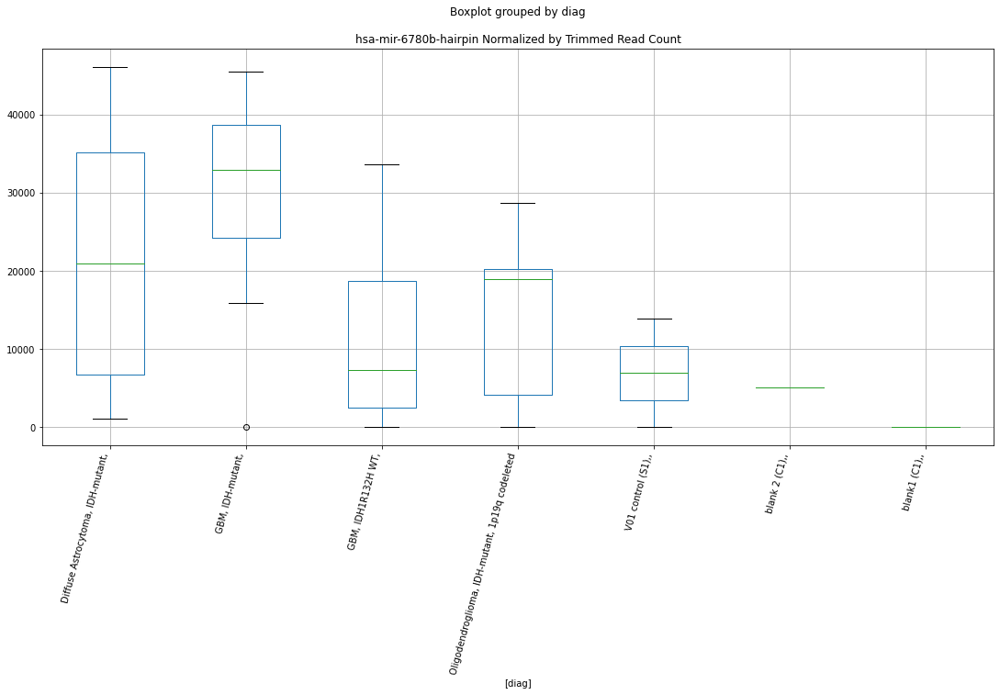

 p : 0.005646440429664135  ( t : 3.14118336759366 ) :  Lexogen  :  cutadapt2  :  hsa-mir-216a-hairpin
Control and blanks
82         0.000000
346    17255.630807
Name: hsa-mir-216a-hairpin, dtype: float64
214    2983.490988
Name: hsa-mir-216a-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-216a-hairpin, dtype: float64


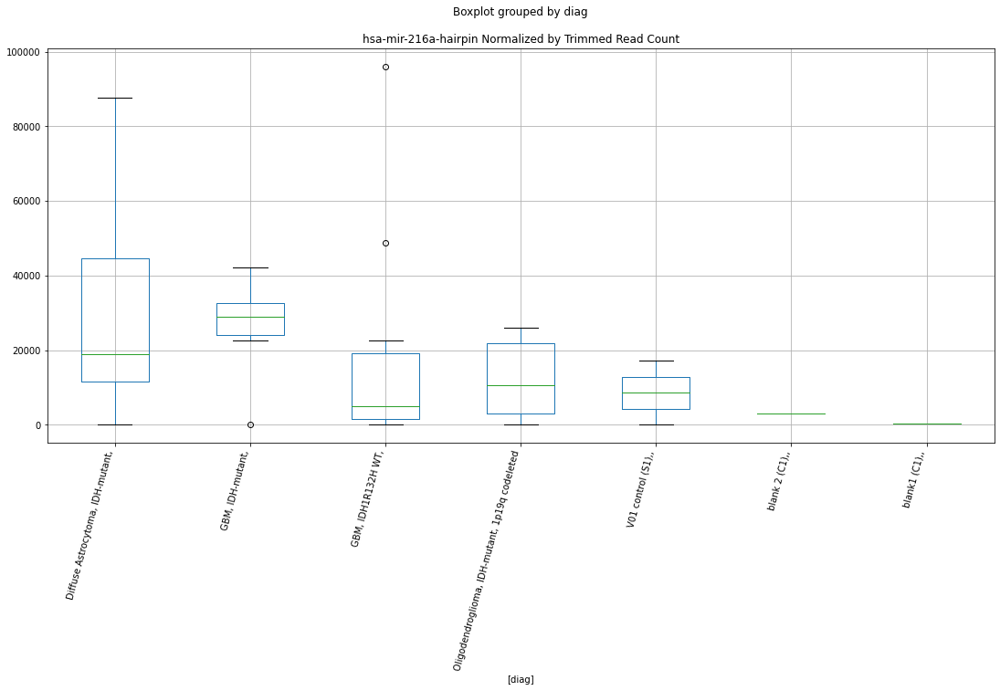

 p : 0.005659749473188974  ( t : 3.1401093555628163 ) :  D-plex  :  cutadapt2  :  hsa-mir-548f-3-hairpin
Control and blanks
76      6060.913698
340    63412.713721
Name: hsa-mir-548f-3-hairpin, dtype: float64
208    94529.076774
Name: hsa-mir-548f-3-hairpin, dtype: float64
472    49126.246362
Name: hsa-mir-548f-3-hairpin, dtype: float64


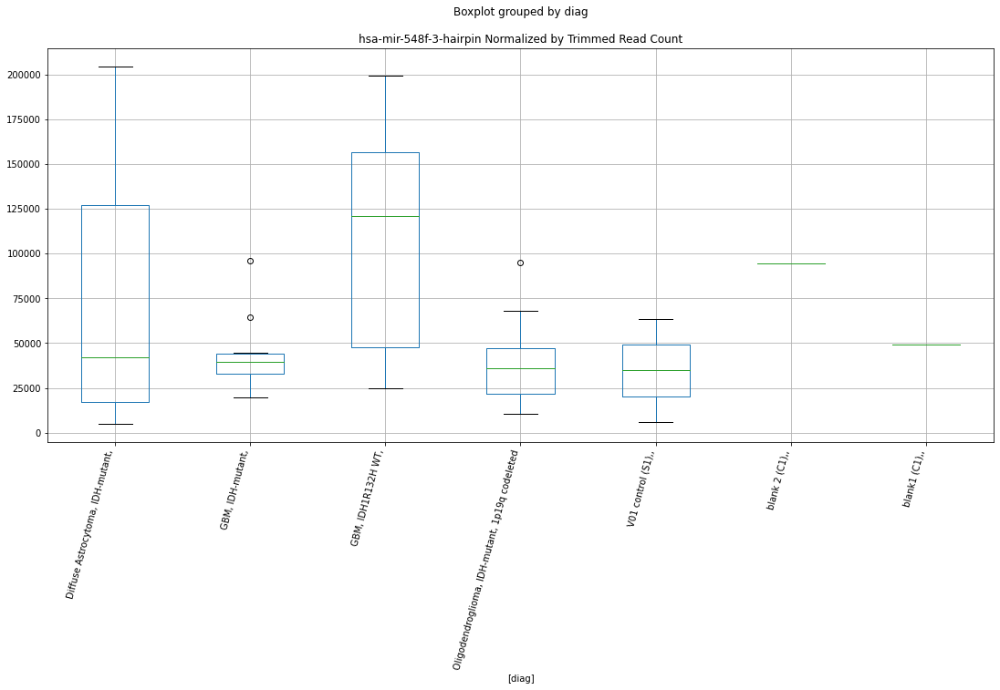

 p : 0.005666580881959653  ( t : 3.139559033034074 ) :  Lexogen  :  bbduk2  :  hsa-mir-532-5p-mature
Control and blanks
79         0.000000
343    31422.518651
Name: hsa-mir-532-5p-mature, dtype: float64
211    5739.433021
Name: hsa-mir-532-5p-mature, dtype: float64
475    8143.535075
Name: hsa-mir-532-5p-mature, dtype: float64


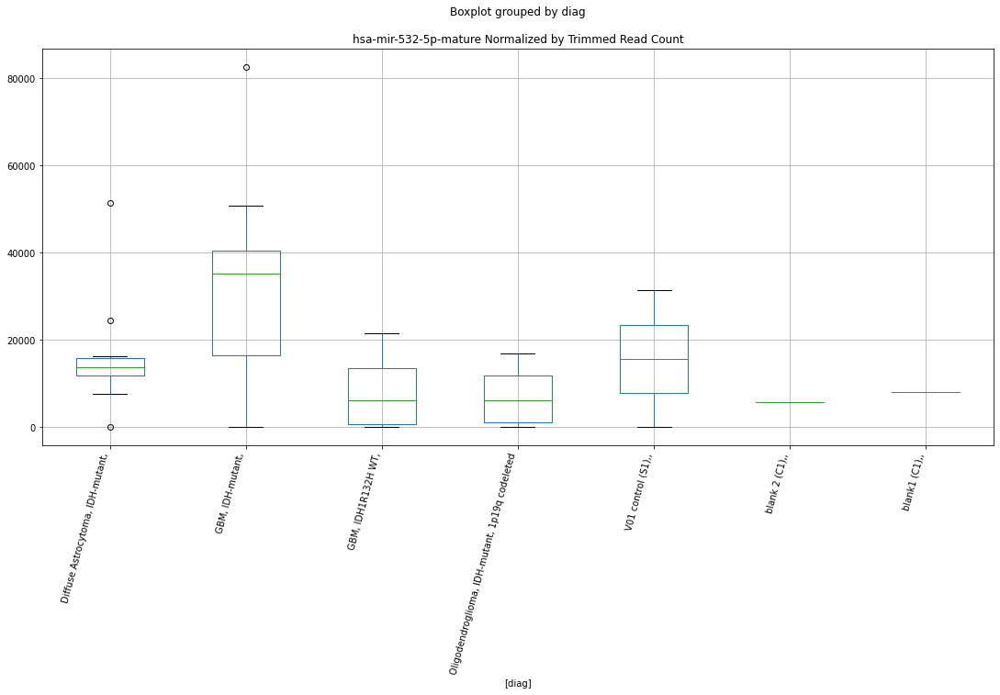

 p : 0.005694737232793717  ( t : 3.137297642161012 ) :  Lexogen  :  bbduk2  :  hsa-mir-4299-hairpin
Control and blanks
79       0.000000
343    636.942946
Name: hsa-mir-4299-hairpin, dtype: float64
211    1093.225337
Name: hsa-mir-4299-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-4299-hairpin, dtype: float64


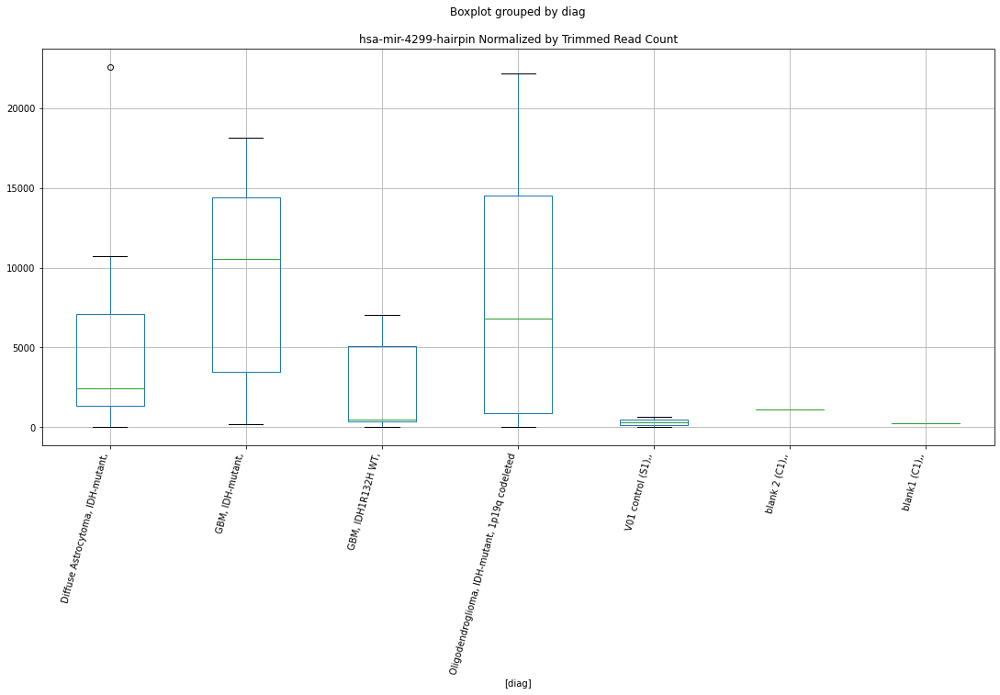

 p : 0.005712789543411887  ( t : 3.1358535011700988 ) :  D-plex  :  cutadapt2  :  hsa-mir-4260-hairpin
Control and blanks
76     757.614212
340    880.732135
Name: hsa-mir-4260-hairpin, dtype: float64
208    7230.768932
Name: hsa-mir-4260-hairpin, dtype: float64
472    8669.337593
Name: hsa-mir-4260-hairpin, dtype: float64


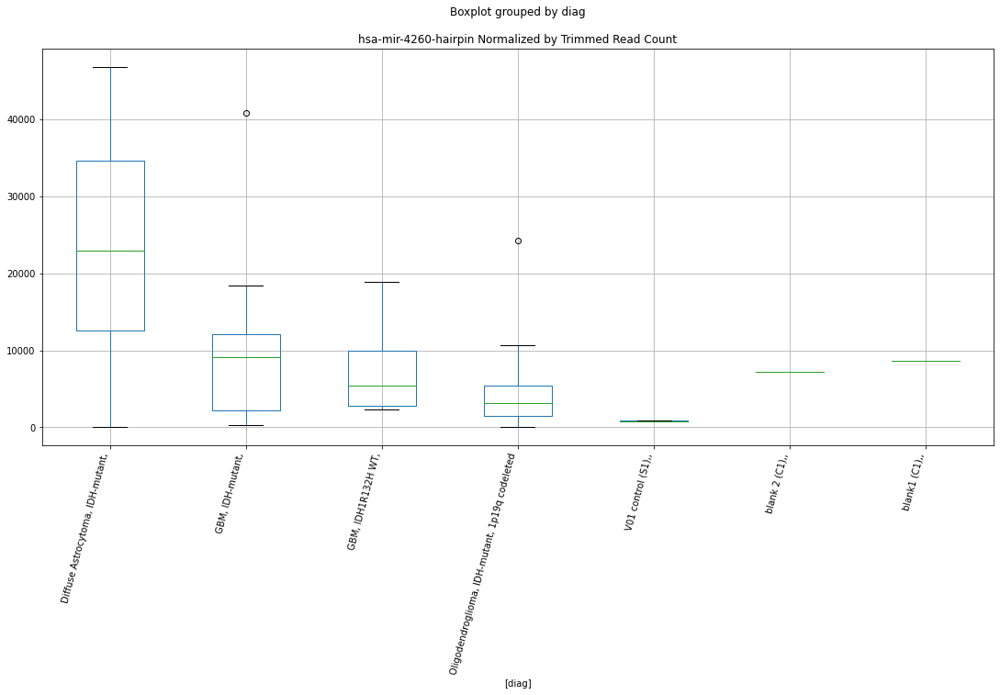

 p : 0.005720818251368703  ( t : 3.135212655568866 ) :  Lexogen  :  bbduk2  :  hsa-mir-6833-hairpin
Control and blanks
79         0.000000
343    13163.487543
Name: hsa-mir-6833-hairpin, dtype: float64
211    2459.757009
Name: hsa-mir-6833-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-6833-hairpin, dtype: float64


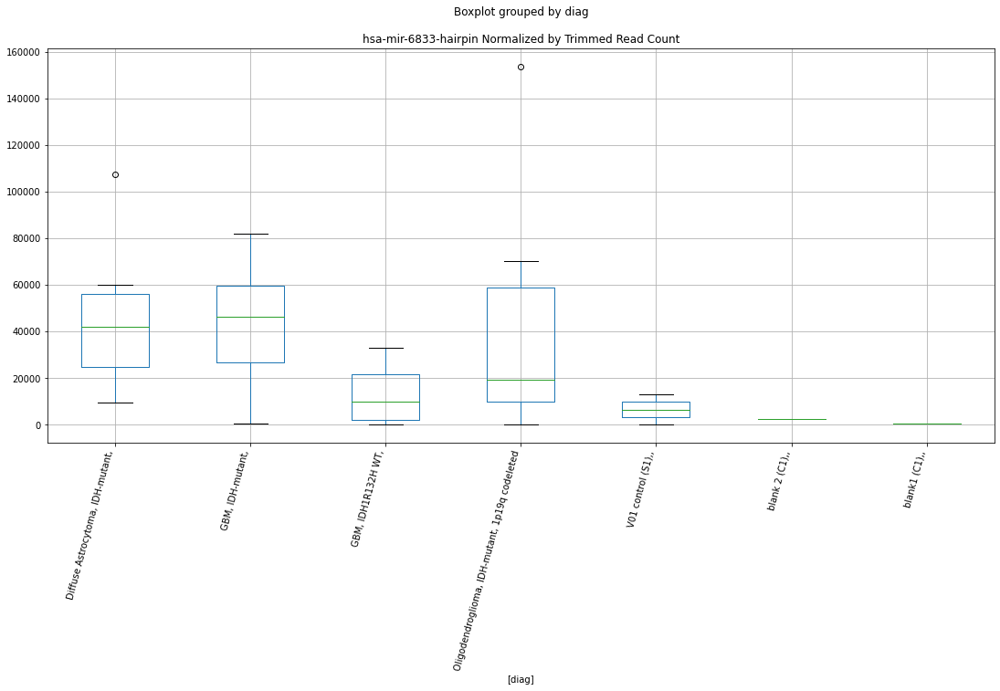

 p : 0.005757152840913125  ( t : 3.132323395335264 ) :  D-plex  :  bbduk2  :  hsa-mir-373-hairpin
Control and blanks
73     128319.394704
337      5340.943585
Name: hsa-mir-373-hairpin, dtype: float64
205    31340.916641
Name: hsa-mir-373-hairpin, dtype: float64
469    41406.912233
Name: hsa-mir-373-hairpin, dtype: float64


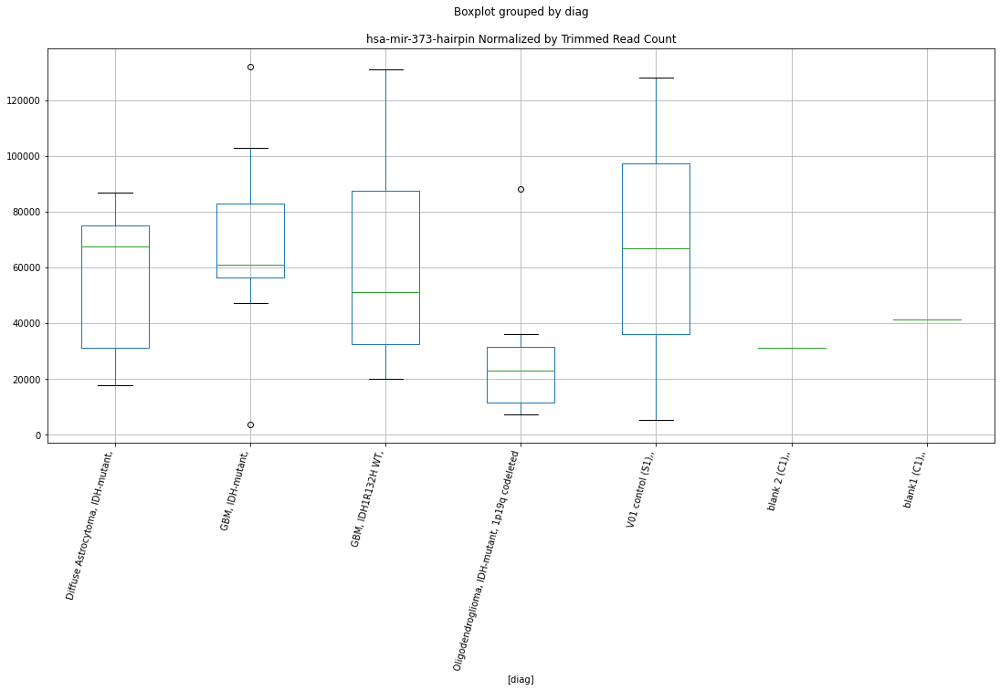

 p : 0.005766428329140403  ( t : 3.131588678931347 ) :  Lexogen  :  bbduk2  :  hsa-mir-134-hairpin
Control and blanks
79       0.00000
343    424.62863
Name: hsa-mir-134-hairpin, dtype: float64
211    1093.225337
Name: hsa-mir-134-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-134-hairpin, dtype: float64


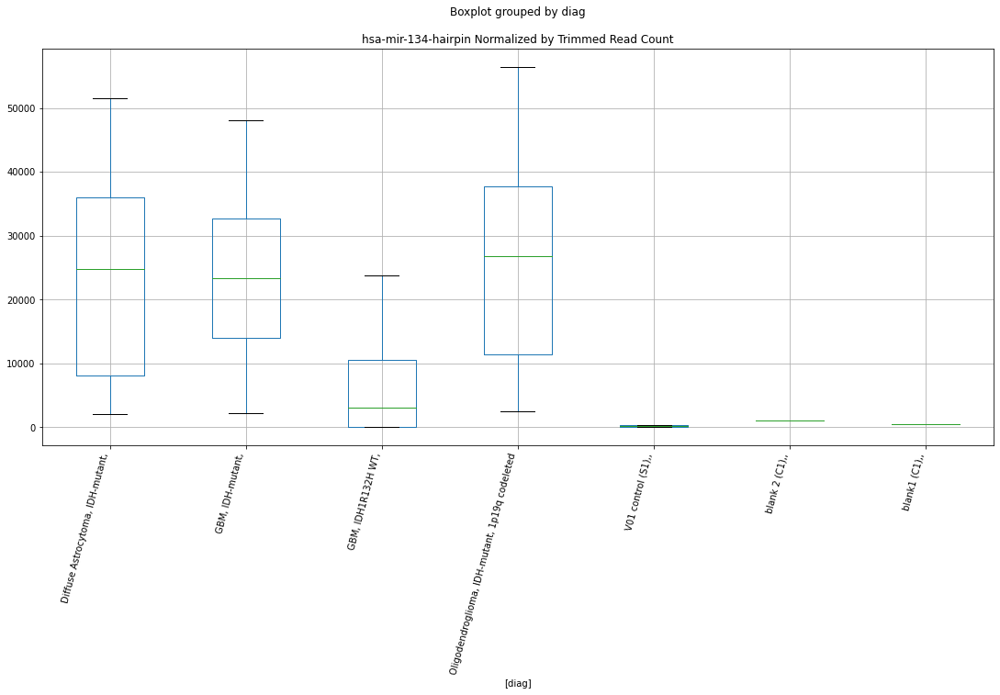

 p : 0.005790311514918615  ( t : 3.129702177781984 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-1-hairpin
Control and blanks
76     3030.456849
340    2642.196405
Name: hsa-mir-3199-1-hairpin, dtype: float64
208    11287.053943
Name: hsa-mir-3199-1-hairpin, dtype: float64
472    9825.249272
Name: hsa-mir-3199-1-hairpin, dtype: float64


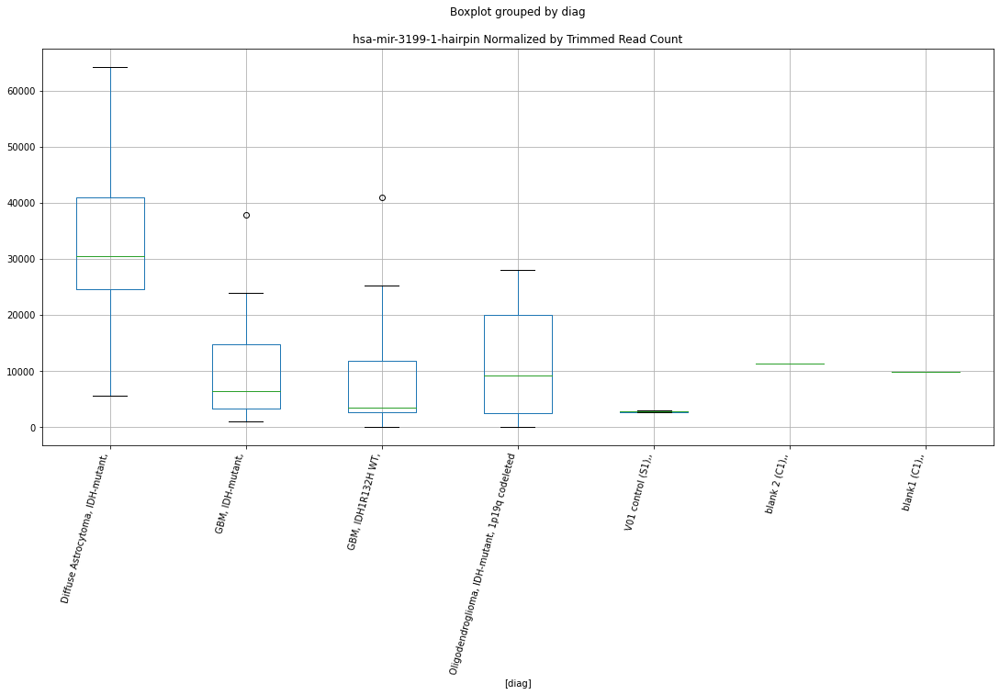

 p : 0.005840187756639579  ( t : 3.1257869011653807 ) :  D-plex  :  cutadapt2  :  hsa-mir-1290-hairpin
Control and blanks
76     12121.827396
340    30825.624725
Name: hsa-mir-1290-hairpin, dtype: float64
208    18517.822875
Name: hsa-mir-1290-hairpin, dtype: float64
472    23696.189422
Name: hsa-mir-1290-hairpin, dtype: float64


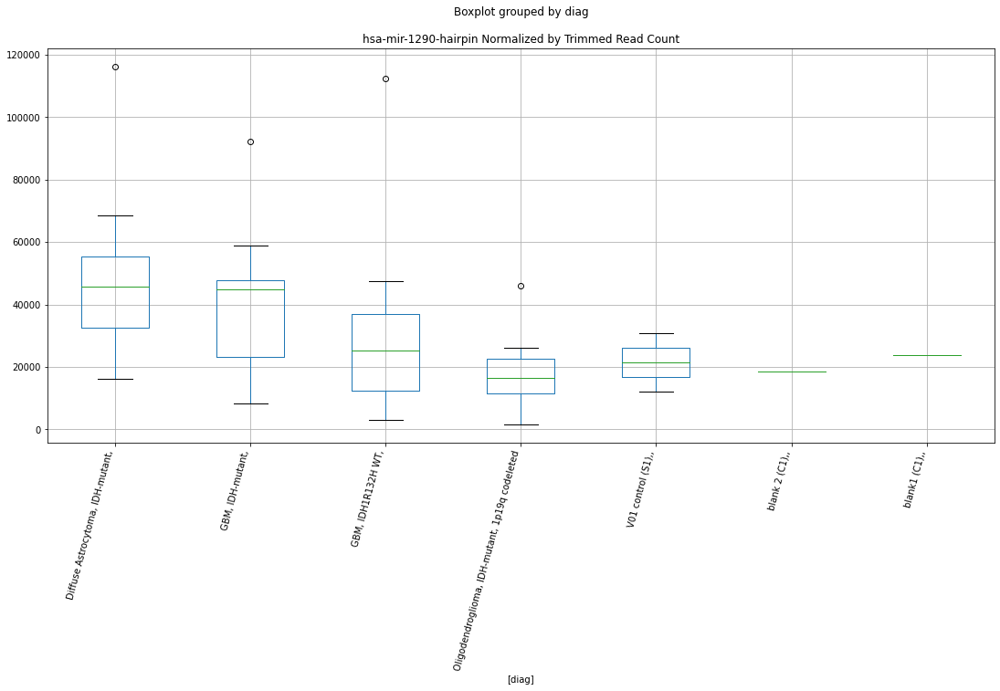

 p : 0.0058569367411842425  ( t : 3.1244794281131782 ) :  Lexogen  :  cutadapt2  :  hsa-mir-5003-hairpin
Control and blanks
82      1420.051122
346    16834.761763
Name: hsa-mir-5003-hairpin, dtype: float64
214    1627.358721
Name: hsa-mir-5003-hairpin, dtype: float64
478    2374.604836
Name: hsa-mir-5003-hairpin, dtype: float64


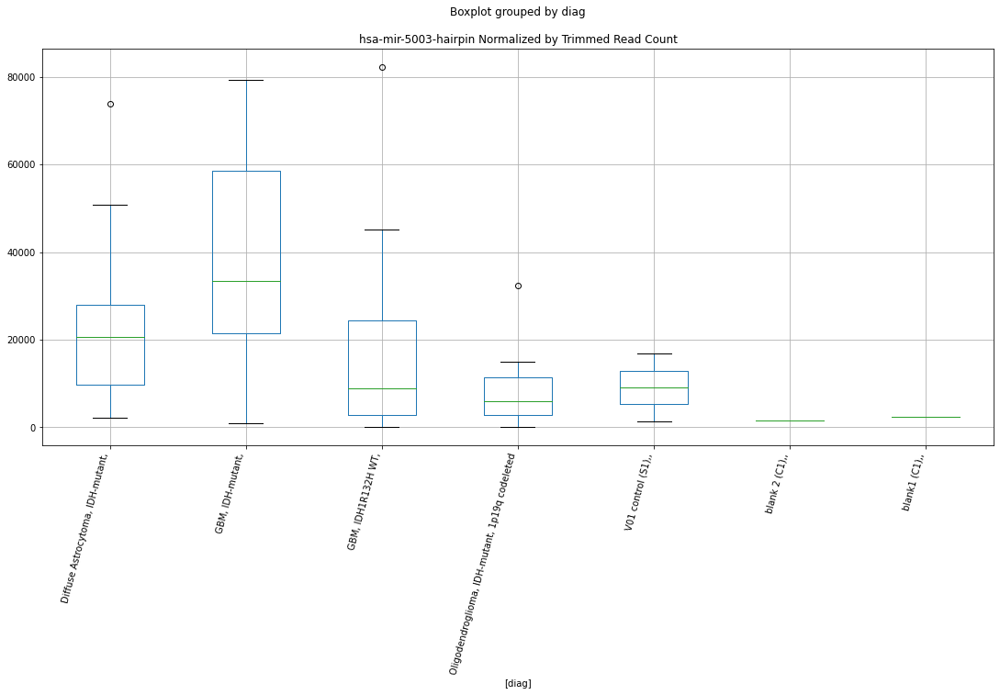

 p : 0.005870538639810556  ( t : 3.1234203086406334 ) :  D-plex  :  cutadapt2  :  hsa-mir-4272-mature
Control and blanks
76     757.614212
340    880.732135
Name: hsa-mir-4272-mature, dtype: float64
208    77245.775423
Name: hsa-mir-4272-mature, dtype: float64
472    10981.160951
Name: hsa-mir-4272-mature, dtype: float64


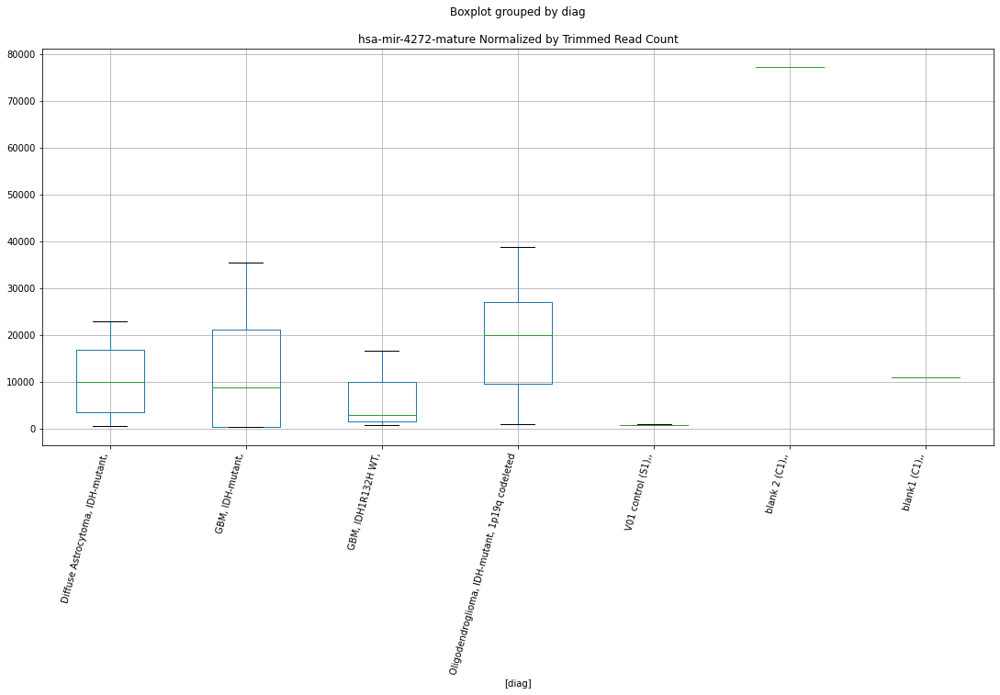

 p : 0.0059625109501545105  ( t : 3.116321076745985 ) :  D-plex  :  bbduk2  :  hsa-mir-411-hairpin
Control and blanks
73     23963.260457
337    41837.391412
Name: hsa-mir-411-hairpin, dtype: float64
205    22207.278077
Name: hsa-mir-411-hairpin, dtype: float64
469    35491.639057
Name: hsa-mir-411-hairpin, dtype: float64


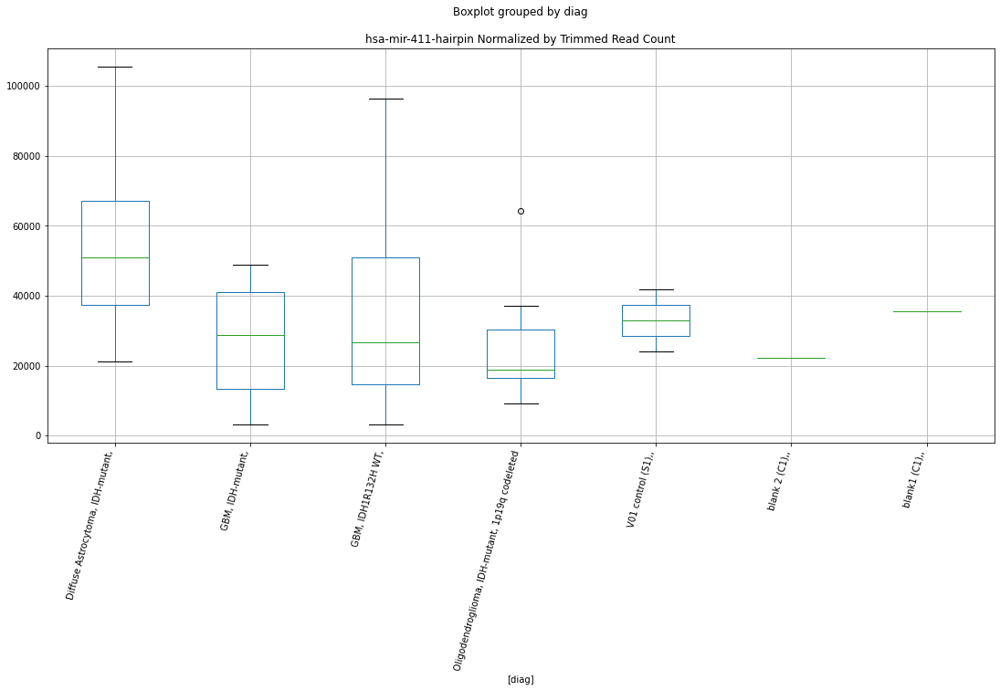

 p : 0.005972968567363452  ( t : 3.115520643407584 ) :  Lexogen  :  cutadapt2  :  hsa-mir-532-5p-mature
Control and blanks
82         0.000000
346    31144.309261
Name: hsa-mir-532-5p-mature, dtype: float64
214    5695.755523
Name: hsa-mir-532-5p-mature, dtype: float64
478    8073.656443
Name: hsa-mir-532-5p-mature, dtype: float64


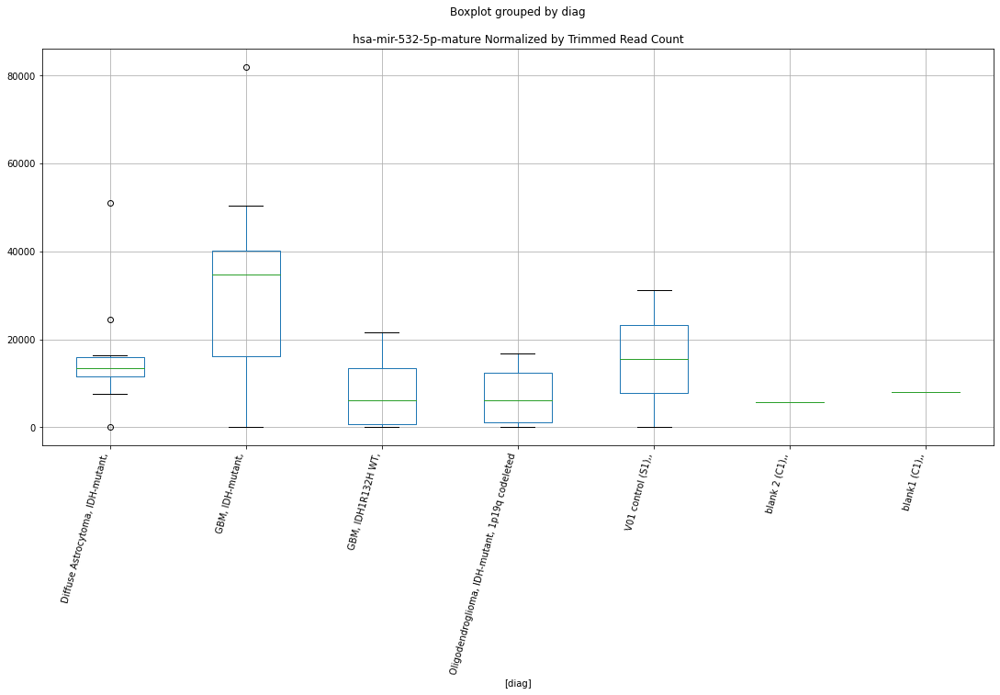

 p : 0.006020691873377969  ( t : 3.111885143711663 ) :  D-plex  :  bbduk2  :  hsa-mir-5010-3p-mature
Control and blanks
73     1546.016804
337    2670.471792
Name: hsa-mir-5010-3p-mature, dtype: float64
205    6089.092376
Name: hsa-mir-5010-3p-mature, dtype: float64
469    6506.800494
Name: hsa-mir-5010-3p-mature, dtype: float64


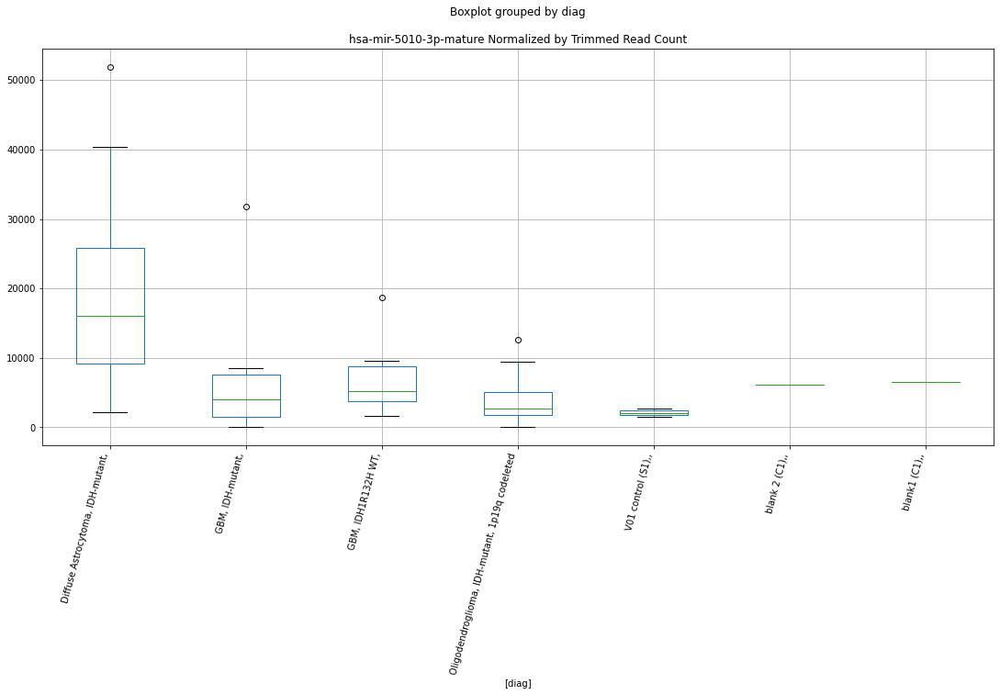

 p : 0.006025475913852621  ( t : 3.1115222537313416 ) :  D-plex  :  bbduk2  :  hsa-mir-3620-3p-mature
Control and blanks
73     0.0
337    0.0
Name: hsa-mir-3620-3p-mature, dtype: float64
205    1432.727618
Name: hsa-mir-3620-3p-mature, dtype: float64
469    3549.163906
Name: hsa-mir-3620-3p-mature, dtype: float64


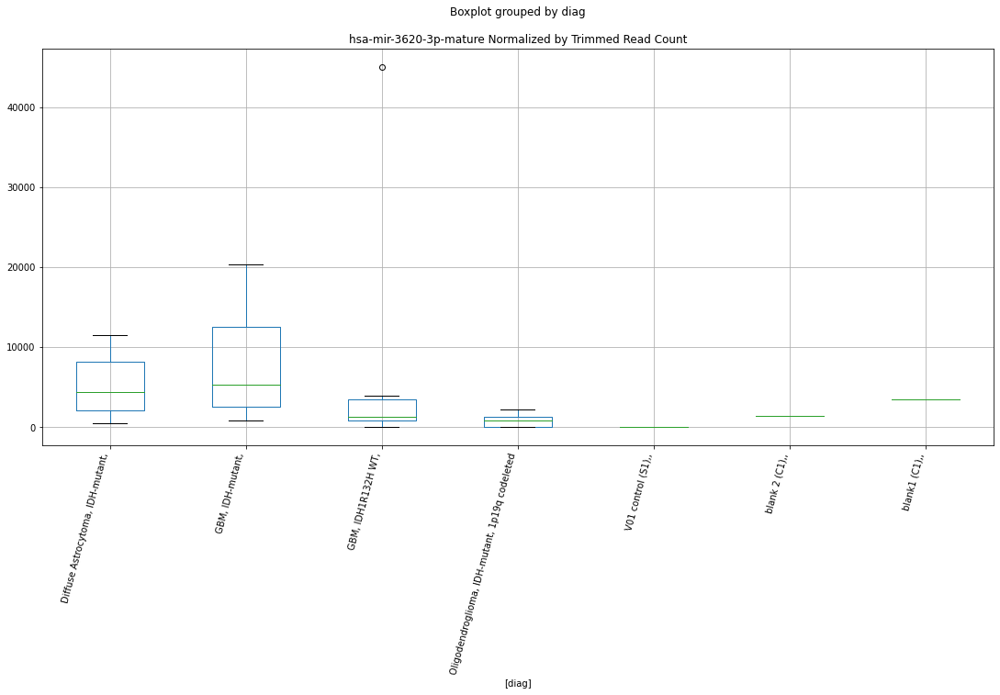

 p : 0.0060652220128439615  ( t : 3.1085181661993704 ) :  Lexogen  :  cutadapt2  :  hsa-mir-134-hairpin
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-134-hairpin, dtype: float64
214    1084.905814
Name: hsa-mir-134-hairpin, dtype: float64
478    474.920967
Name: hsa-mir-134-hairpin, dtype: float64


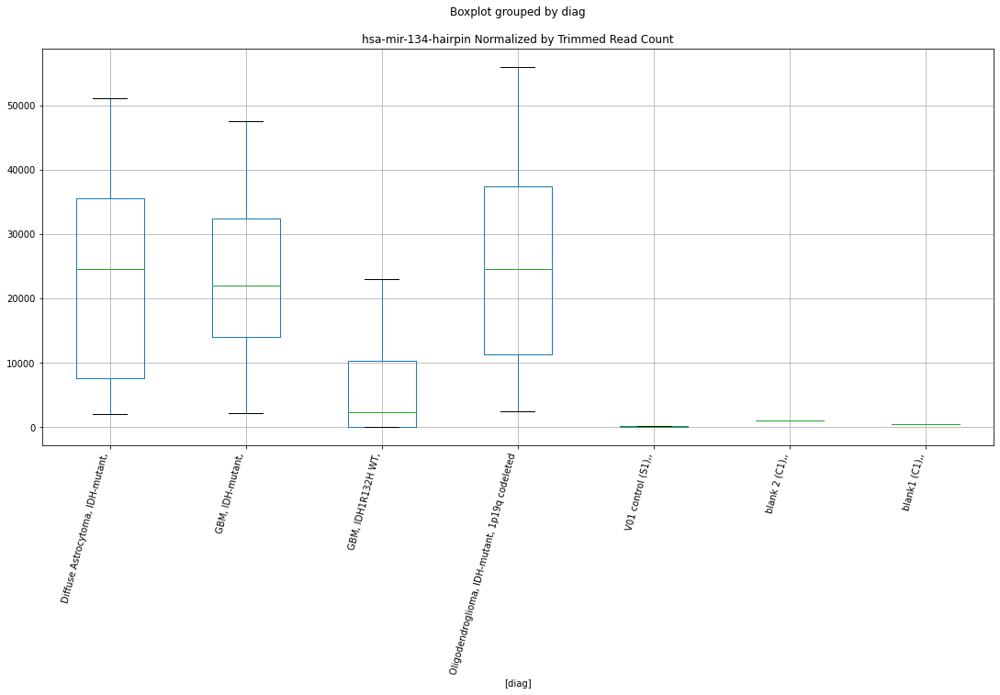

 p : 0.006070208479417303  ( t : 3.1081426361272255 ) :  D-plex  :  bbduk2  :  hsa-mir-6780a-3p-mature
Control and blanks
73     38650.420091
337    11572.044433
Name: hsa-mir-6780a-3p-mature, dtype: float64
205    11999.0938
Name: hsa-mir-6780a-3p-mature, dtype: float64
469    13013.600988
Name: hsa-mir-6780a-3p-mature, dtype: float64


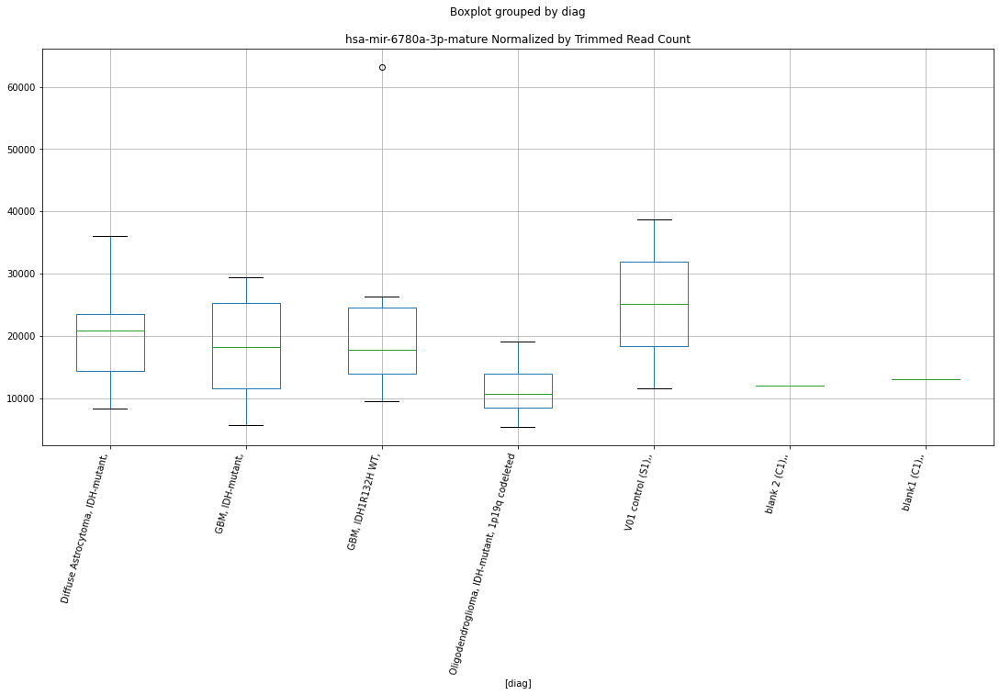

 p : 0.006080694821298875  ( t : 3.1073538922051163 ) :  D-plex  :  cutadapt2  :  hsa-mir-8084-hairpin
Control and blanks
76     101520.304440
340    216660.105212
Name: hsa-mir-8084-hairpin, dtype: float64
208    61902.436469
Name: hsa-mir-8084-hairpin, dtype: float64
472    71666.524104
Name: hsa-mir-8084-hairpin, dtype: float64


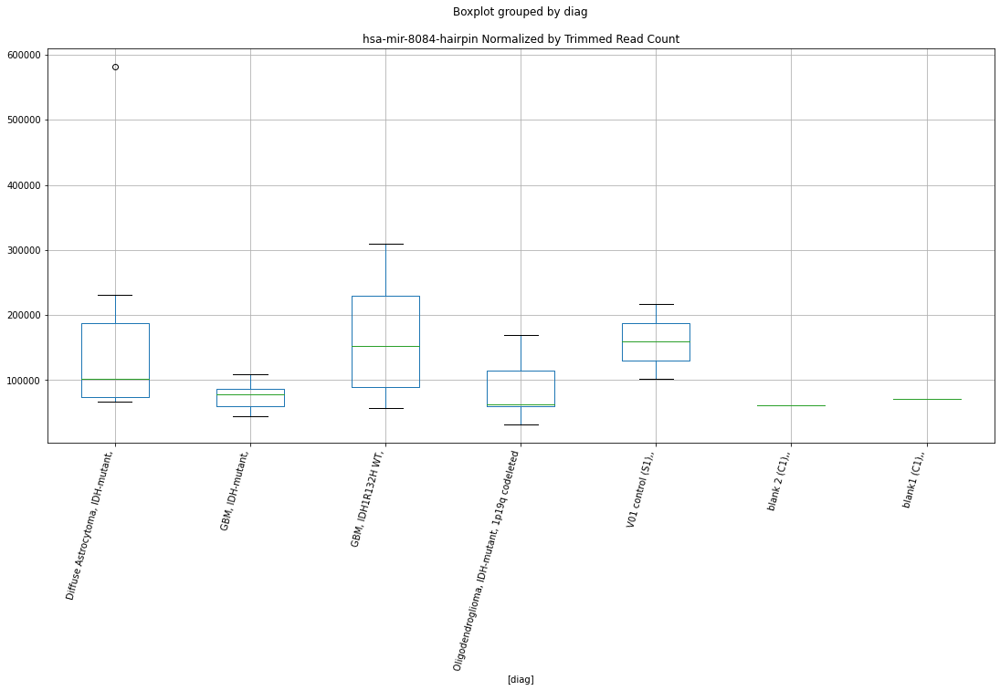

 p : 0.00608554956502513  ( t : 3.106989185581577 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3940-hairpin
Control and blanks
82         0.000000
346    61446.880434
Name: hsa-mir-3940-hairpin, dtype: float64
214    0.0
Name: hsa-mir-3940-hairpin, dtype: float64
478    712.381451
Name: hsa-mir-3940-hairpin, dtype: float64


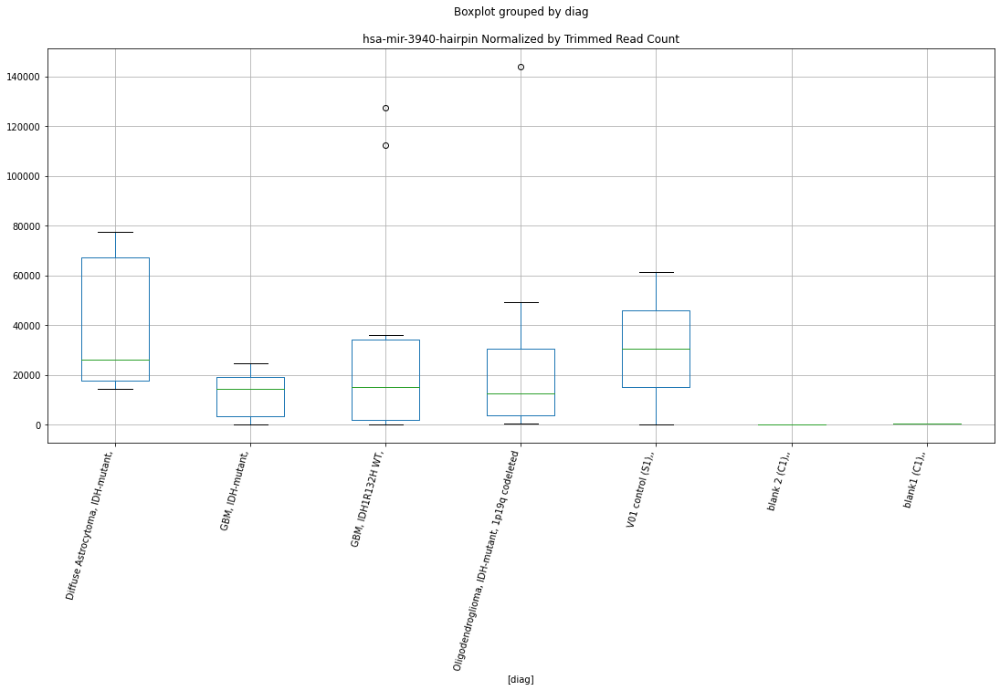

 p : 0.006112458148805528  ( t : 3.104972843680002 ) :  Lexogen  :  bbduk2  :  hsa-mir-219b-hairpin
Control and blanks
79         0.00000
343    20382.17426
Name: hsa-mir-219b-hairpin, dtype: float64
211    273.306334
Name: hsa-mir-219b-hairpin, dtype: float64
475    11736.271138
Name: hsa-mir-219b-hairpin, dtype: float64


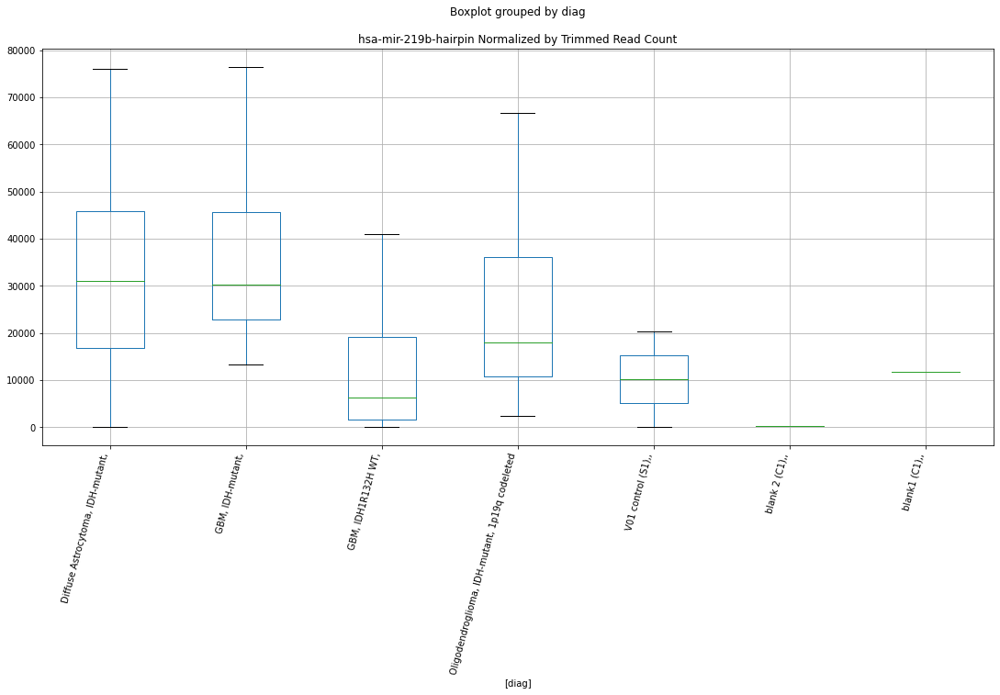

 p : 0.006129144651204372  ( t : 3.103726818452418 ) :  D-plex  :  bbduk2  :  hsa-mir-3907-hairpin
Control and blanks
73     268233.915434
337     63201.165750
Name: hsa-mir-3907-hairpin, dtype: float64
205    218132.779823
Name: hsa-mir-3907-hairpin, dtype: float64
469    150839.465993
Name: hsa-mir-3907-hairpin, dtype: float64


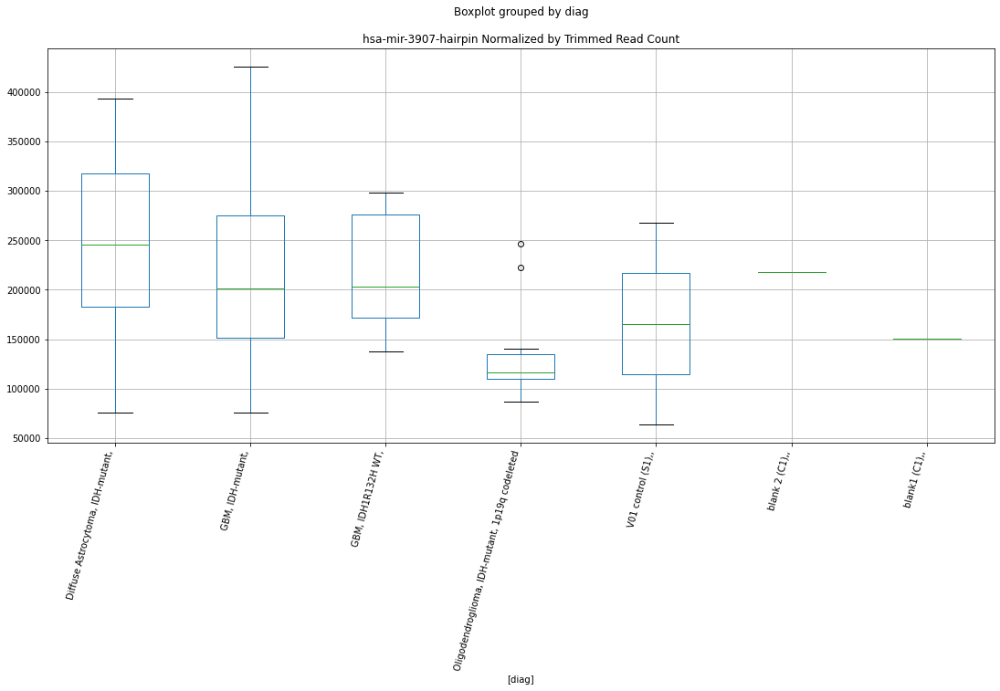

 p : 0.006143143973027549  ( t : 3.1026840019712916 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3942-hairpin
Control and blanks
82        0.000000
346    1473.041654
Name: hsa-mir-3942-hairpin, dtype: float64
214    0.0
Name: hsa-mir-3942-hairpin, dtype: float64
478    0.0
Name: hsa-mir-3942-hairpin, dtype: float64


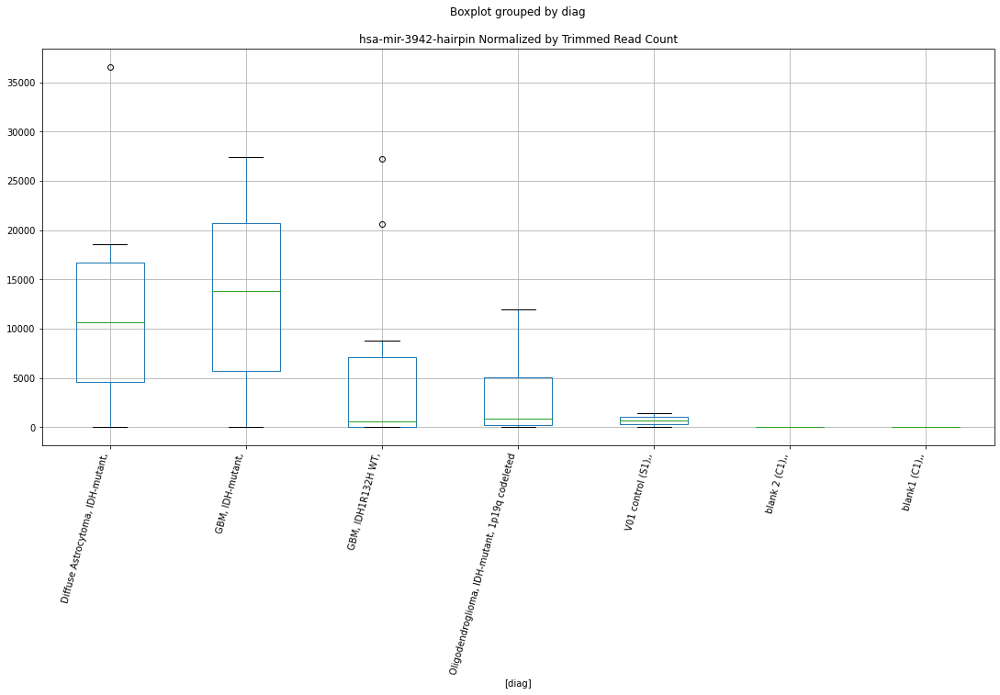

 p : 0.006155511202630547  ( t : 3.1017646873687514 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4299-hairpin
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-4299-hairpin, dtype: float64
214    0.0
Name: hsa-mir-4299-hairpin, dtype: float64
478    0.0
Name: hsa-mir-4299-hairpin, dtype: float64


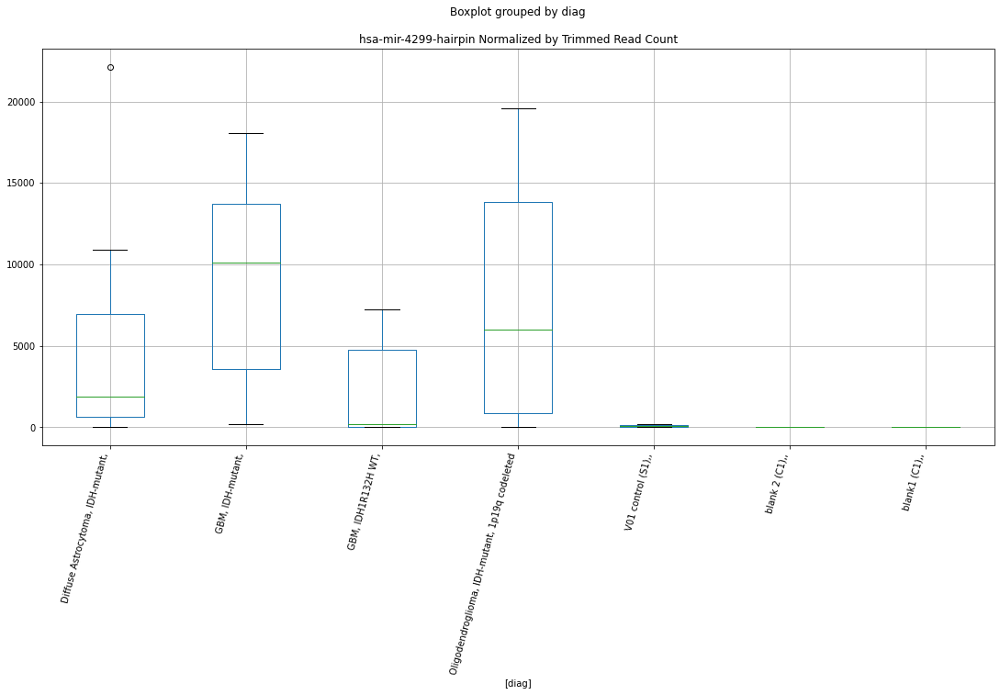

 p : 0.006244076309384014  ( t : 3.0952333881624634 ) :  Lexogen  :  bbduk2  :  hsa-mir-128-2-hairpin
Control and blanks
79        0.000000
343    6794.058087
Name: hsa-mir-128-2-hairpin, dtype: float64
211    0.0
Name: hsa-mir-128-2-hairpin, dtype: float64
475    0.0
Name: hsa-mir-128-2-hairpin, dtype: float64


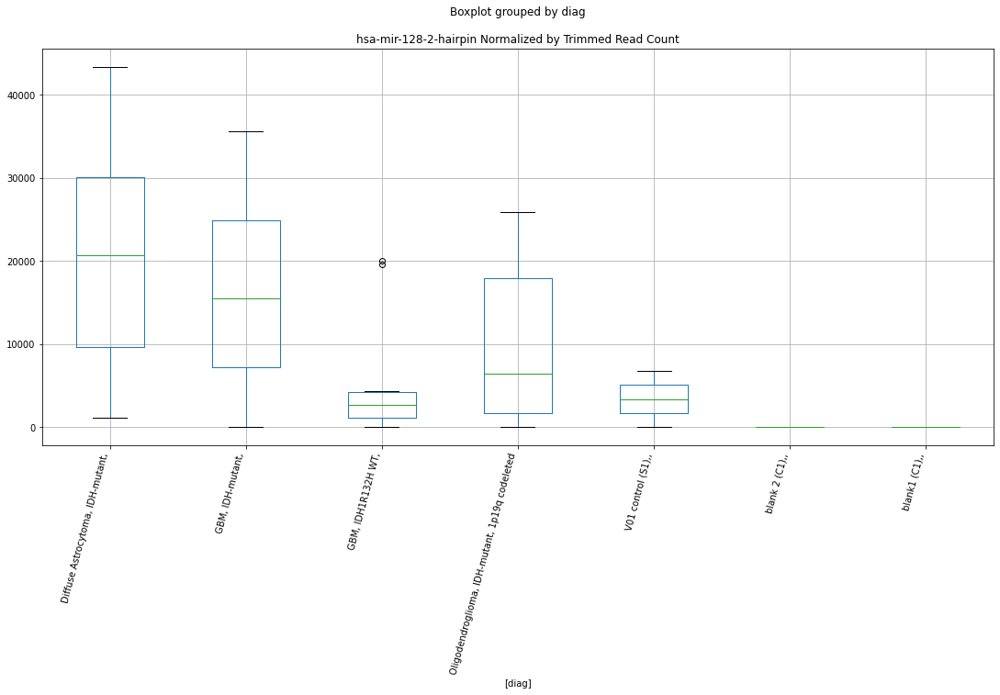

 p : 0.006316413509511118  ( t : 3.089965502118809 ) :  Lexogen  :  bbduk2  :  hsa-mir-1263-hairpin
Control and blanks
79        0.000000
343    1698.514522
Name: hsa-mir-1263-hairpin, dtype: float64
211    273.306334
Name: hsa-mir-1263-hairpin, dtype: float64
475    1916.1259
Name: hsa-mir-1263-hairpin, dtype: float64


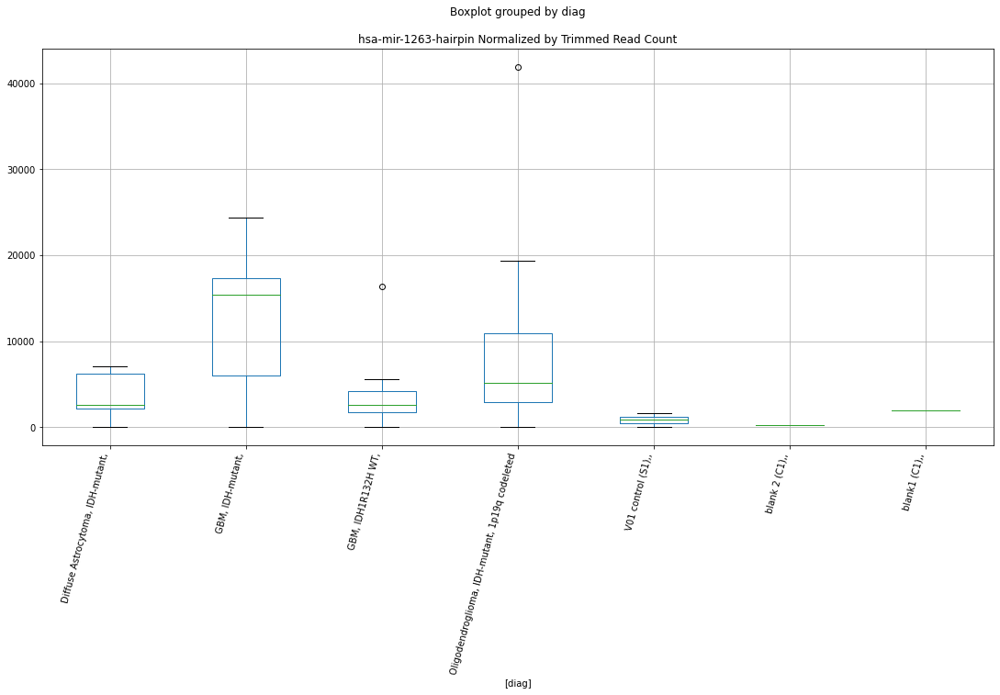

 p : 0.0063415741880226174  ( t : 3.088146977342161 ) :  Lexogen  :  bbduk2  :  hsa-mir-4697-hairpin
Control and blanks
79     1430.598791
343    2123.143152
Name: hsa-mir-4697-hairpin, dtype: float64
211    7105.964692
Name: hsa-mir-4697-hairpin, dtype: float64
475    14370.94425
Name: hsa-mir-4697-hairpin, dtype: float64


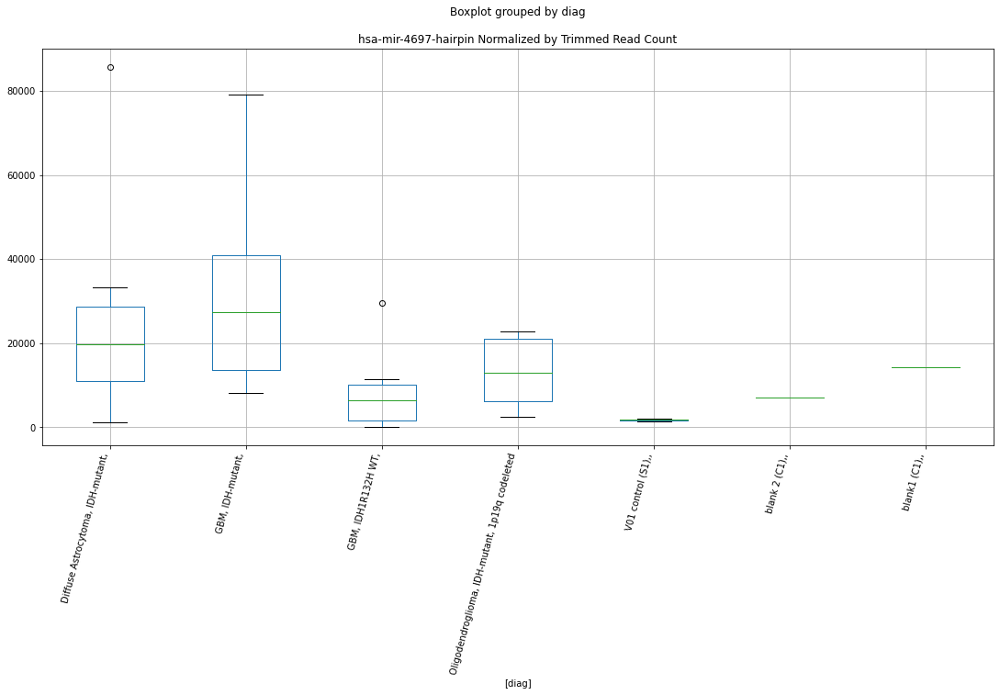

 p : 0.006361947122520223  ( t : 3.086679639263924 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6780b-3p-mature
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-6780b-3p-mature, dtype: float64
214    1898.585174
Name: hsa-mir-6780b-3p-mature, dtype: float64
478    0.0
Name: hsa-mir-6780b-3p-mature, dtype: float64


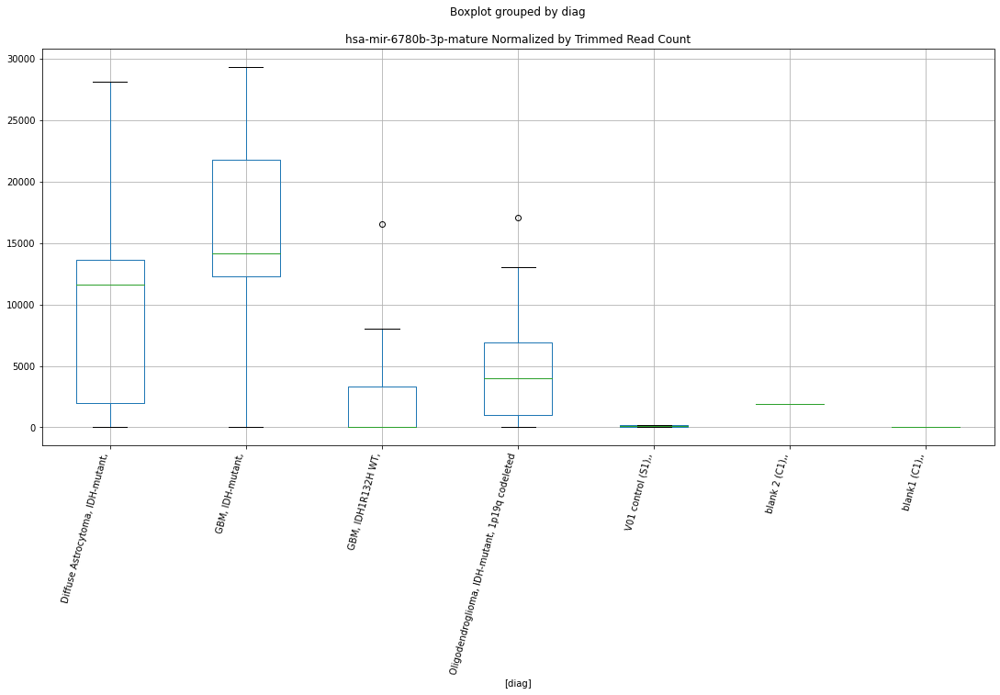

 p : 0.006365366279018854  ( t : 3.0864338272142557 ) :  Lexogen  :  cutadapt2  :  hsa-mir-219a-2-3p-mature
Control and blanks
82        0.000000
346    5471.297573
Name: hsa-mir-219a-2-3p-mature, dtype: float64
214    0.0
Name: hsa-mir-219a-2-3p-mature, dtype: float64
478    0.0
Name: hsa-mir-219a-2-3p-mature, dtype: float64


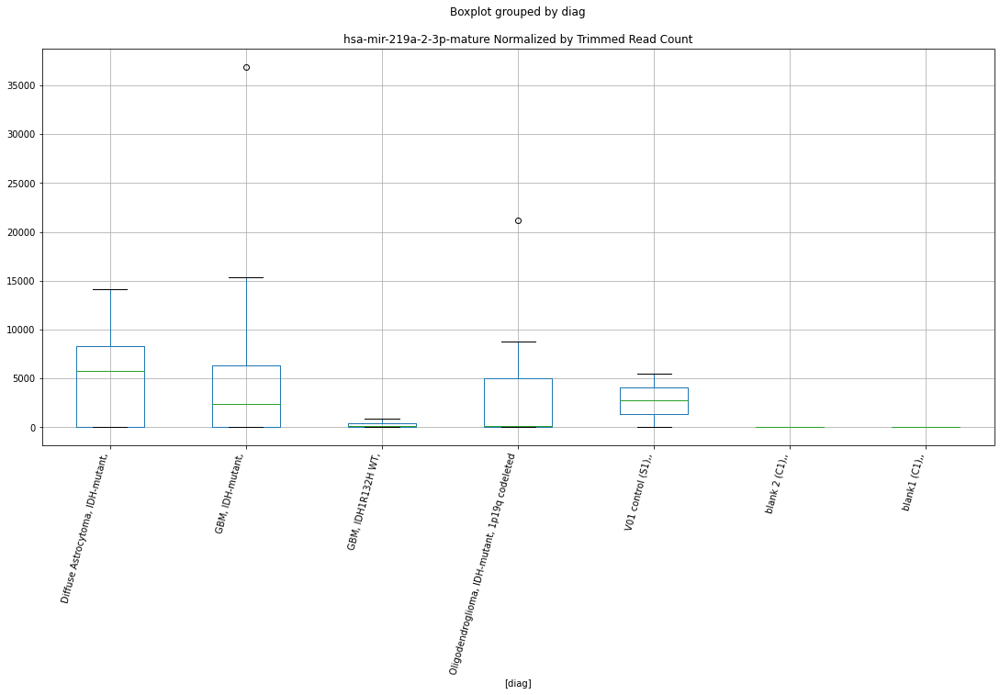

 p : 0.006377588599637622  ( t : 3.085556183826882 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-2-hairpin
Control and blanks
76     3030.456849
340    2642.196405
Name: hsa-mir-3199-2-hairpin, dtype: float64
208    11110.693725
Name: hsa-mir-3199-2-hairpin, dtype: float64
472    8669.337593
Name: hsa-mir-3199-2-hairpin, dtype: float64


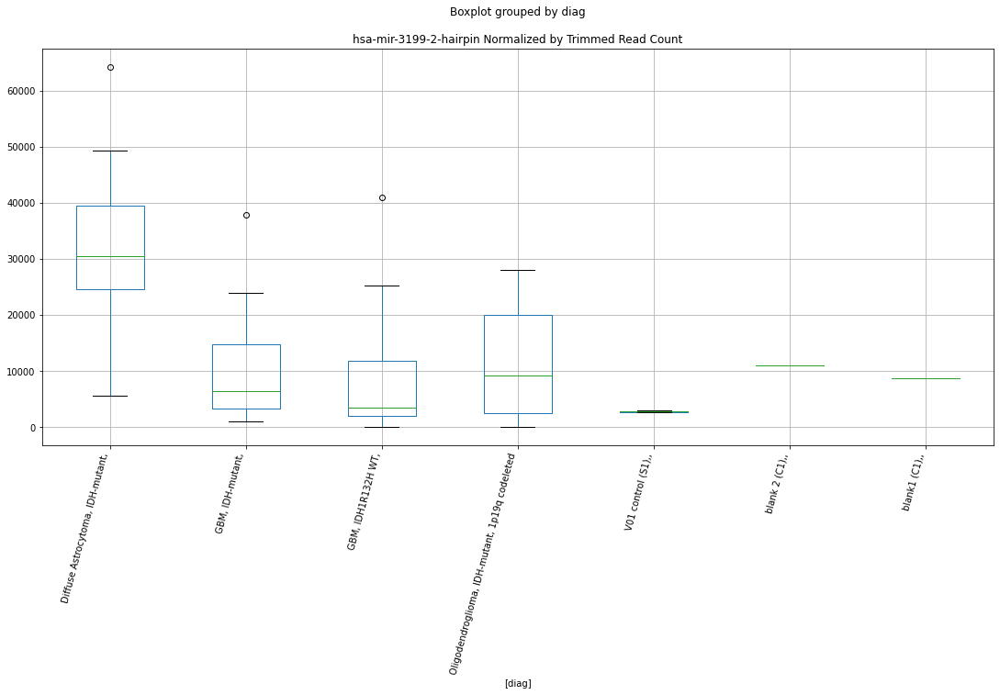

 p : 0.006389673172635355  ( t : 3.0846900418408767 ) :  Lexogen  :  bbduk2  :  hsa-mir-184-hairpin
Control and blanks
79      8583.592749
343    35031.862009
Name: hsa-mir-184-hairpin, dtype: float64
211    2733.063343
Name: hsa-mir-184-hairpin, dtype: float64
475    7904.019338
Name: hsa-mir-184-hairpin, dtype: float64


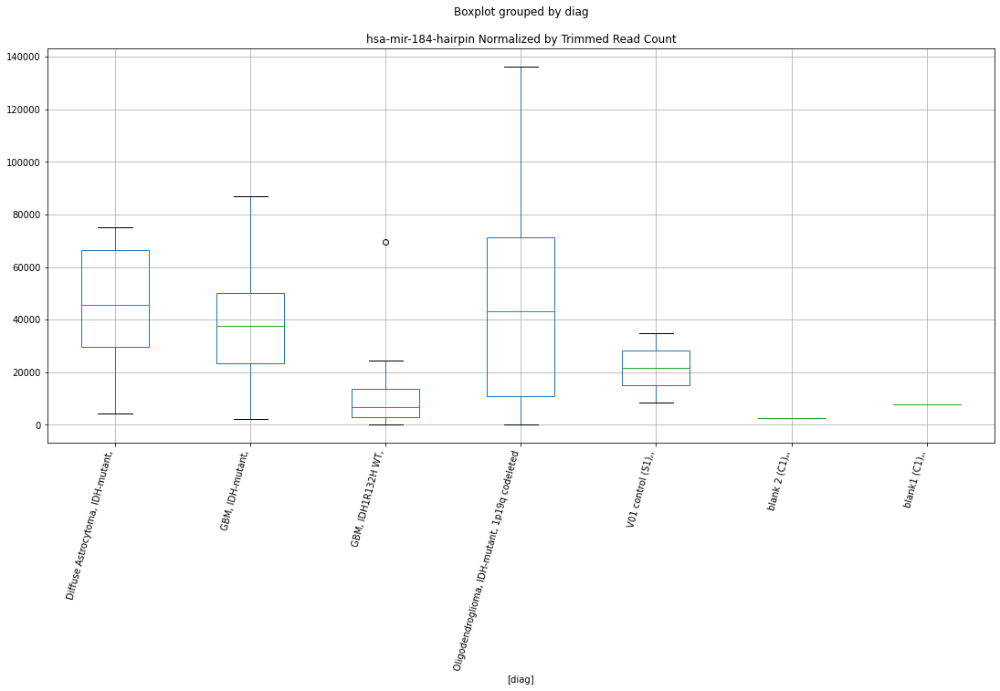

 p : 0.0064140193211081045  ( t : 3.082949909005812 ) :  D-plex  :  bbduk2  :  hsa-mir-6739-5p-mature
Control and blanks
73     25509.27726
337    39166.91962
Name: hsa-mir-6739-5p-mature, dtype: float64
205    13073.639513
Name: hsa-mir-6739-5p-mature, dtype: float64
469    7689.855129
Name: hsa-mir-6739-5p-mature, dtype: float64


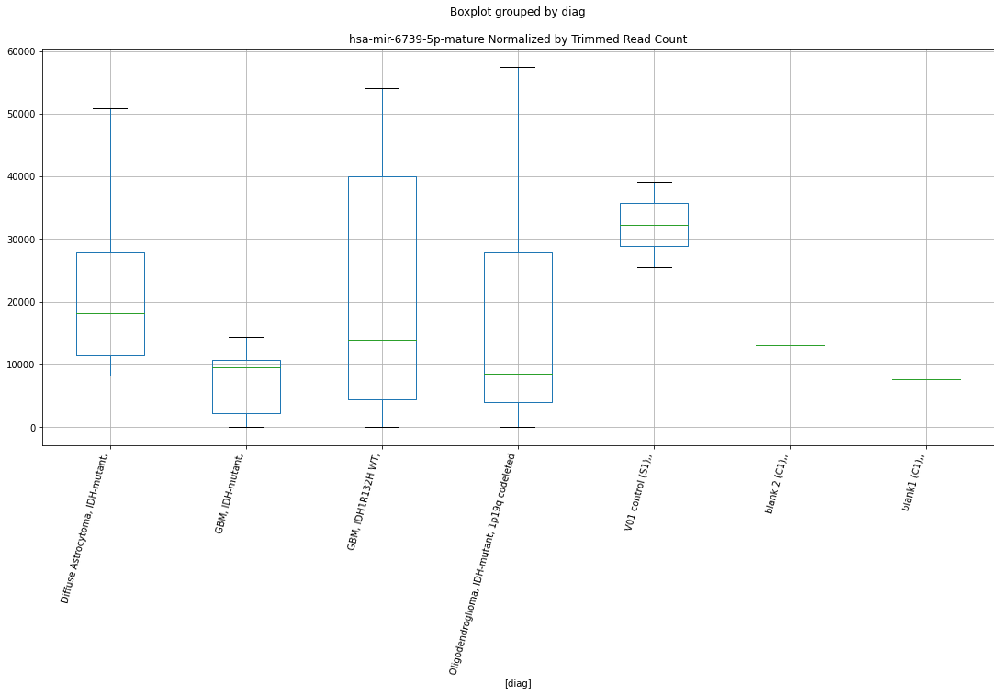

 p : 0.00643931176334721  ( t : 3.081148943932982 ) :  Lexogen  :  bbduk2  :  hsa-mir-219b-5p-mature
Control and blanks
79        0.000000
343    5732.486511
Name: hsa-mir-219b-5p-mature, dtype: float64
211    0.0
Name: hsa-mir-219b-5p-mature, dtype: float64
475    0.0
Name: hsa-mir-219b-5p-mature, dtype: float64


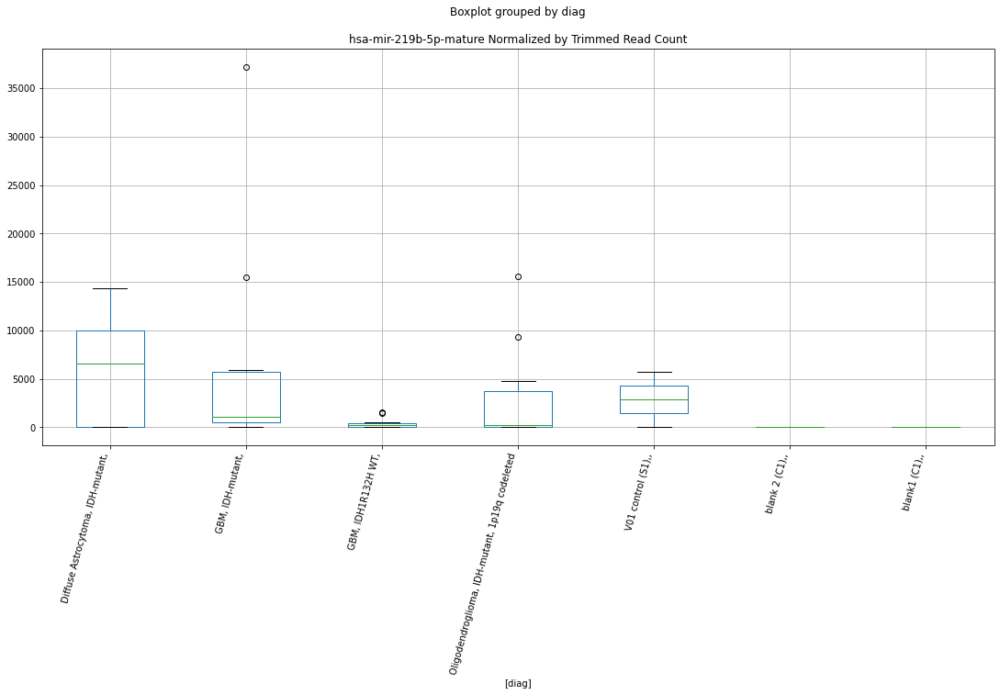

 p : 0.006467657989468202  ( t : 3.0791387057093504 ) :  Lexogen  :  bbduk2  :  hsa-mir-5003-hairpin
Control and blanks
79      1430.598791
343    19320.602684
Name: hsa-mir-5003-hairpin, dtype: float64
211    2733.063343
Name: hsa-mir-5003-hairpin, dtype: float64
475    3832.2518
Name: hsa-mir-5003-hairpin, dtype: float64


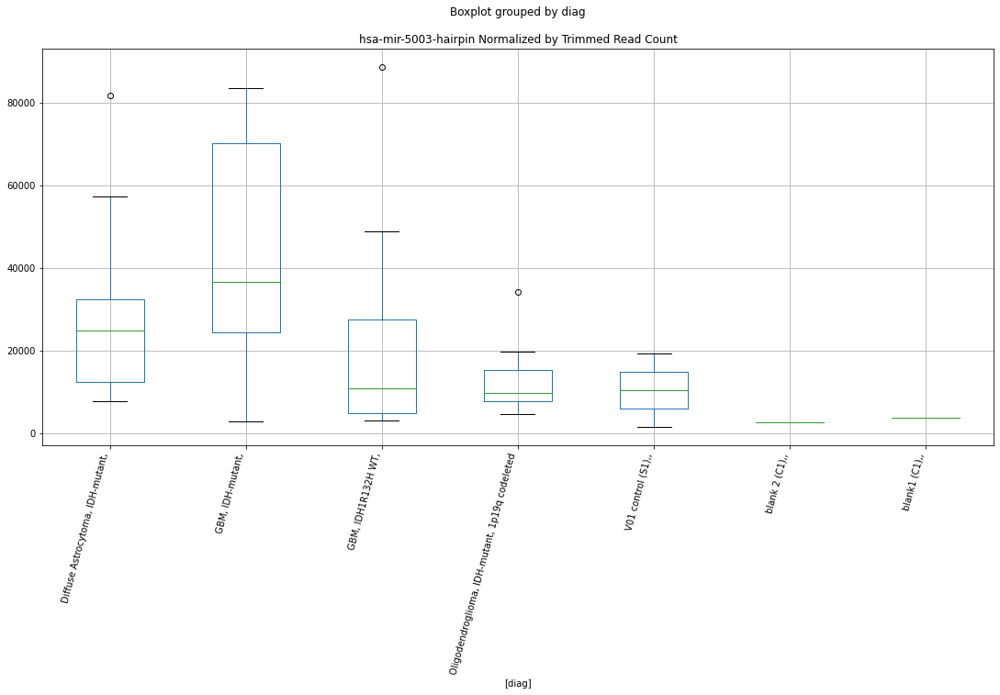

 p : 0.0064872221766859505  ( t : 3.0777562670450713 ) :  Lexogen  :  bbduk2  :  hsa-mir-3940-hairpin
Control and blanks
79         0.00000
343    61571.15141
Name: hsa-mir-3940-hairpin, dtype: float64
211    0.0
Name: hsa-mir-3940-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-3940-hairpin, dtype: float64


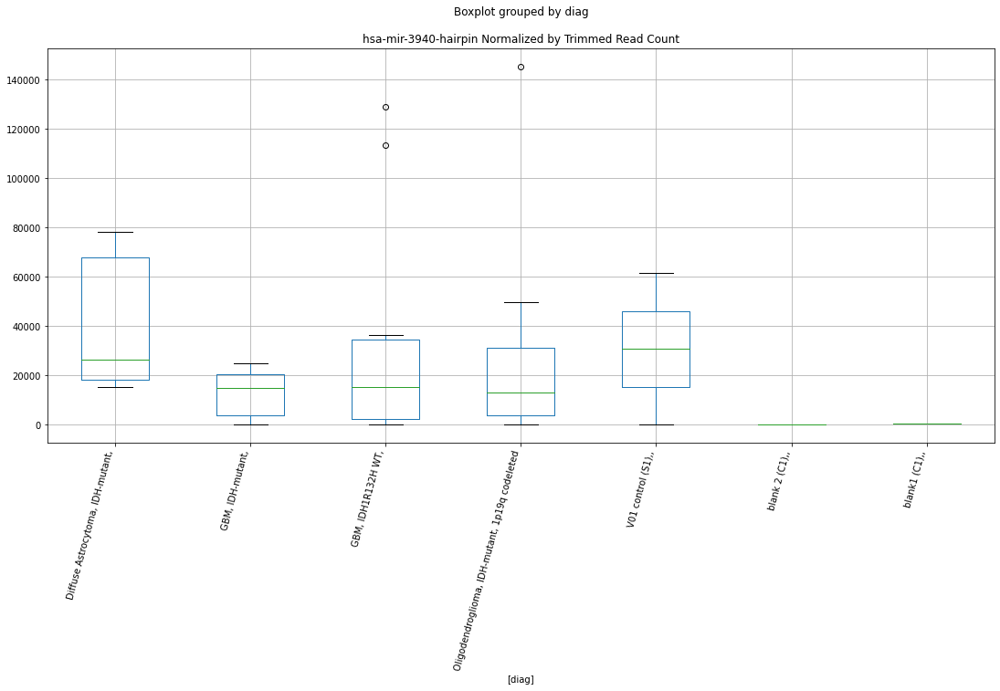

 p : 0.006520360898393193  ( t : 3.0754238697350664 ) :  D-plex  :  cutadapt2  :  hsa-mir-10392-hairpin
Control and blanks
76     37123.096400
340    13210.982025
Name: hsa-mir-10392-hairpin, dtype: float64
208    37917.44684
Name: hsa-mir-10392-hairpin, dtype: float64
472    34677.350373
Name: hsa-mir-10392-hairpin, dtype: float64


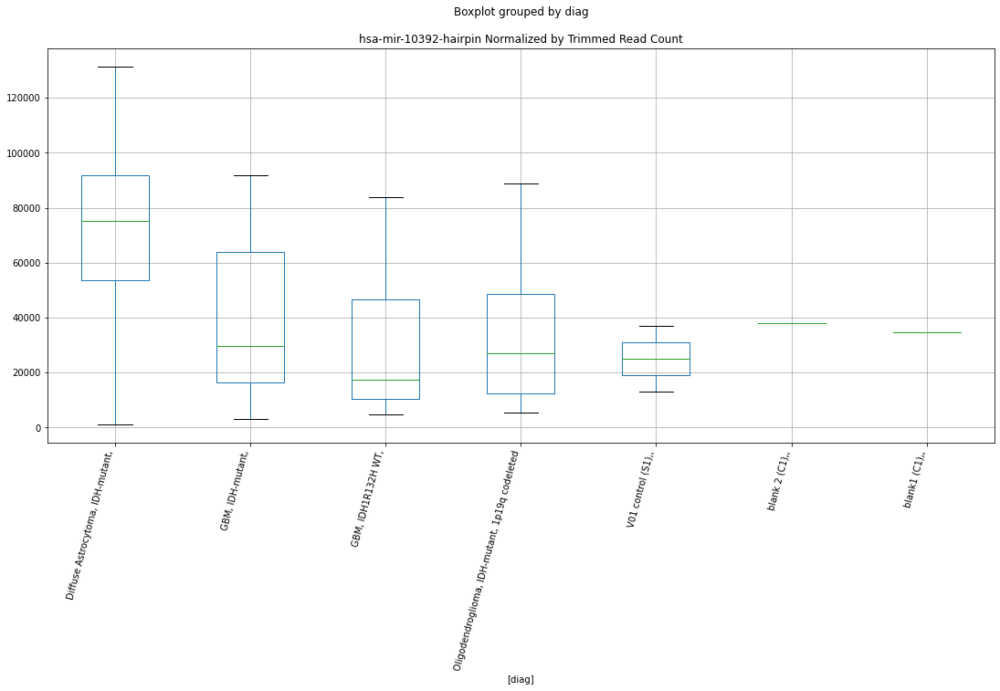

 p : 0.006555479307903318  ( t : 3.072964706392886 ) :  D-plex  :  bbduk2  :  hsa-mir-8084-hairpin
Control and blanks
73     107448.167854
337    223429.473285
Name: hsa-mir-8084-hairpin, dtype: float64
205    64830.924709
Name: hsa-mir-8084-hairpin, dtype: float64
469    80447.715196
Name: hsa-mir-8084-hairpin, dtype: float64


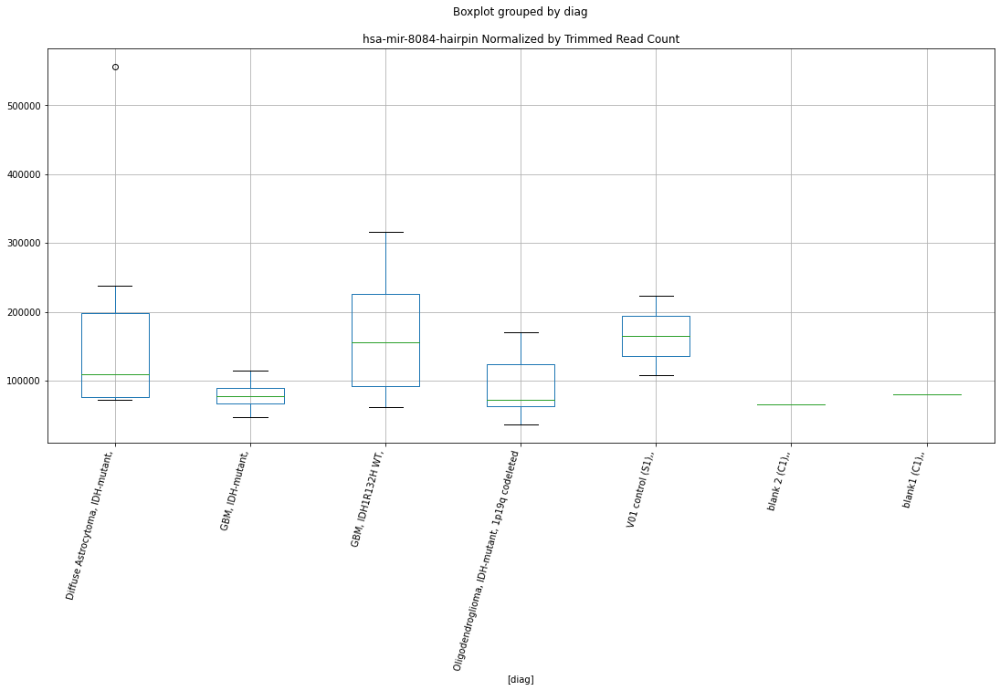

 p : 0.006559601201918643  ( t : 3.0726769130865392 ) :  D-plex  :  cutadapt2  :  hsa-mir-3620-3p-mature
Control and blanks
76     0.0
340    0.0
Name: hsa-mir-3620-3p-mature, dtype: float64
208    1234.521525
Name: hsa-mir-3620-3p-mature, dtype: float64
472    3467.735037
Name: hsa-mir-3620-3p-mature, dtype: float64


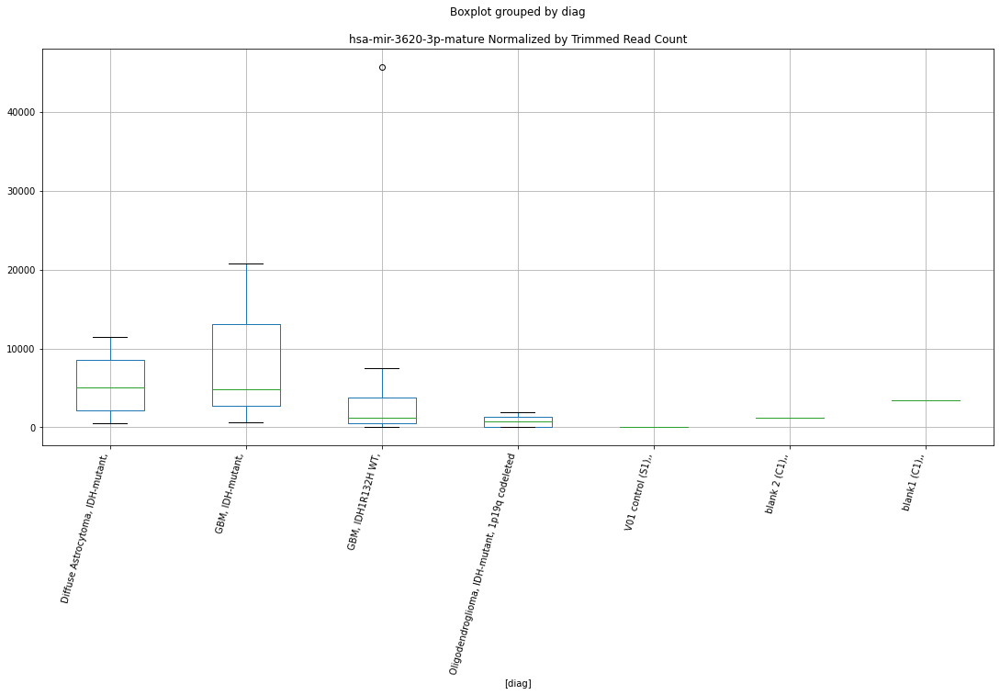

 p : 0.006576783397811875  ( t : 3.0714791355985334 ) :  D-plex  :  cutadapt2  :  hsa-mir-3130-1-hairpin
Control and blanks
76     64397.20804
340     3522.92854
Name: hsa-mir-3130-1-hairpin, dtype: float64
208    112517.818996
Name: hsa-mir-3130-1-hairpin, dtype: float64
472    45658.511324
Name: hsa-mir-3130-1-hairpin, dtype: float64


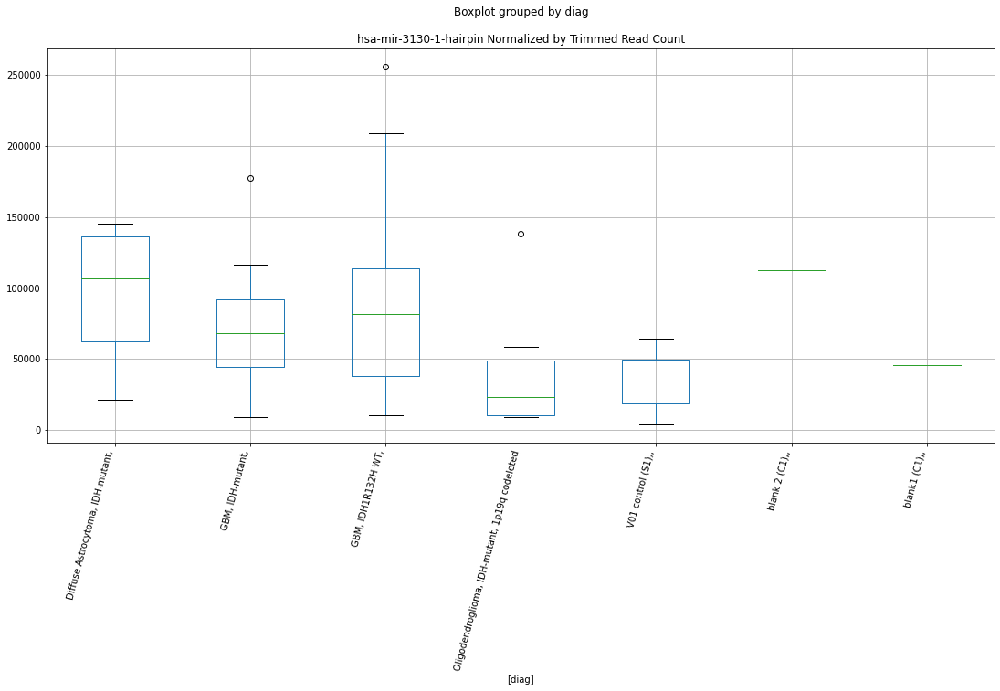

 p : 0.006576783397811875  ( t : 3.0714791355985334 ) :  D-plex  :  cutadapt2  :  hsa-mir-3130-2-hairpin
Control and blanks
76     64397.20804
340     3522.92854
Name: hsa-mir-3130-2-hairpin, dtype: float64
208    112517.818996
Name: hsa-mir-3130-2-hairpin, dtype: float64
472    45658.511324
Name: hsa-mir-3130-2-hairpin, dtype: float64


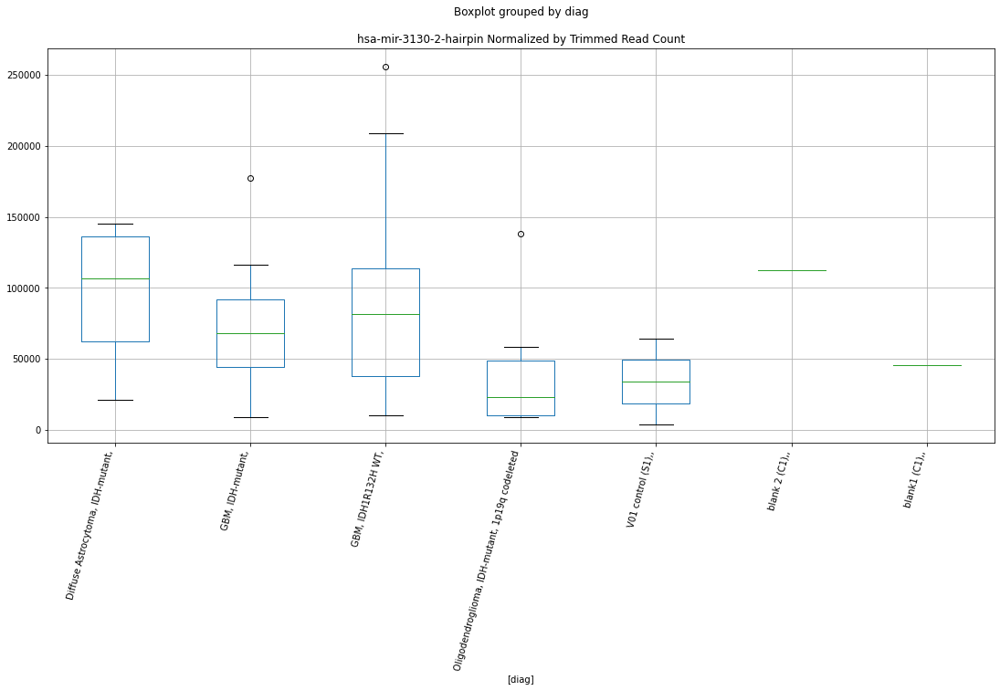

 p : 0.006596072513264122  ( t : 3.0701381100704226 ) :  Lexogen  :  bbduk2  :  hsa-mir-4800-hairpin
Control and blanks
79     1430.598791
343    1273.885891
Name: hsa-mir-4800-hairpin, dtype: float64
211    2733.063343
Name: hsa-mir-4800-hairpin, dtype: float64
475    3113.704588
Name: hsa-mir-4800-hairpin, dtype: float64


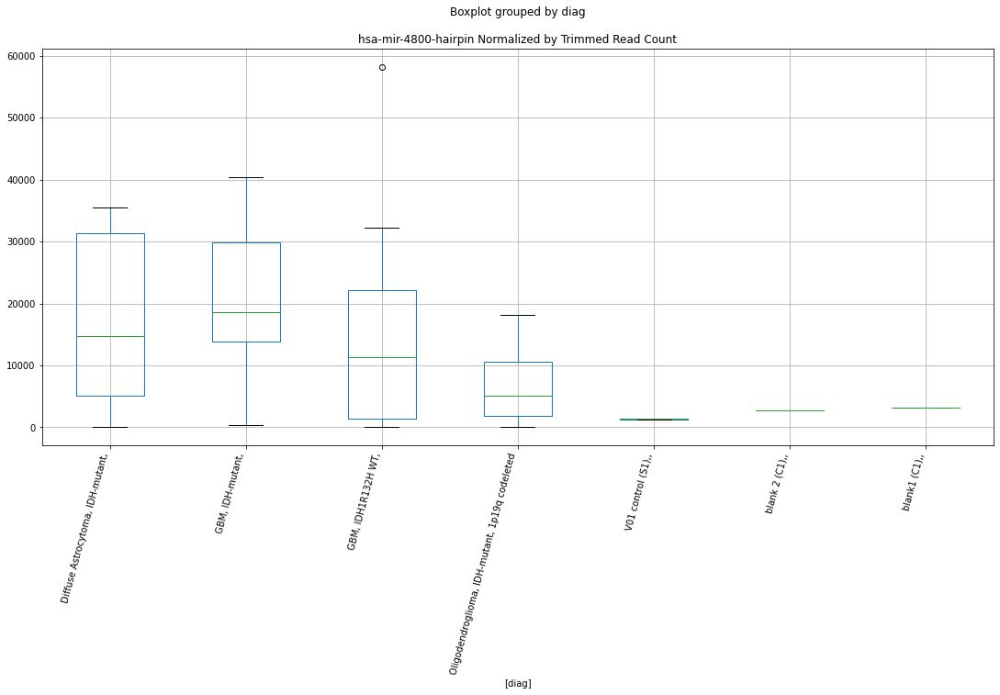

 p : 0.006626115075870326  ( t : 3.0680570671634593 ) :  Lexogen  :  cutadapt2  :  hsa-mir-184-hairpin
Control and blanks
82      8520.306731
346    34511.261614
Name: hsa-mir-184-hairpin, dtype: float64
214    2712.264535
Name: hsa-mir-184-hairpin, dtype: float64
478    7598.735475
Name: hsa-mir-184-hairpin, dtype: float64


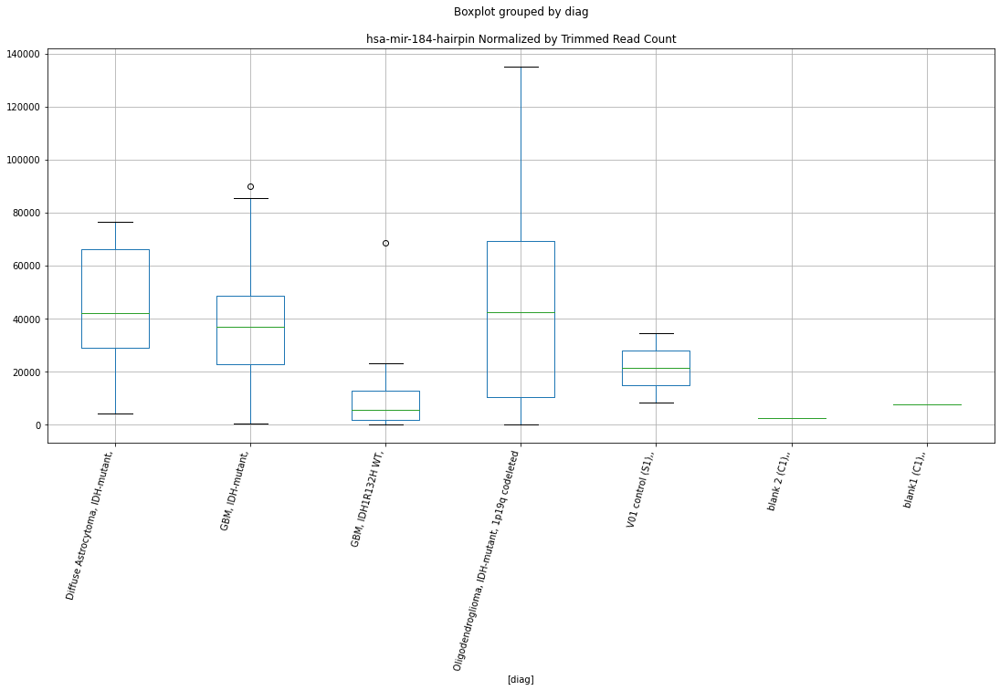

 p : 0.006664463613001399  ( t : 3.065413981261943 ) :  D-plex  :  bbduk2  :  hsa-mir-9-1-hairpin
Control and blanks
73     118270.285480
337    145095.634046
Name: hsa-mir-9-1-hairpin, dtype: float64
205    90978.203736
Name: hsa-mir-9-1-hairpin, dtype: float64
469    44364.548821
Name: hsa-mir-9-1-hairpin, dtype: float64


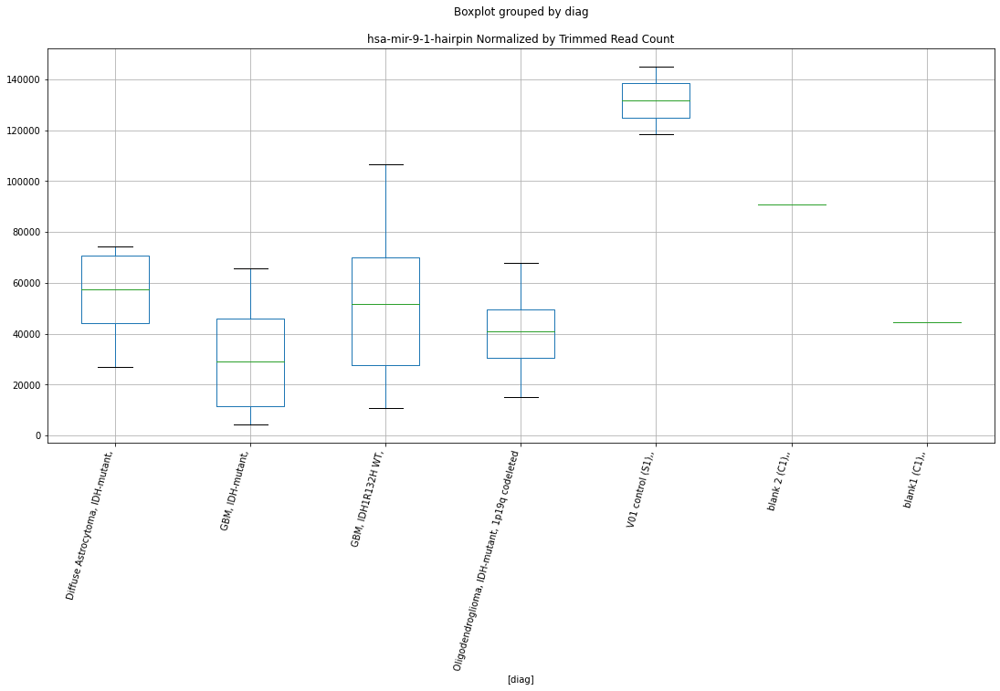

 p : 0.006716444075265163  ( t : 3.061854890168784 ) :  D-plex  :  cutadapt2  :  hsa-mir-6794-5p-mature
Control and blanks
76     27274.111641
340     1761.464270
Name: hsa-mir-6794-5p-mature, dtype: float64
208    35624.764008
Name: hsa-mir-6794-5p-mature, dtype: float64
472    10981.160951
Name: hsa-mir-6794-5p-mature, dtype: float64


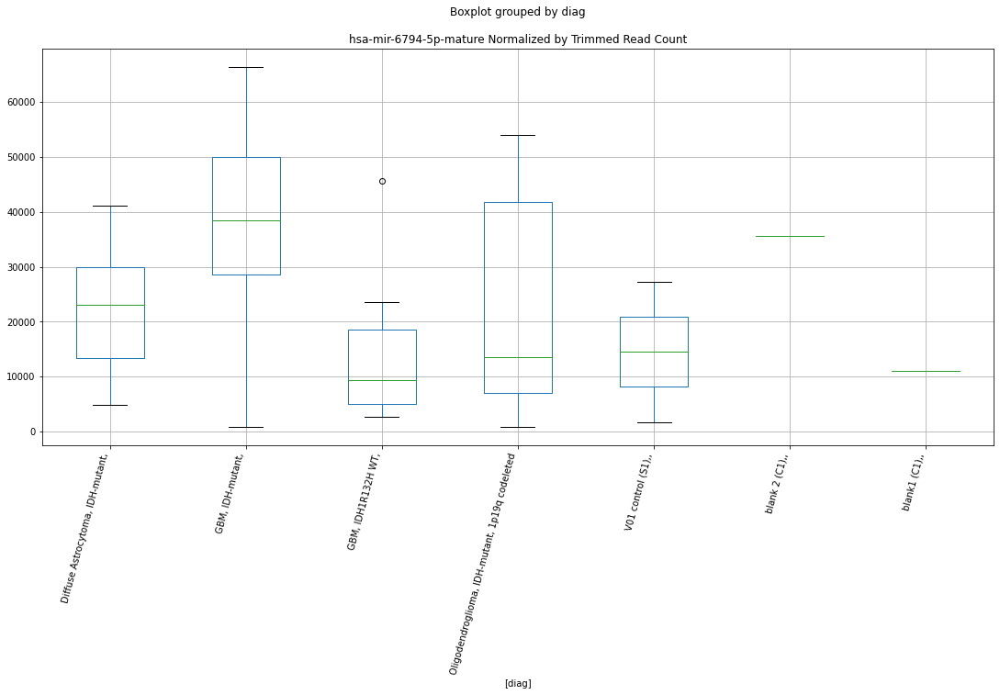

 p : 0.0068216192094144555  ( t : 3.0547348654974877 ) :  D-plex  :  cutadapt2  :  hsa-mir-1343-5p-mature
Control and blanks
76     5303.299486
340    2642.196405
Name: hsa-mir-1343-5p-mature, dtype: float64
208    20810.505708
Name: hsa-mir-1343-5p-mature, dtype: float64
472    11559.116791
Name: hsa-mir-1343-5p-mature, dtype: float64


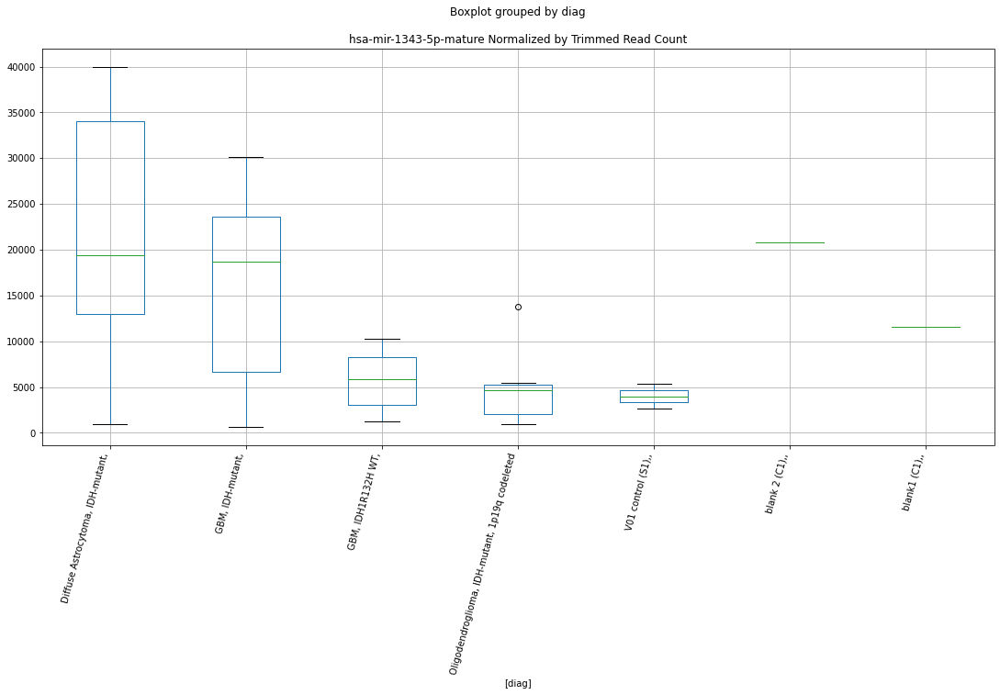

 p : 0.0068685120127693735  ( t : 3.0515947466286772 ) :  D-plex  :  bbduk2  :  hsa-mir-6794-5p-mature
Control and blanks
73     26282.285662
337     1780.314528
Name: hsa-mir-6794-5p-mature, dtype: float64
205    35639.099495
Name: hsa-mir-6794-5p-mature, dtype: float64
469    11239.019035
Name: hsa-mir-6794-5p-mature, dtype: float64


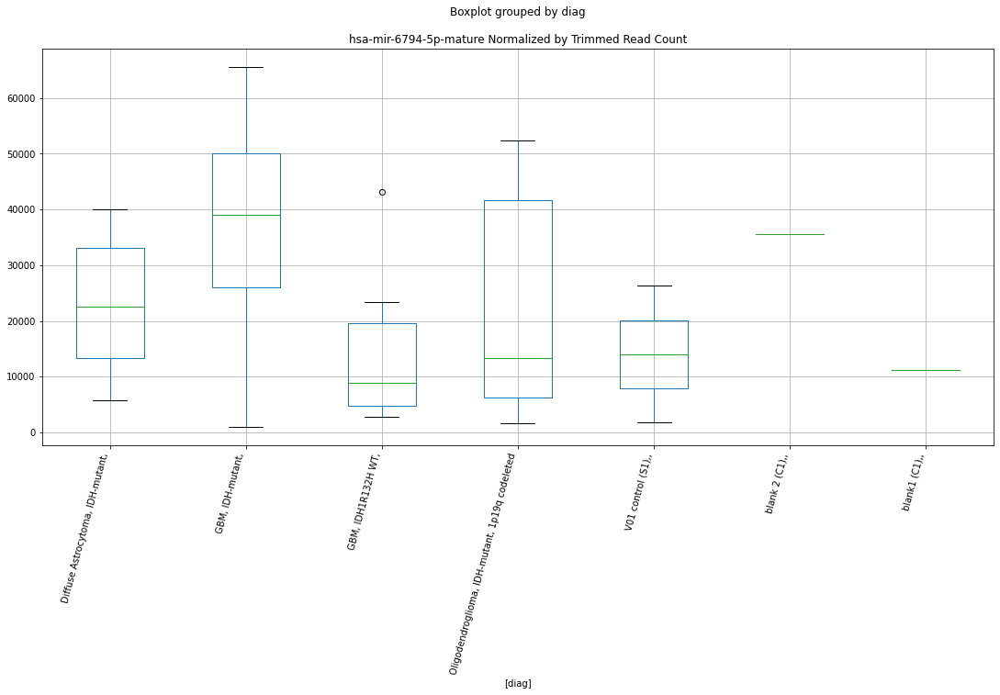

 p : 0.006881730348063818  ( t : 3.0507133661244024 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3141-mature
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-3141-mature, dtype: float64
214    1898.585174
Name: hsa-mir-3141-mature, dtype: float64
478    0.0
Name: hsa-mir-3141-mature, dtype: float64


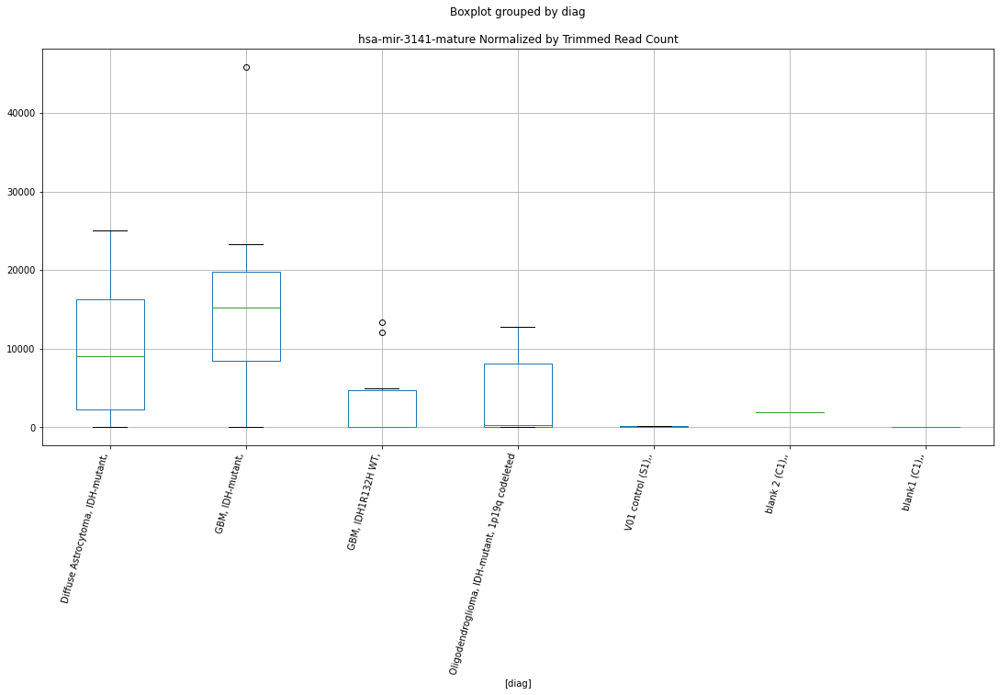

 p : 0.0069033793798115185  ( t : 3.0492733907035268 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6727-hairpin
Control and blanks
82         0.000000
346    16624.327241
Name: hsa-mir-6727-hairpin, dtype: float64
214    5966.981976
Name: hsa-mir-6727-hairpin, dtype: float64
478    6173.972574
Name: hsa-mir-6727-hairpin, dtype: float64


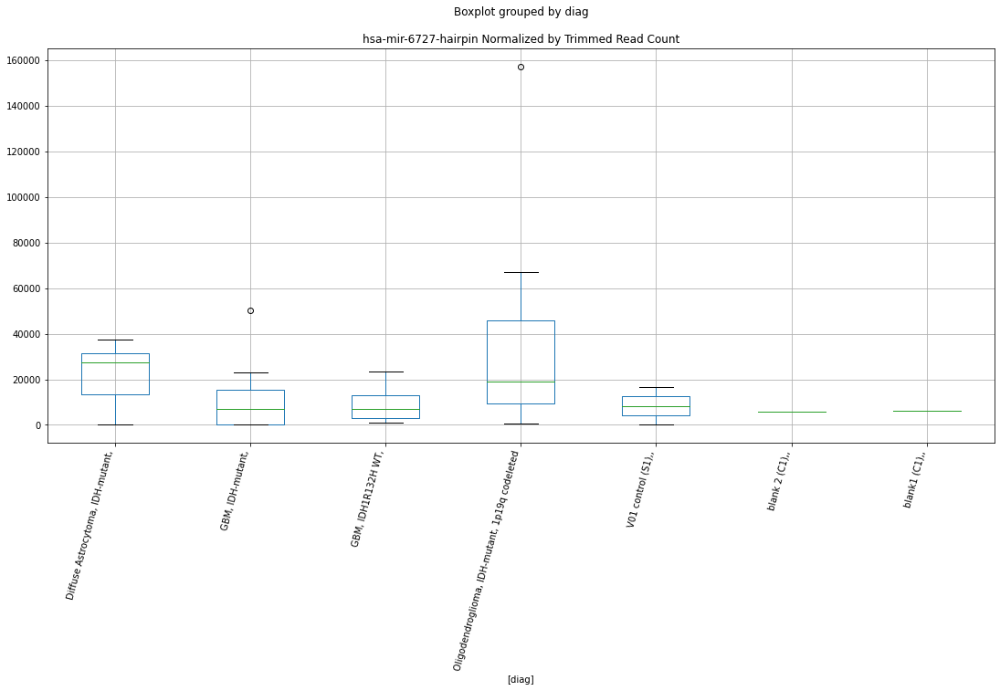

 p : 0.006951691252680666  ( t : 3.0460757282006696 ) :  D-plex  :  bbduk2  :  hsa-mir-548f-5-hairpin
Control and blanks
73     138368.503927
337     54299.593109
Name: hsa-mir-548f-5-hairpin, dtype: float64
205    56413.649954
Name: hsa-mir-548f-5-hairpin, dtype: float64
469    62110.36835
Name: hsa-mir-548f-5-hairpin, dtype: float64


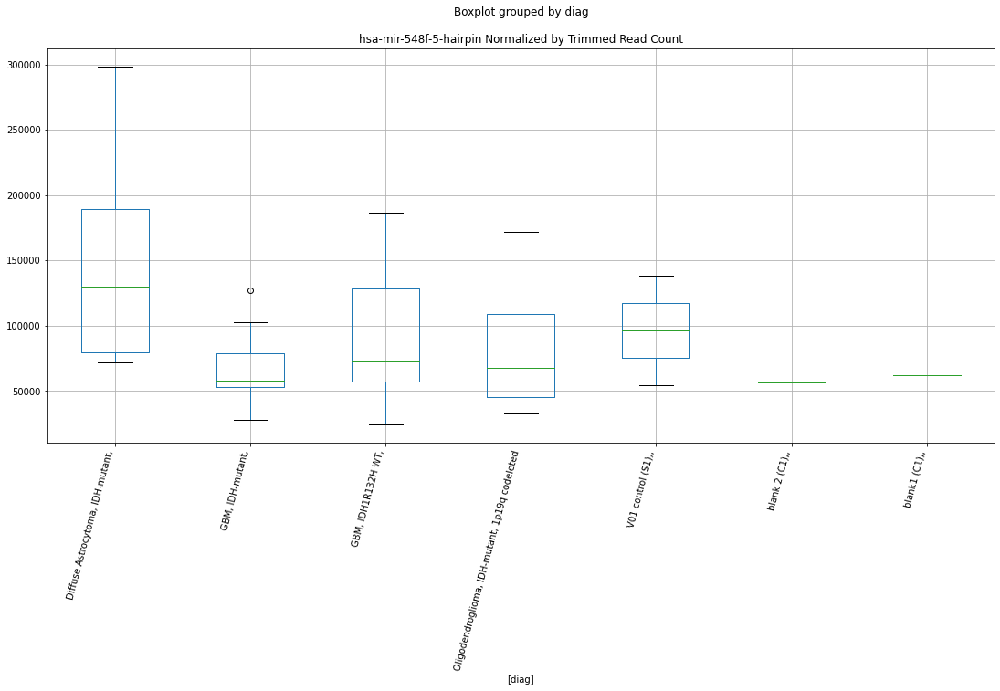

 p : 0.0069652886721475295  ( t : 3.045179641907967 ) :  D-plex  :  cutadapt2  :  hsa-mir-6073-mature
Control and blanks
76         0.00000
340    12330.24989
Name: hsa-mir-6073-mature, dtype: float64
208    2645.403268
Name: hsa-mir-6073-mature, dtype: float64
472    2889.779198
Name: hsa-mir-6073-mature, dtype: float64


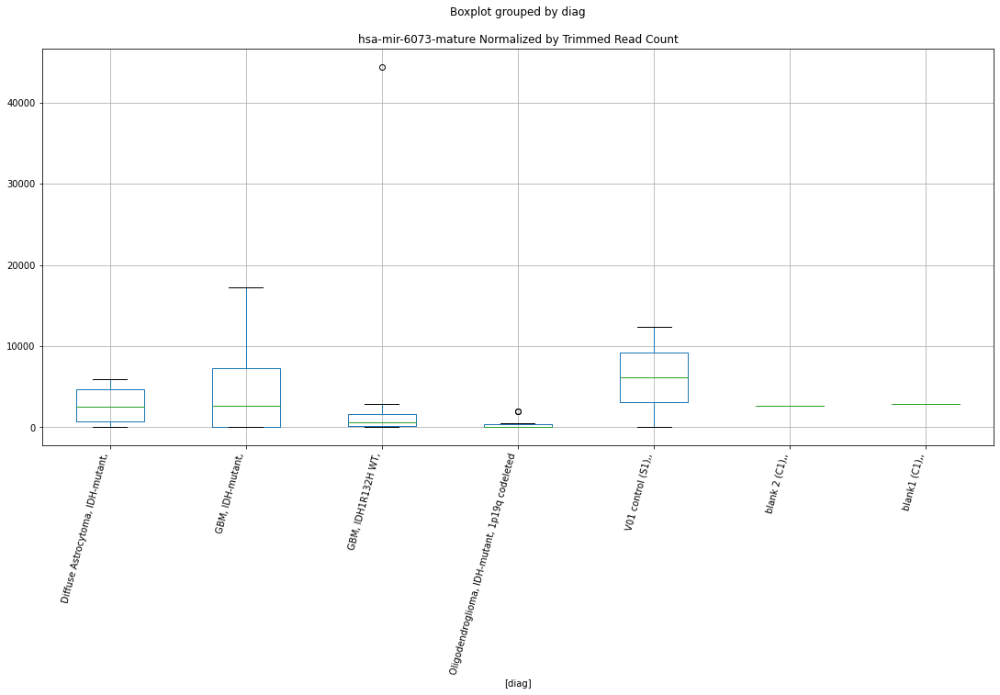

 p : 0.007004879913482656  ( t : 3.0425801899597857 ) :  D-plex  :  bbduk2  :  hsa-mir-10392-hairpin
Control and blanks
73     38650.420091
337    13352.358961
Name: hsa-mir-10392-hairpin, dtype: float64
205    38862.736635
Name: hsa-mir-10392-hairpin, dtype: float64
469    34900.11174
Name: hsa-mir-10392-hairpin, dtype: float64


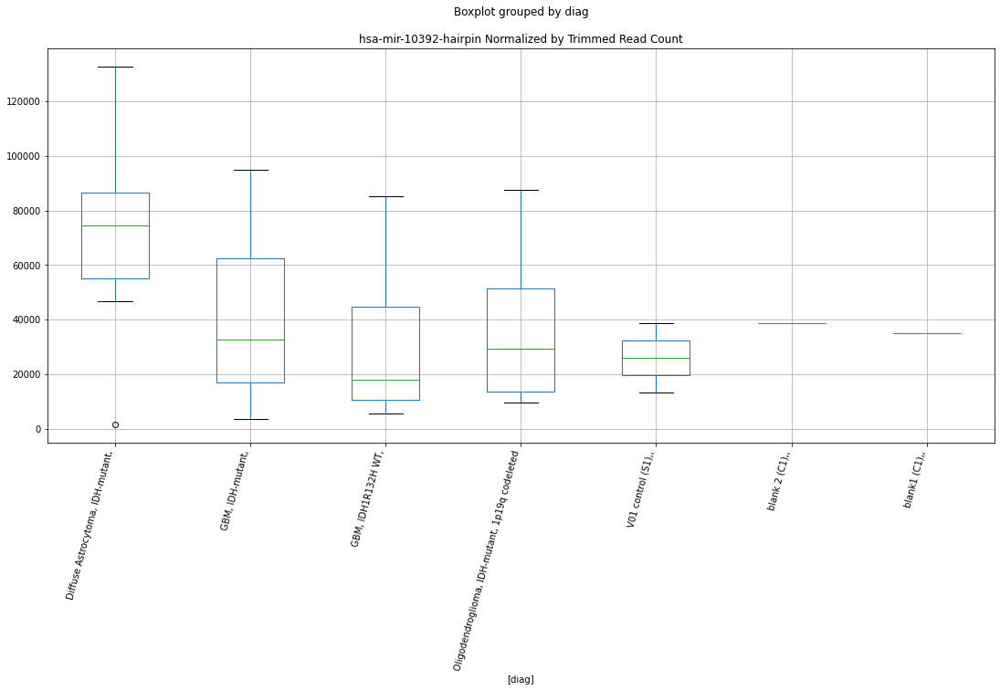

 p : 0.007040830418510649  ( t : 3.0402321297679205 ) :  D-plex  :  bbduk2  :  hsa-mir-4672-hairpin
Control and blanks
73      26282.285662
337    380987.309028
Name: hsa-mir-4672-hairpin, dtype: float64
205    96709.114207
Name: hsa-mir-4672-hairpin, dtype: float64
469    89320.62496
Name: hsa-mir-4672-hairpin, dtype: float64


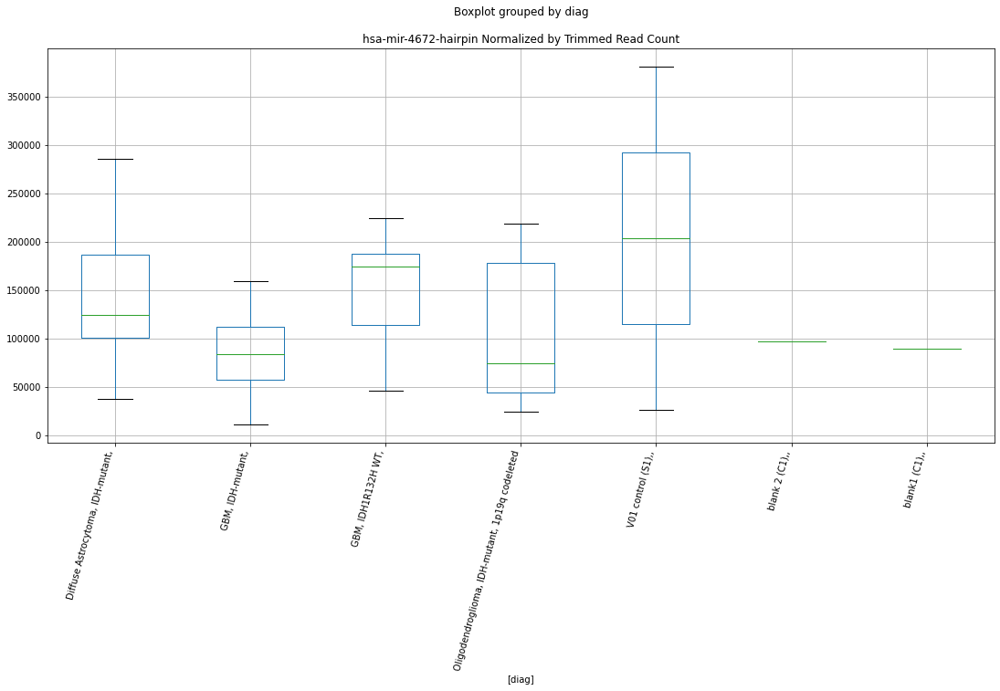

 p : 0.007062627541542333  ( t : 3.0388141512450155 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4421-hairpin
Control and blanks
82         0.000000
346    12205.202278
Name: hsa-mir-4421-hairpin, dtype: float64
214    0.0
Name: hsa-mir-4421-hairpin, dtype: float64
478    0.0
Name: hsa-mir-4421-hairpin, dtype: float64


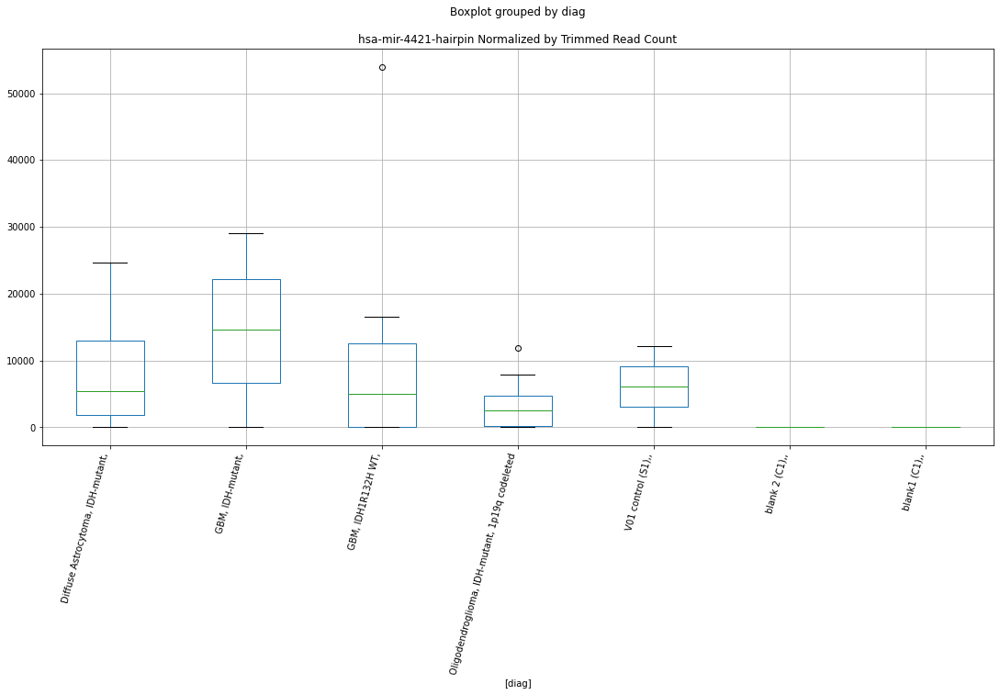

 p : 0.0070985244020379465  ( t : 3.036488186249641 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-1-hairpin
Control and blanks
76     3030.456849
340    2642.196405
Name: hsa-mir-3199-1-hairpin, dtype: float64
208    11287.053943
Name: hsa-mir-3199-1-hairpin, dtype: float64
472    9825.249272
Name: hsa-mir-3199-1-hairpin, dtype: float64


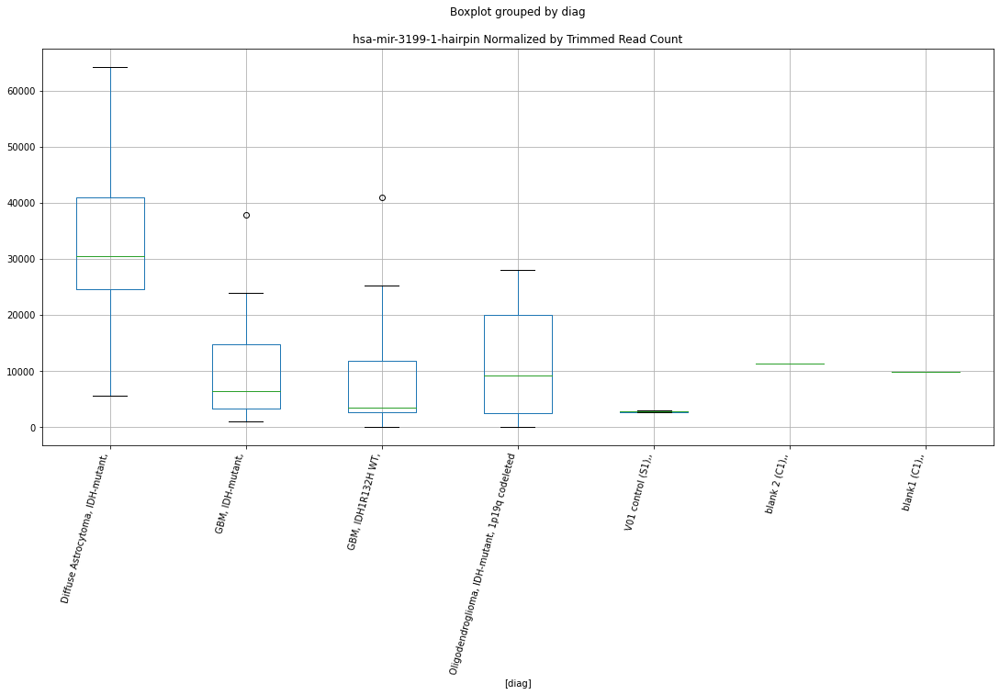

 p : 0.007104657857719894  ( t : 3.036091908774498 ) :  Lexogen  :  bbduk2  :  hsa-mir-6780b-3p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-6780b-3p-mature, dtype: float64
211    1913.14434
Name: hsa-mir-6780b-3p-mature, dtype: float64
475    0.0
Name: hsa-mir-6780b-3p-mature, dtype: float64


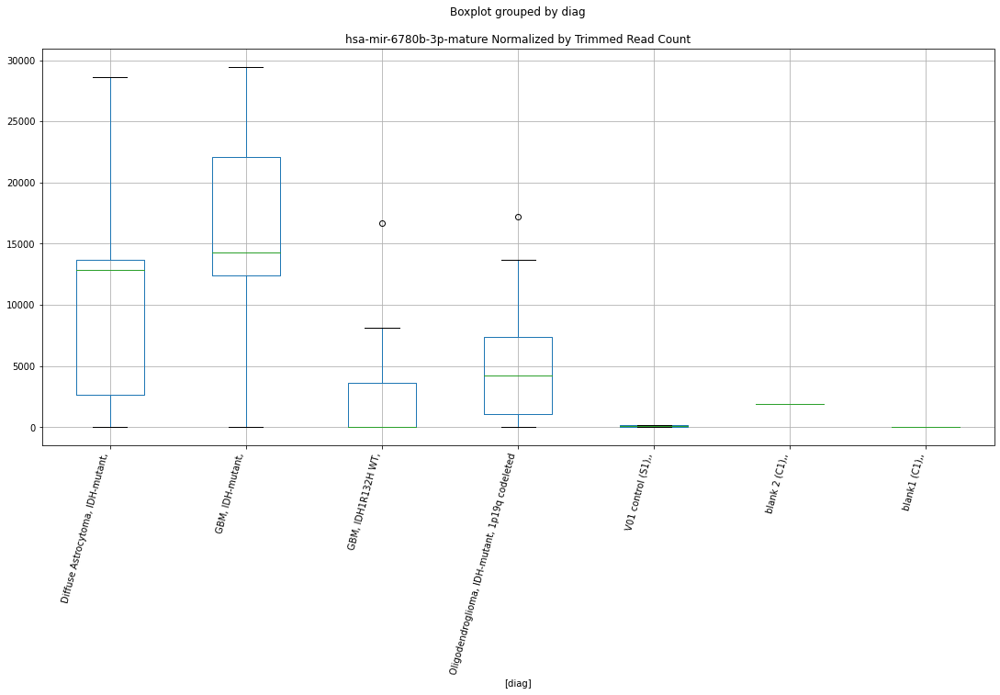

 p : 0.007133538910417155  ( t : 3.034230388084381 ) :  D-plex  :  cutadapt2  :  hsa-mir-3907-hairpin
Control and blanks
76     252285.532675
340     71339.302936
Name: hsa-mir-3907-hairpin, dtype: float64
208    207399.616205
Name: hsa-mir-3907-hairpin, dtype: float64
472    141021.22485
Name: hsa-mir-3907-hairpin, dtype: float64


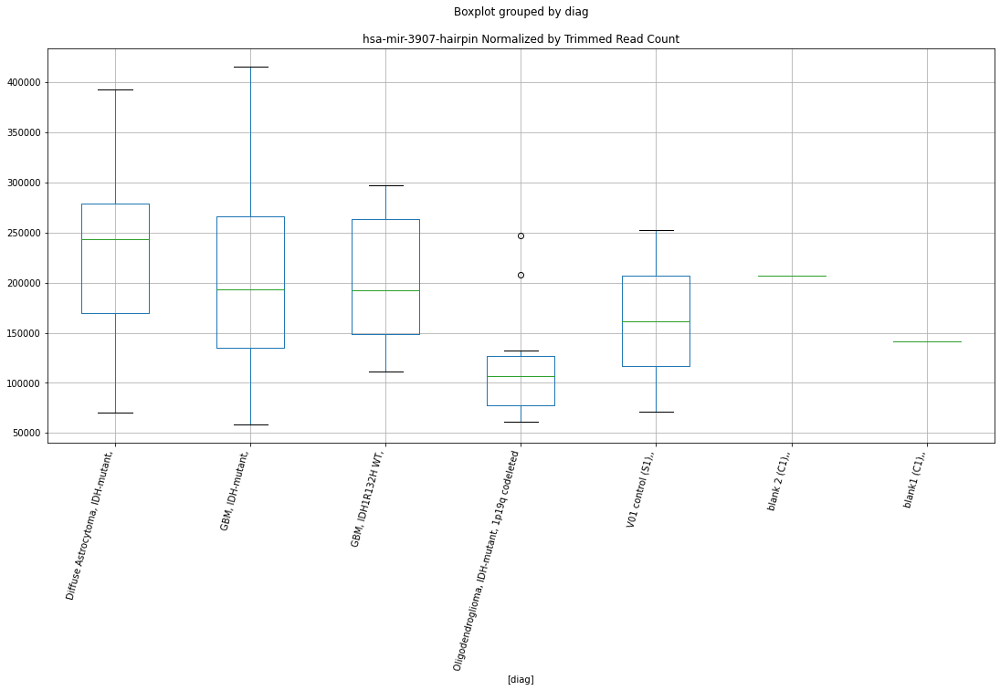

 p : 0.007142454986551697  ( t : 3.0336571849915988 ) :  Lexogen  :  bbduk2  :  hsa-mir-4421-hairpin
Control and blanks
79         0.000000
343    12738.858912
Name: hsa-mir-4421-hairpin, dtype: float64
211    273.306334
Name: hsa-mir-4421-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-4421-hairpin, dtype: float64


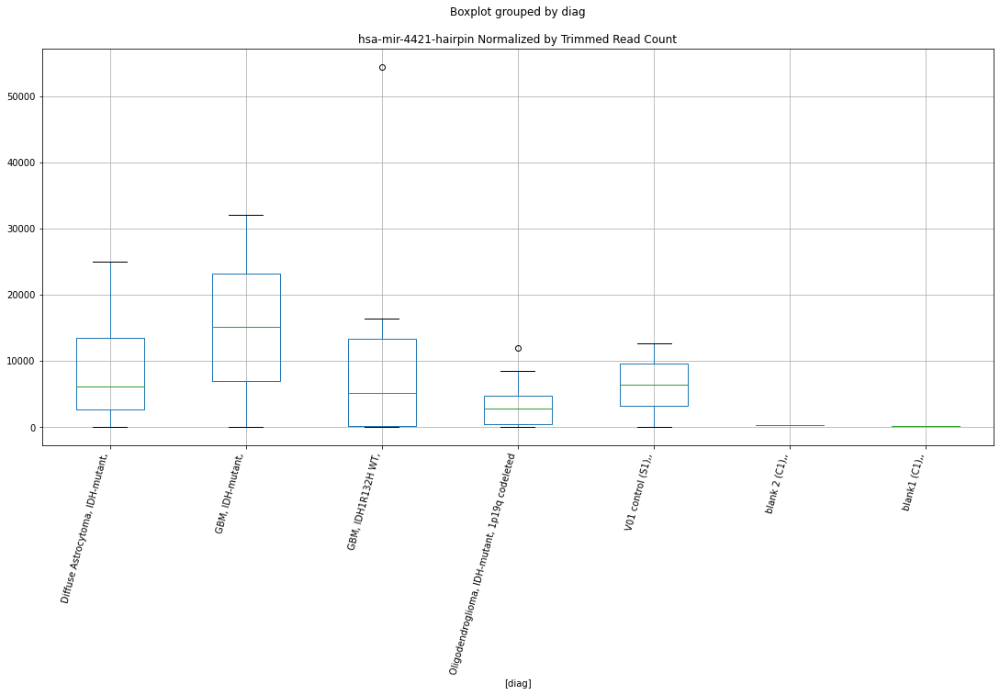

 p : 0.007202826575658416  ( t : 3.0297941797366317 ) :  D-plex  :  cutadapt2  :  hsa-mir-4477a-hairpin
Control and blanks
76      3030.456849
340    19376.106970
Name: hsa-mir-4477a-hairpin, dtype: float64
208    27864.914422
Name: hsa-mir-4477a-hairpin, dtype: float64
472    28319.836138
Name: hsa-mir-4477a-hairpin, dtype: float64


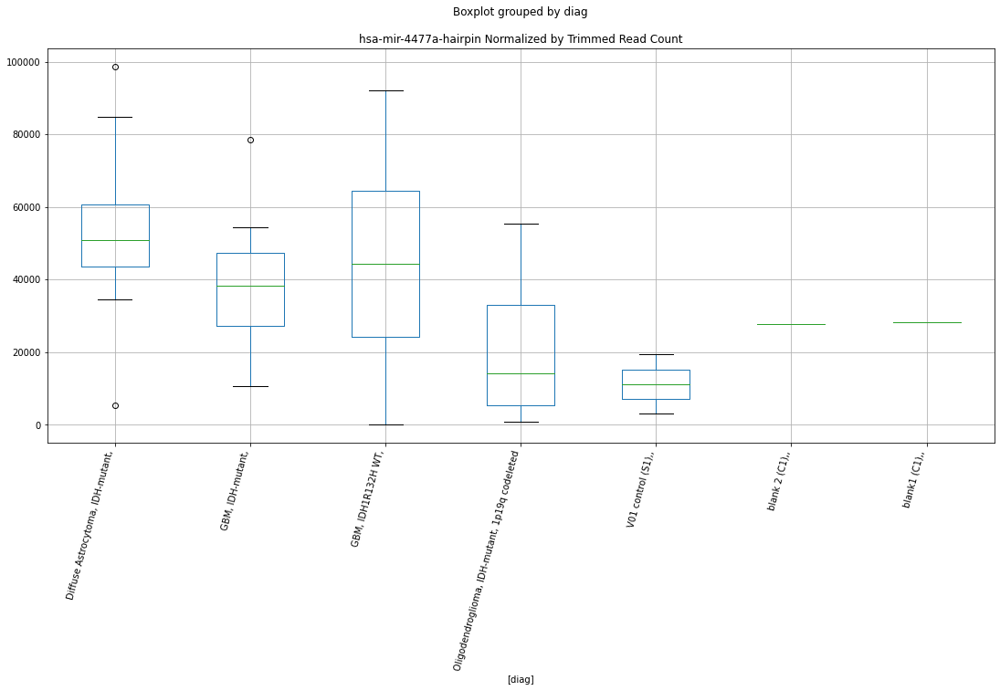

 p : 0.007202826575658416  ( t : 3.0297941797366317 ) :  D-plex  :  cutadapt2  :  hsa-mir-4477b-hairpin
Control and blanks
76      3030.456849
340    19376.106970
Name: hsa-mir-4477b-hairpin, dtype: float64
208    27864.914422
Name: hsa-mir-4477b-hairpin, dtype: float64
472    28319.836138
Name: hsa-mir-4477b-hairpin, dtype: float64


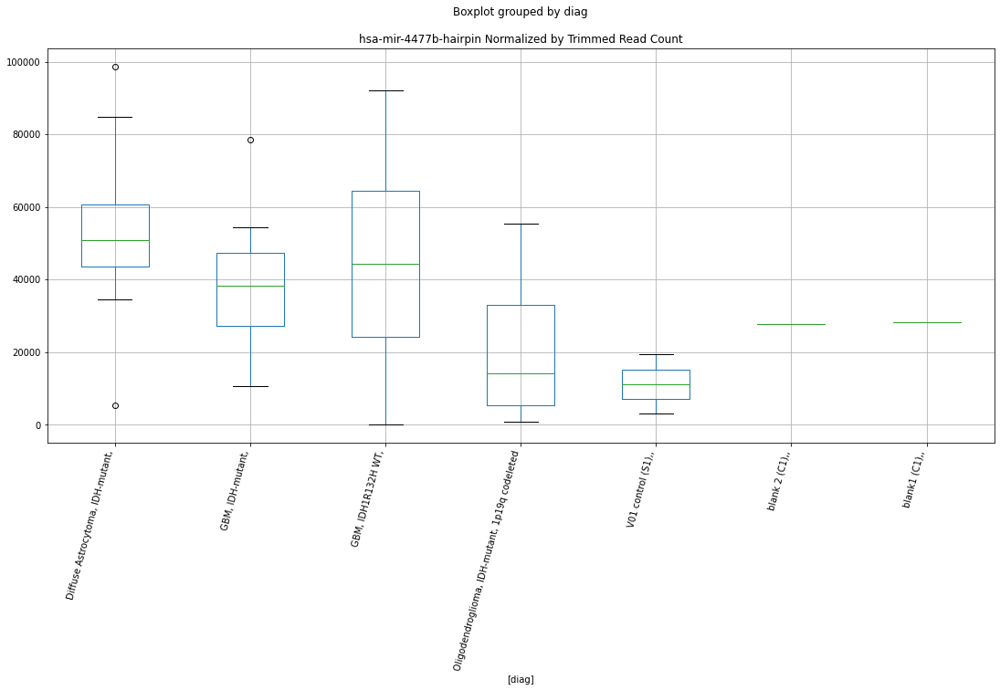

 p : 0.007208920899847757  ( t : 3.029405972160186 ) :  D-plex  :  bbduk2  :  hsa-mir-3059-3p-mature
Control and blanks
73     136049.478722
337     32045.661507
Name: hsa-mir-3059-3p-mature, dtype: float64
205    41549.100919
Name: hsa-mir-3059-3p-mature, dtype: float64
469    49688.29468
Name: hsa-mir-3059-3p-mature, dtype: float64


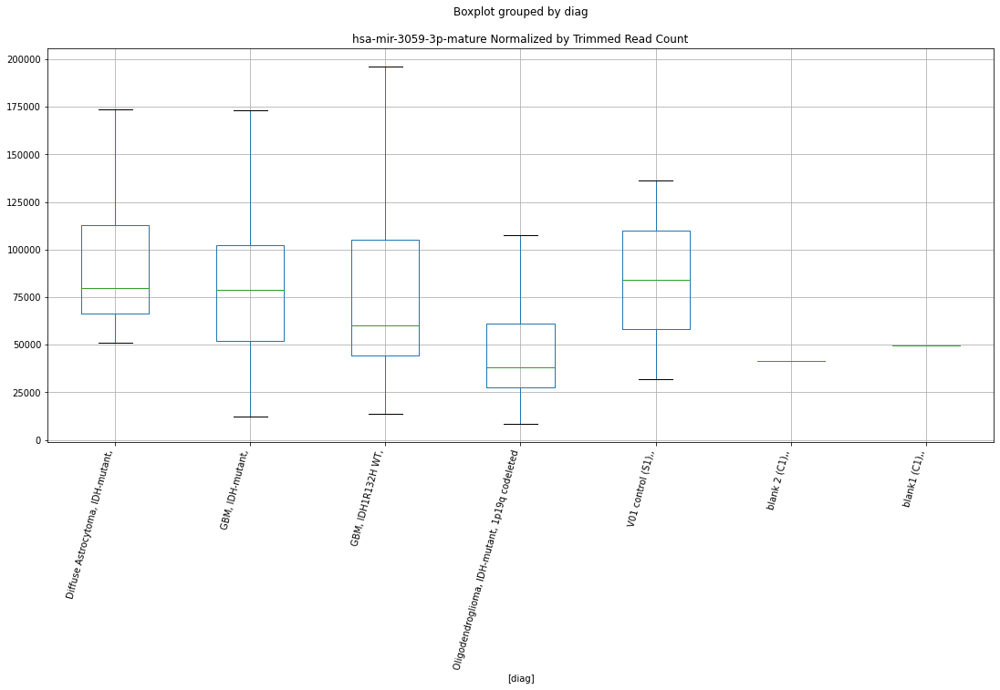

 p : 0.007211710758772366  ( t : 3.029228364992341 ) :  D-plex  :  bbduk2  :  hsa-mir-155-hairpin
Control and blanks
73     89668.974612
337     2670.471792
Name: hsa-mir-155-hairpin, dtype: float64
205    20595.459507
Name: hsa-mir-155-hairpin, dtype: float64
469    30759.420516
Name: hsa-mir-155-hairpin, dtype: float64


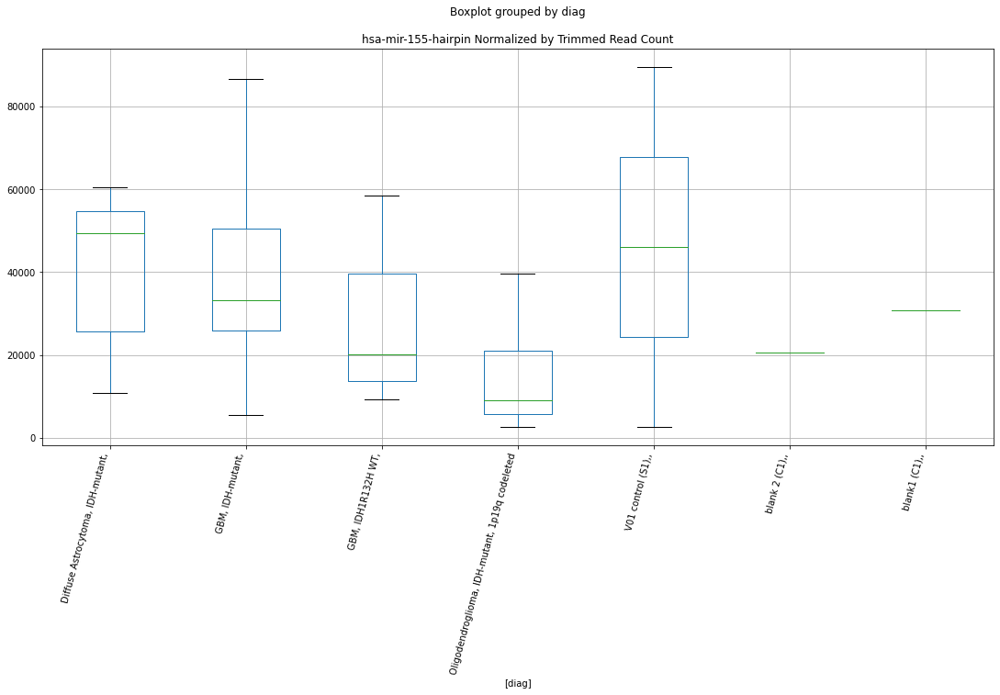

 p : 0.007225230243709355  ( t : 3.0283686365595868 ) :  D-plex  :  cutadapt2  :  hsa-mir-373-hairpin
Control and blanks
76     106065.989713
340      3522.928540
Name: hsa-mir-373-hairpin, dtype: float64
208    29981.237036
Name: hsa-mir-373-hairpin, dtype: float64
472    39300.997089
Name: hsa-mir-373-hairpin, dtype: float64


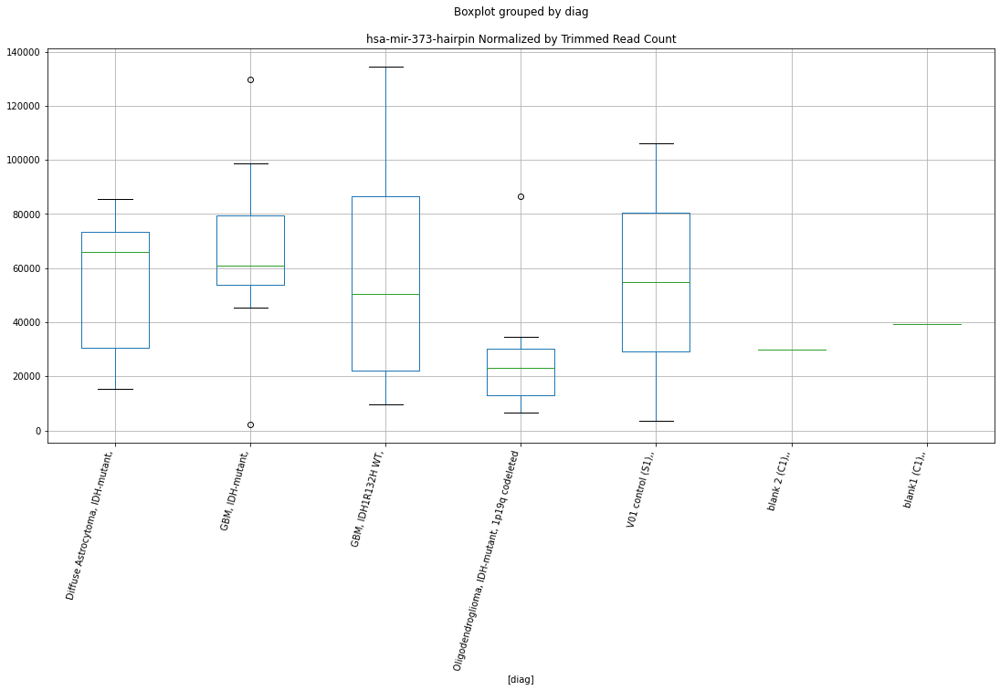

 p : 0.0072927091878451766  ( t : 3.024100774254661 ) :  D-plex  :  cutadapt2  :  hsa-mir-1915-hairpin
Control and blanks
76     113642.131835
340      8807.321350
Name: hsa-mir-1915-hairpin, dtype: float64
208    89590.990674
Name: hsa-mir-1915-hairpin, dtype: float64
472    33521.438694
Name: hsa-mir-1915-hairpin, dtype: float64


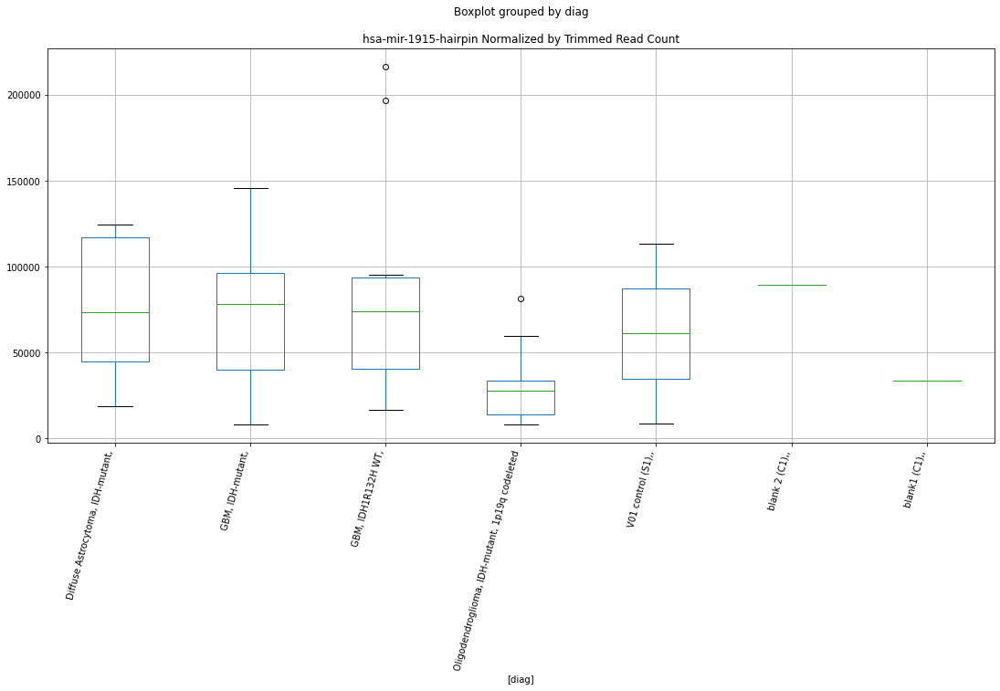

 p : 0.007313128838911931  ( t : 3.0228168490573966 ) :  D-plex  :  bbduk2  :  hsa-mir-4642-mature
Control and blanks
73     3092.033607
337       0.000000
Name: hsa-mir-4642-mature, dtype: float64
205    8596.365707
Name: hsa-mir-4642-mature, dtype: float64
469    11830.546352
Name: hsa-mir-4642-mature, dtype: float64


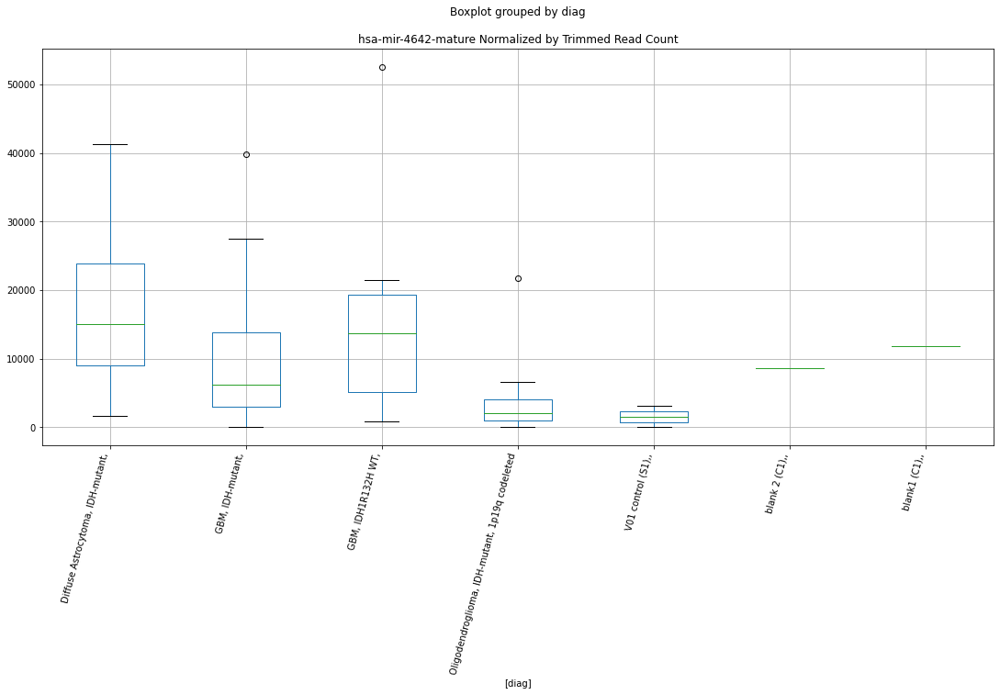

 p : 0.0073783343929654166  ( t : 3.01874012384742 ) :  Lexogen  :  bbduk2  :  hsa-mir-6727-hairpin
Control and blanks
79         0.000000
343    16772.830901
Name: hsa-mir-6727-hairpin, dtype: float64
211    6012.739355
Name: hsa-mir-6727-hairpin, dtype: float64
475    6227.409175
Name: hsa-mir-6727-hairpin, dtype: float64


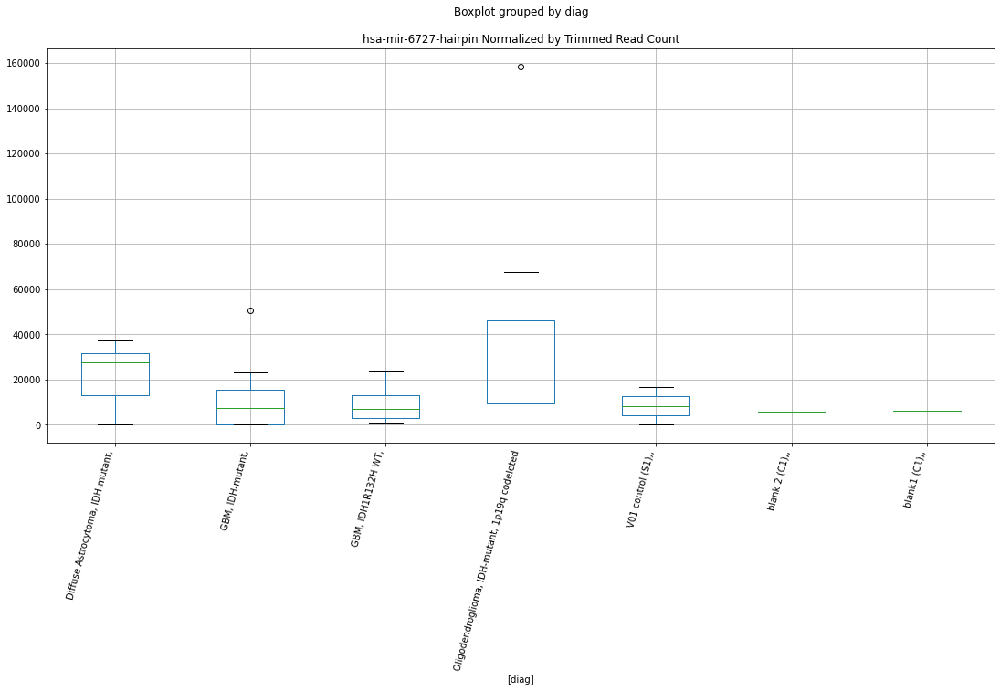

 p : 0.007389061224667331  ( t : 3.018072825403359 ) :  D-plex  :  cutadapt2  :  hsa-mir-548f-5-hairpin
Control and blanks
76     136370.558203
340     54605.392371
Name: hsa-mir-548f-5-hairpin, dtype: float64
208    54318.947101
Name: hsa-mir-548f-5-hairpin, dtype: float64
472    57217.628115
Name: hsa-mir-548f-5-hairpin, dtype: float64


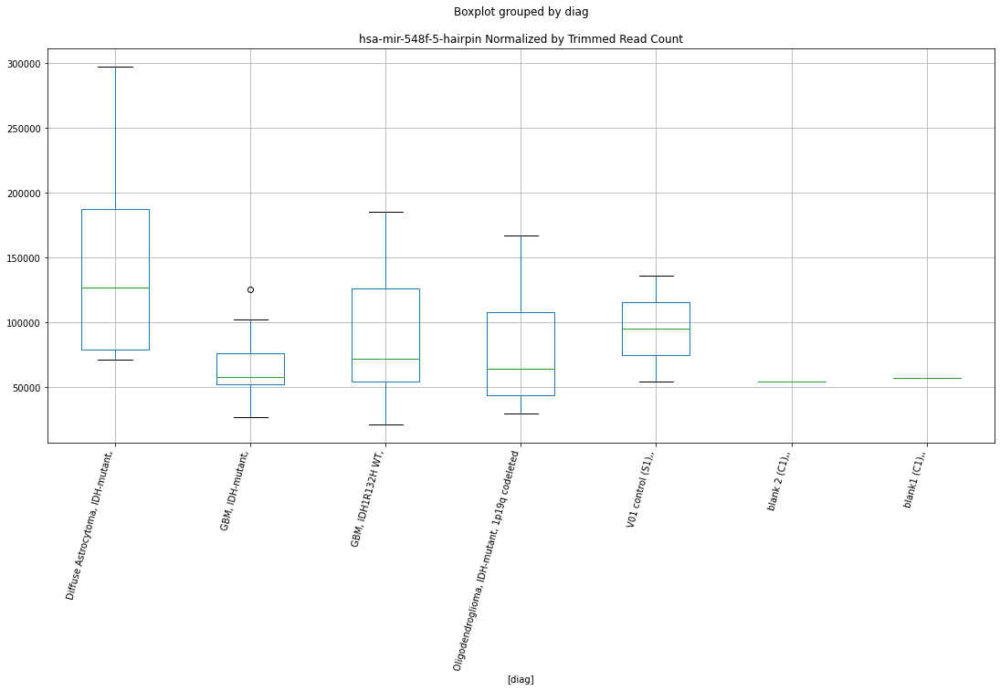

 p : 0.0075048571925919695  ( t : 3.010928671973357 ) :  Lexogen  :  bbduk2  :  hsa-mir-3942-hairpin
Control and blanks
79        0.000000
343    3184.714728
Name: hsa-mir-3942-hairpin, dtype: float64
211    819.919003
Name: hsa-mir-3942-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-3942-hairpin, dtype: float64


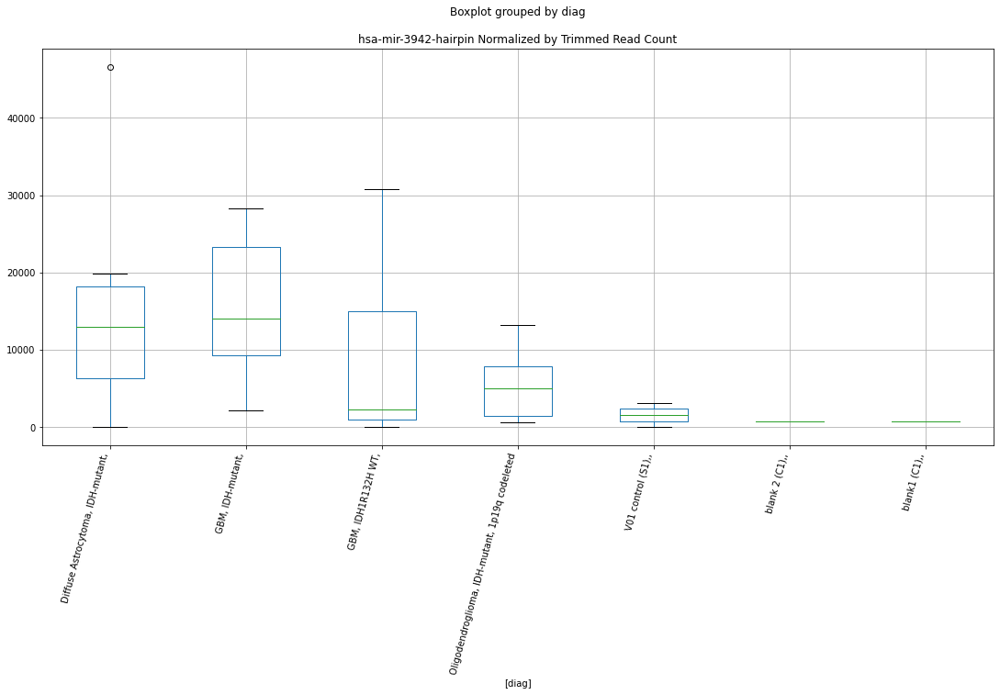

 p : 0.007514583485373978  ( t : 3.010333481790139 ) :  D-plex  :  bbduk2  :  hsa-mir-4756-hairpin
Control and blanks
73     26282.285662
337     2670.471792
Name: hsa-mir-4756-hairpin, dtype: float64
205    33848.189973
Name: hsa-mir-4756-hairpin, dtype: float64
469    28984.838563
Name: hsa-mir-4756-hairpin, dtype: float64


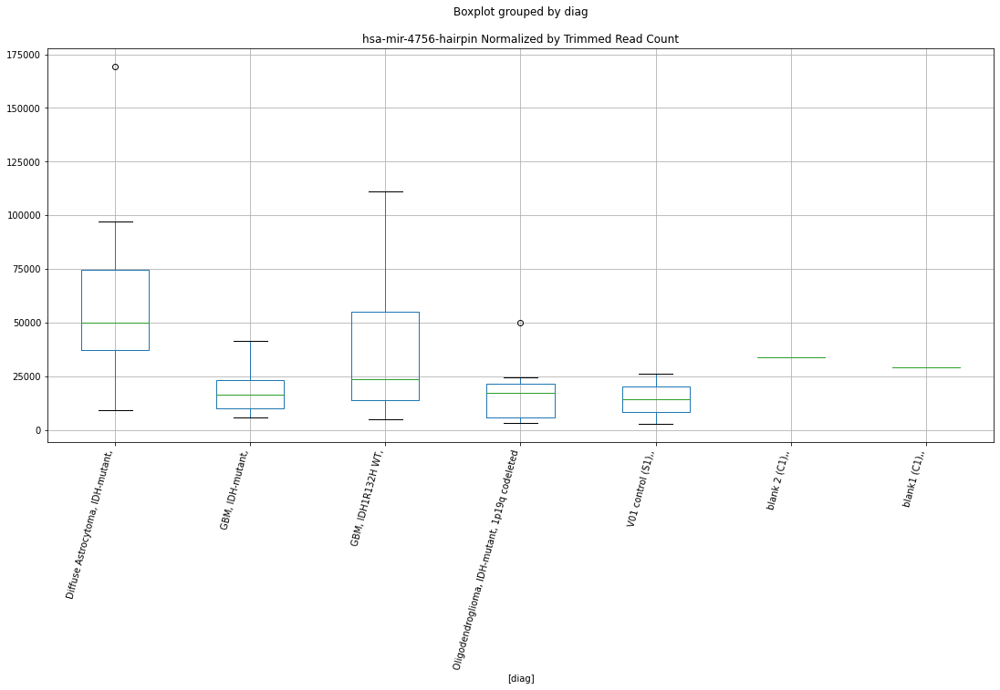

 p : 0.007516439513029894  ( t : 3.0102199891655794 ) :  Lexogen  :  bbduk2  :  hsa-mir-1178-hairpin
Control and blanks
79        0.000000
343    1273.885891
Name: hsa-mir-1178-hairpin, dtype: float64
211    2186.450674
Name: hsa-mir-1178-hairpin, dtype: float64
475    718.547213
Name: hsa-mir-1178-hairpin, dtype: float64


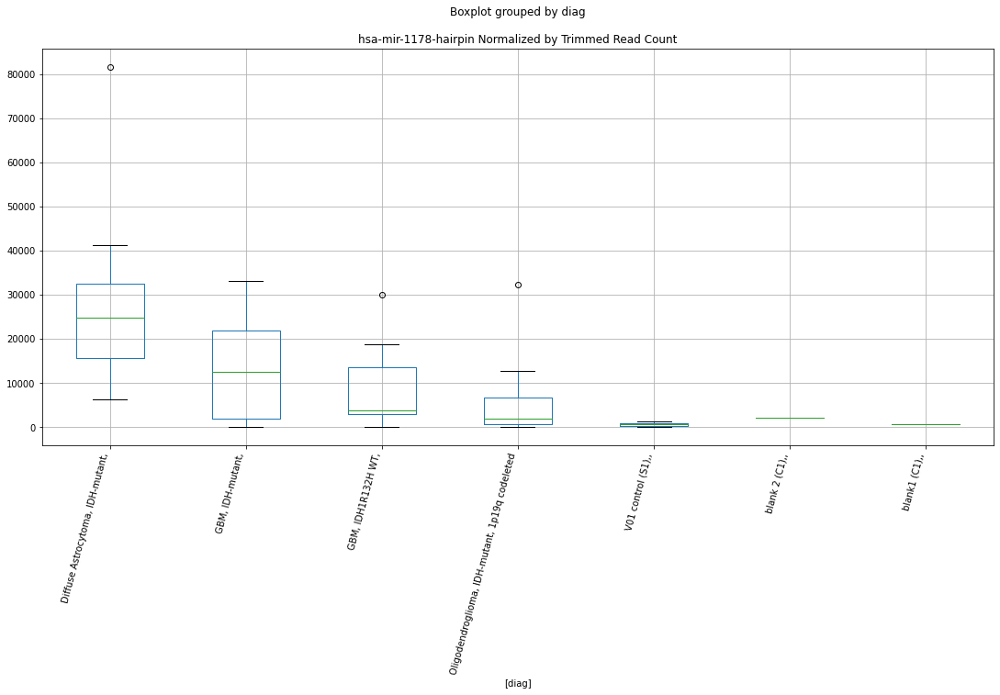

 p : 0.0075222804237732544  ( t : 3.009863005916002 ) :  Lexogen  :  bbduk2  :  hsa-mir-3141-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-3141-mature, dtype: float64
211    1913.14434
Name: hsa-mir-3141-mature, dtype: float64
475    0.0
Name: hsa-mir-3141-mature, dtype: float64


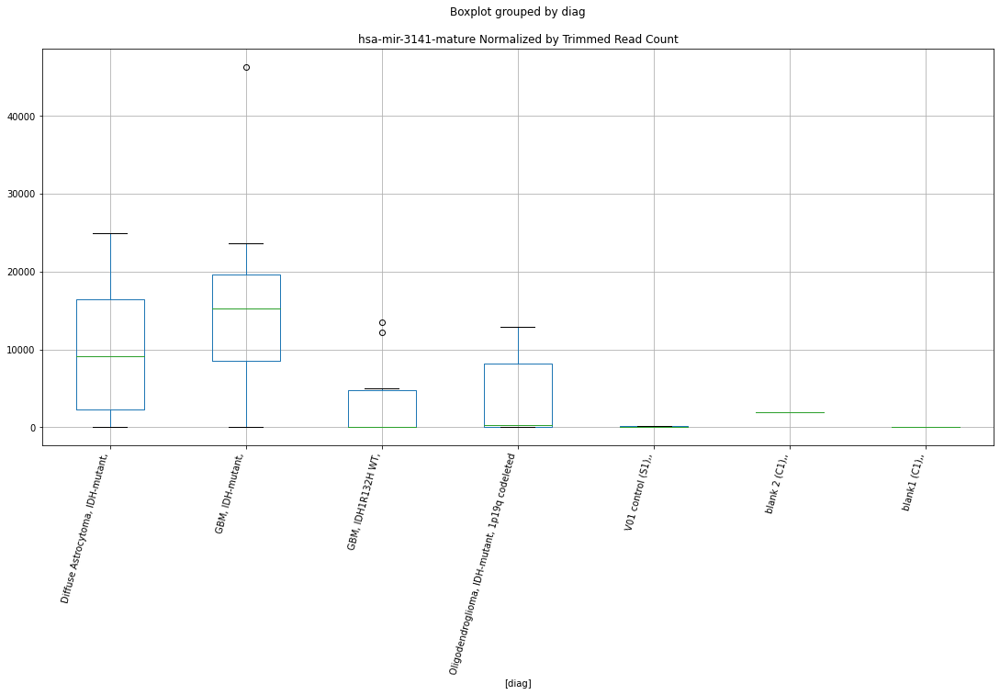

 p : 0.00758232737331699  ( t : 3.0062086027341772 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-1-hairpin
Control and blanks
76     3030.456849
340    2642.196405
Name: hsa-mir-3199-1-hairpin, dtype: float64
208    11287.053943
Name: hsa-mir-3199-1-hairpin, dtype: float64
472    9825.249272
Name: hsa-mir-3199-1-hairpin, dtype: float64


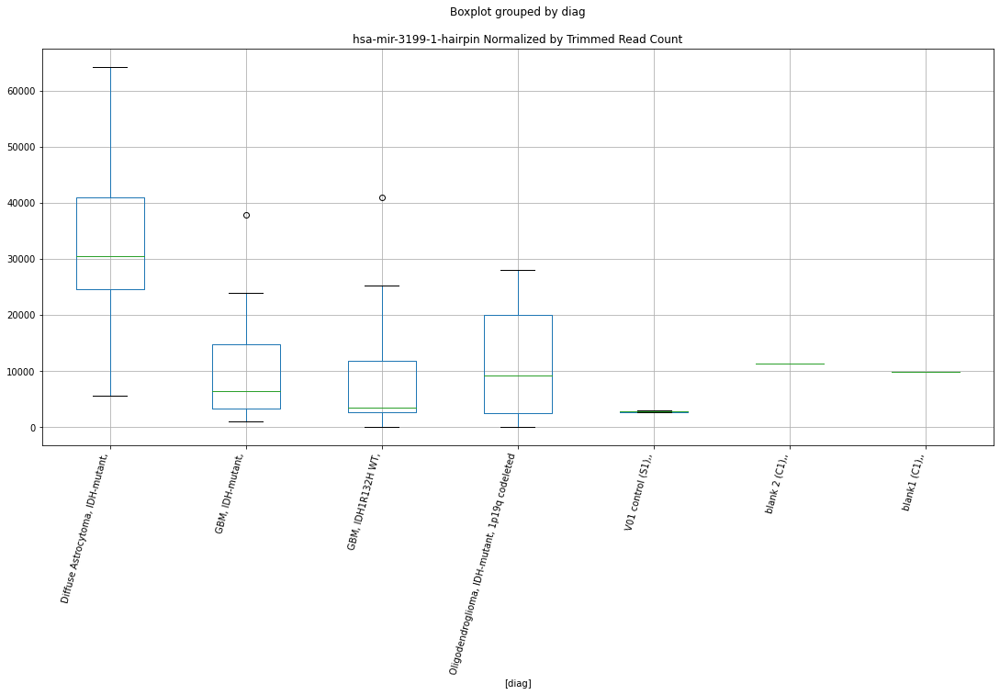

 p : 0.0076022081945265  ( t : 3.005004864702265 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6786-hairpin
Control and blanks
82     18460.664584
346    17045.196285
Name: hsa-mir-6786-hairpin, dtype: float64
214    11120.284592
Name: hsa-mir-6786-hairpin, dtype: float64
478    10685.721762
Name: hsa-mir-6786-hairpin, dtype: float64


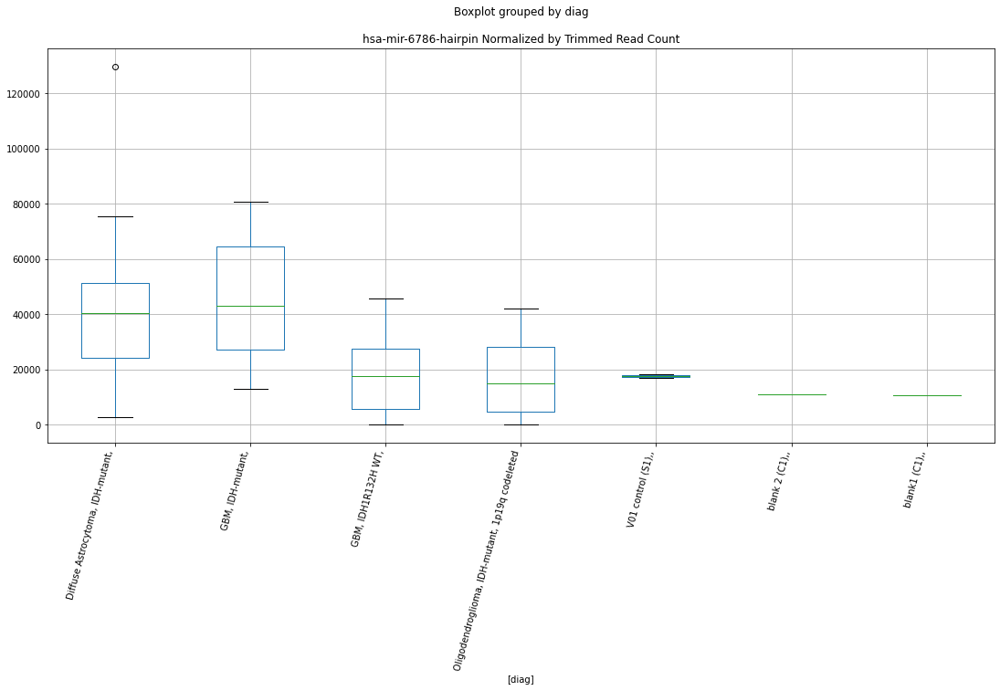

 p : 0.00762565738583644  ( t : 3.0035889928619888 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122b-hairpin
Control and blanks
82      2840.102244
346    21885.190292
Name: hsa-mir-122b-hairpin, dtype: float64
214    4068.396802
Name: hsa-mir-122b-hairpin, dtype: float64
478    4986.670156
Name: hsa-mir-122b-hairpin, dtype: float64


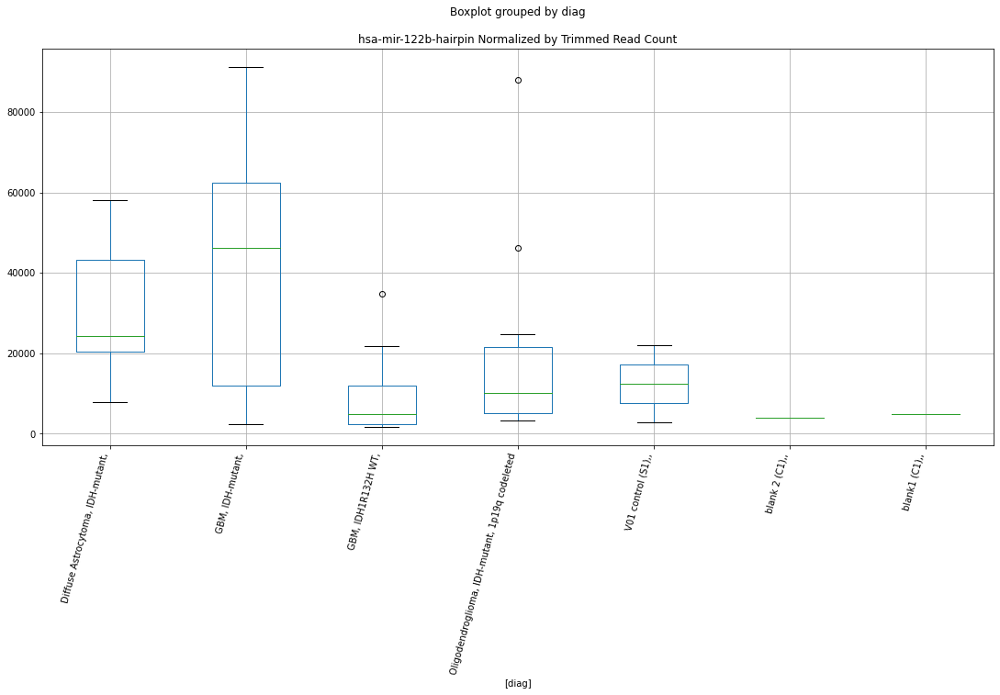

 p : 0.007677755185746835  ( t : 3.0004583759914967 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-2-hairpin
Control and blanks
76     3030.456849
340    2642.196405
Name: hsa-mir-3199-2-hairpin, dtype: float64
208    11110.693725
Name: hsa-mir-3199-2-hairpin, dtype: float64
472    8669.337593
Name: hsa-mir-3199-2-hairpin, dtype: float64


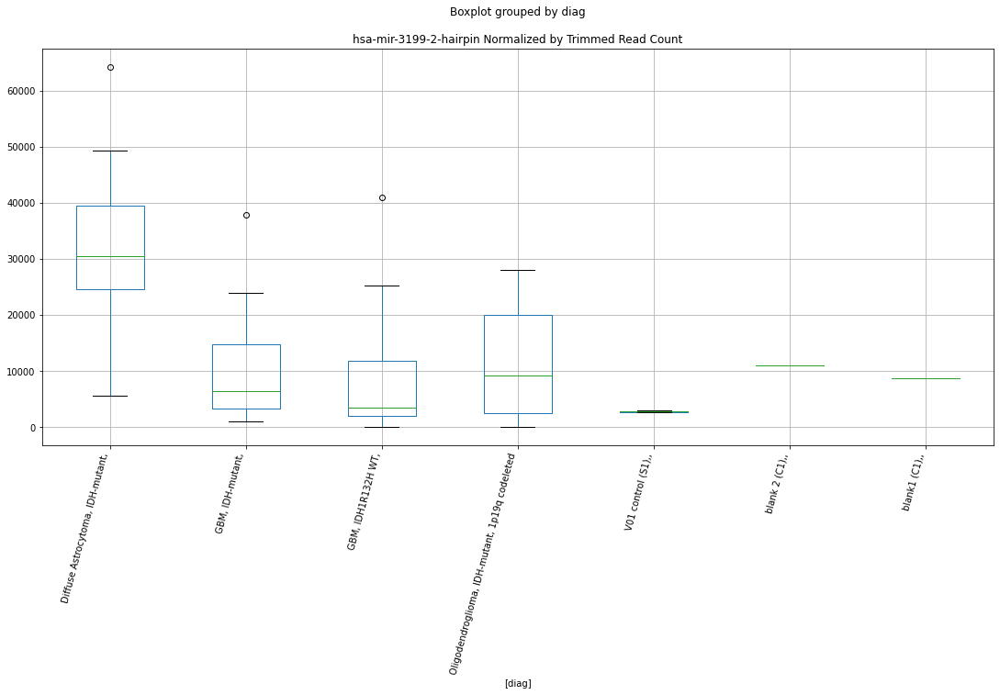

 p : 0.007685857672334673  ( t : 2.9999733423183264 ) :  D-plex  :  bbduk2  :  hsa-mir-1915-hairpin
Control and blanks
73     117497.277078
337     10681.887169
Name: hsa-mir-1915-hairpin, dtype: float64
205    88829.112309
Name: hsa-mir-1915-hairpin, dtype: float64
469    33125.529787
Name: hsa-mir-1915-hairpin, dtype: float64


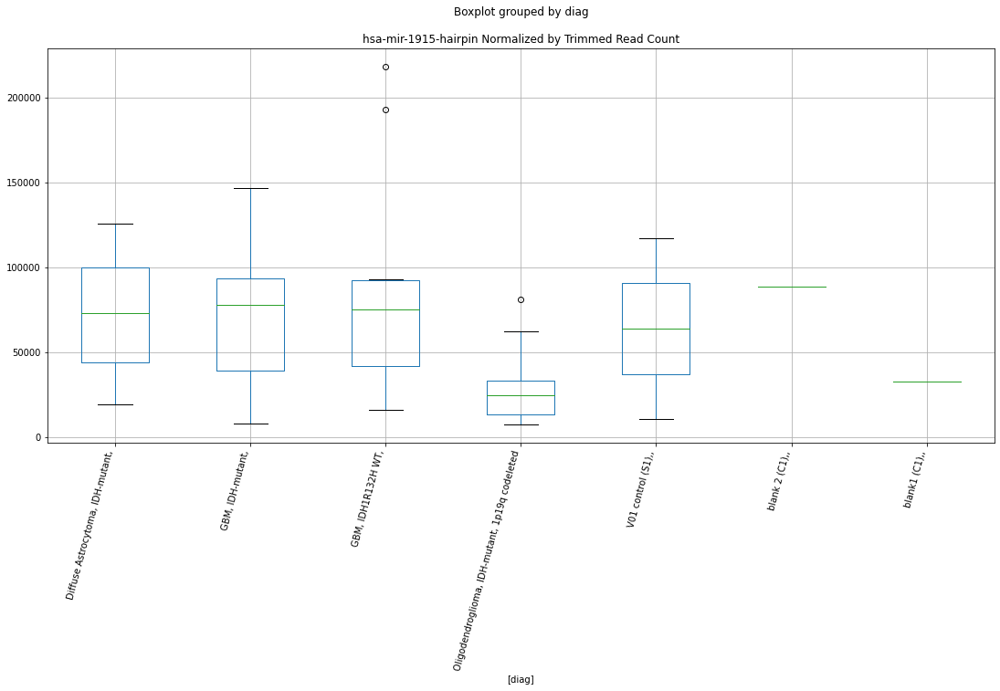

 p : 0.007694093790488581  ( t : 2.9994808176304883 ) :  D-plex  :  cutadapt2  :  hsa-mir-324-3p-mature
Control and blanks
76     29546.954277
340     7926.589215
Name: hsa-mir-324-3p-mature, dtype: float64
208    10757.97329
Name: hsa-mir-324-3p-mature, dtype: float64
472    13870.940149
Name: hsa-mir-324-3p-mature, dtype: float64


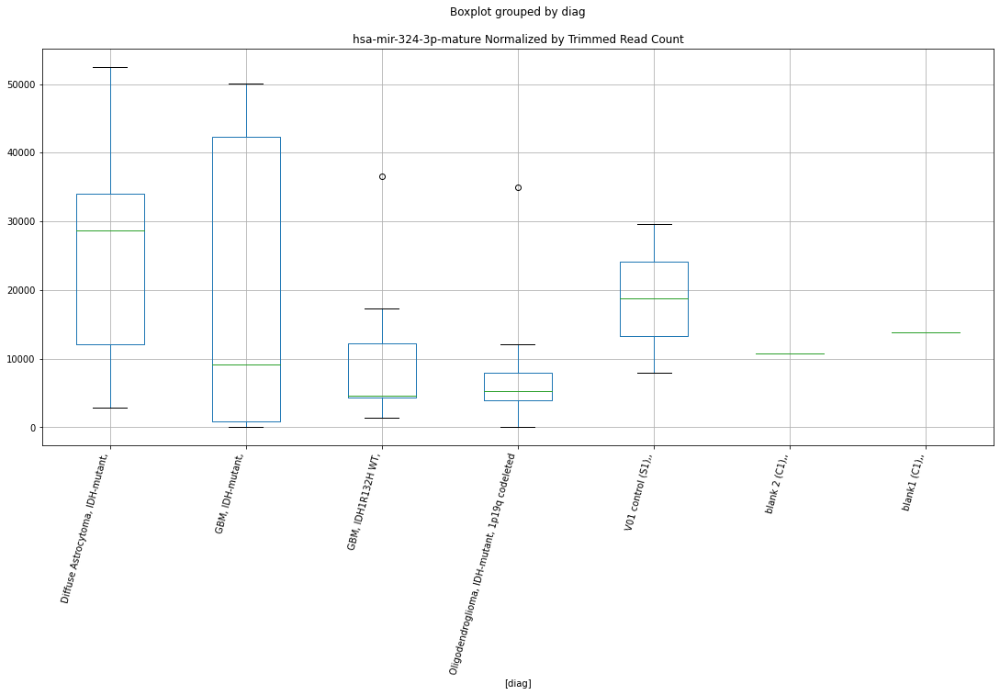

 p : 0.007723118026855779  ( t : 2.997749221781149 ) :  D-plex  :  cutadapt2  :  hsa-mir-8078-mature
Control and blanks
76     29546.954277
340        0.000000
Name: hsa-mir-8078-mature, dtype: float64
208    1939.962396
Name: hsa-mir-8078-mature, dtype: float64
472    1155.911679
Name: hsa-mir-8078-mature, dtype: float64


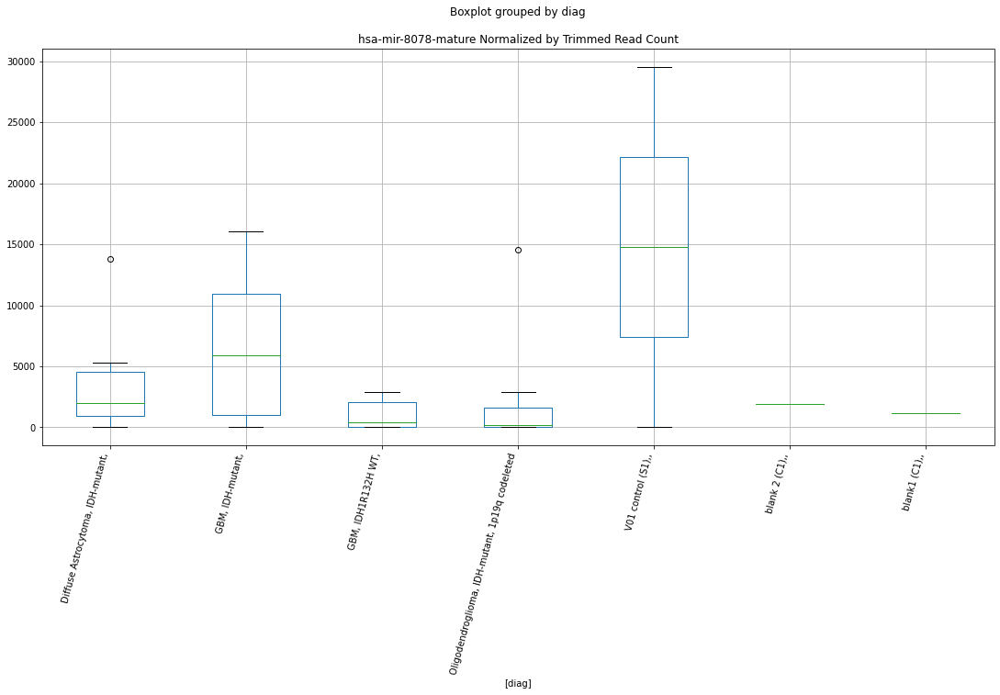

 p : 0.00774184227845827  ( t : 2.9966354754835343 ) :  D-plex  :  bbduk2  :  hsa-mir-3199-1-hairpin
Control and blanks
73     3092.033607
337    2670.471792
Name: hsa-mir-3199-1-hairpin, dtype: float64
205    11820.002848
Name: hsa-mir-3199-1-hairpin, dtype: float64
469    18337.346846
Name: hsa-mir-3199-1-hairpin, dtype: float64


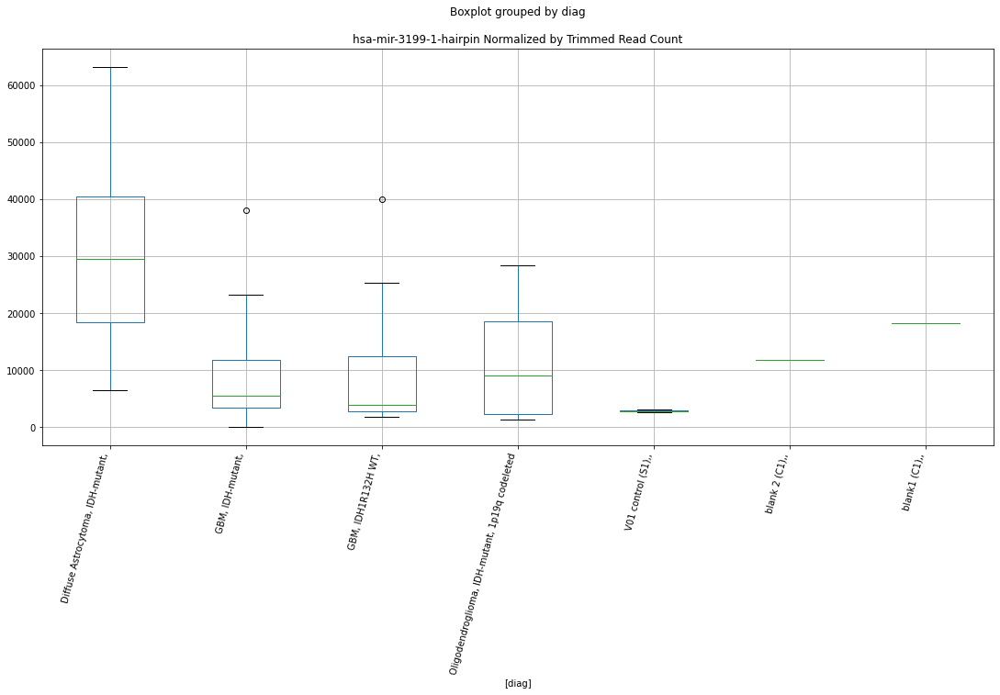

 p : 0.007775605568437234  ( t : 2.994633776656536 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3141-mature
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-3141-mature, dtype: float64
214    1898.585174
Name: hsa-mir-3141-mature, dtype: float64
478    0.0
Name: hsa-mir-3141-mature, dtype: float64


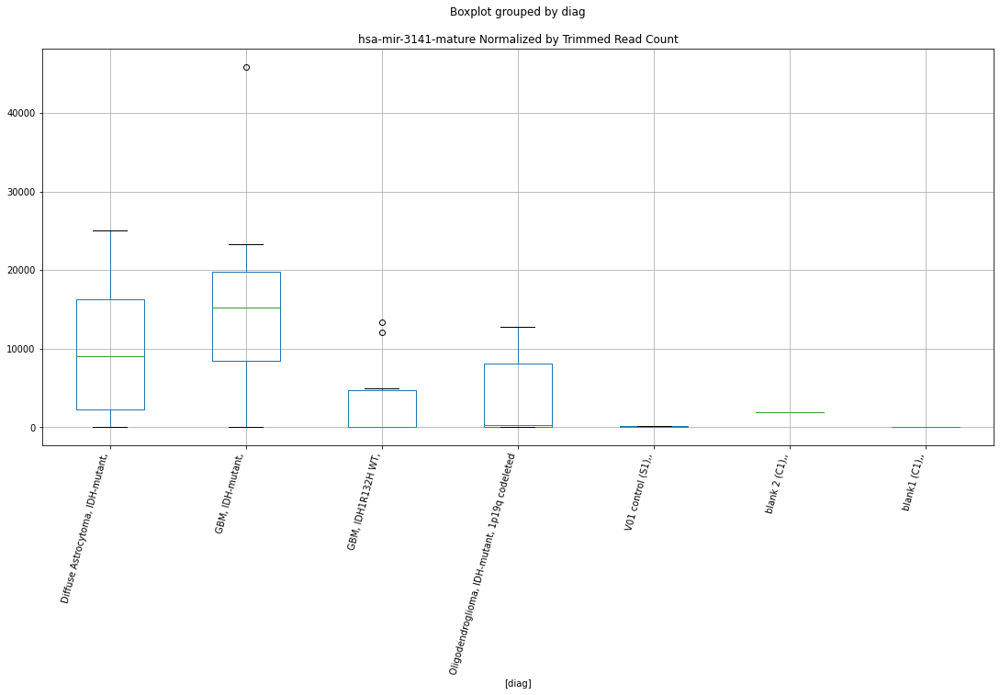

 p : 0.007785143972039391  ( t : 2.9940698086720596 ) :  D-plex  :  cutadapt2  :  hsa-mir-4642-mature
Control and blanks
76     3030.456849
340       0.000000
Name: hsa-mir-4642-mature, dtype: float64
208    8465.290457
Name: hsa-mir-4642-mature, dtype: float64
472    10981.160951
Name: hsa-mir-4642-mature, dtype: float64


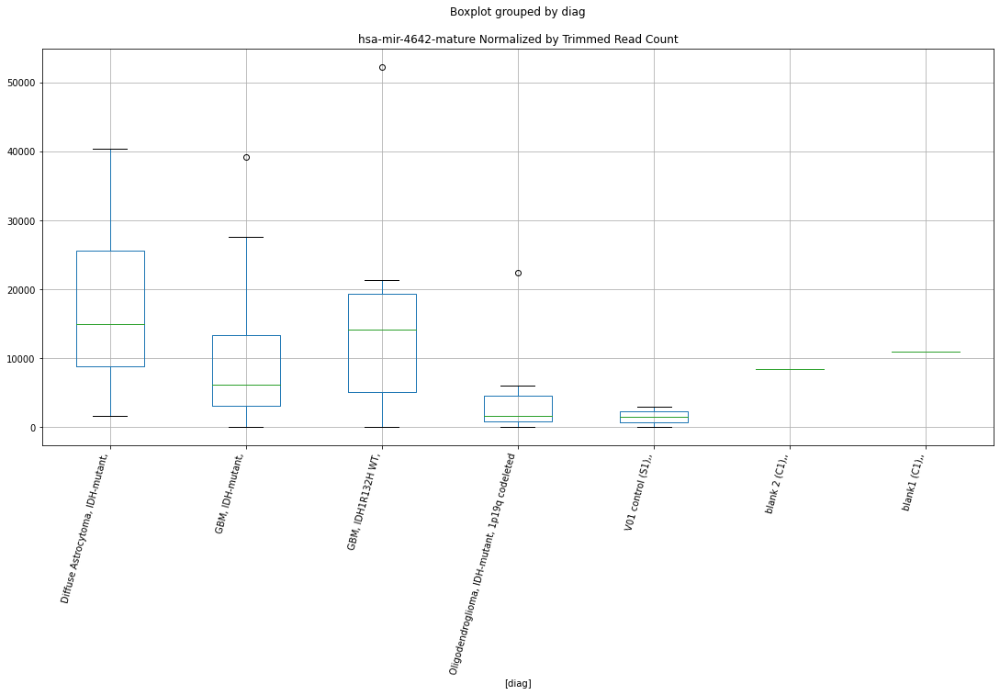

 p : 0.007792139845756238  ( t : 2.9936565965423463 ) :  D-plex  :  cutadapt2  :  hsa-mir-548f-3-hairpin
Control and blanks
76      6060.913698
340    63412.713721
Name: hsa-mir-548f-3-hairpin, dtype: float64
208    94529.076774
Name: hsa-mir-548f-3-hairpin, dtype: float64
472    49126.246362
Name: hsa-mir-548f-3-hairpin, dtype: float64


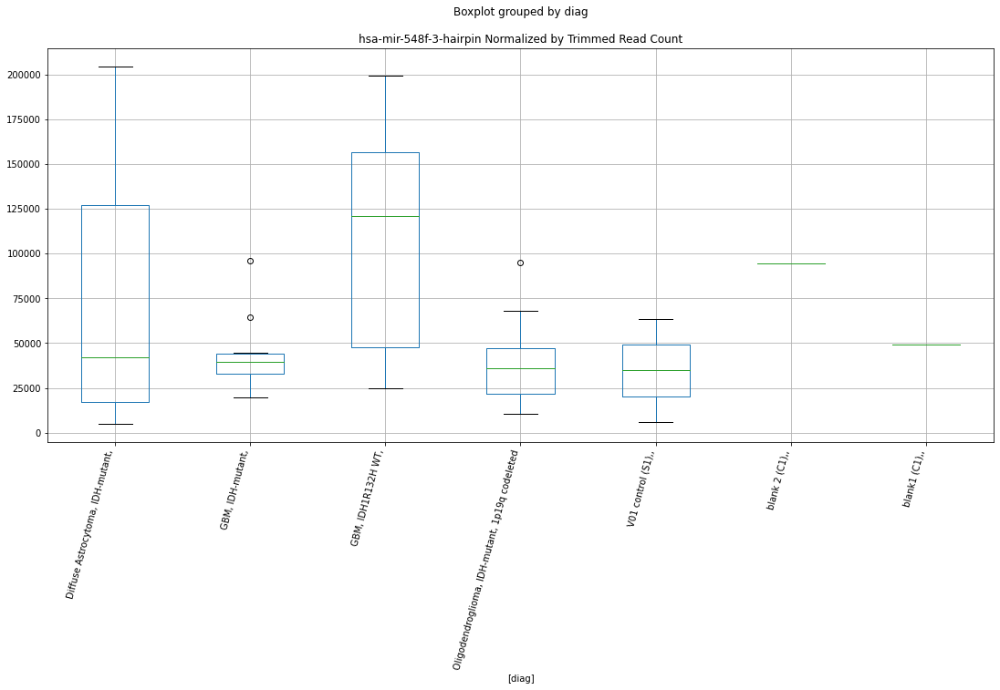

 p : 0.0077943776245570666  ( t : 2.993524497867909 ) :  Lexogen  :  bbduk2  :  hsa-mir-6786-hairpin
Control and blanks
79     18597.784289
343    17197.459532
Name: hsa-mir-6786-hairpin, dtype: float64
211    11478.866041
Name: hsa-mir-6786-hairpin, dtype: float64
475    10778.208188
Name: hsa-mir-6786-hairpin, dtype: float64


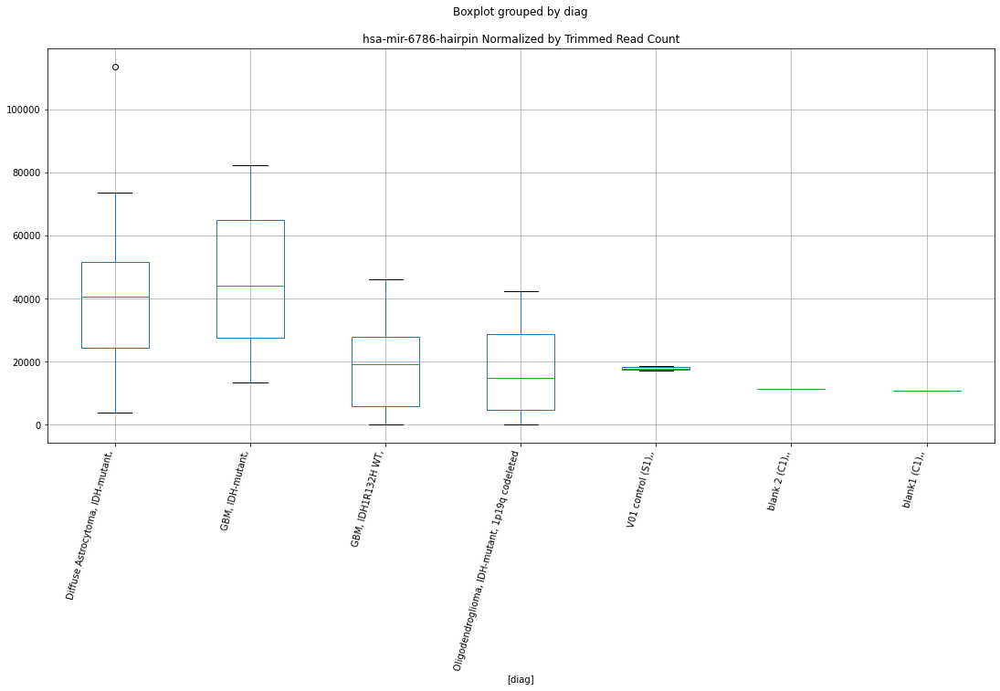

 p : 0.007837538298350712  ( t : 2.990983848395971 ) :  D-plex  :  cutadapt2  :  hsa-mir-155-hairpin
Control and blanks
76     87883.248619
340     2642.196405
Name: hsa-mir-155-hairpin, dtype: float64
208    19752.3444
Name: hsa-mir-155-hairpin, dtype: float64
472    29475.747817
Name: hsa-mir-155-hairpin, dtype: float64


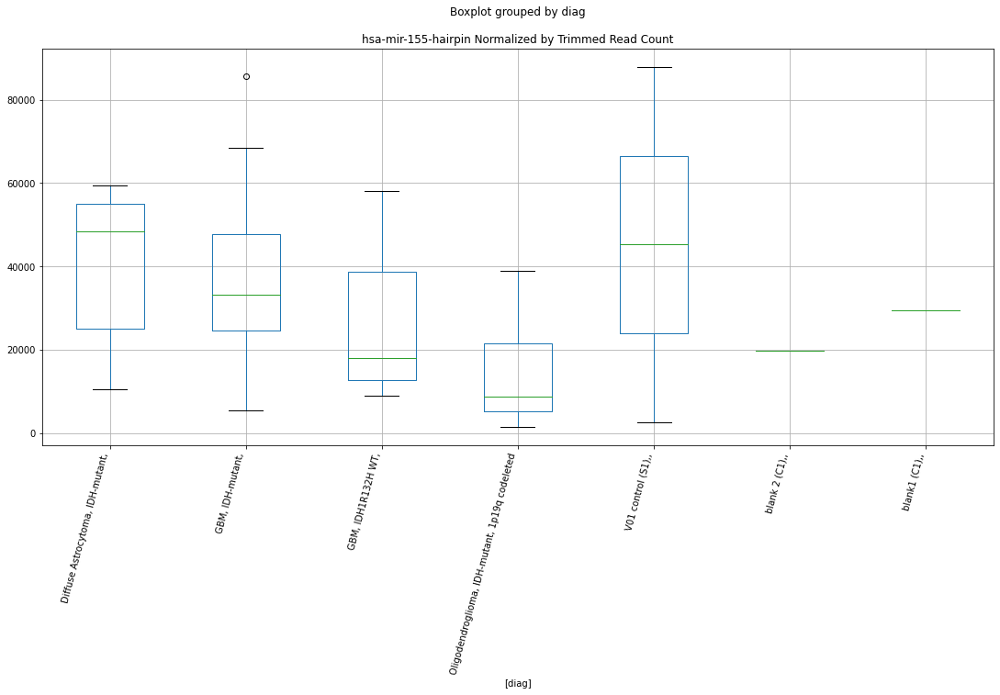

 p : 0.007842188334635273  ( t : 2.990710935046082 ) :  Lexogen  :  cutadapt2  :  hsa-mir-147b-hairpin
Control and blanks
82         0.00000
346    14519.98202
Name: hsa-mir-147b-hairpin, dtype: float64
214    0.0
Name: hsa-mir-147b-hairpin, dtype: float64
478    1187.302418
Name: hsa-mir-147b-hairpin, dtype: float64


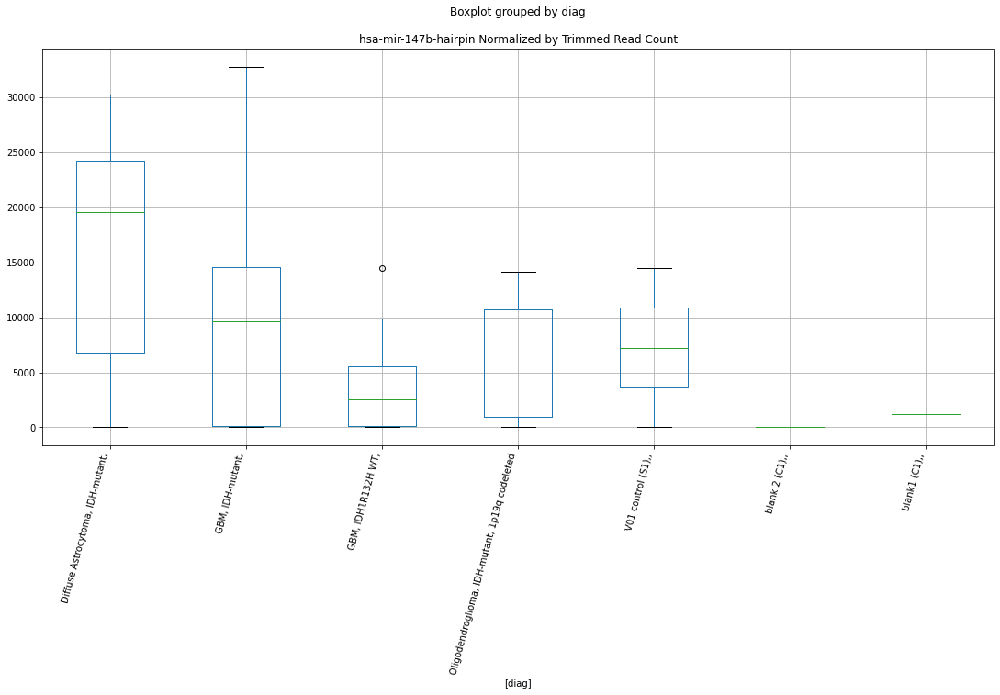

 p : 0.007856833924931486  ( t : 2.9898524017646224 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6508-5p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-6508-5p-mature, dtype: float64
214    2983.490988
Name: hsa-mir-6508-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-6508-5p-mature, dtype: float64


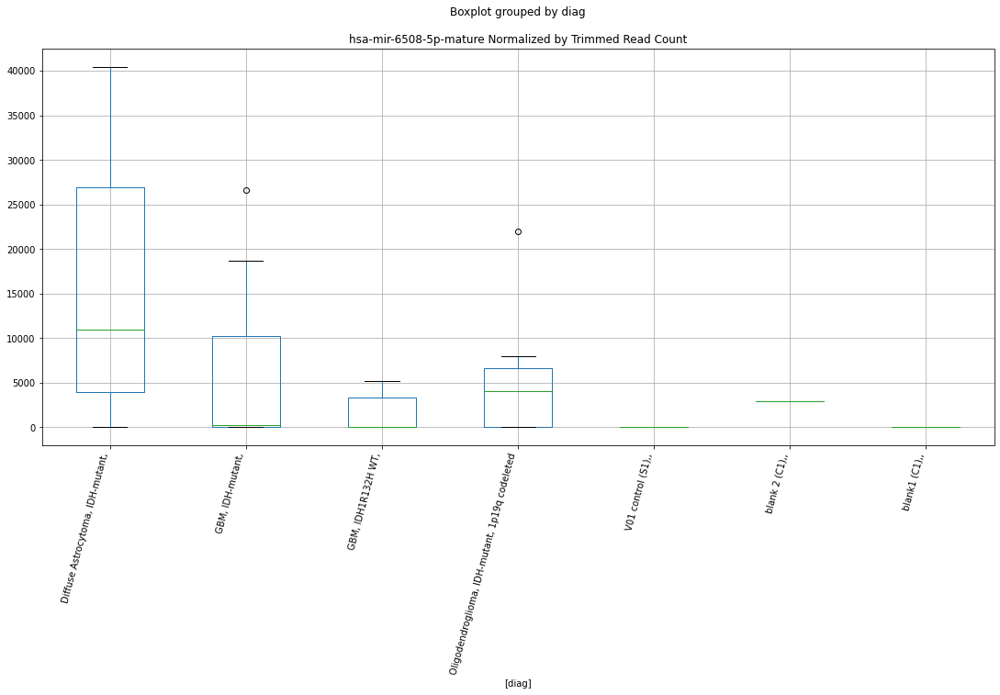

 p : 0.007862738230638556  ( t : 2.9895067269646955 ) :  D-plex  :  bbduk2  :  hsa-mir-4312-mature
Control and blanks
73     773.008402
337      0.000000
Name: hsa-mir-4312-mature, dtype: float64
205    716.363809
Name: hsa-mir-4312-mature, dtype: float64
469    5915.273176
Name: hsa-mir-4312-mature, dtype: float64


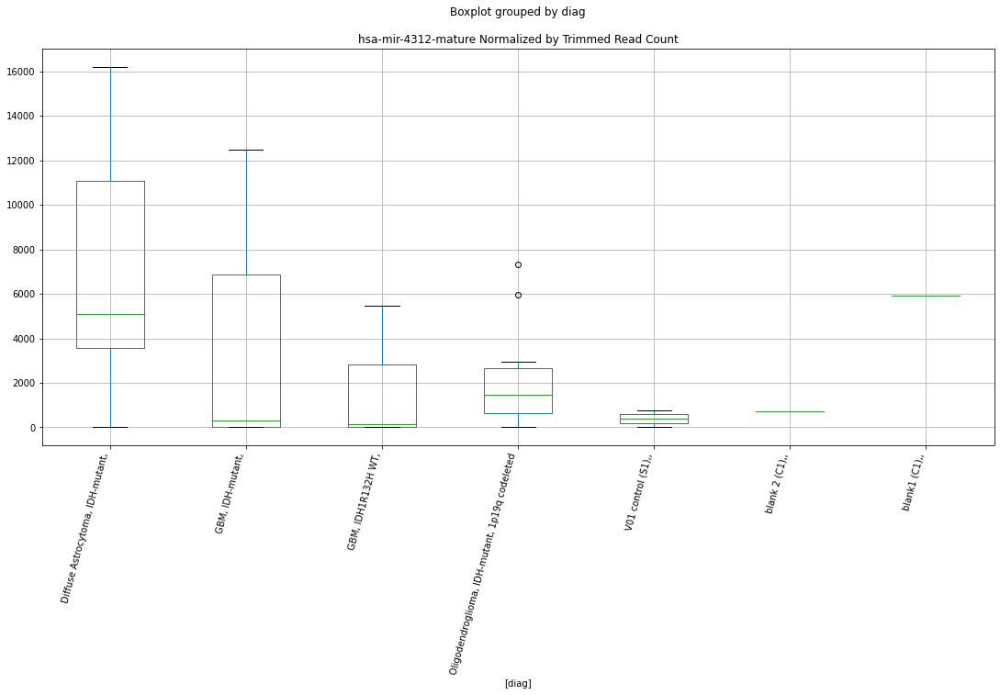

 p : 0.007873082735771468  ( t : 2.9889017020242177 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1178-hairpin
Control and blanks
82       0.000000
346    841.738088
Name: hsa-mir-1178-hairpin, dtype: float64
214    2169.811628
Name: hsa-mir-1178-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-1178-hairpin, dtype: float64


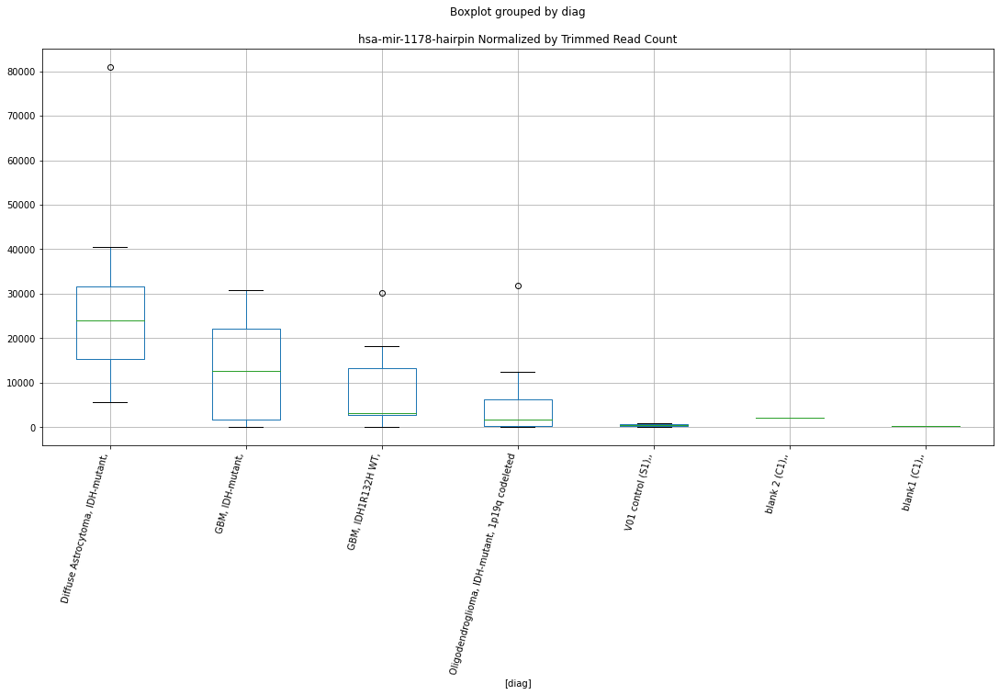

 p : 0.007877497737277552  ( t : 2.988643714146421 ) :  Lexogen  :  cutadapt2  :  hsa-mir-99b-hairpin
Control and blanks
82         0.000000
346    32406.916394
Name: hsa-mir-99b-hairpin, dtype: float64
214    2169.811628
Name: hsa-mir-99b-hairpin, dtype: float64
478    5699.051607
Name: hsa-mir-99b-hairpin, dtype: float64


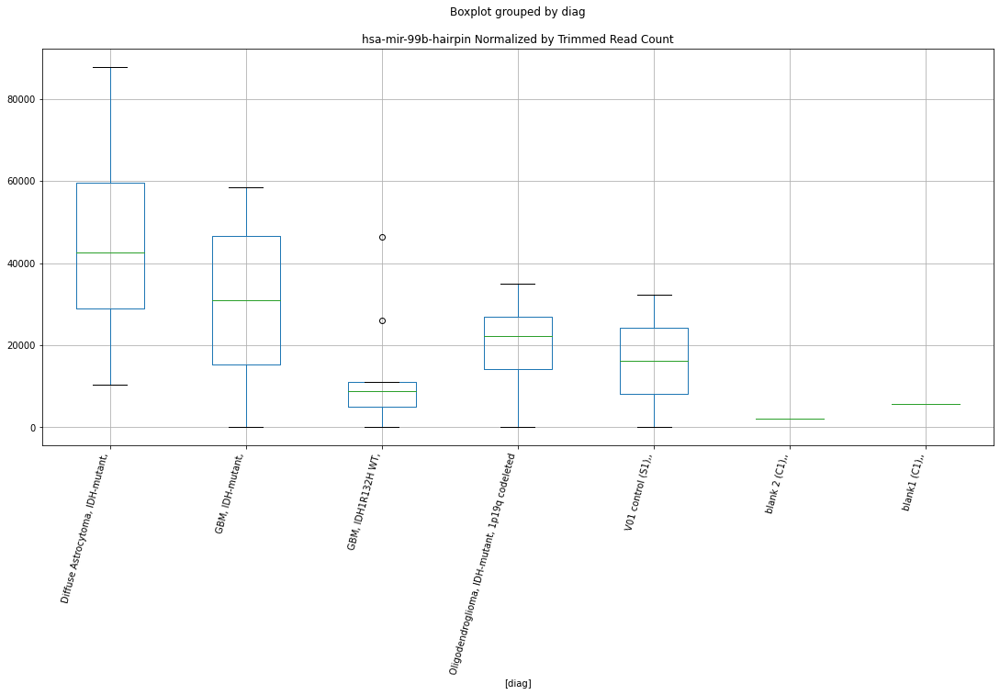

 p : 0.007901127891339224  ( t : 2.9872652811439515 ) :  Lexogen  :  bbduk2  :  hsa-mir-665-mature
Control and blanks
79     0.0
343    0.0
Name: hsa-mir-665-mature, dtype: float64
211    0.0
Name: hsa-mir-665-mature, dtype: float64
475    0.0
Name: hsa-mir-665-mature, dtype: float64


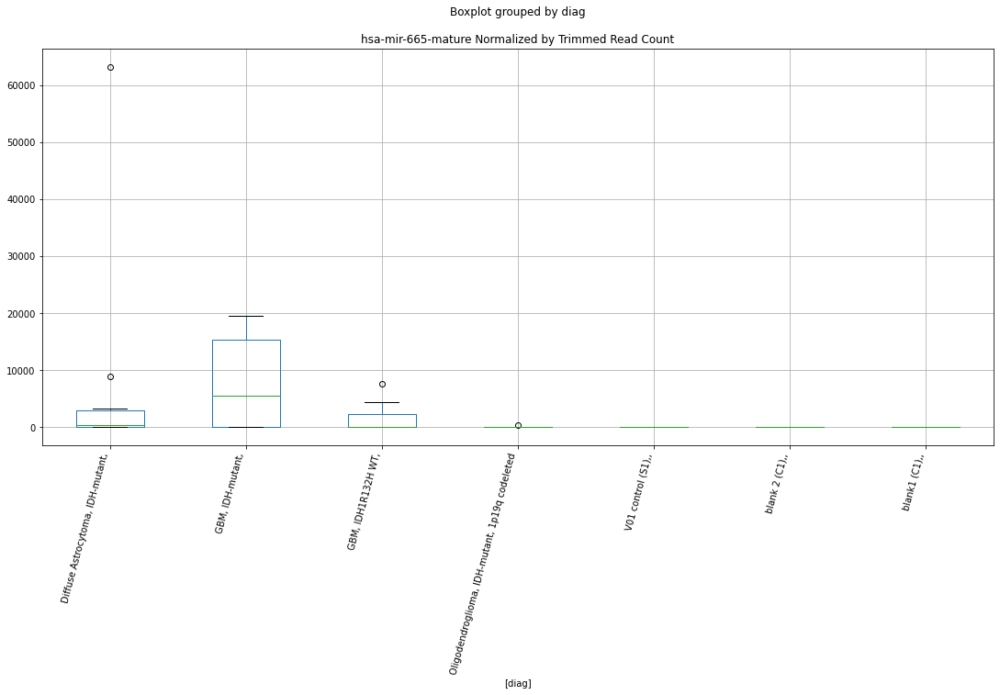

 p : 0.007906236606929653  ( t : 2.9869677970380555 ) :  D-plex  :  bbduk2  :  hsa-mir-324-3p-mature
Control and blanks
73     30920.336073
337     8011.415377
Name: hsa-mir-324-3p-mature, dtype: float64
205    10745.457134
Name: hsa-mir-324-3p-mature, dtype: float64
469    14196.655623
Name: hsa-mir-324-3p-mature, dtype: float64


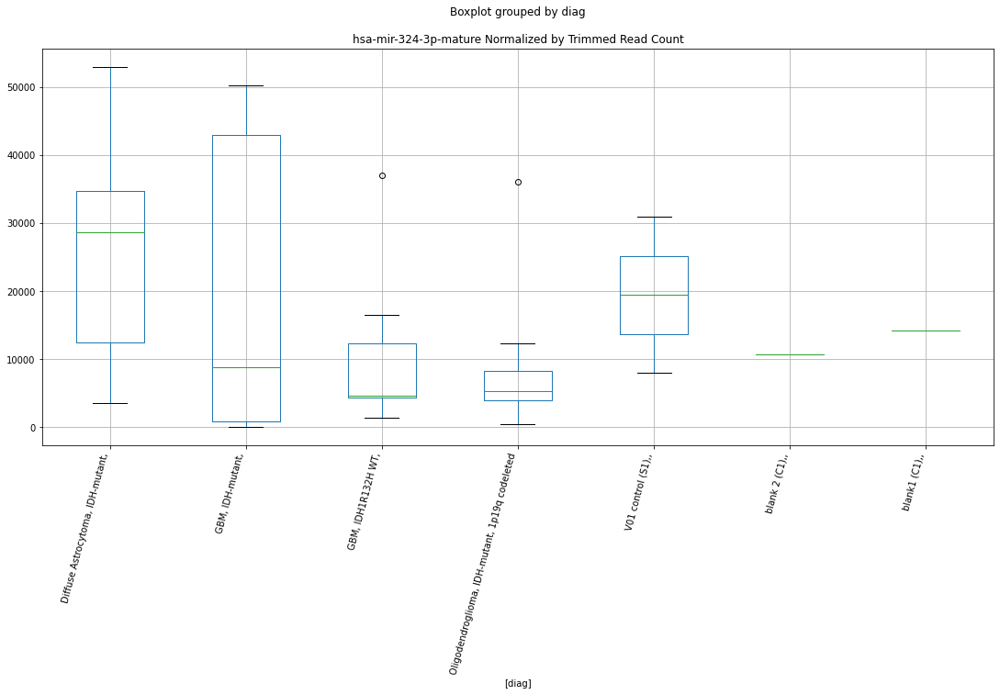

 p : 0.007924240610668648  ( t : 2.98592089589148 ) :  D-plex  :  cutadapt2  :  hsa-mir-331-3p-mature
Control and blanks
76     78034.263860
340     2642.196405
Name: hsa-mir-331-3p-mature, dtype: float64
208    18165.10244
Name: hsa-mir-331-3p-mature, dtype: float64
472    16182.763507
Name: hsa-mir-331-3p-mature, dtype: float64


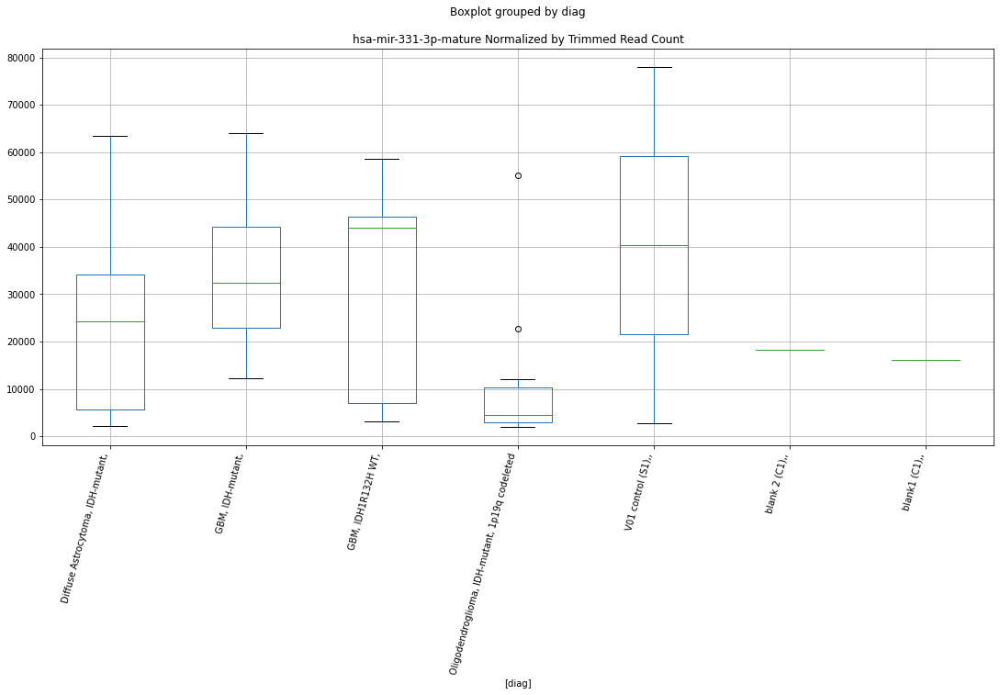

 p : 0.007941367722157764  ( t : 2.98492712402395 ) :  D-plex  :  bbduk2  :  hsa-mir-4756-hairpin
Control and blanks
73     26282.285662
337     2670.471792
Name: hsa-mir-4756-hairpin, dtype: float64
205    33848.189973
Name: hsa-mir-4756-hairpin, dtype: float64
469    28984.838563
Name: hsa-mir-4756-hairpin, dtype: float64


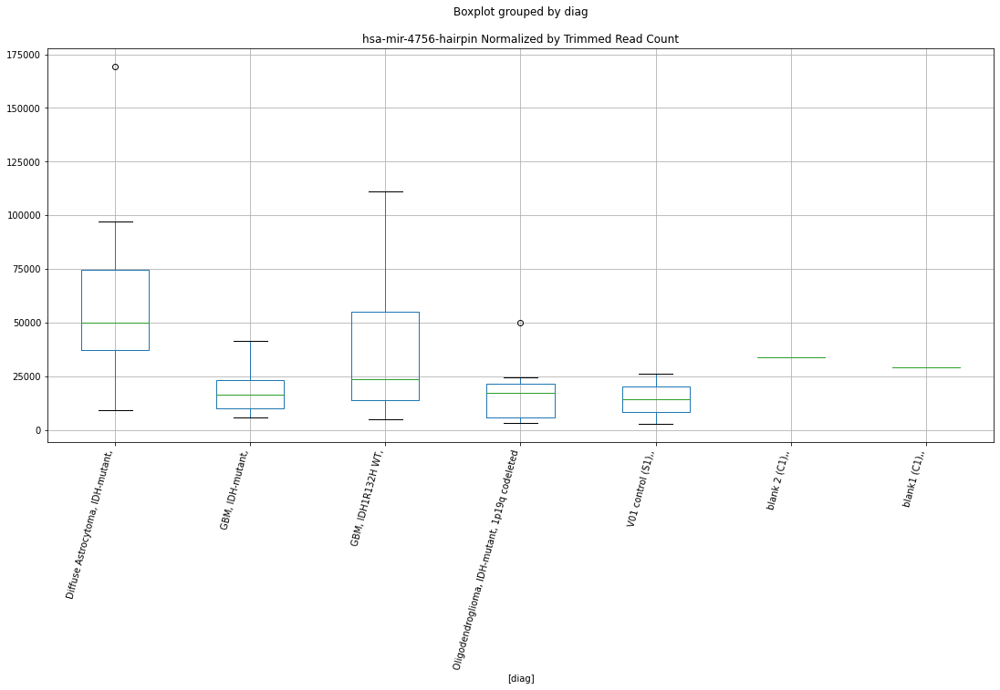

 p : 0.007959011760372952  ( t : 2.983905530262595 ) :  Lexogen  :  cutadapt2  :  hsa-mir-548i-2-hairpin
Control and blanks
82       0.000000
346    841.738088
Name: hsa-mir-548i-2-hairpin, dtype: float64
214    4068.396802
Name: hsa-mir-548i-2-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-548i-2-hairpin, dtype: float64


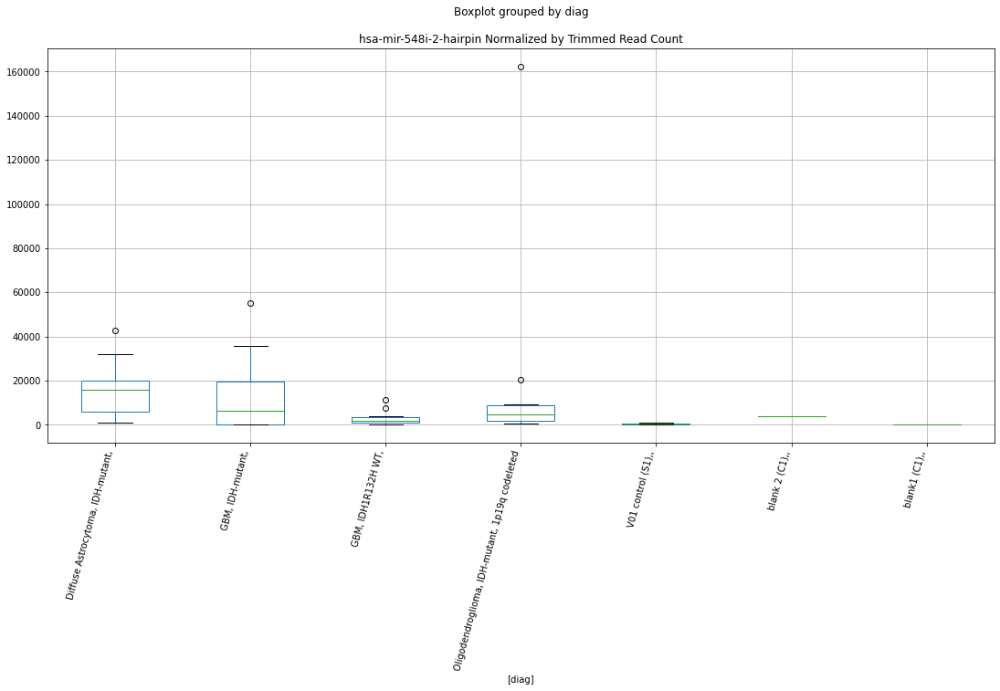

 p : 0.007962820963125231  ( t : 2.9836852649416143 ) :  D-plex  :  bbduk2  :  hsa-mir-3130-2-hairpin
Control and blanks
73     65705.714155
337     3560.629056
Name: hsa-mir-3130-2-hairpin, dtype: float64
205    113543.663717
Name: hsa-mir-3130-2-hairpin, dtype: float64
469    47322.18541
Name: hsa-mir-3130-2-hairpin, dtype: float64


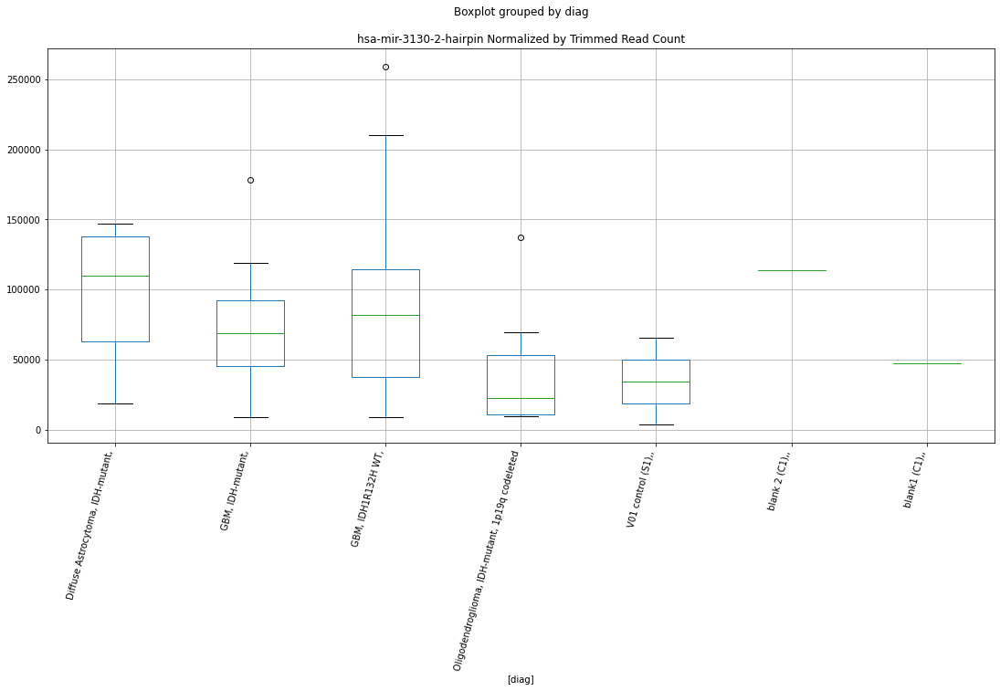

 p : 0.007962820963125231  ( t : 2.9836852649416143 ) :  D-plex  :  bbduk2  :  hsa-mir-3130-1-hairpin
Control and blanks
73     65705.714155
337     3560.629056
Name: hsa-mir-3130-1-hairpin, dtype: float64
205    113543.663717
Name: hsa-mir-3130-1-hairpin, dtype: float64
469    47322.18541
Name: hsa-mir-3130-1-hairpin, dtype: float64


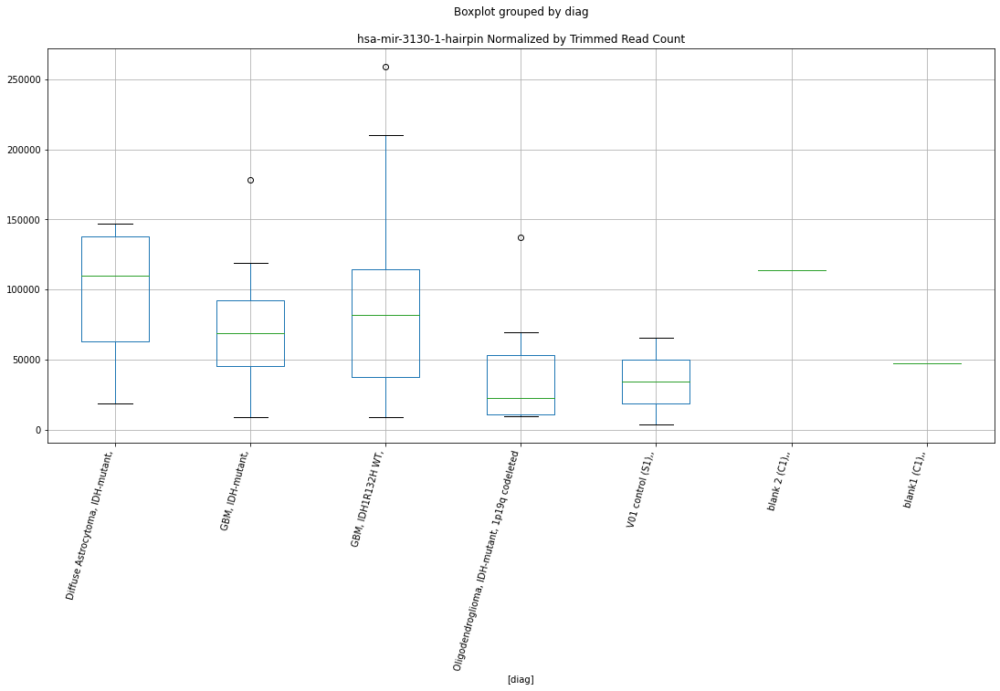

 p : 0.007969260881404327  ( t : 2.983313112127965 ) :  D-plex  :  cutadapt2  :  hsa-mir-3613-hairpin
Control and blanks
76     130309.644505
340    203449.123187
Name: hsa-mir-3613-hairpin, dtype: float64
208    119748.587928
Name: hsa-mir-3613-hairpin, dtype: float64
472    89005.199291
Name: hsa-mir-3613-hairpin, dtype: float64


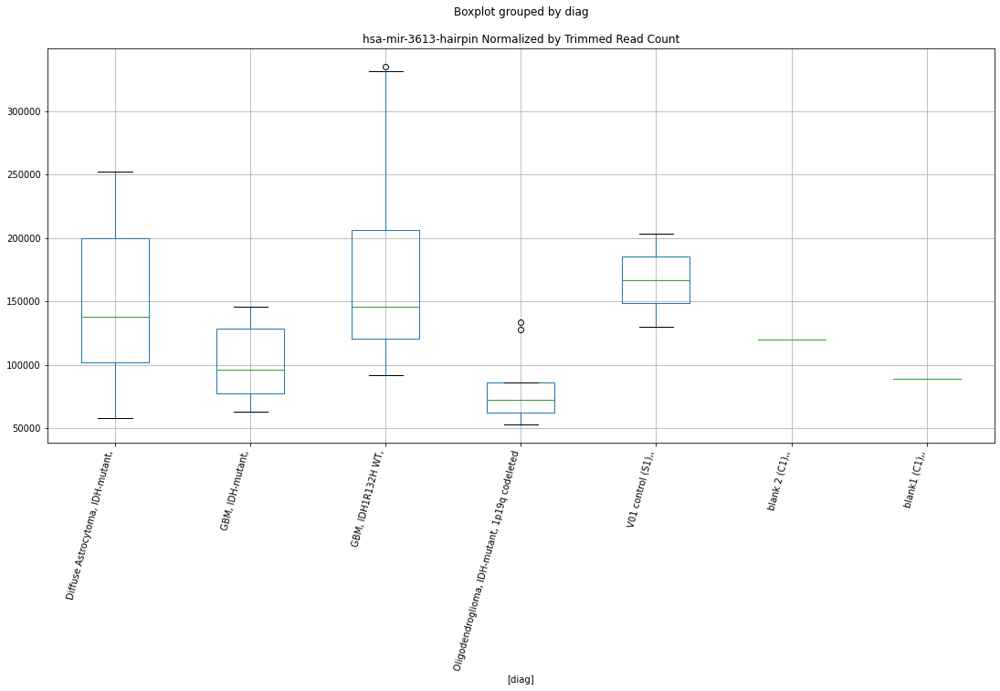

 p : 0.008012803984543806  ( t : 2.9808044522593273 ) :  Lexogen  :  bbduk2  :  hsa-mir-3680-2-hairpin
Control and blanks
79        0.000000
343    1061.571576
Name: hsa-mir-3680-2-hairpin, dtype: float64
211    4099.595015
Name: hsa-mir-3680-2-hairpin, dtype: float64
475    0.0
Name: hsa-mir-3680-2-hairpin, dtype: float64


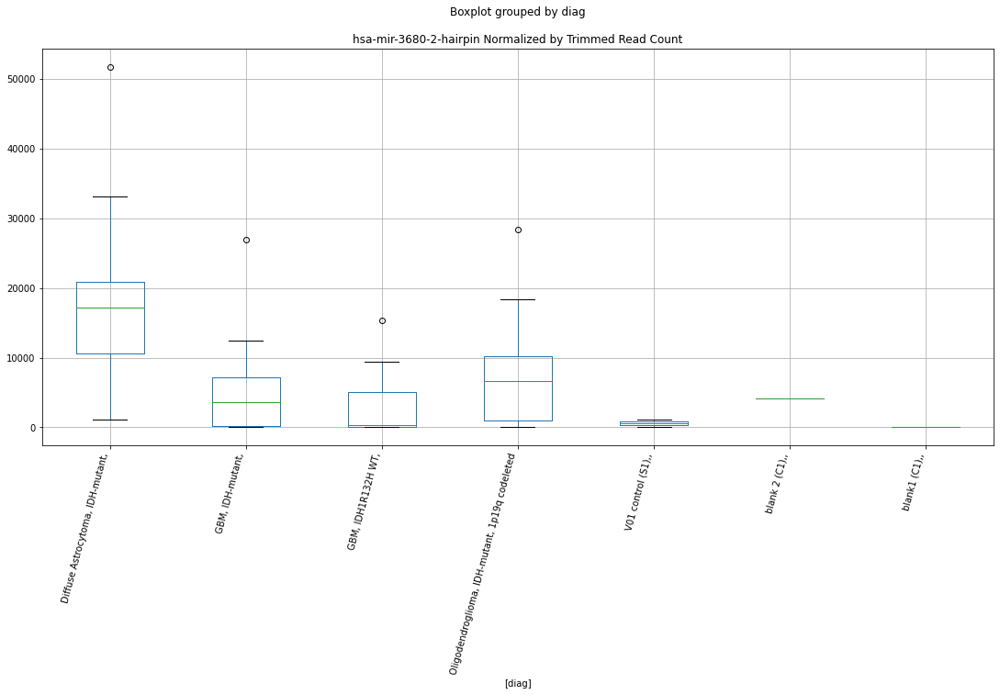

 p : 0.008012803984543806  ( t : 2.9808044522593273 ) :  Lexogen  :  bbduk2  :  hsa-mir-3680-1-hairpin
Control and blanks
79        0.000000
343    1061.571576
Name: hsa-mir-3680-1-hairpin, dtype: float64
211    4099.595015
Name: hsa-mir-3680-1-hairpin, dtype: float64
475    0.0
Name: hsa-mir-3680-1-hairpin, dtype: float64


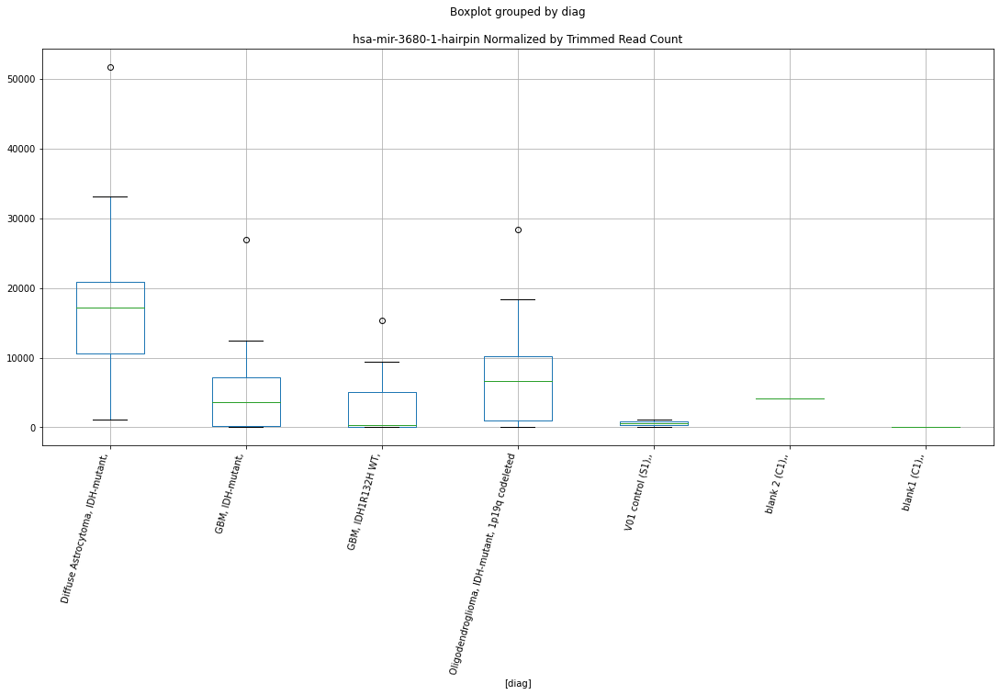

 p : 0.008021787885515922  ( t : 2.98028850633607 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4767-mature
Control and blanks
82         0.000000
346    18307.803417
Name: hsa-mir-4767-mature, dtype: float64
214    0.0
Name: hsa-mir-4767-mature, dtype: float64
478    0.0
Name: hsa-mir-4767-mature, dtype: float64


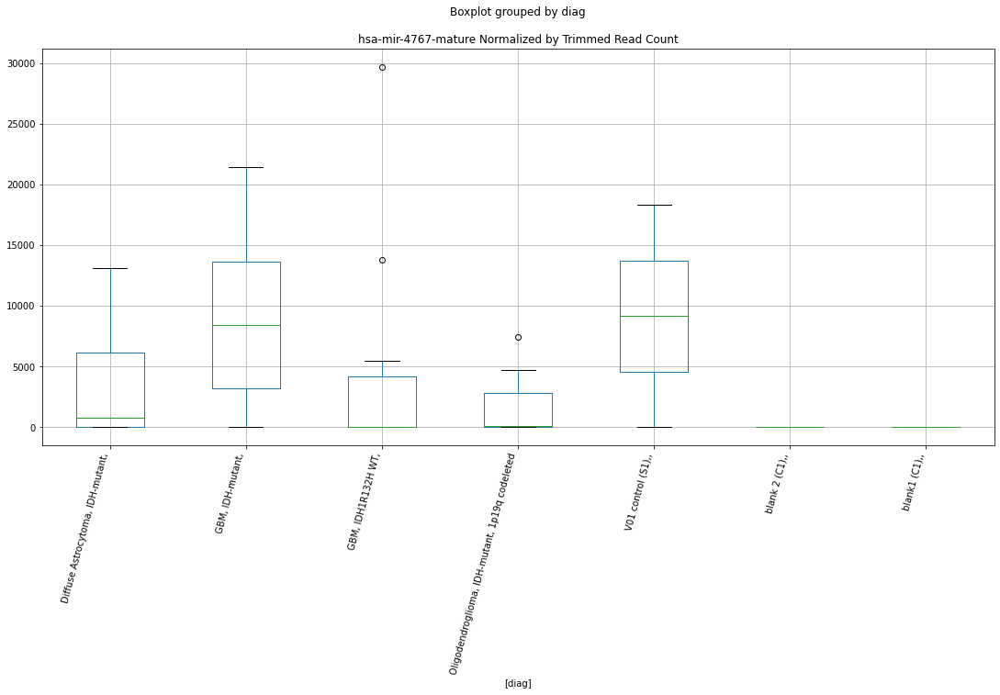

 p : 0.008043352531558344  ( t : 2.979052331065162 ) :  Lexogen  :  bbduk2  :  hsa-mir-4767-mature
Control and blanks
79         0.000000
343    18471.345423
Name: hsa-mir-4767-mature, dtype: float64
211    0.0
Name: hsa-mir-4767-mature, dtype: float64
475    0.0
Name: hsa-mir-4767-mature, dtype: float64


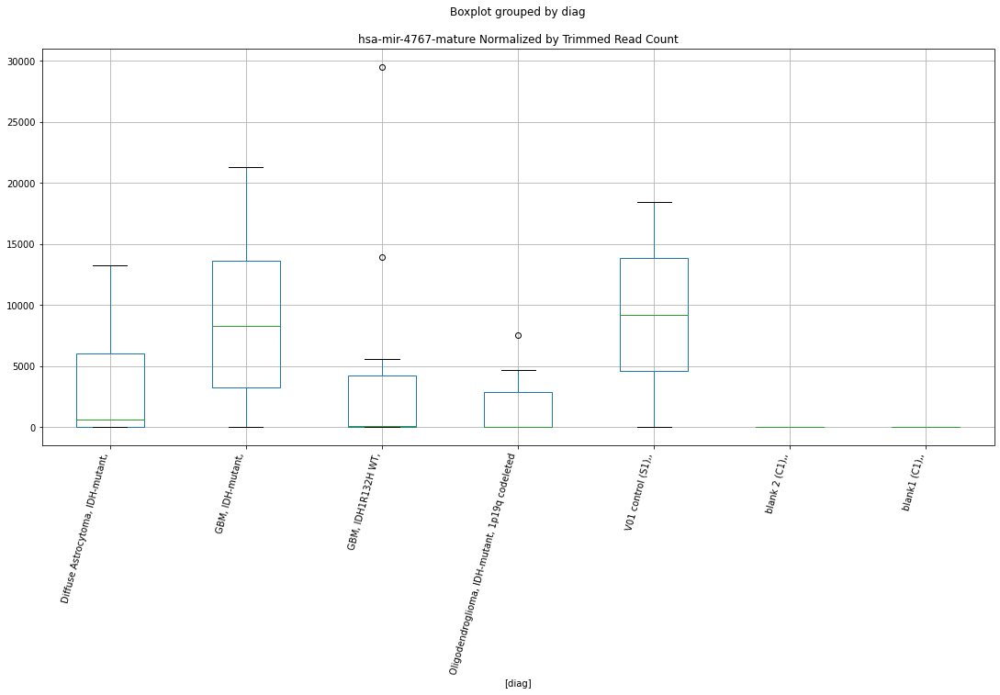

 p : 0.008061893957401488  ( t : 2.977992026592185 ) :  D-plex  :  bbduk2  :  hsa-mir-92a-2-5p-mature
Control and blanks
73     42515.462101
337    17803.145282
Name: hsa-mir-92a-2-5p-mature, dtype: float64
205    42086.373775
Name: hsa-mir-92a-2-5p-mature, dtype: float64
469    10055.9644
Name: hsa-mir-92a-2-5p-mature, dtype: float64


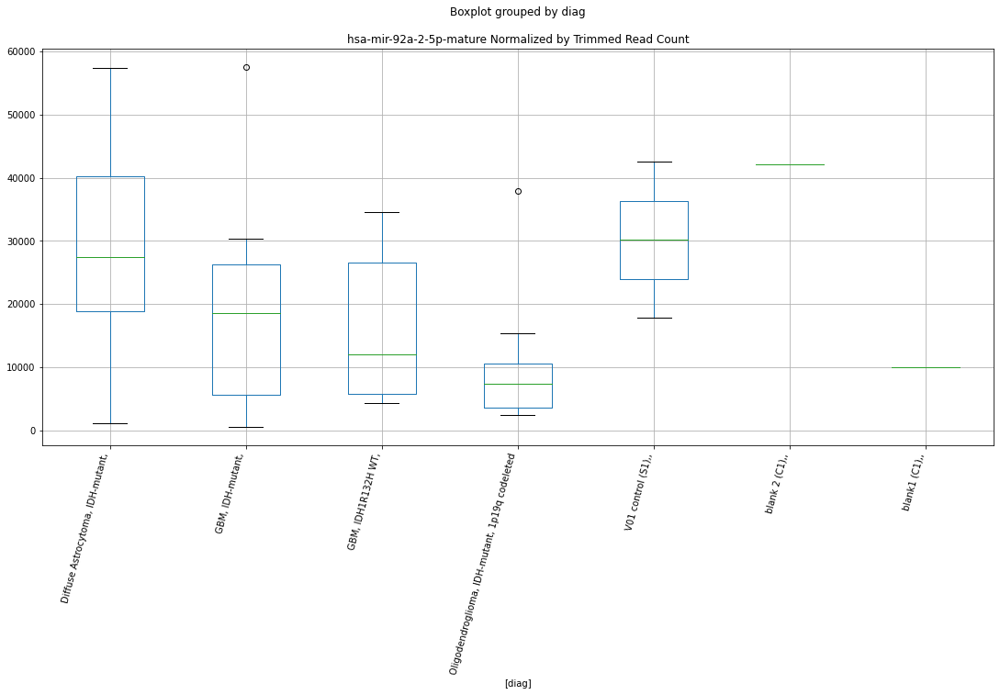

 p : 0.008131473980410182  ( t : 2.9740340218399837 ) :  Lexogen  :  bbduk2  :  hsa-mir-216a-hairpin
Control and blanks
79         0.000000
343    17834.402477
Name: hsa-mir-216a-hairpin, dtype: float64
211    3279.676012
Name: hsa-mir-216a-hairpin, dtype: float64
475    958.06295
Name: hsa-mir-216a-hairpin, dtype: float64


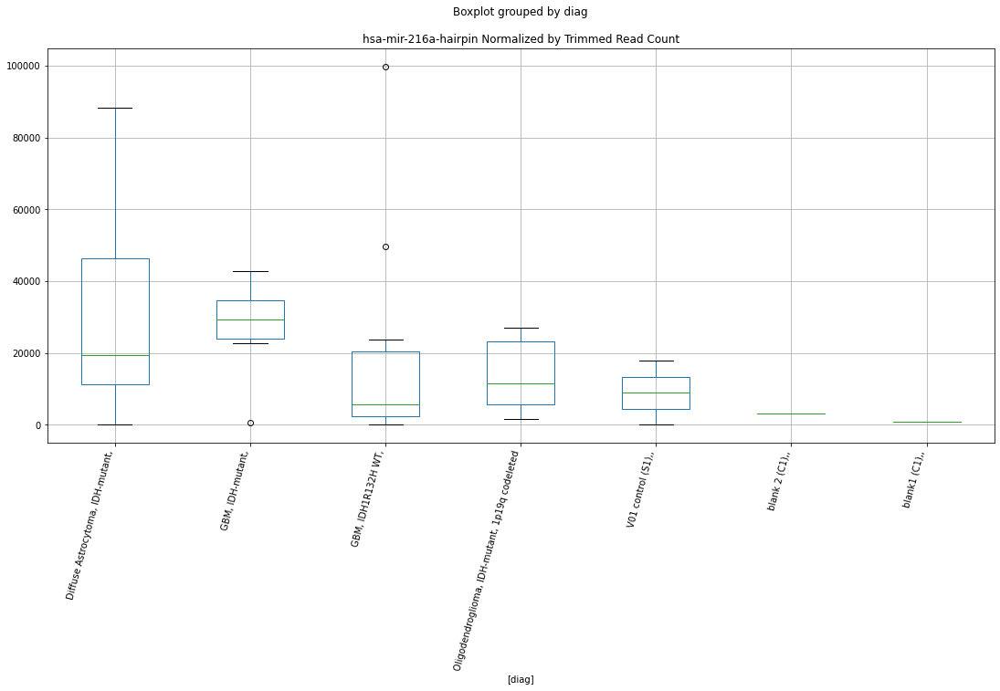

 p : 0.008161516138866202  ( t : 2.972335238191486 ) :  D-plex  :  bbduk2  :  hsa-mir-4489-hairpin
Control and blanks
73     16233.176438
337    57860.222165
Name: hsa-mir-4489-hairpin, dtype: float64
205    44056.37425
Name: hsa-mir-4489-hairpin, dtype: float64
469    15379.710258
Name: hsa-mir-4489-hairpin, dtype: float64


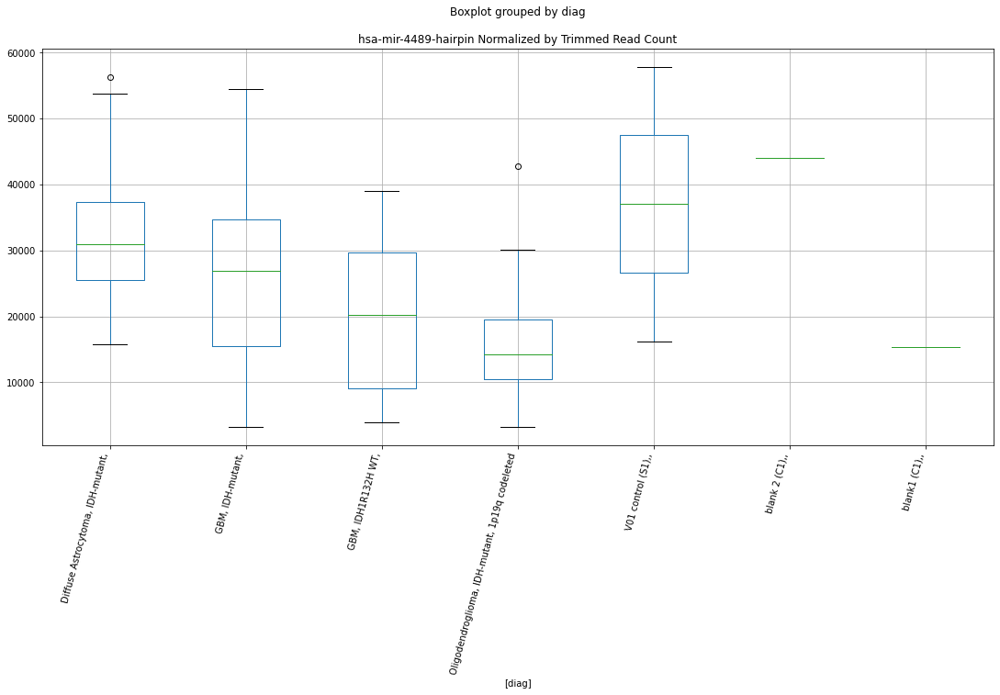

 p : 0.008191333974773151  ( t : 2.9706551234680454 ) :  Lexogen  :  cutadapt2  :  hsa-mir-584-hairpin
Control and blanks
82      1420.051122
346    32827.785438
Name: hsa-mir-584-hairpin, dtype: float64
214    5966.981976
Name: hsa-mir-584-hairpin, dtype: float64
478    1424.762902
Name: hsa-mir-584-hairpin, dtype: float64


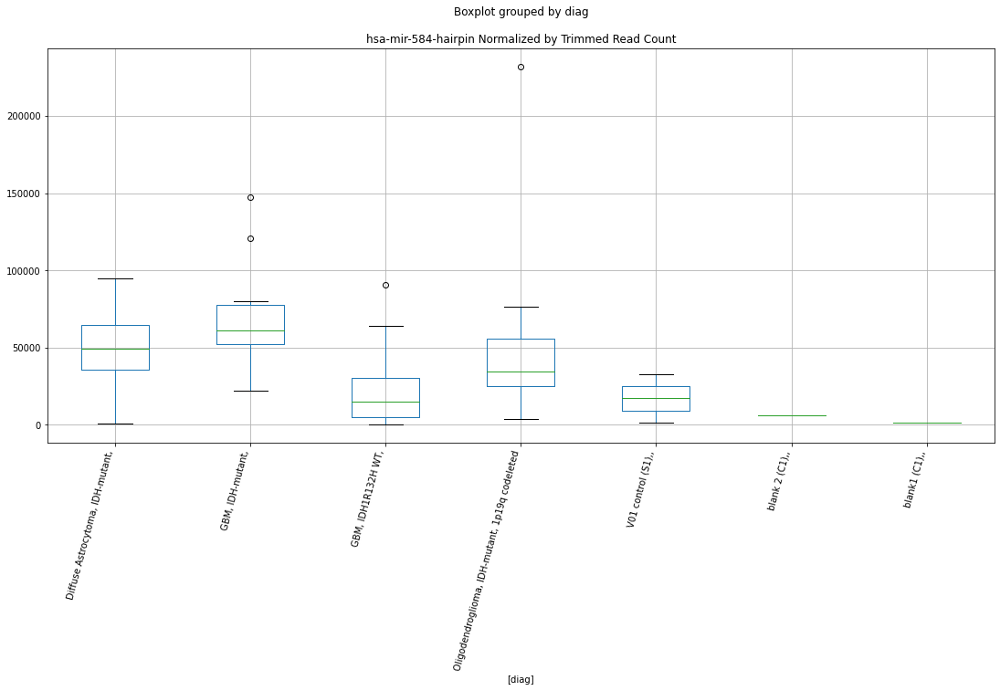

 p : 0.00821511566714634  ( t : 2.9693193657908283 ) :  D-plex  :  bbduk2  :  hsa-mir-4260-hairpin
Control and blanks
73     16233.176438
337     3560.629056
Name: hsa-mir-4260-hairpin, dtype: float64
205    7700.910946
Name: hsa-mir-4260-hairpin, dtype: float64
469    10055.9644
Name: hsa-mir-4260-hairpin, dtype: float64


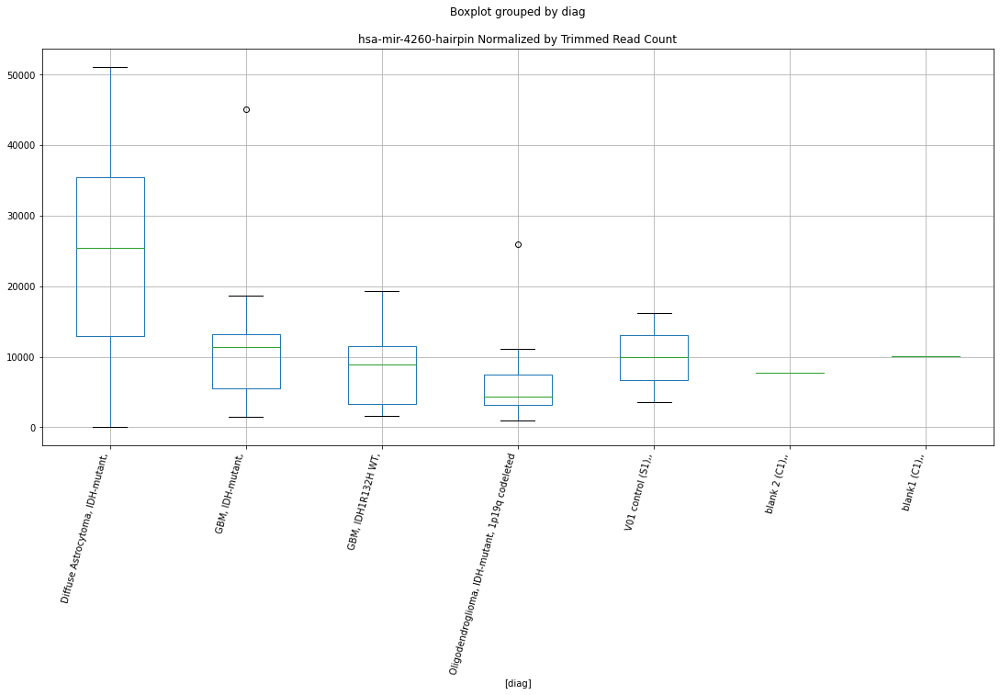

 p : 0.00821546665658813  ( t : 2.969299679682285 ) :  D-plex  :  bbduk2  :  hsa-mir-3199-1-hairpin
Control and blanks
73     3092.033607
337    2670.471792
Name: hsa-mir-3199-1-hairpin, dtype: float64
205    11820.002848
Name: hsa-mir-3199-1-hairpin, dtype: float64
469    18337.346846
Name: hsa-mir-3199-1-hairpin, dtype: float64


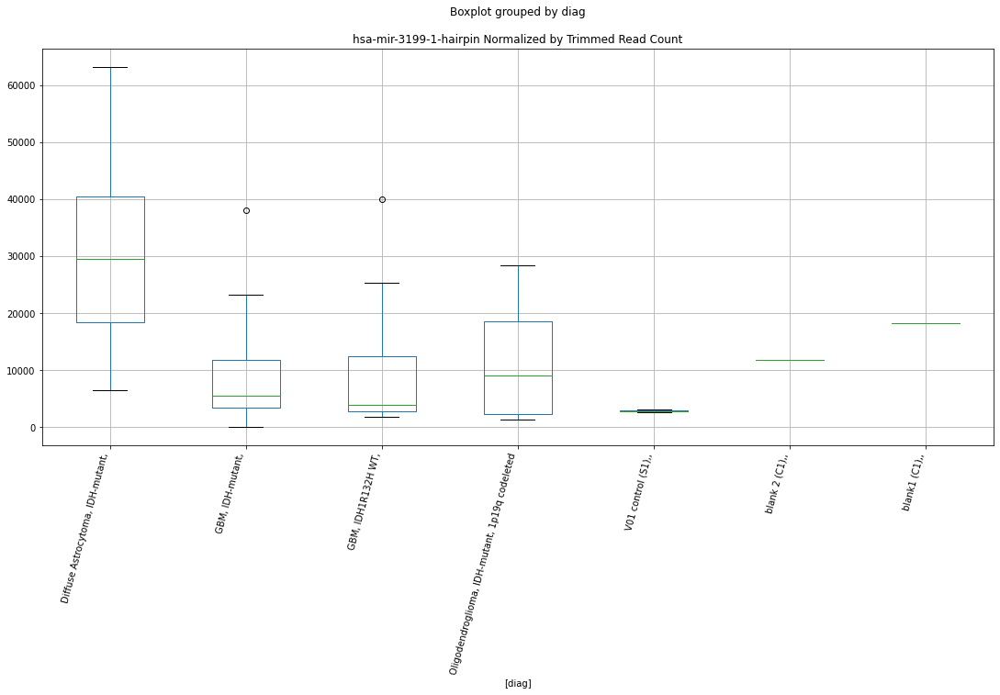

 p : 0.008278077721684074  ( t : 2.9658009625416275 ) :  Lexogen  :  cutadapt2  :  hsa-mir-647-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-647-mature, dtype: float64
214    0.0
Name: hsa-mir-647-mature, dtype: float64
478    0.0
Name: hsa-mir-647-mature, dtype: float64


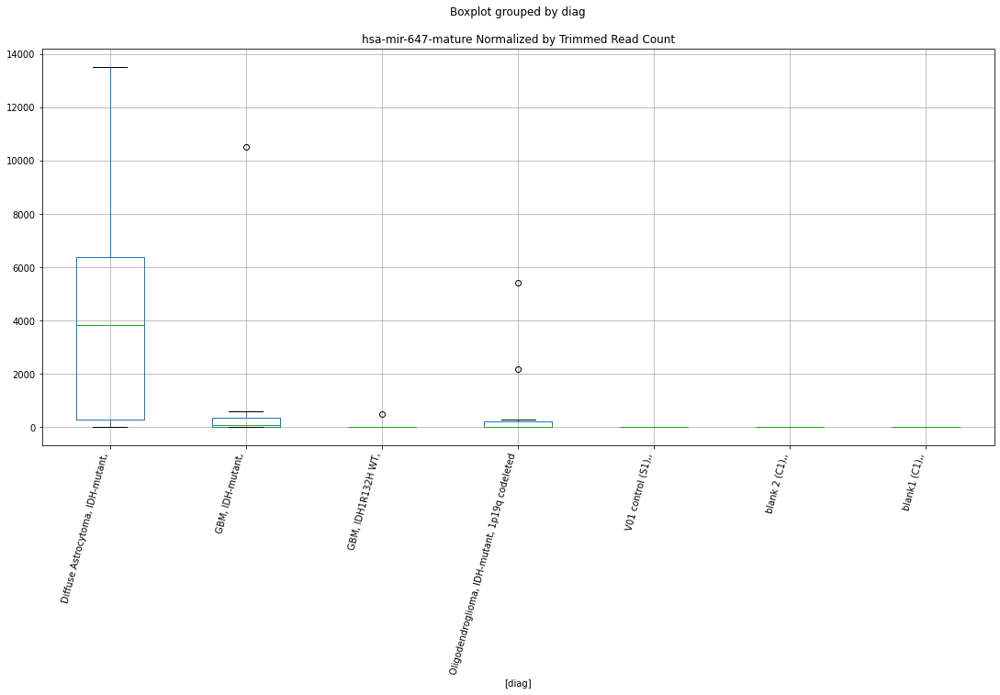

 p : 0.008292393407239588  ( t : 2.9650046028248265 ) :  Lexogen  :  cutadapt2  :  hsa-mir-665-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-665-mature, dtype: float64
214    0.0
Name: hsa-mir-665-mature, dtype: float64
478    0.0
Name: hsa-mir-665-mature, dtype: float64


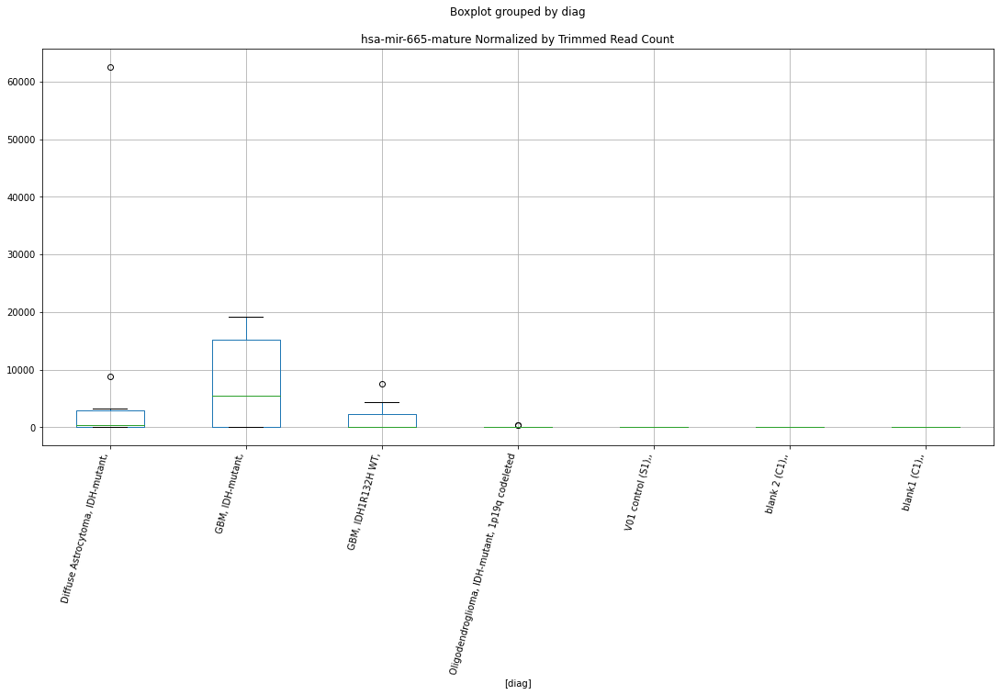

 p : 0.00830858504157103  ( t : 2.964105491124381 ) :  D-plex  :  bbduk2  :  hsa-mir-4300-mature
Control and blanks
73     773.008402
337      0.000000
Name: hsa-mir-4300-mature, dtype: float64
205    1074.545713
Name: hsa-mir-4300-mature, dtype: float64
469    0.0
Name: hsa-mir-4300-mature, dtype: float64


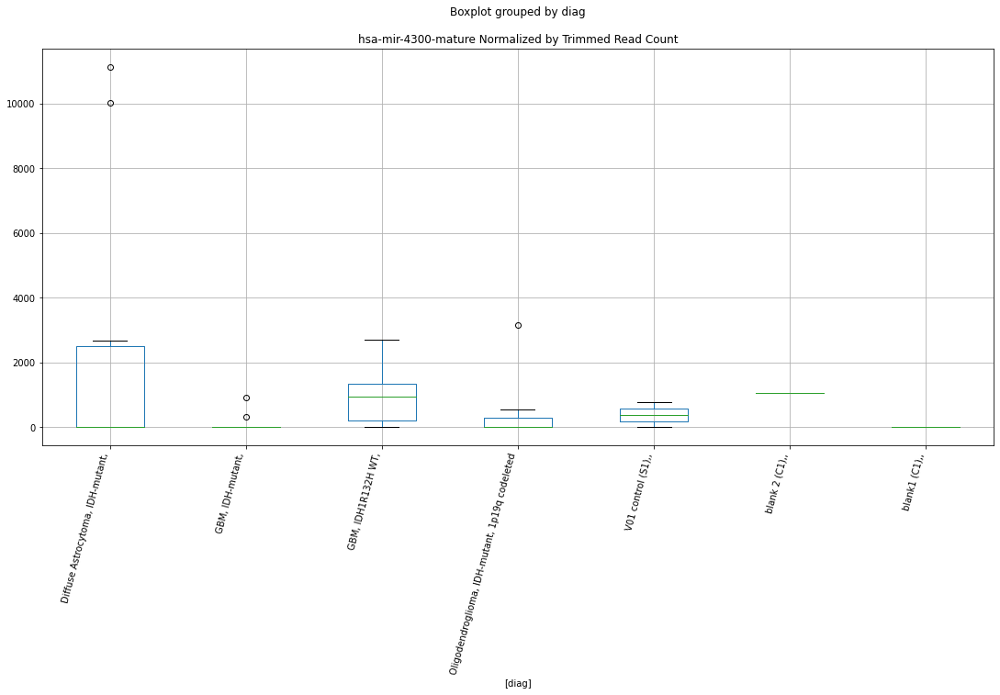

 p : 0.00832336812515573  ( t : 2.963286077089683 ) :  D-plex  :  bbduk2  :  hsa-mir-6824-hairpin
Control and blanks
73     113632.235069
337     40057.076884
Name: hsa-mir-6824-hairpin, dtype: float64
205    40295.464253
Name: hsa-mir-6824-hairpin, dtype: float64
469    26618.729293
Name: hsa-mir-6824-hairpin, dtype: float64


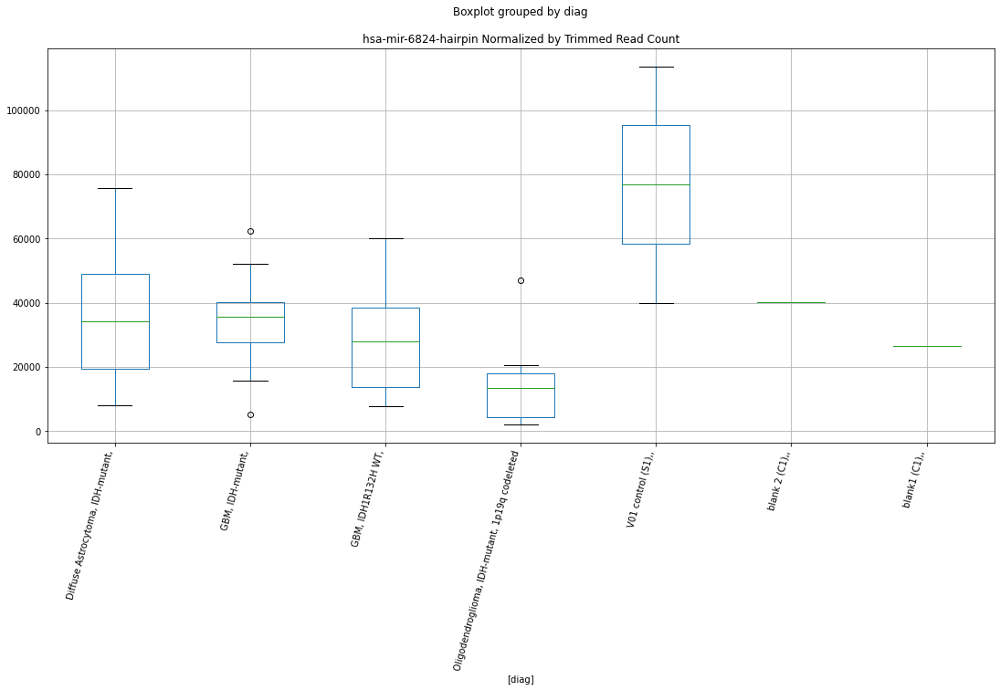

 p : 0.008348801361179934  ( t : 2.961879628798709 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-2-hairpin
Control and blanks
76     3030.456849
340    2642.196405
Name: hsa-mir-3199-2-hairpin, dtype: float64
208    11110.693725
Name: hsa-mir-3199-2-hairpin, dtype: float64
472    8669.337593
Name: hsa-mir-3199-2-hairpin, dtype: float64


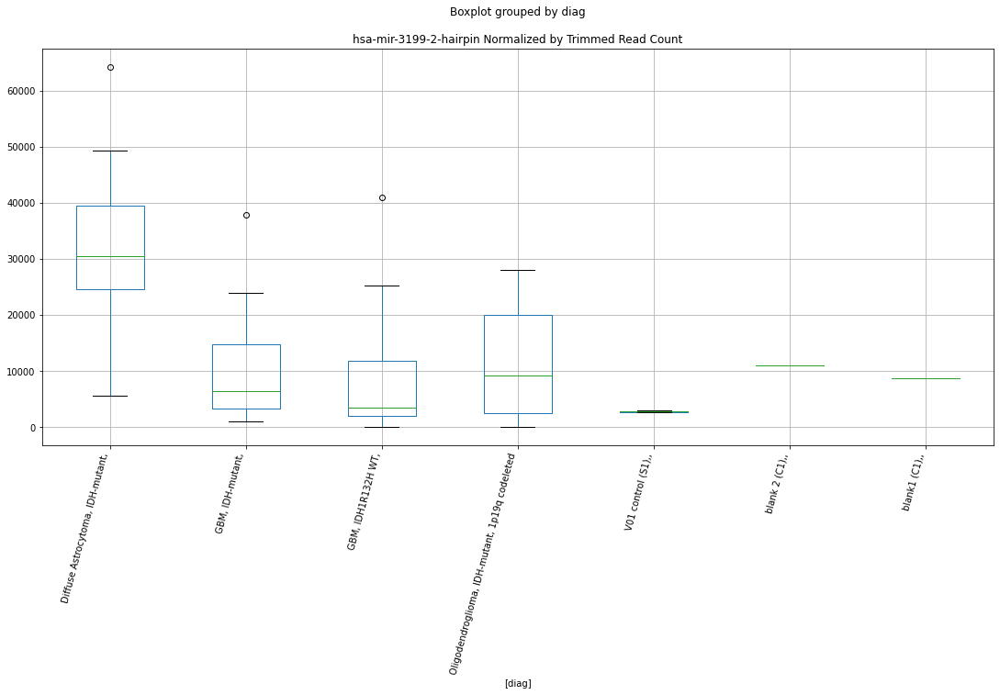

 p : 0.008411879556142357  ( t : 2.958409266527035 ) :  Lexogen  :  cutadapt2  :  hsa-mir-122-hairpin
Control and blanks
82      2840.102244
346    21885.190292
Name: hsa-mir-122-hairpin, dtype: float64
214    4068.396802
Name: hsa-mir-122-hairpin, dtype: float64
478    4986.670156
Name: hsa-mir-122-hairpin, dtype: float64


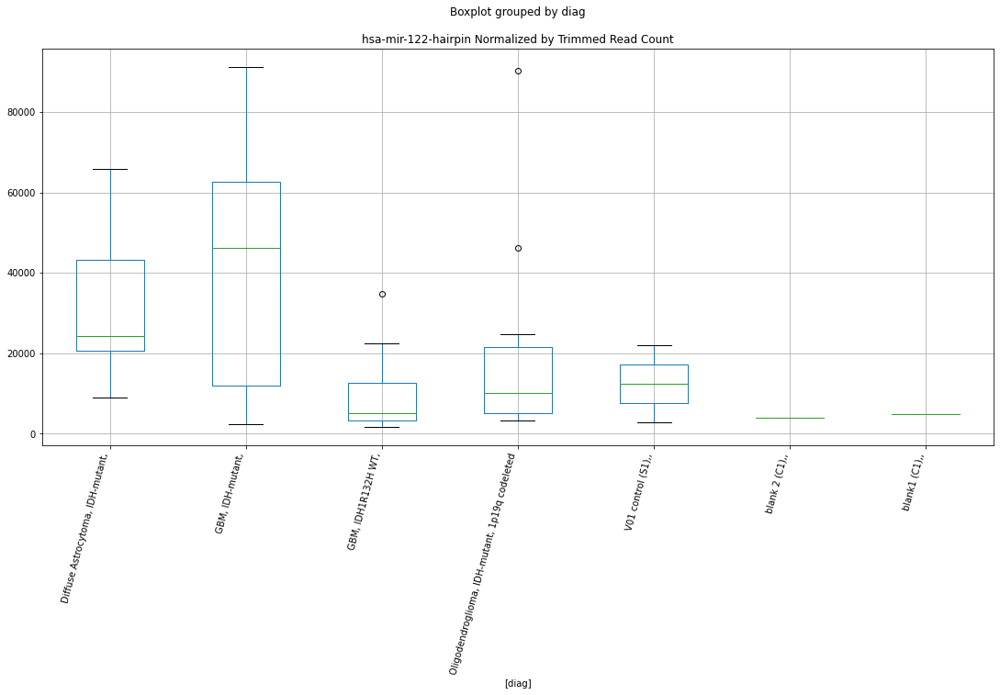

 p : 0.0084260438227146  ( t : 2.957633460718524 ) :  Lexogen  :  bbduk2  :  hsa-mir-3141-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-3141-mature, dtype: float64
211    1913.14434
Name: hsa-mir-3141-mature, dtype: float64
475    0.0
Name: hsa-mir-3141-mature, dtype: float64


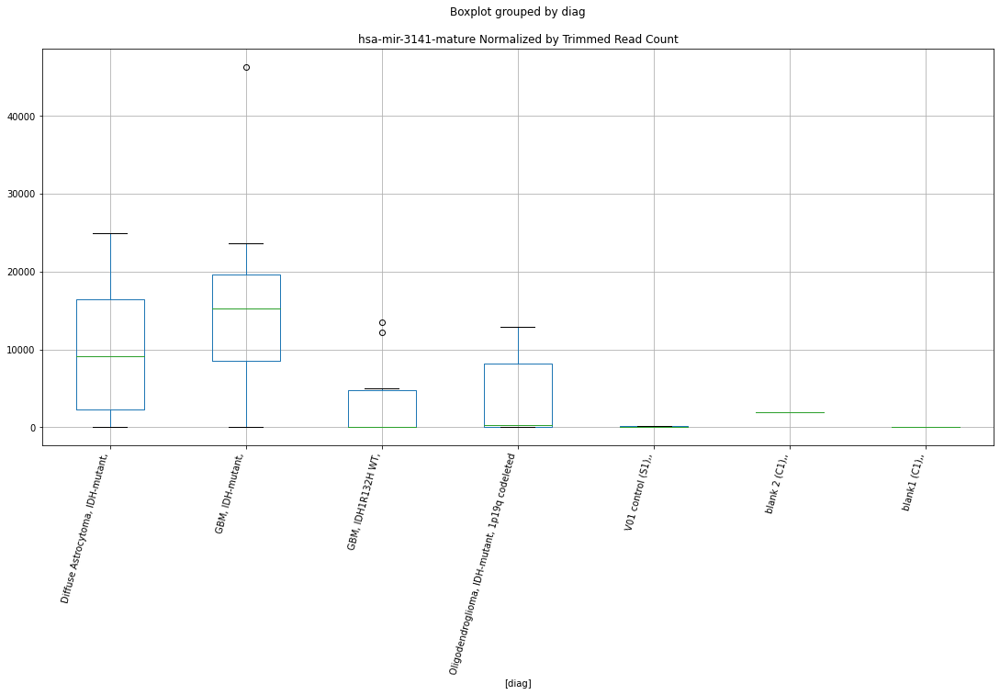

 p : 0.008450962721270001  ( t : 2.956271663328277 ) :  Lexogen  :  bbduk2  :  hsa-mir-562-hairpin
Control and blanks
79        0.000000
343    2123.143152
Name: hsa-mir-562-hairpin, dtype: float64
211    4919.514018
Name: hsa-mir-562-hairpin, dtype: float64
475    5029.830488
Name: hsa-mir-562-hairpin, dtype: float64


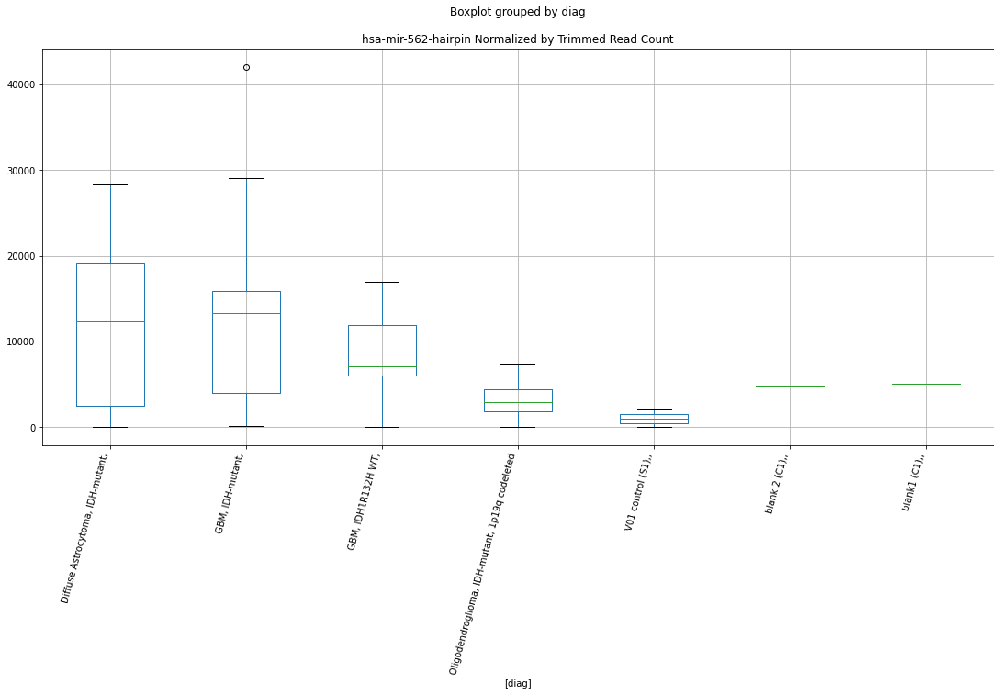

 p : 0.00845756993464194  ( t : 2.955911236990422 ) :  Lexogen  :  bbduk2  :  hsa-mir-99b-hairpin
Control and blanks
79         0.000000
343    32908.718857
Name: hsa-mir-99b-hairpin, dtype: float64
211    2186.450674
Name: hsa-mir-99b-hairpin, dtype: float64
475    5748.3777
Name: hsa-mir-99b-hairpin, dtype: float64


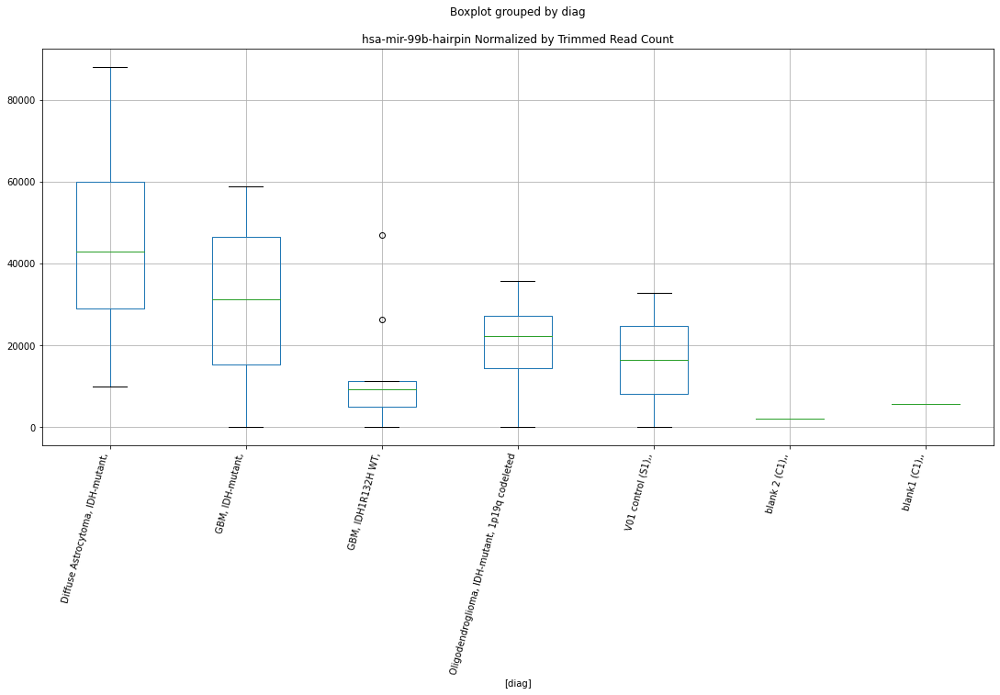

 p : 0.008470750201475386  ( t : 2.955193061808402 ) :  D-plex  :  cutadapt2  :  hsa-mir-3907-hairpin
Control and blanks
76     252285.532675
340     71339.302936
Name: hsa-mir-3907-hairpin, dtype: float64
208    207399.616205
Name: hsa-mir-3907-hairpin, dtype: float64
472    141021.22485
Name: hsa-mir-3907-hairpin, dtype: float64


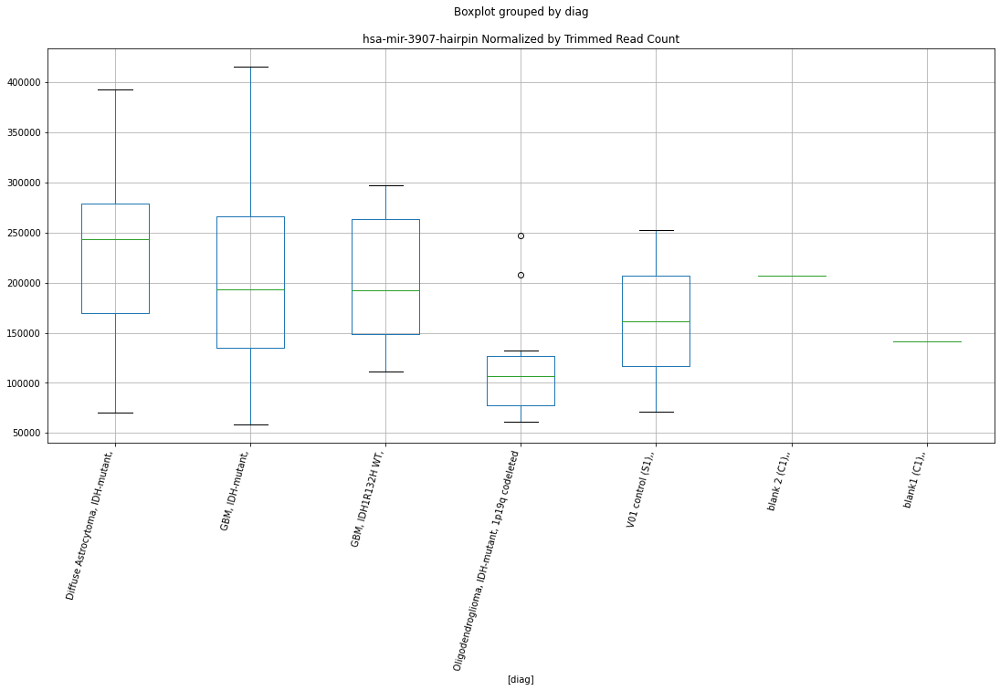

 p : 0.008495131861736801  ( t : 2.953867386325275 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4800-hairpin
Control and blanks
82     1420.051122
346    1052.172610
Name: hsa-mir-4800-hairpin, dtype: float64
214    2712.264535
Name: hsa-mir-4800-hairpin, dtype: float64
478    3086.986287
Name: hsa-mir-4800-hairpin, dtype: float64


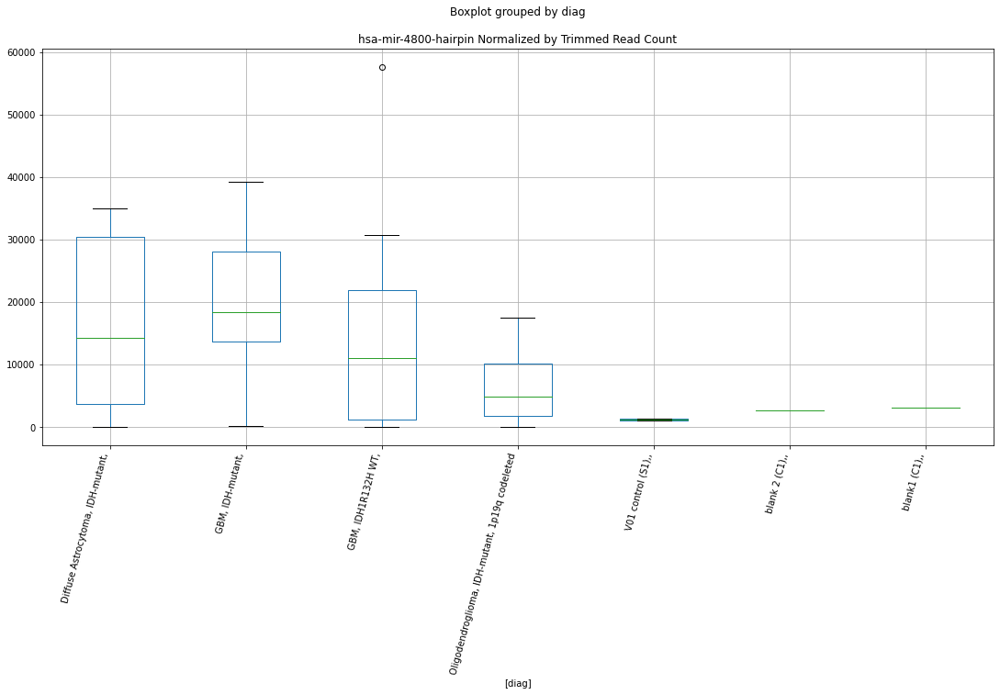

 p : 0.008523967768510393  ( t : 2.9523042739586294 ) :  D-plex  :  cutadapt2  :  hsa-mir-4312-mature
Control and blanks
76     757.614212
340      0.000000
Name: hsa-mir-4312-mature, dtype: float64
208    705.440871
Name: hsa-mir-4312-mature, dtype: float64
472    6357.514235
Name: hsa-mir-4312-mature, dtype: float64


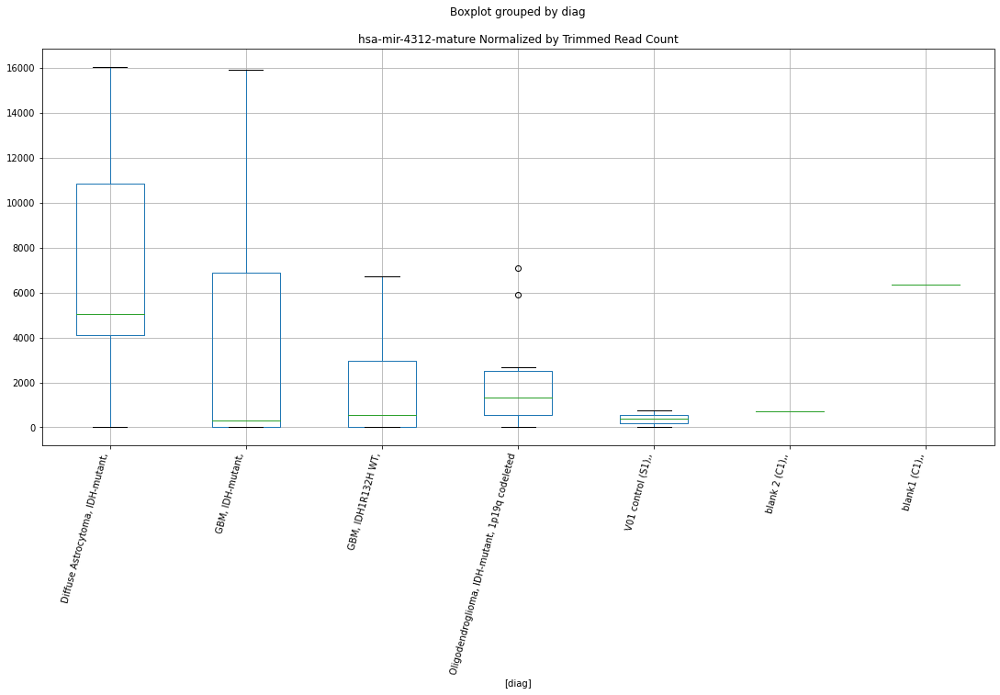

 p : 0.008527878560074286  ( t : 2.952092675614549 ) :  D-plex  :  bbduk2  :  hsa-mir-3199-2-hairpin
Control and blanks
73     3092.033607
337    2670.471792
Name: hsa-mir-3199-2-hairpin, dtype: float64
205    11640.911895
Name: hsa-mir-3199-2-hairpin, dtype: float64
469    17154.292211
Name: hsa-mir-3199-2-hairpin, dtype: float64


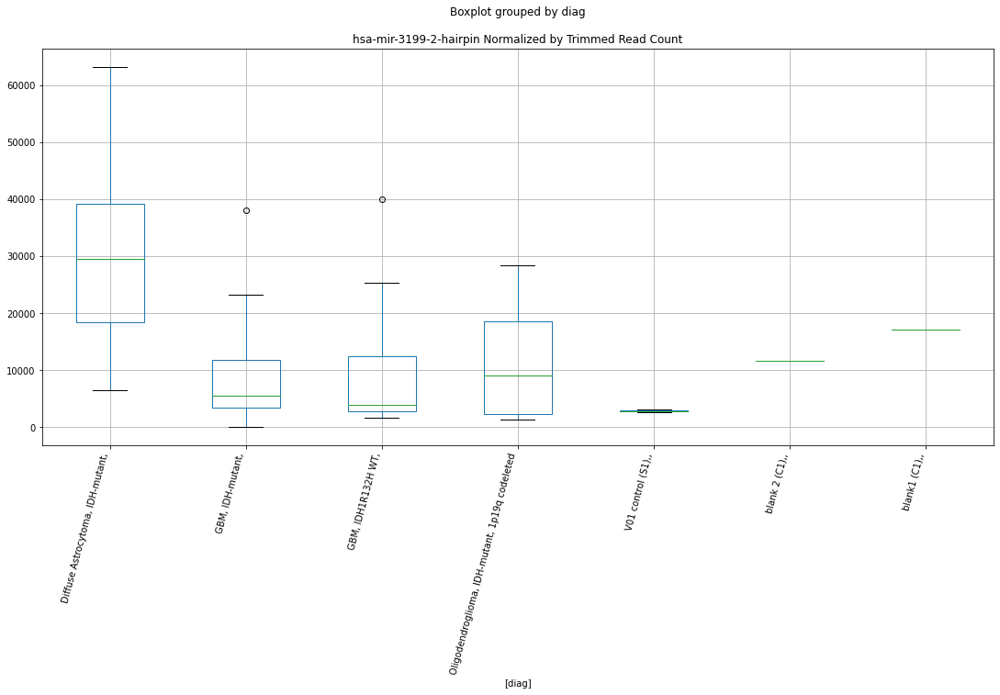

 p : 0.008547686211800505  ( t : 2.9510223988664364 ) :  Lexogen  :  bbduk2  :  hsa-mir-614-hairpin
Control and blanks
79       0.000000
343    636.942946
Name: hsa-mir-614-hairpin, dtype: float64
211    273.306334
Name: hsa-mir-614-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-614-hairpin, dtype: float64


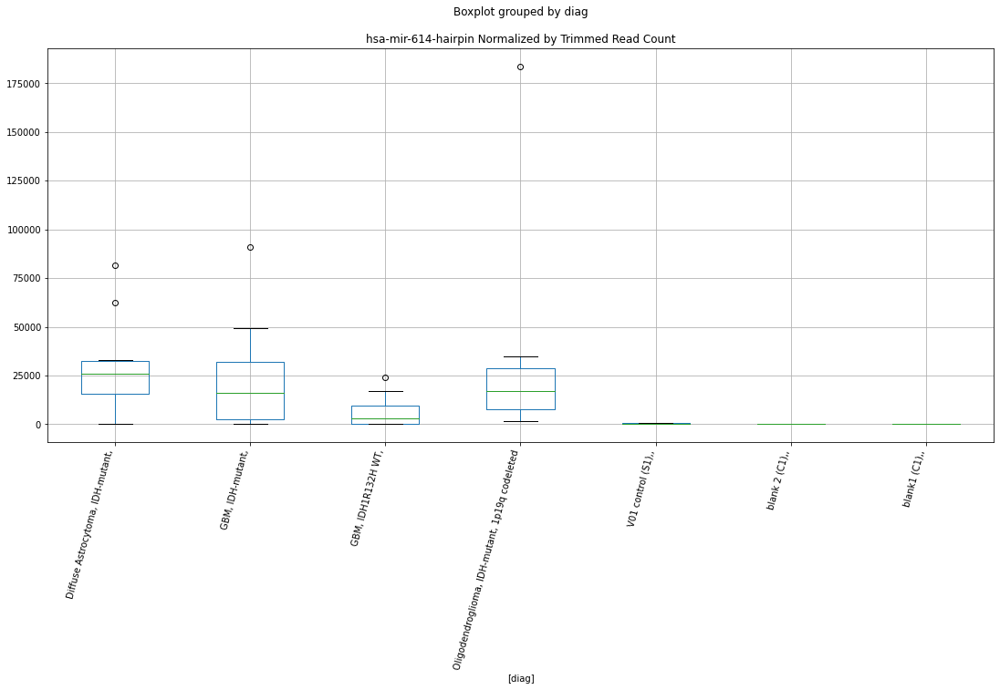

 p : 0.008557798228535486  ( t : 2.9504769370146504 ) :  D-plex  :  bbduk2  :  hsa-mir-331-3p-mature
Control and blanks
73     79619.865388
337     3560.629056
Name: hsa-mir-331-3p-mature, dtype: float64
205    18267.277128
Name: hsa-mir-331-3p-mature, dtype: float64
469    16562.764893
Name: hsa-mir-331-3p-mature, dtype: float64


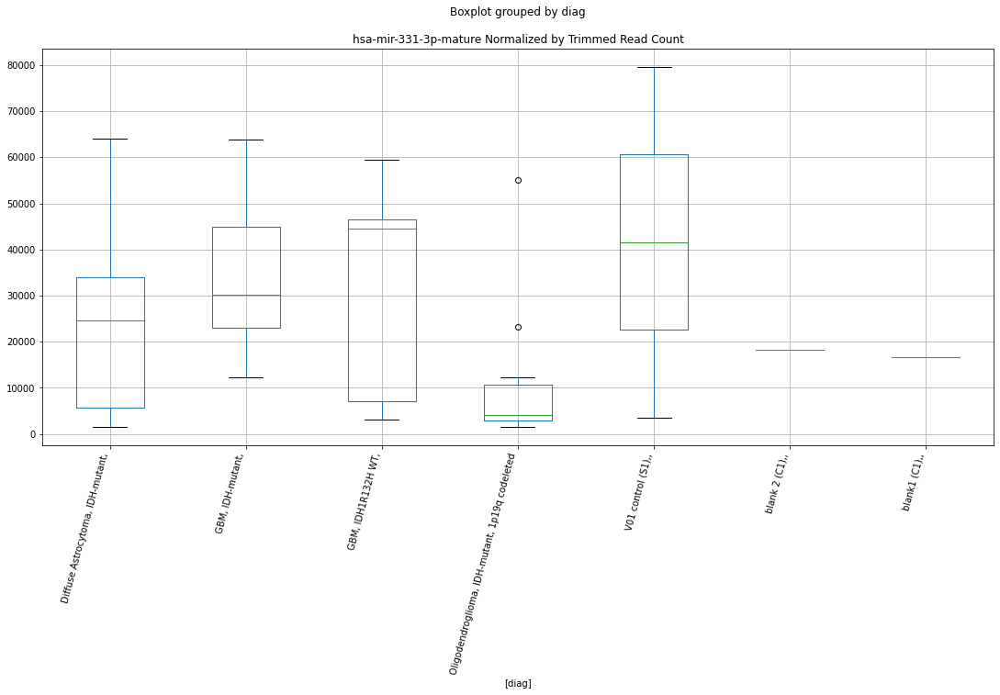

 p : 0.008573100589977527  ( t : 2.949652683745219 ) :  D-plex  :  cutadapt2  :  hsa-mir-363-3p-mature
Control and blanks
76         0.000000
340    14972.446295
Name: hsa-mir-363-3p-mature, dtype: float64
208    352.720436
Name: hsa-mir-363-3p-mature, dtype: float64
472    577.95584
Name: hsa-mir-363-3p-mature, dtype: float64


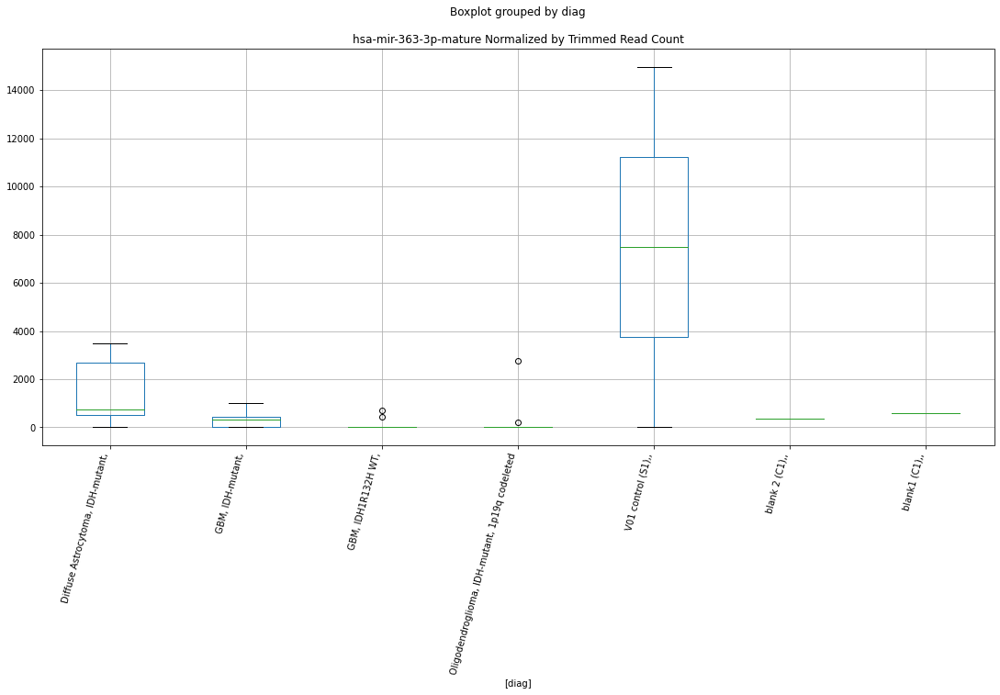

 p : 0.008590938230670711  ( t : 2.9486936655858975 ) :  D-plex  :  bbduk2  :  hsa-mir-29c-hairpin
Control and blanks
73      9276.100822
337    50738.964053
Name: hsa-mir-29c-hairpin, dtype: float64
205    55518.195193
Name: hsa-mir-29c-hairpin, dtype: float64
469    30167.893199
Name: hsa-mir-29c-hairpin, dtype: float64


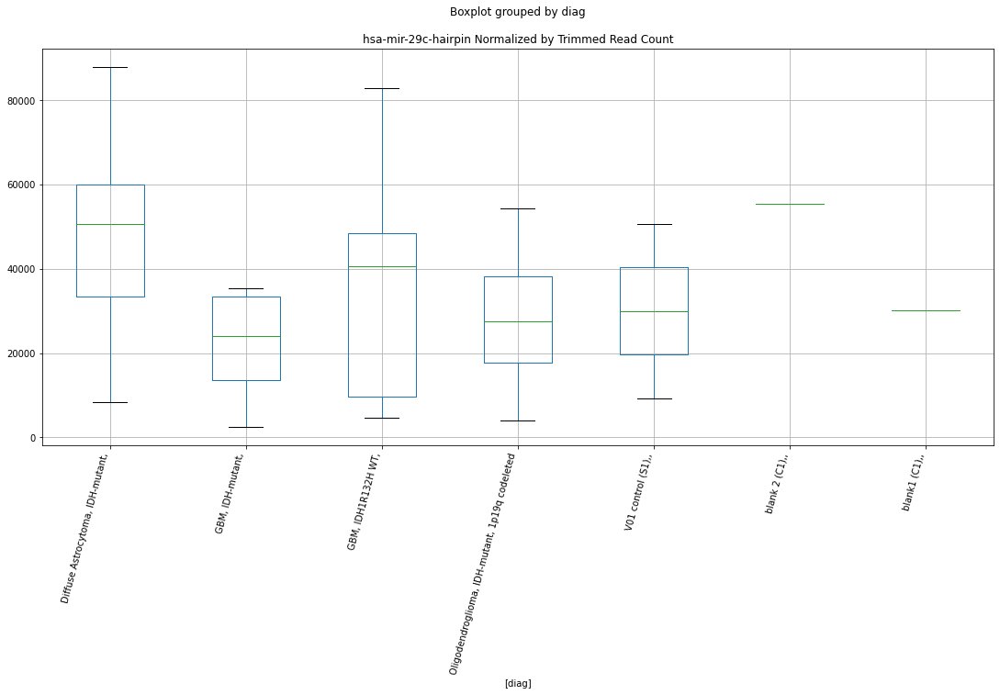

 p : 0.008597132123207792  ( t : 2.9483611097896665 ) :  Lexogen  :  bbduk2  :  hsa-mir-647-mature
Control and blanks
79     0.0
343    0.0
Name: hsa-mir-647-mature, dtype: float64
211    0.0
Name: hsa-mir-647-mature, dtype: float64
475    0.0
Name: hsa-mir-647-mature, dtype: float64


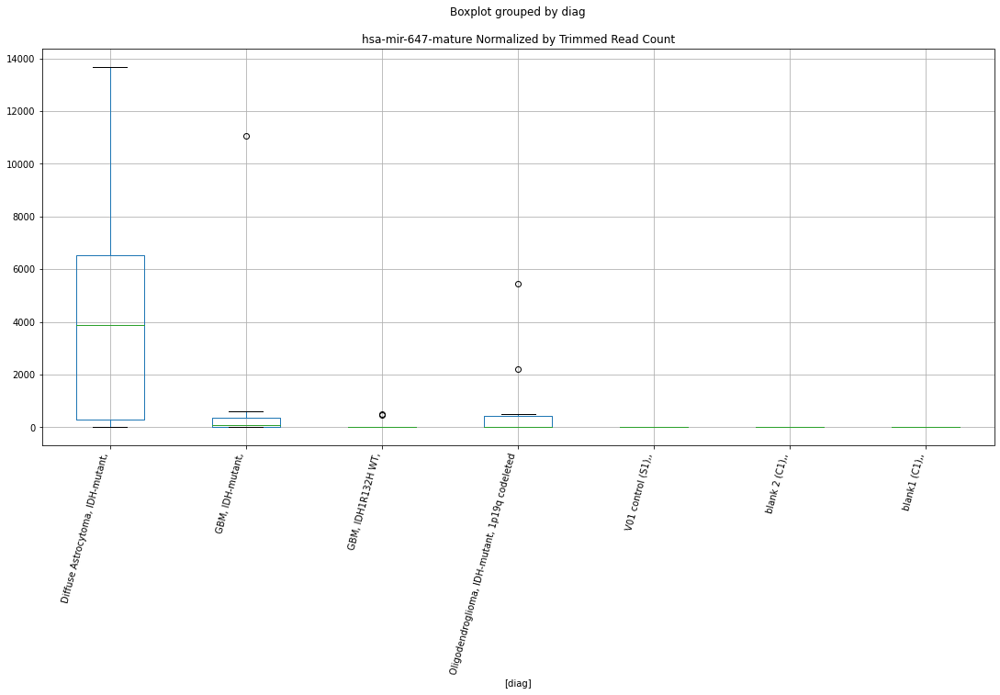

 p : 0.00859716866269683  ( t : 2.9483591486393252 ) :  D-plex  :  cutadapt2  :  hsa-mir-3124-hairpin
Control and blanks
76     47729.695371
340    22018.303375
Name: hsa-mir-3124-hairpin, dtype: float64
208    28041.27464
Name: hsa-mir-3124-hairpin, dtype: float64
472    41612.820448
Name: hsa-mir-3124-hairpin, dtype: float64


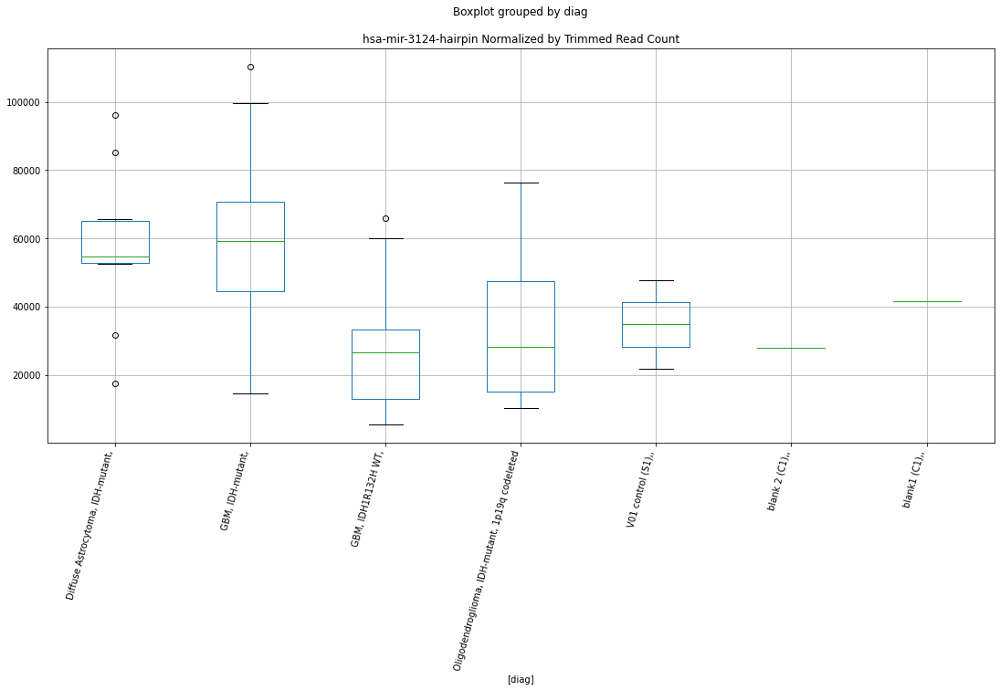

 p : 0.008609718426810114  ( t : 2.9476860537095875 ) :  Lexogen  :  bbduk2  :  hsa-mir-219a-2-3p-mature
Control and blanks
79        0.000000
343    5520.172195
Name: hsa-mir-219a-2-3p-mature, dtype: float64
211    0.0
Name: hsa-mir-219a-2-3p-mature, dtype: float64
475    0.0
Name: hsa-mir-219a-2-3p-mature, dtype: float64


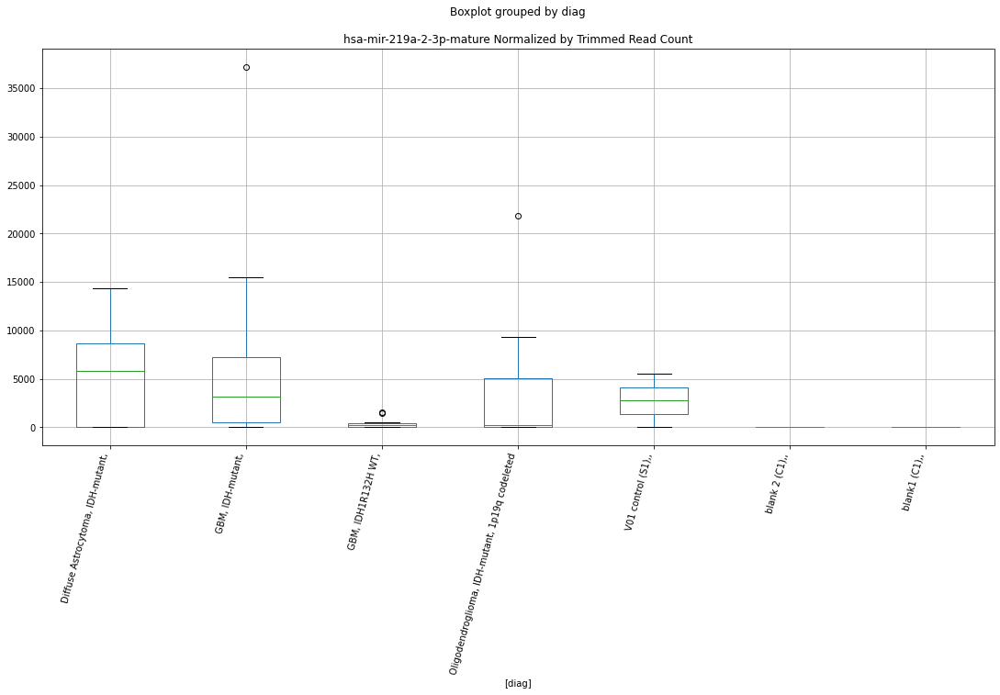

 p : 0.008653094733843009  ( t : 2.945366900067032 ) :  Lexogen  :  cutadapt2  :  hsa-mir-100-hairpin
Control and blanks
82     14200.511218
346      420.869044
Name: hsa-mir-100-hairpin, dtype: float64
214    7865.567151
Name: hsa-mir-100-hairpin, dtype: float64
478    0.0
Name: hsa-mir-100-hairpin, dtype: float64


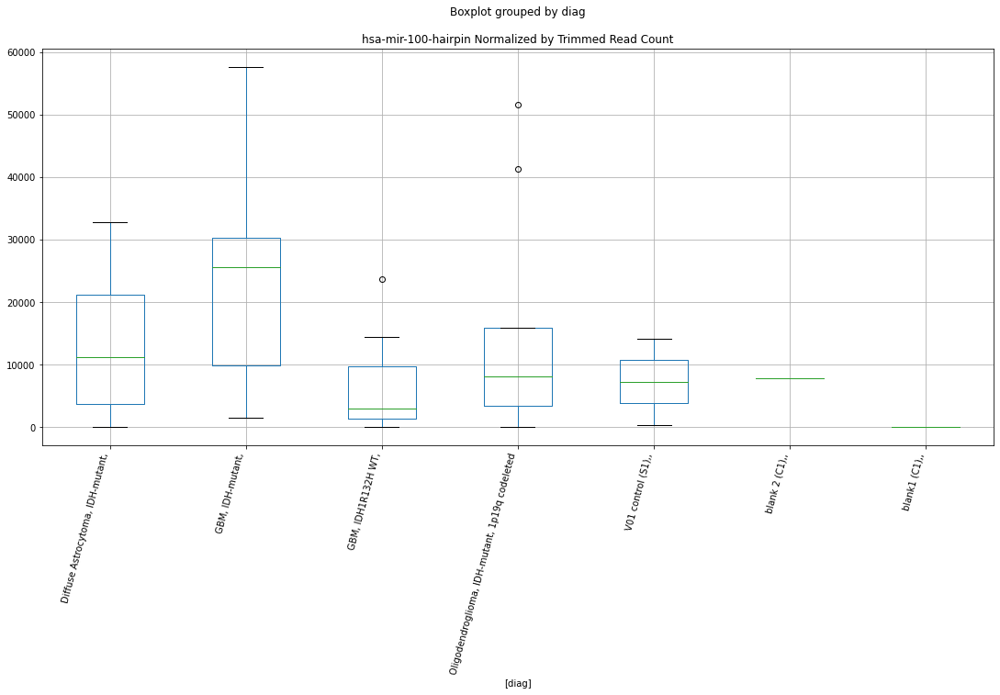

 p : 0.008664234863684438  ( t : 2.9447730996452885 ) :  Lexogen  :  bbduk2  :  hsa-mir-584-hairpin
Control and blanks
79      1430.598791
343    33545.661803
Name: hsa-mir-584-hairpin, dtype: float64
211    6286.045689
Name: hsa-mir-584-hairpin, dtype: float64
475    1437.094425
Name: hsa-mir-584-hairpin, dtype: float64


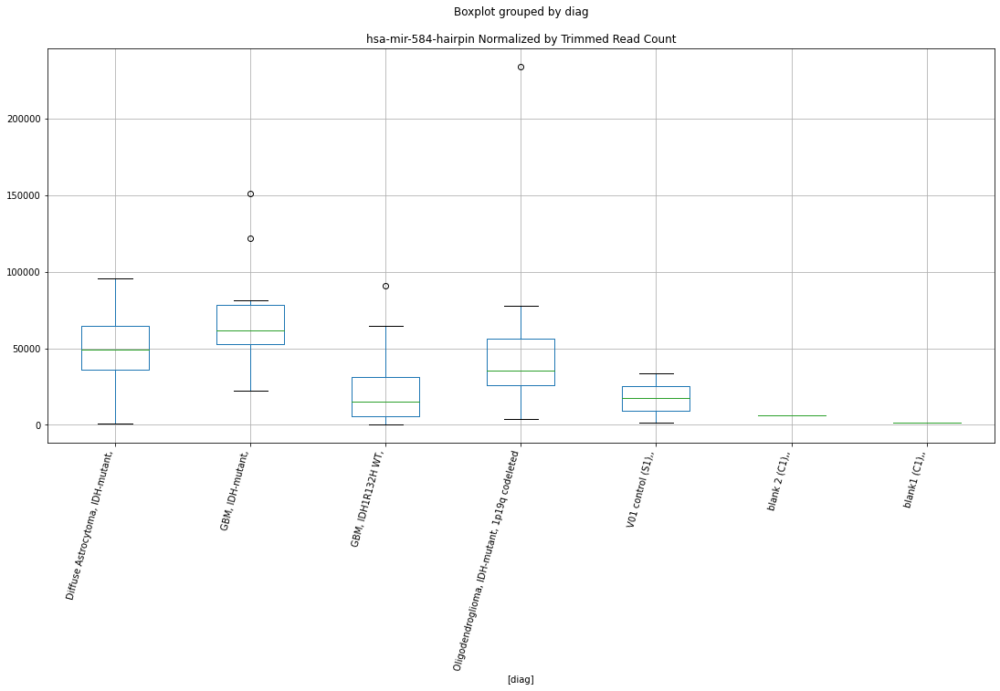

 p : 0.008680125814573643  ( t : 2.9439273450554184 ) :  Lexogen  :  cutadapt2  :  hsa-mir-10b-5p-mature
Control and blanks
82       1420.051122
346    135309.397669
Name: hsa-mir-10b-5p-mature, dtype: float64
214    5966.981976
Name: hsa-mir-10b-5p-mature, dtype: float64
478    237.460484
Name: hsa-mir-10b-5p-mature, dtype: float64


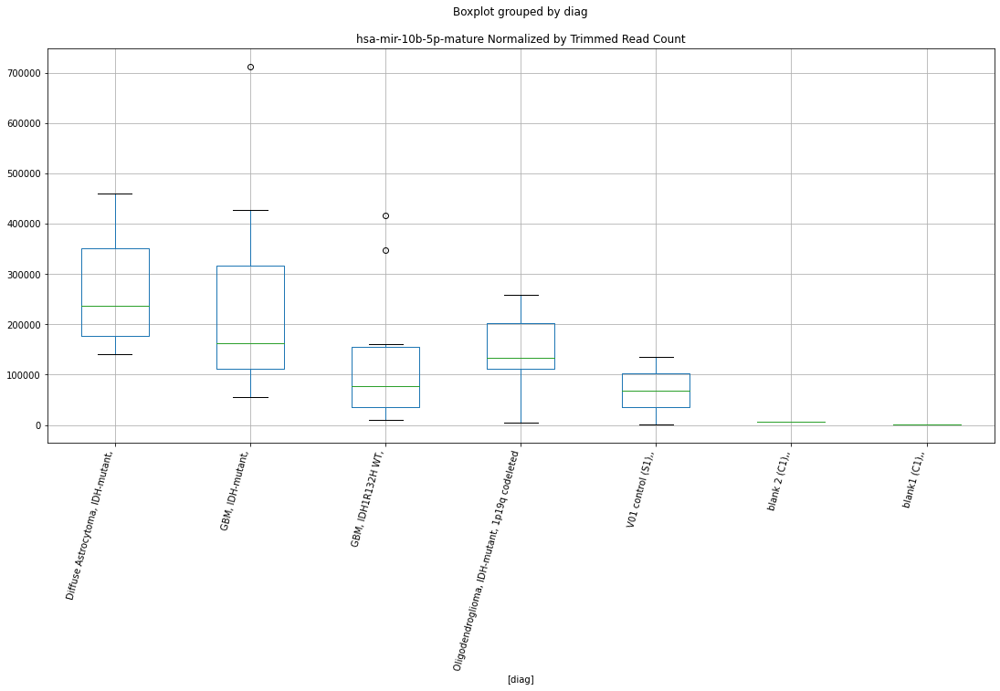

 p : 0.008687738066292668  ( t : 2.943522733631177 ) :  D-plex  :  bbduk2  :  hsa-mir-548f-3-hairpin
Control and blanks
73     10049.109224
337    69432.266599
Name: hsa-mir-548f-3-hairpin, dtype: float64
205    94918.204685
Name: hsa-mir-548f-3-hairpin, dtype: float64
469    62110.36835
Name: hsa-mir-548f-3-hairpin, dtype: float64


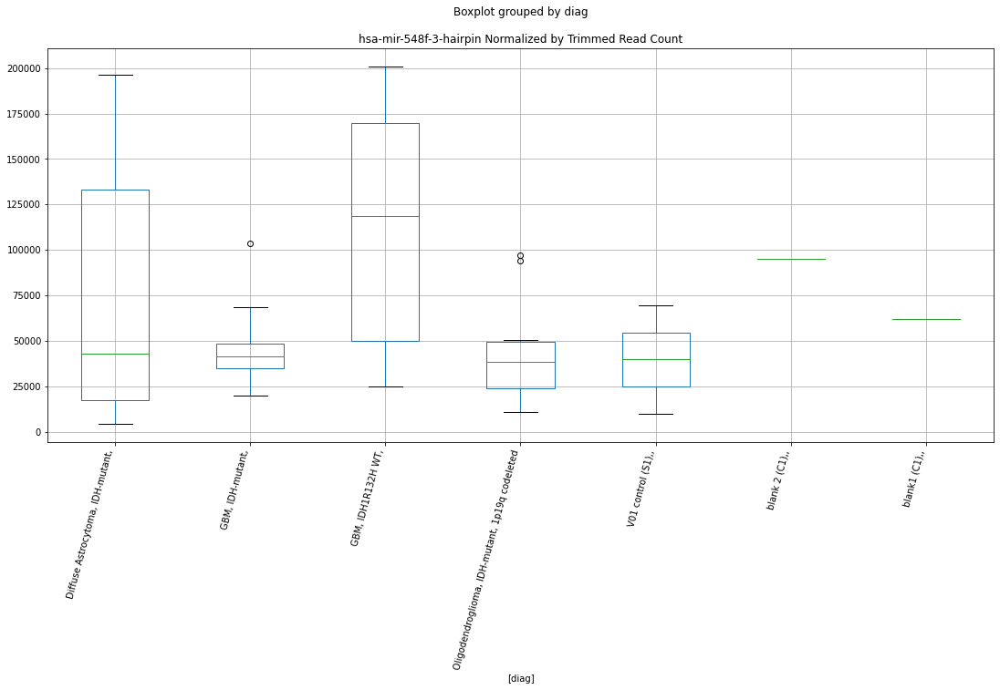

 p : 0.008692407551491263  ( t : 2.9432747078860193 ) :  Lexogen  :  bbduk2  :  hsa-mir-6764-hairpin
Control and blanks
79     0.0
343    0.0
Name: hsa-mir-6764-hairpin, dtype: float64
211    0.0
Name: hsa-mir-6764-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-6764-hairpin, dtype: float64


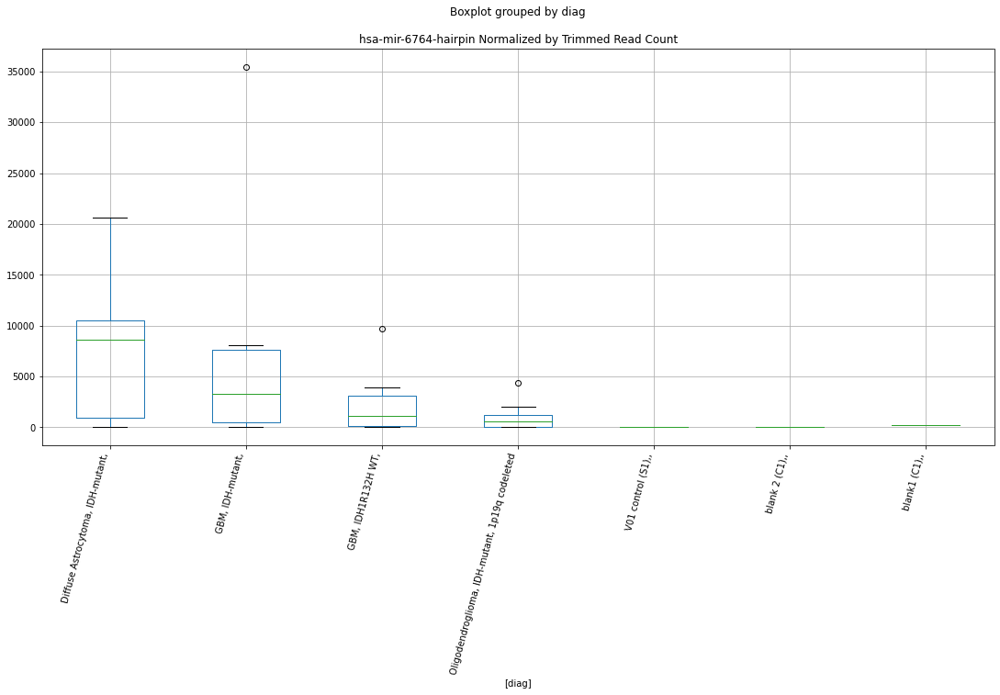

 p : 0.008746130904871925  ( t : 2.9404303647433983 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1305-hairpin
Control and blanks
82         0.000000
346    45243.422238
Name: hsa-mir-1305-hairpin, dtype: float64
214    7594.340697
Name: hsa-mir-1305-hairpin, dtype: float64
478    9023.498377
Name: hsa-mir-1305-hairpin, dtype: float64


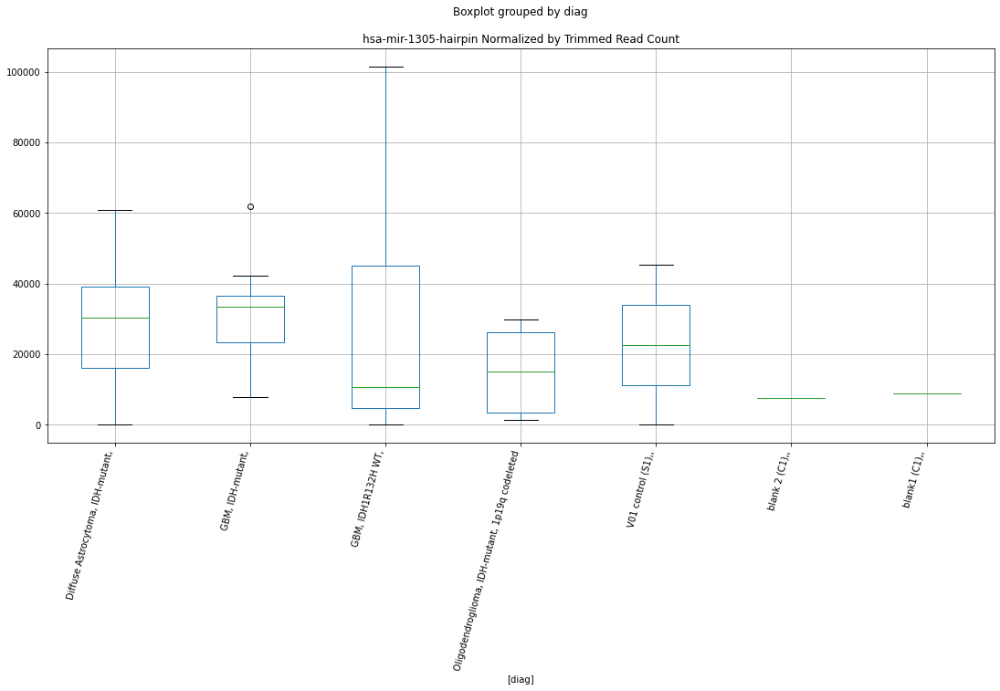

 p : 0.008782817731569064  ( t : 2.938497709500387 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6090-hairpin
Control and blanks
82         0.000000
346    29881.702129
Name: hsa-mir-6090-hairpin, dtype: float64
214    7051.88779
Name: hsa-mir-6090-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-6090-hairpin, dtype: float64


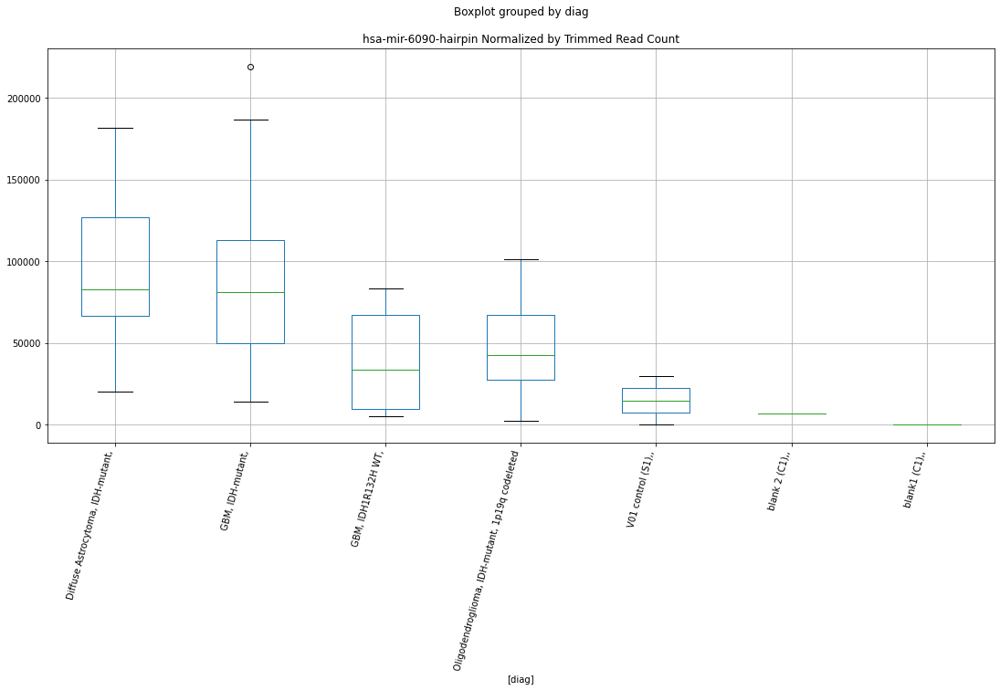

 p : 0.008820277425437596  ( t : 2.9365323854430327 ) :  Lexogen  :  bbduk2  :  hsa-mir-10b-5p-mature
Control and blanks
79       1430.598791
343    136730.418994
Name: hsa-mir-10b-5p-mature, dtype: float64
211    6286.045689
Name: hsa-mir-10b-5p-mature, dtype: float64
475    239.515738
Name: hsa-mir-10b-5p-mature, dtype: float64


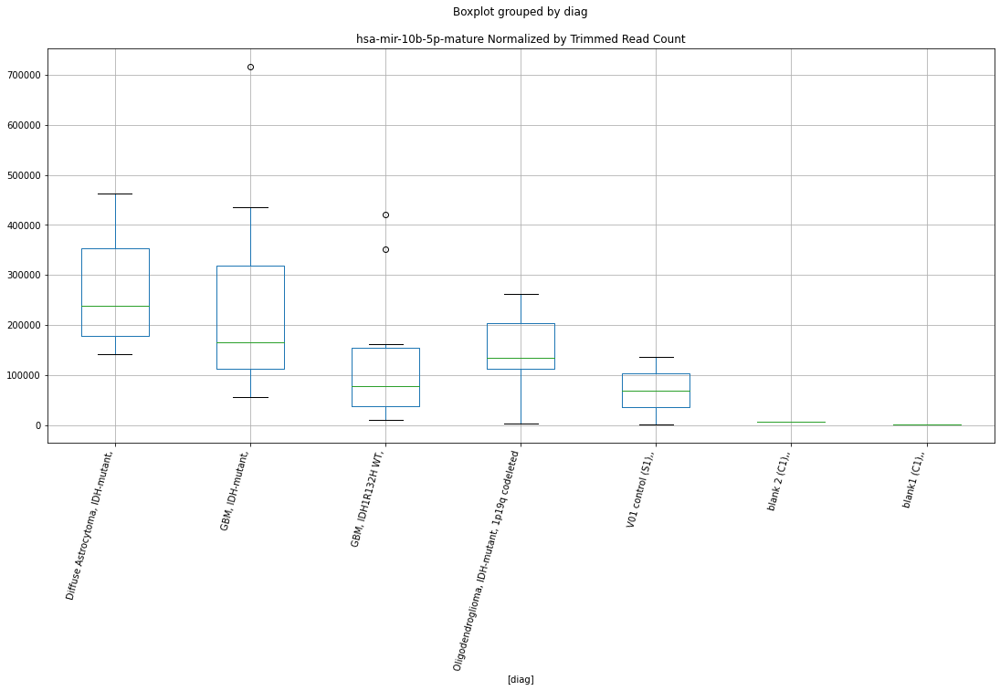

 p : 0.00882979855595378  ( t : 2.9360341465993205 ) :  Lexogen  :  bbduk2  :  hsa-mir-6508-5p-mature
Control and blanks
79     0.0
343    0.0
Name: hsa-mir-6508-5p-mature, dtype: float64
211    3006.369677
Name: hsa-mir-6508-5p-mature, dtype: float64
475    239.515738
Name: hsa-mir-6508-5p-mature, dtype: float64


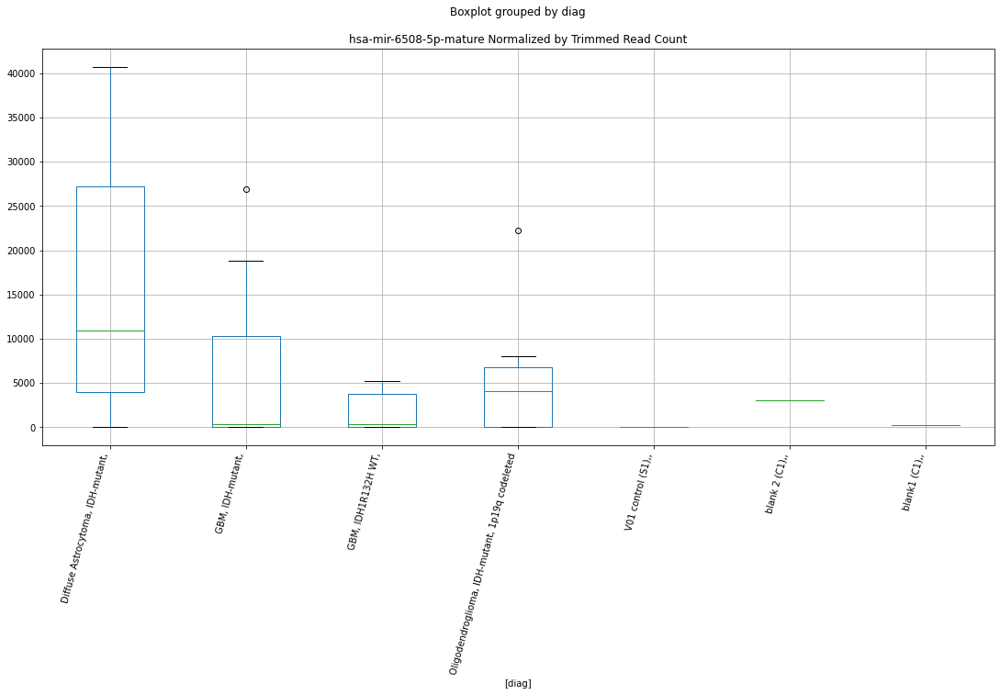

 p : 0.00885751987644828  ( t : 2.9345864506019366 ) :  Lexogen  :  cutadapt2  :  hsa-mir-614-hairpin
Control and blanks
82       0.000000
346    420.869044
Name: hsa-mir-614-hairpin, dtype: float64
214    0.0
Name: hsa-mir-614-hairpin, dtype: float64
478    0.0
Name: hsa-mir-614-hairpin, dtype: float64


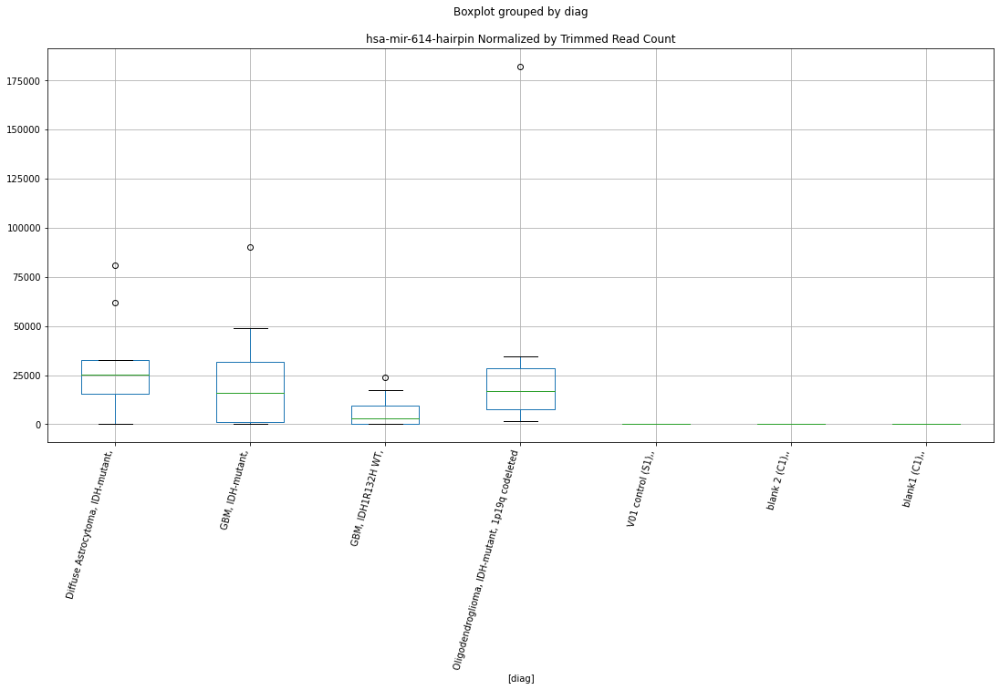

 p : 0.008952385171985804  ( t : 2.929665241426266 ) :  Lexogen  :  bbduk2  :  hsa-mir-532-5p-mature
Control and blanks
79         0.000000
343    31422.518651
Name: hsa-mir-532-5p-mature, dtype: float64
211    5739.433021
Name: hsa-mir-532-5p-mature, dtype: float64
475    8143.535075
Name: hsa-mir-532-5p-mature, dtype: float64


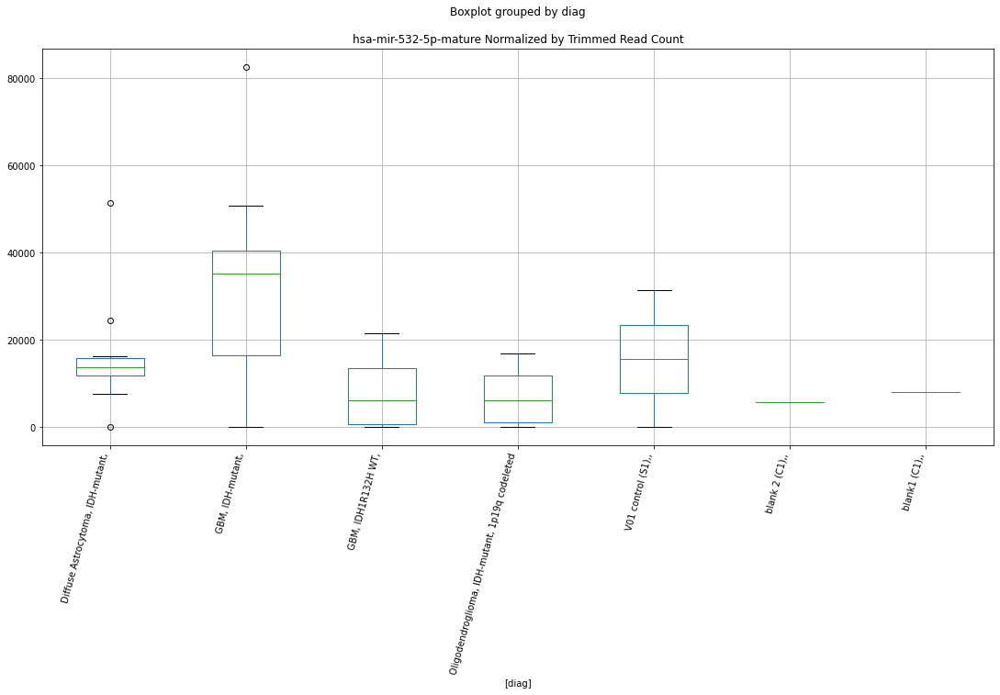

 p : 0.008958799470127302  ( t : 2.929334318433851 ) :  D-plex  :  cutadapt2  :  hsa-mir-4672-hairpin
Control and blanks
76      26516.497428
340    379595.550189
Name: hsa-mir-4672-hairpin, dtype: float64
208    96116.318734
Name: hsa-mir-4672-hairpin, dtype: float64
472    87849.287612
Name: hsa-mir-4672-hairpin, dtype: float64


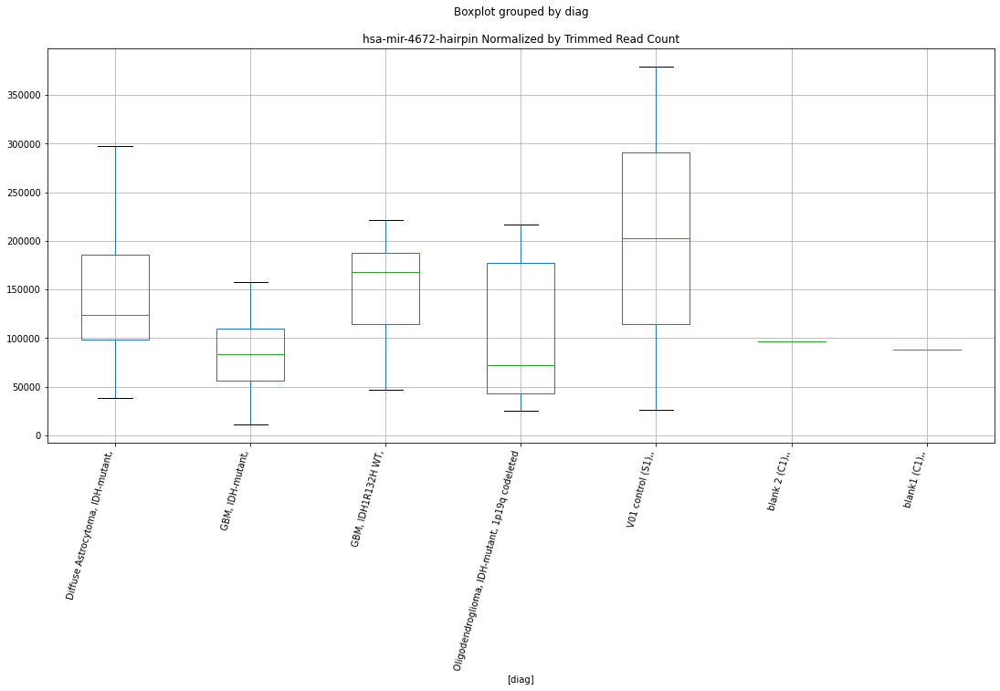

 p : 0.008964046281225485  ( t : 2.929063798191928 ) :  D-plex  :  bbduk2  :  hsa-mir-4767-hairpin
Control and blanks
73     105129.142649
337      1780.314528
Name: hsa-mir-4767-hairpin, dtype: float64
205    43519.101393
Name: hsa-mir-4767-hairpin, dtype: float64
469    33125.529787
Name: hsa-mir-4767-hairpin, dtype: float64


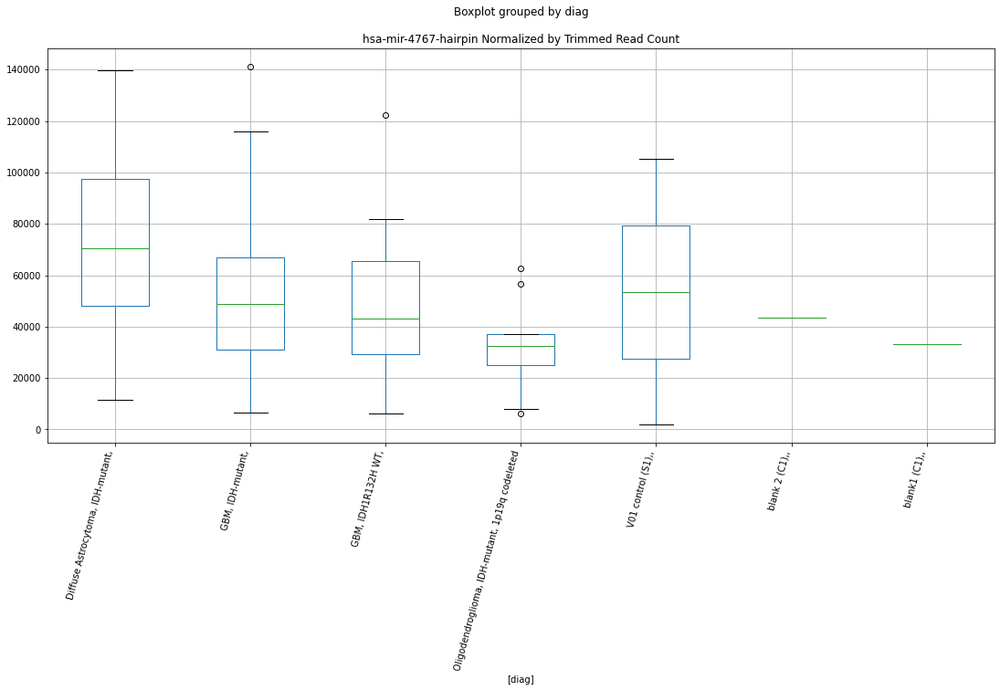

 p : 0.008989857025613349  ( t : 2.9277352487397588 ) :  D-plex  :  bbduk2  :  hsa-mir-3145-5p-mature
Control and blanks
73     6957.075616
337    5340.943585
Name: hsa-mir-3145-5p-mature, dtype: float64
205    7521.819994
Name: hsa-mir-3145-5p-mature, dtype: float64
469    17745.819529
Name: hsa-mir-3145-5p-mature, dtype: float64


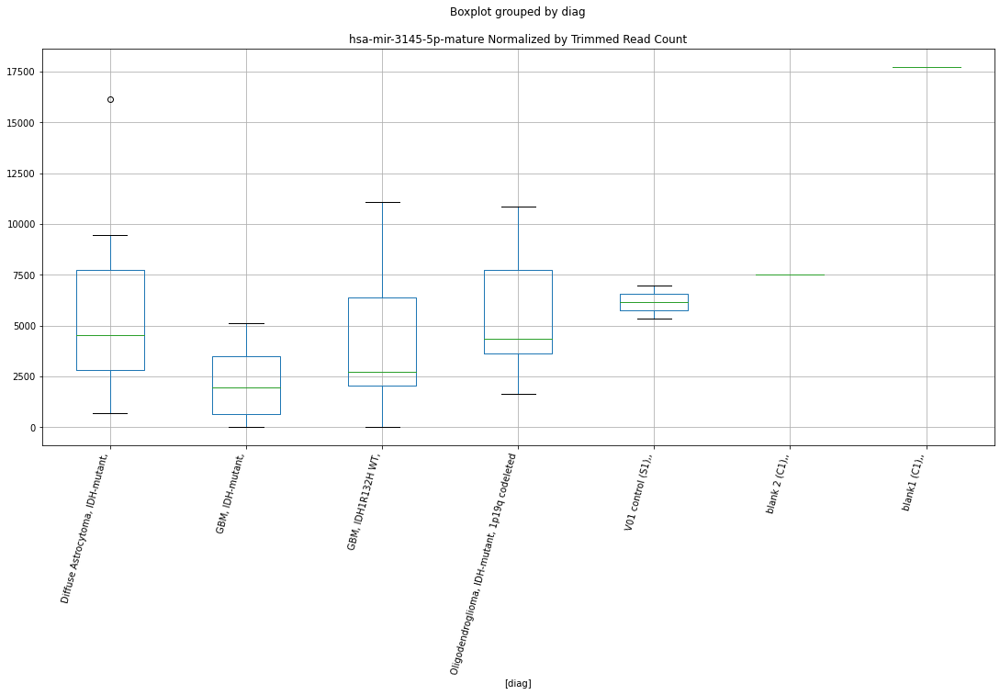

 p : 0.009000198307442682  ( t : 2.9272039898554647 ) :  D-plex  :  bbduk2  :  hsa-mir-411-hairpin
Control and blanks
73     23963.260457
337    41837.391412
Name: hsa-mir-411-hairpin, dtype: float64
205    22207.278077
Name: hsa-mir-411-hairpin, dtype: float64
469    35491.639057
Name: hsa-mir-411-hairpin, dtype: float64


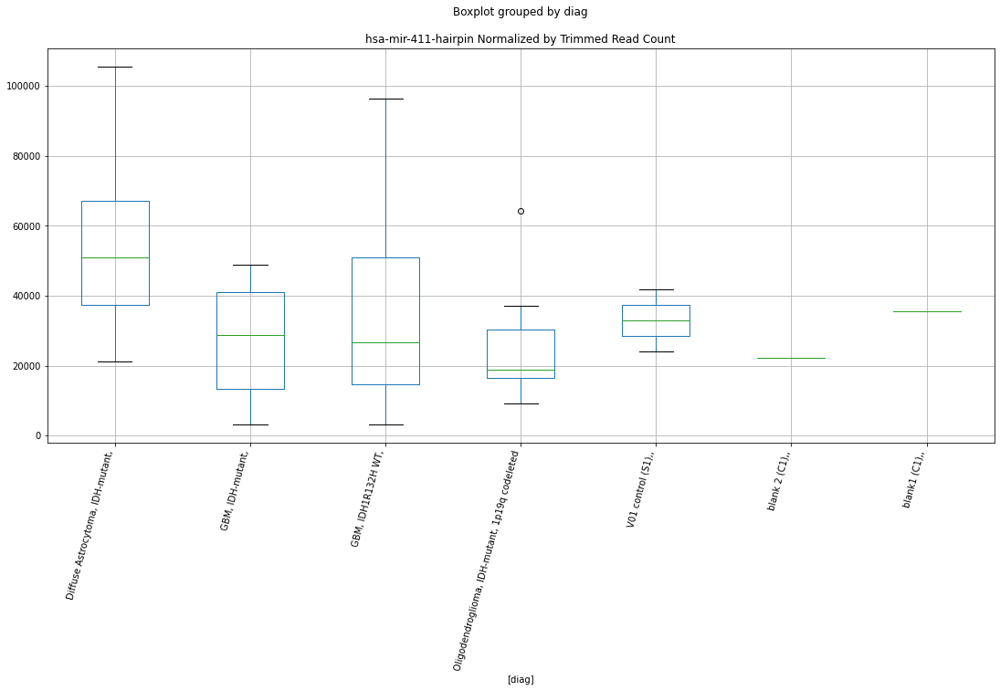

 p : 0.00900991338224095  ( t : 2.926705438536494 ) :  Lexogen  :  bbduk2  :  hsa-mir-6090-hairpin
Control and blanks
79         0.000000
343    29936.318444
Name: hsa-mir-6090-hairpin, dtype: float64
211    7105.964692
Name: hsa-mir-6090-hairpin, dtype: float64
475    239.515738
Name: hsa-mir-6090-hairpin, dtype: float64


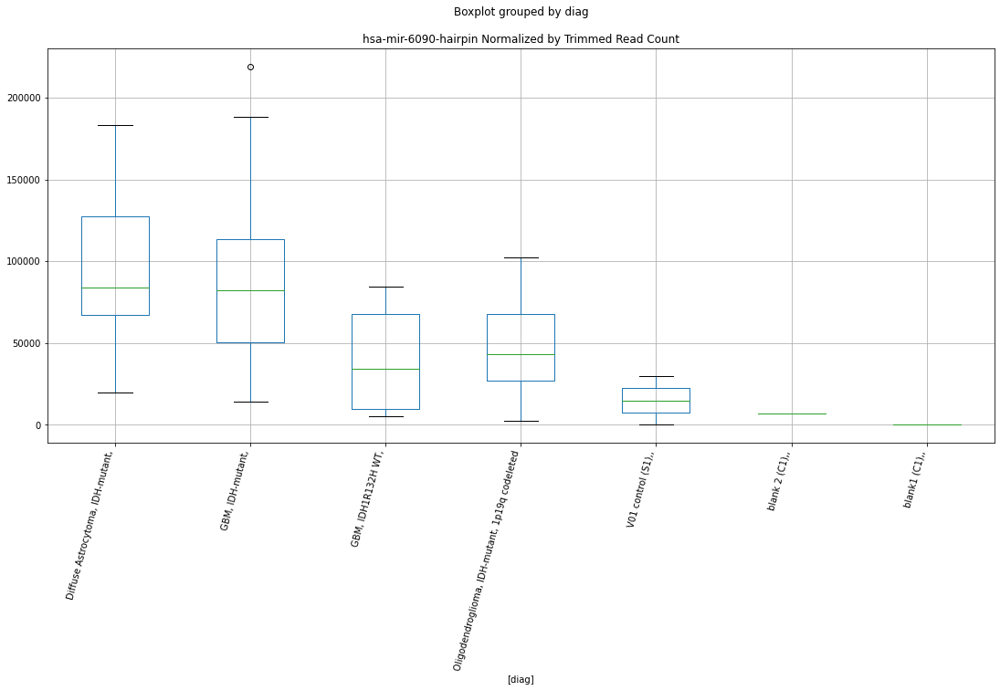

 p : 0.009020417229467897  ( t : 2.9261669942608126 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3680-2-hairpin
Control and blanks
82       0.000000
346    841.738088
Name: hsa-mir-3680-2-hairpin, dtype: float64
214    3525.943895
Name: hsa-mir-3680-2-hairpin, dtype: float64
478    0.0
Name: hsa-mir-3680-2-hairpin, dtype: float64


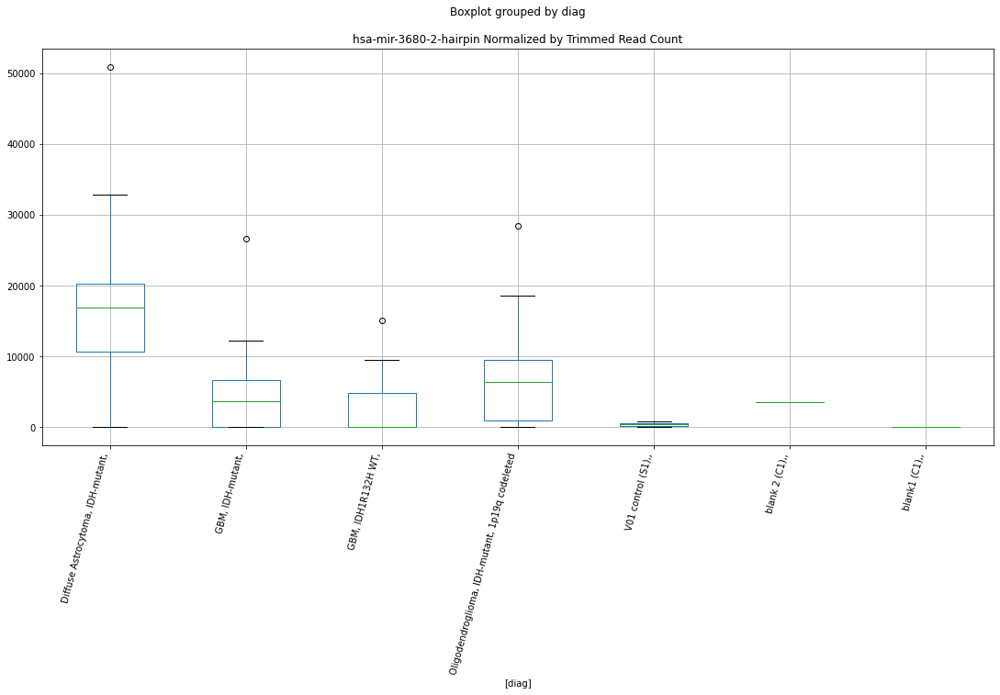

 p : 0.009020417229467897  ( t : 2.9261669942608126 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3680-1-hairpin
Control and blanks
82       0.000000
346    841.738088
Name: hsa-mir-3680-1-hairpin, dtype: float64
214    3525.943895
Name: hsa-mir-3680-1-hairpin, dtype: float64
478    0.0
Name: hsa-mir-3680-1-hairpin, dtype: float64


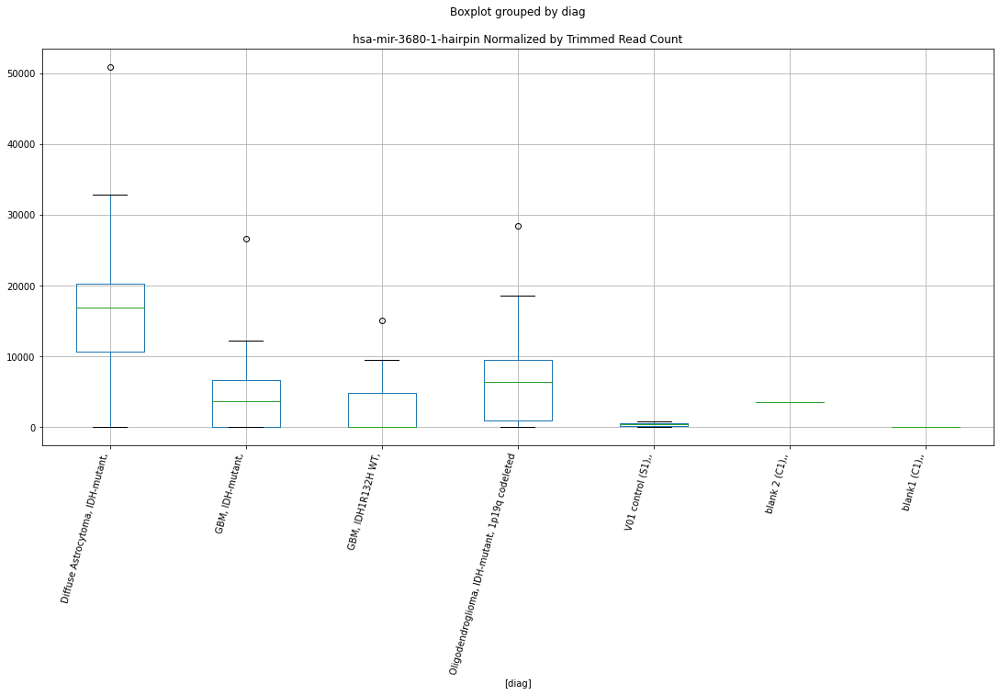

 p : 0.00903444773865779  ( t : 2.9254487128976283 ) :  D-plex  :  bbduk2  :  hsa-mir-3199-2-hairpin
Control and blanks
73     3092.033607
337    2670.471792
Name: hsa-mir-3199-2-hairpin, dtype: float64
205    11640.911895
Name: hsa-mir-3199-2-hairpin, dtype: float64
469    17154.292211
Name: hsa-mir-3199-2-hairpin, dtype: float64


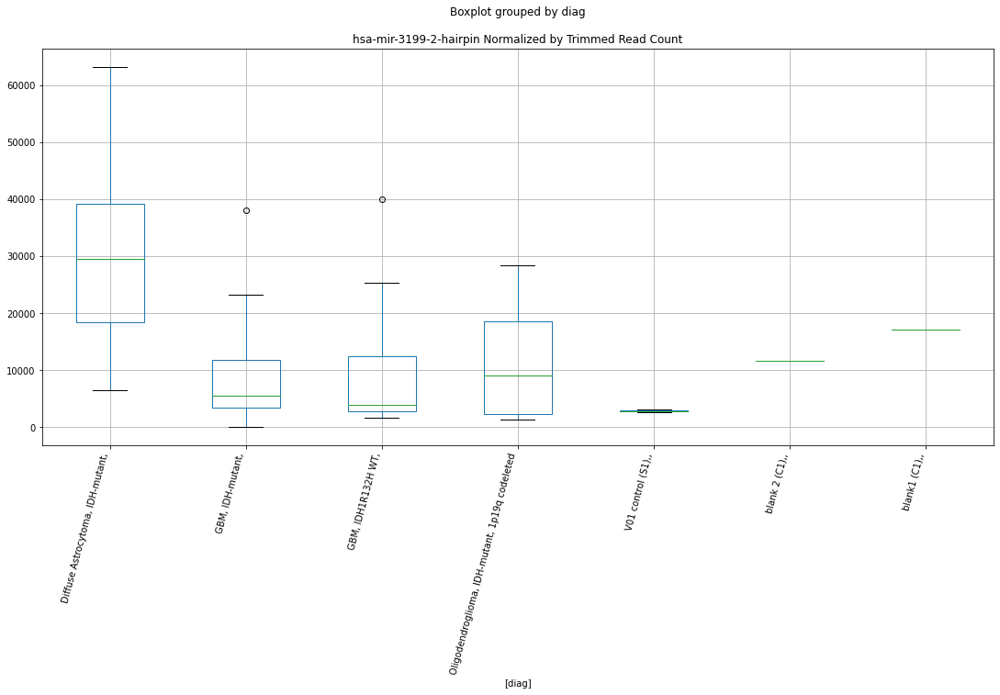

 p : 0.009039118646821115  ( t : 2.925209828644157 ) :  D-plex  :  bbduk2  :  hsa-mir-8081-hairpin
Control and blanks
73      98172.067032
337    161118.464799
Name: hsa-mir-8081-hairpin, dtype: float64
205    45847.283772
Name: hsa-mir-8081-hairpin, dtype: float64
469    285116.167092
Name: hsa-mir-8081-hairpin, dtype: float64


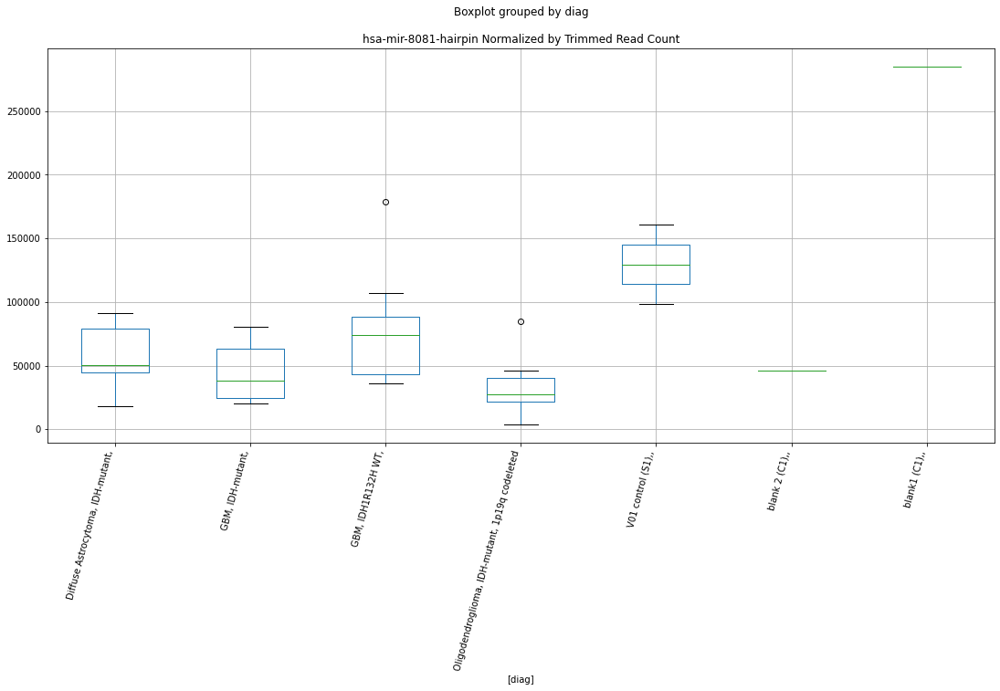

 p : 0.009070496198668674  ( t : 2.9236081747968967 ) :  Lexogen  :  cutadapt2  :  hsa-mir-937-5p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-937-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-937-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-937-5p-mature, dtype: float64


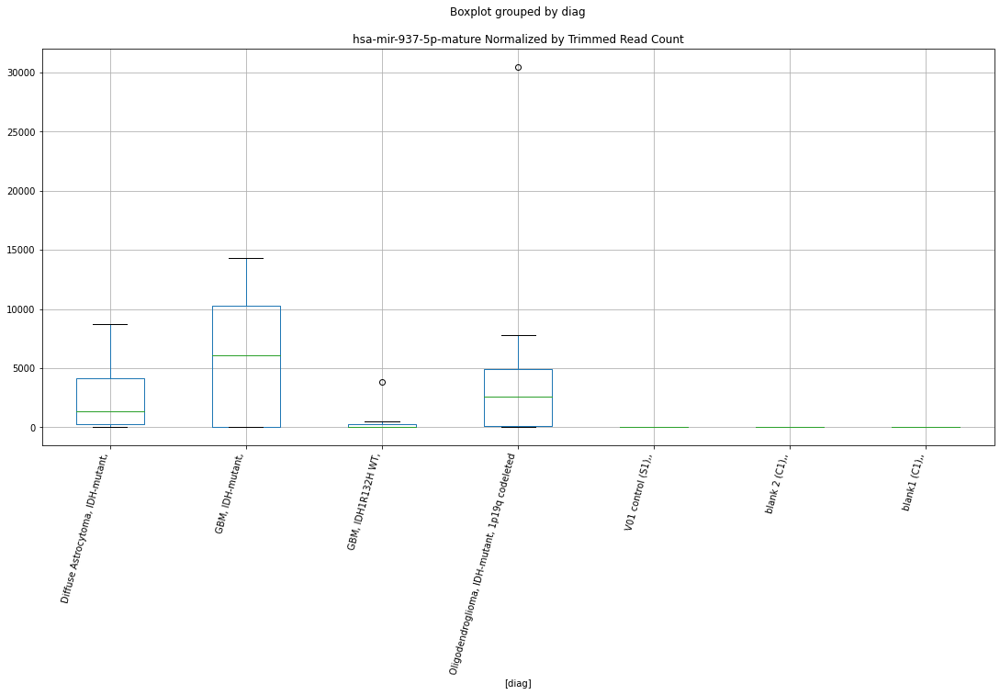

 p : 0.009134903011972312  ( t : 2.9203372767135707 ) :  Lexogen  :  bbduk2  :  hsa-mir-134-hairpin
Control and blanks
79       0.00000
343    424.62863
Name: hsa-mir-134-hairpin, dtype: float64
211    1093.225337
Name: hsa-mir-134-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-134-hairpin, dtype: float64


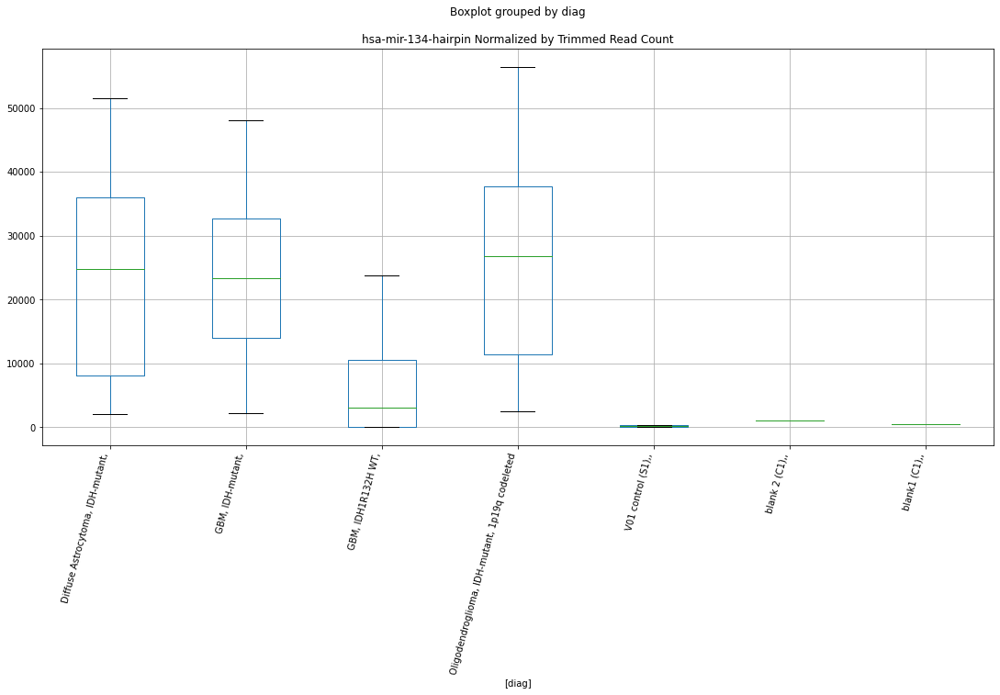

 p : 0.009235919241483684  ( t : 2.9152518180719706 ) :  Lexogen  :  cutadapt2  :  hsa-mir-532-5p-mature
Control and blanks
82         0.000000
346    31144.309261
Name: hsa-mir-532-5p-mature, dtype: float64
214    5695.755523
Name: hsa-mir-532-5p-mature, dtype: float64
478    8073.656443
Name: hsa-mir-532-5p-mature, dtype: float64


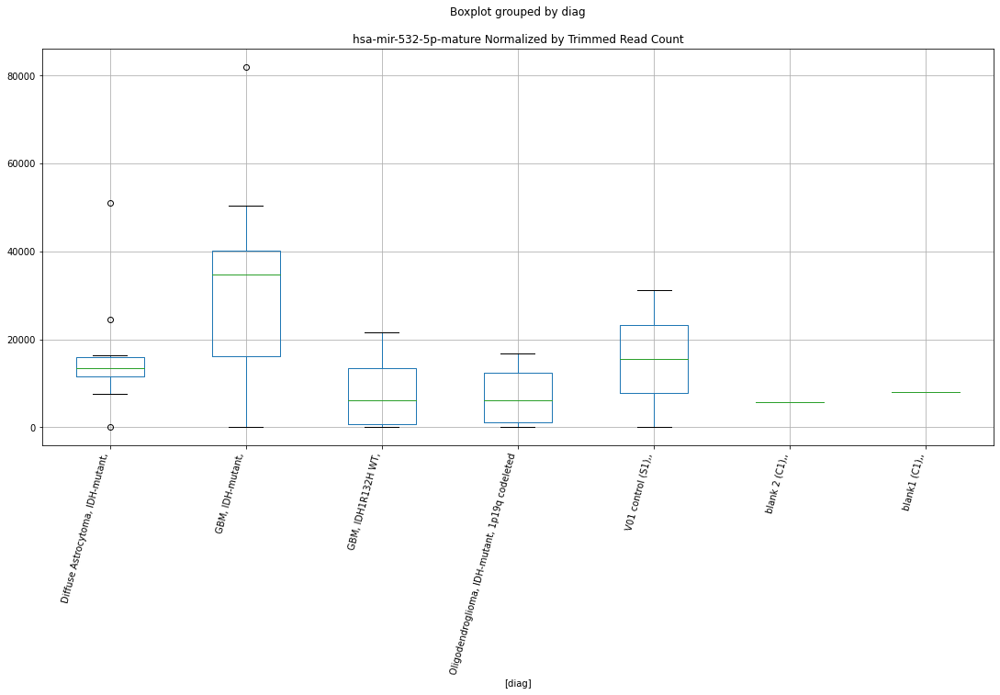

 p : 0.009290405274682076  ( t : 2.912531109234865 ) :  D-plex  :  bbduk2  :  hsa-mir-6733-3p-mature
Control and blanks
73     15460.168037
337     9791.729905
Name: hsa-mir-6733-3p-mature, dtype: float64
205    10387.27523
Name: hsa-mir-6733-3p-mature, dtype: float64
469    39040.802963
Name: hsa-mir-6733-3p-mature, dtype: float64


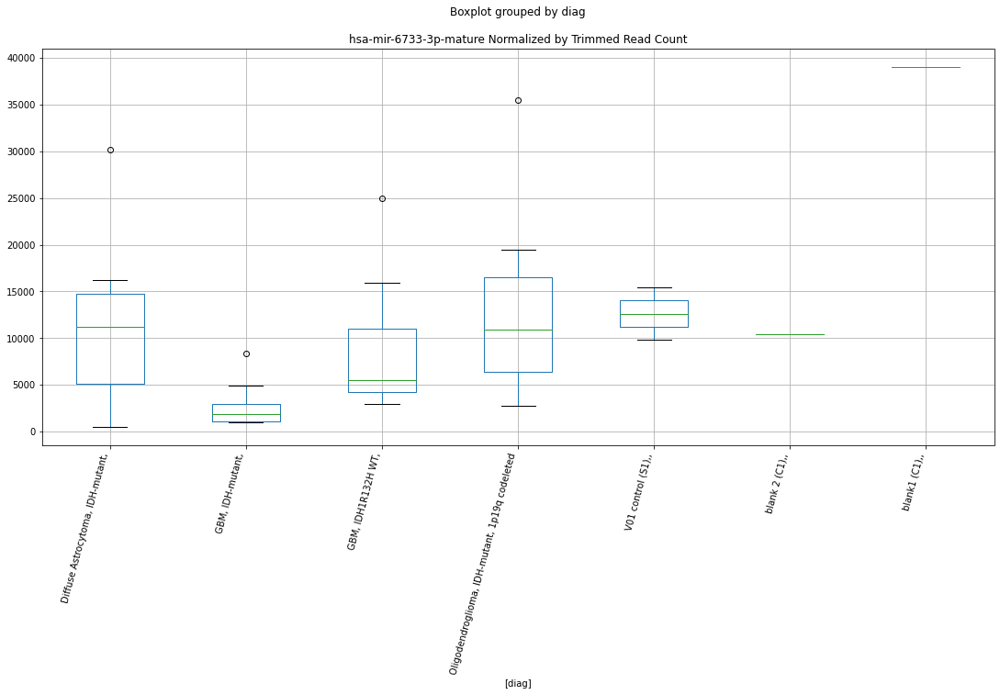

 p : 0.009293135678575634  ( t : 2.912395175257819 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6883-hairpin
Control and blanks
82         0.00000
346    36194.73779
Name: hsa-mir-6883-hairpin, dtype: float64
214    7594.340697
Name: hsa-mir-6883-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-6883-hairpin, dtype: float64


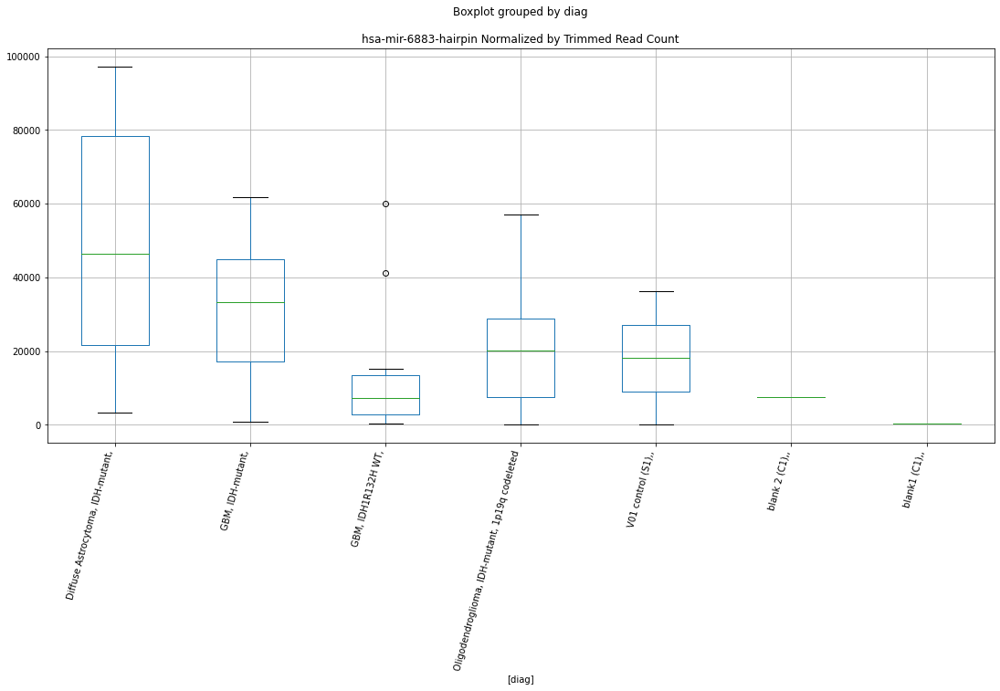

 p : 0.009297528205475388  ( t : 2.912176572976643 ) :  D-plex  :  bbduk2  :  hsa-mir-3688-3p-mature
Control and blanks
73     0.0
337    0.0
Name: hsa-mir-3688-3p-mature, dtype: float64
205    179.090952
Name: hsa-mir-3688-3p-mature, dtype: float64
469    0.0
Name: hsa-mir-3688-3p-mature, dtype: float64


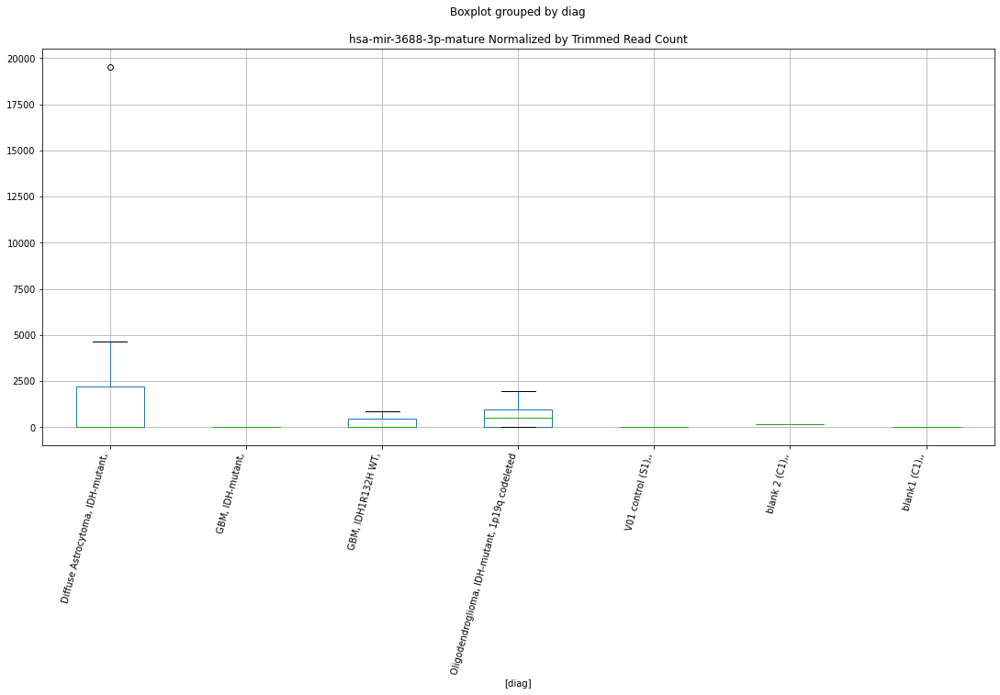

 p : 0.009297528205475388  ( t : 2.912176572976643 ) :  D-plex  :  bbduk2  :  hsa-mir-3688-5p-mature
Control and blanks
73     0.0
337    0.0
Name: hsa-mir-3688-5p-mature, dtype: float64
205    179.090952
Name: hsa-mir-3688-5p-mature, dtype: float64
469    0.0
Name: hsa-mir-3688-5p-mature, dtype: float64


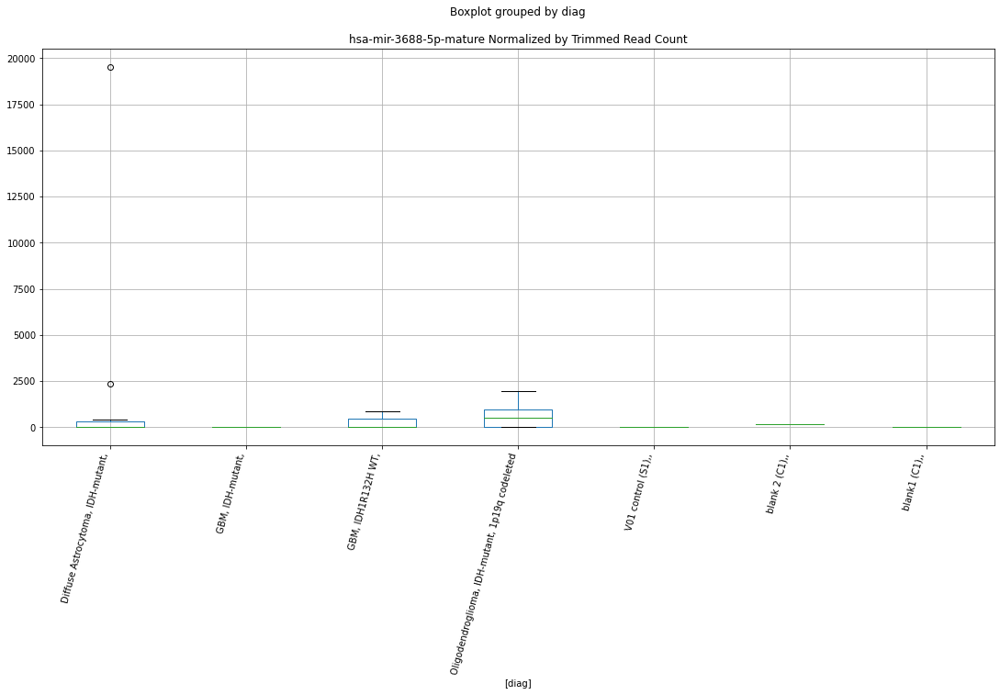

 p : 0.009307785703711234  ( t : 2.911666477974863 ) :  D-plex  :  cutadapt2  :  hsa-mir-3151-hairpin
Control and blanks
76      50002.538008
340    105687.856201
Name: hsa-mir-3151-hairpin, dtype: float64
208    74247.65172
Name: hsa-mir-3151-hairpin, dtype: float64
472    63575.142351
Name: hsa-mir-3151-hairpin, dtype: float64


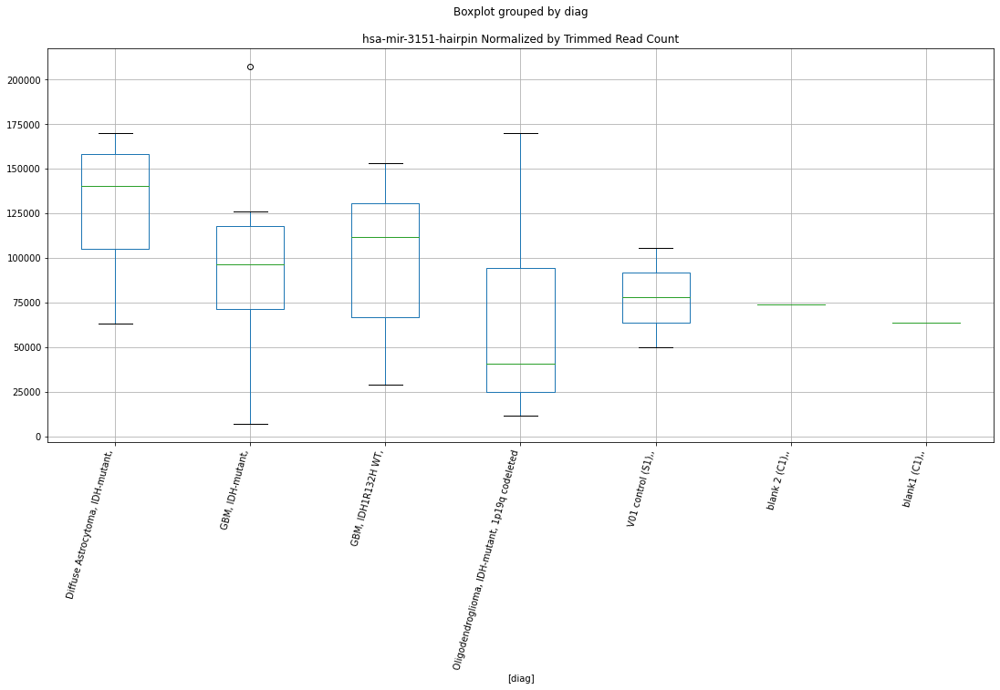

 p : 0.00931614101749143  ( t : 2.9112513780766336 ) :  D-plex  :  cutadapt2  :  hsa-mir-92a-2-5p-mature
Control and blanks
76     41668.781673
340    17614.642700
Name: hsa-mir-92a-2-5p-mature, dtype: float64
208    41621.011415
Name: hsa-mir-92a-2-5p-mature, dtype: float64
472    9825.249272
Name: hsa-mir-92a-2-5p-mature, dtype: float64


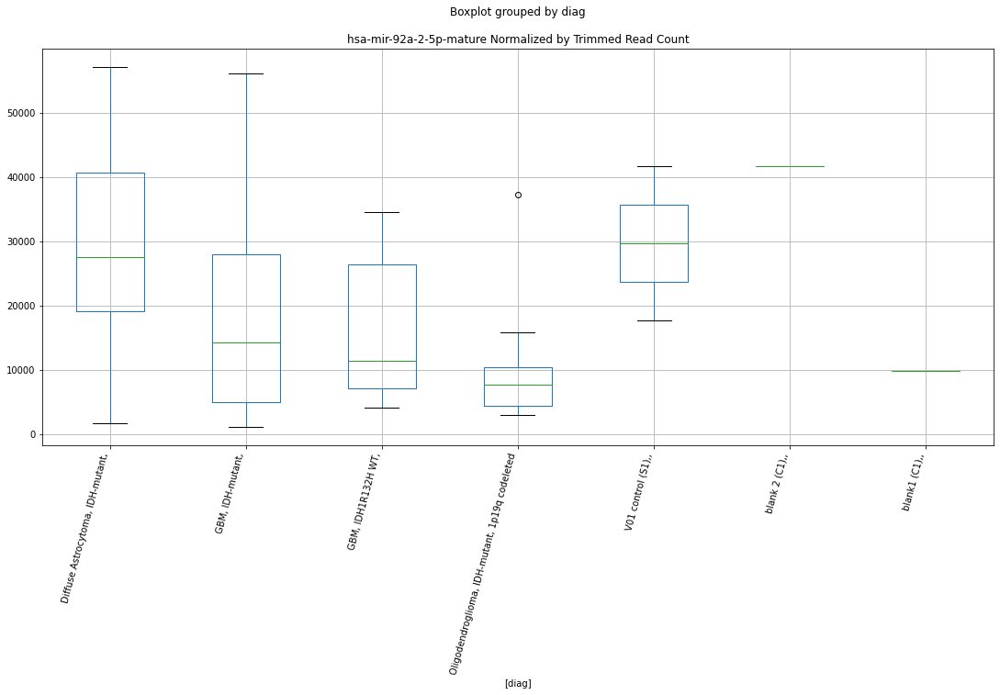

 p : 0.009351868128563548  ( t : 2.9094804707033135 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4687-5p-mature
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-4687-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-4687-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-4687-5p-mature, dtype: float64


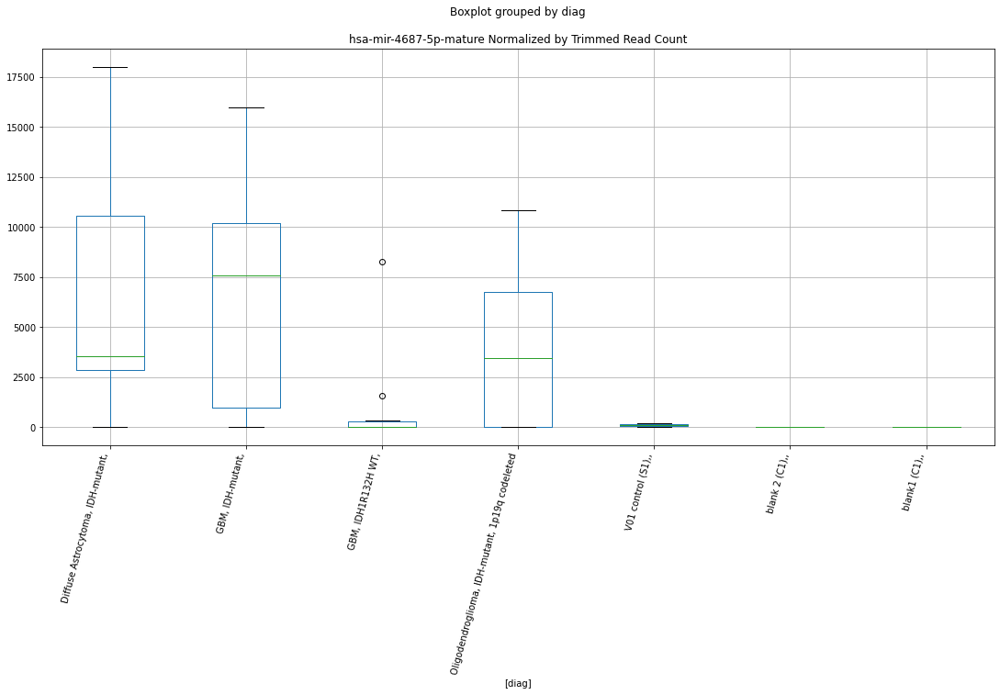

 p : 0.009354979696830345  ( t : 2.9093265473876397 ) :  D-plex  :  cutadapt2  :  hsa-mir-6833-5p-mature
Control and blanks
76     77276.649648
340      880.732135
Name: hsa-mir-6833-5p-mature, dtype: float64
208    39681.049019
Name: hsa-mir-6833-5p-mature, dtype: float64
472    40456.908769
Name: hsa-mir-6833-5p-mature, dtype: float64


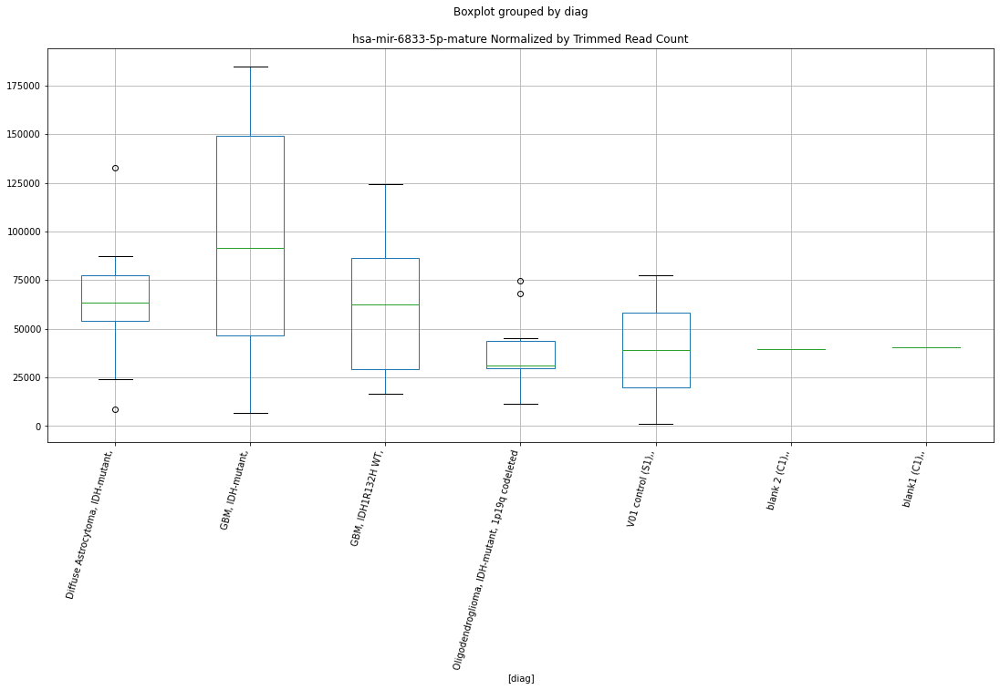

 p : 0.009392401816546343  ( t : 2.907479212847203 ) :  Lexogen  :  cutadapt2  :  hsa-mir-219b-3p-mature
Control and blanks
82         0.000000
346    13678.243932
Name: hsa-mir-219b-3p-mature, dtype: float64
214    0.0
Name: hsa-mir-219b-3p-mature, dtype: float64
478    4511.749189
Name: hsa-mir-219b-3p-mature, dtype: float64


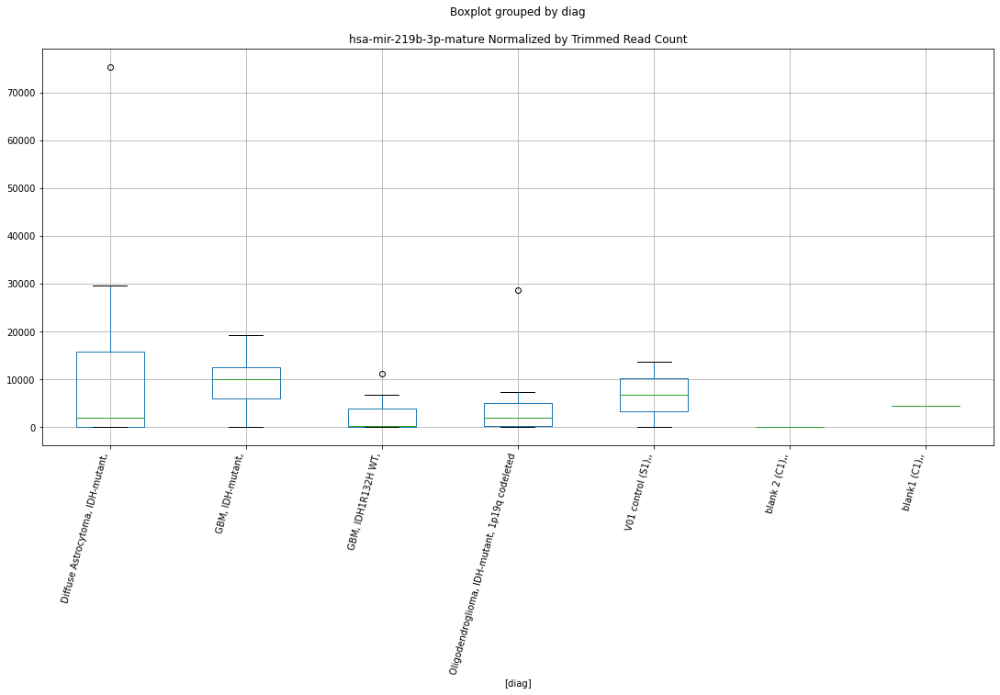

 p : 0.009393560306698693  ( t : 2.9074221378185876 ) :  Lexogen  :  bbduk2  :  hsa-mir-6883-hairpin
Control and blanks
79         0.000000
343    36730.376531
Name: hsa-mir-6883-hairpin, dtype: float64
211    7652.577361
Name: hsa-mir-6883-hairpin, dtype: float64
475    0.0
Name: hsa-mir-6883-hairpin, dtype: float64


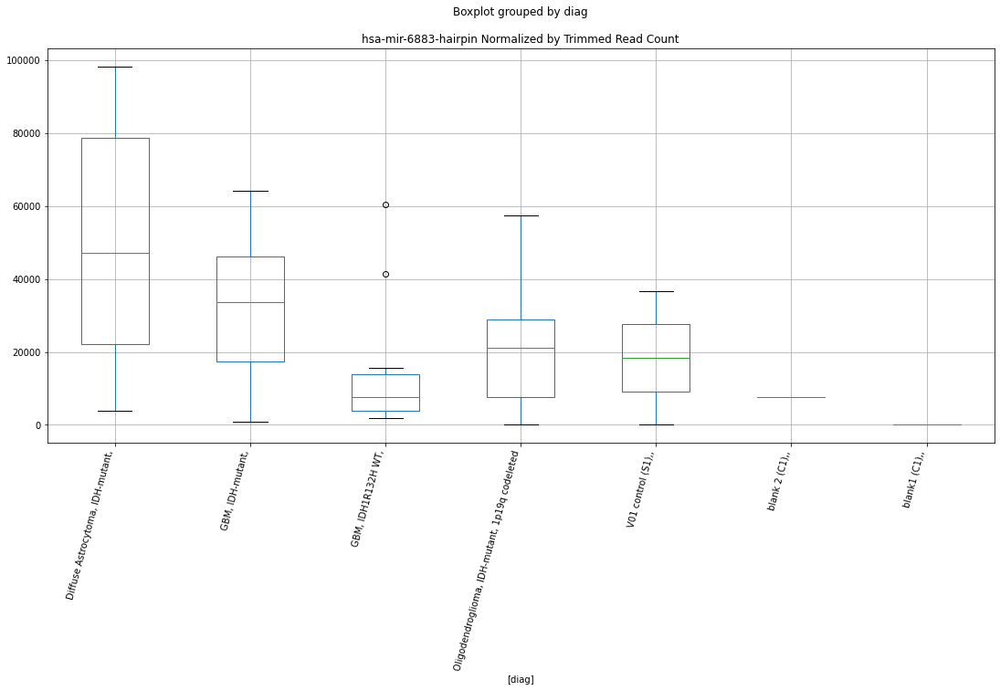

 p : 0.009409905756496466  ( t : 2.9066175750896264 ) :  D-plex  :  cutadapt2  :  hsa-mir-8085-hairpin
Control and blanks
76     19697.969518
340    23779.767645
Name: hsa-mir-8085-hairpin, dtype: float64
208    14814.2583
Name: hsa-mir-8085-hairpin, dtype: float64
472    27741.880298
Name: hsa-mir-8085-hairpin, dtype: float64


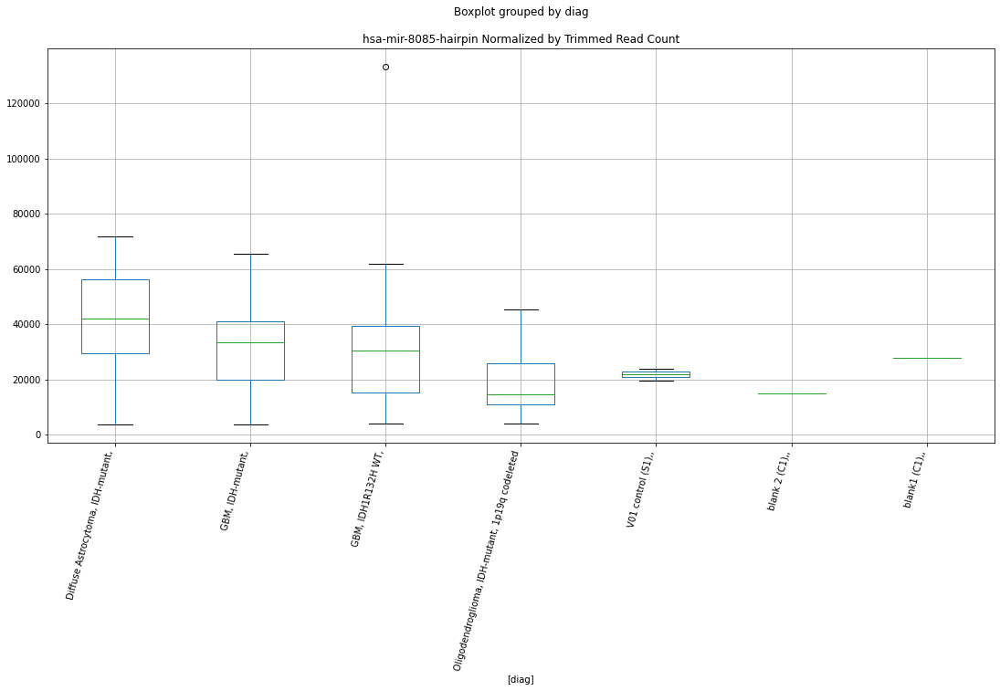

 p : 0.009427548856624614  ( t : 2.905750653037747 ) :  Lexogen  :  bbduk2  :  hsa-mir-4725-3p-mature
Control and blanks
79        0.00000
343    5307.85788
Name: hsa-mir-4725-3p-mature, dtype: float64
211    0.0
Name: hsa-mir-4725-3p-mature, dtype: float64
475    239.515738
Name: hsa-mir-4725-3p-mature, dtype: float64


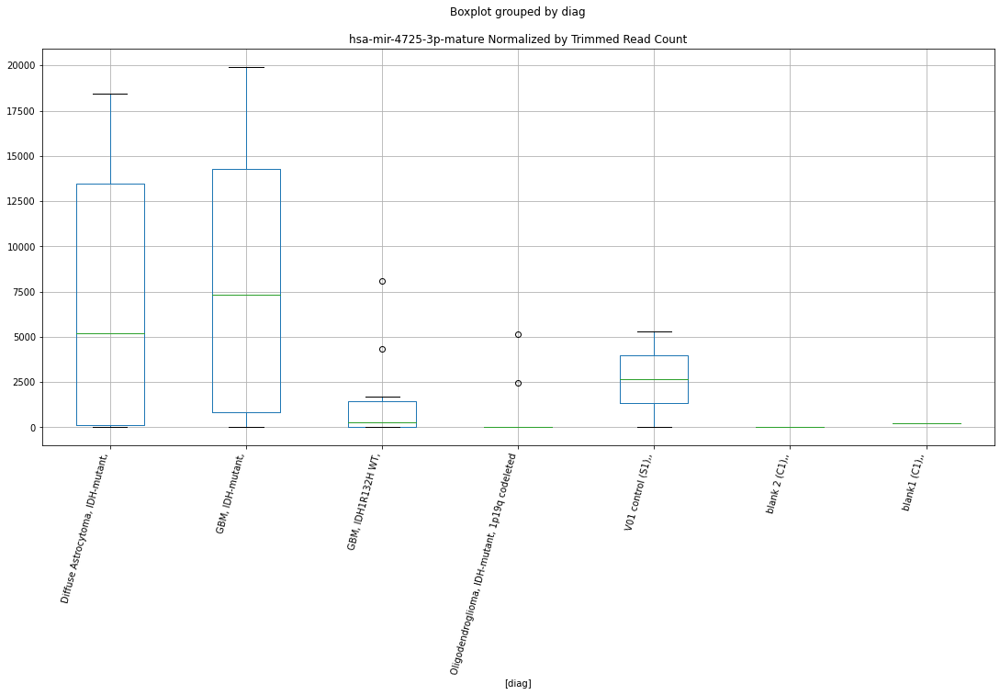

 p : 0.00947710772620121  ( t : 2.9033238586899324 ) :  Lexogen  :  cutadapt2  :  hsa-mir-10b-hairpin
Control and blanks
82       1420.051122
346    135730.266713
Name: hsa-mir-10b-hairpin, dtype: float64
214    8679.246511
Name: hsa-mir-10b-hairpin, dtype: float64
478    237.460484
Name: hsa-mir-10b-hairpin, dtype: float64


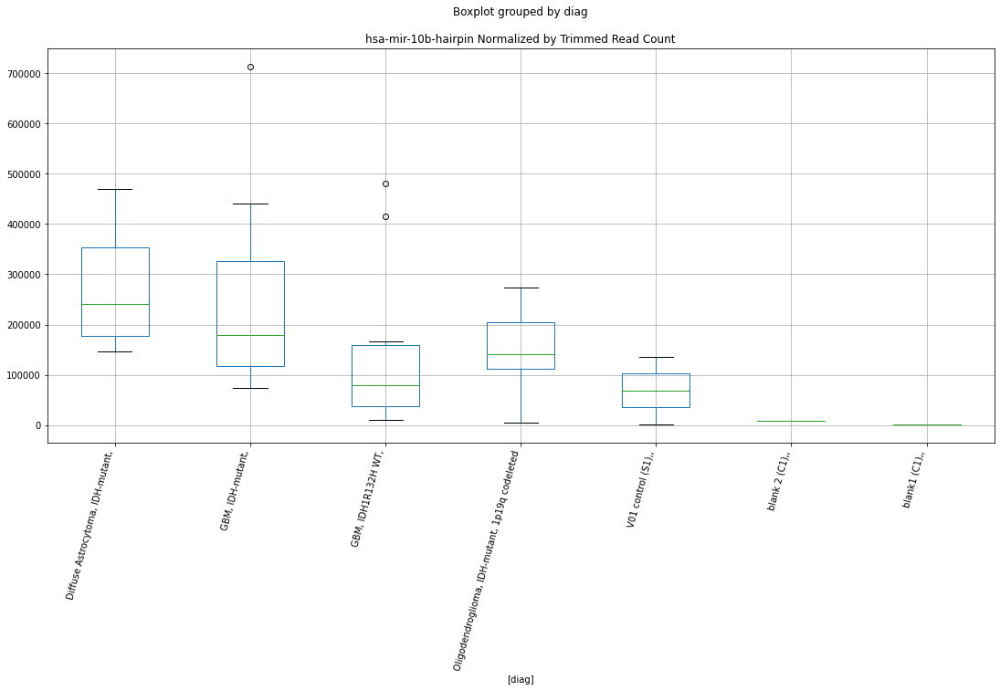

 p : 0.00952282141630274  ( t : 2.9010962013642216 ) :  D-plex  :  bbduk2  :  hsa-mir-3907-hairpin
Control and blanks
73     268233.915434
337     63201.165750
Name: hsa-mir-3907-hairpin, dtype: float64
205    218132.779823
Name: hsa-mir-3907-hairpin, dtype: float64
469    150839.465993
Name: hsa-mir-3907-hairpin, dtype: float64


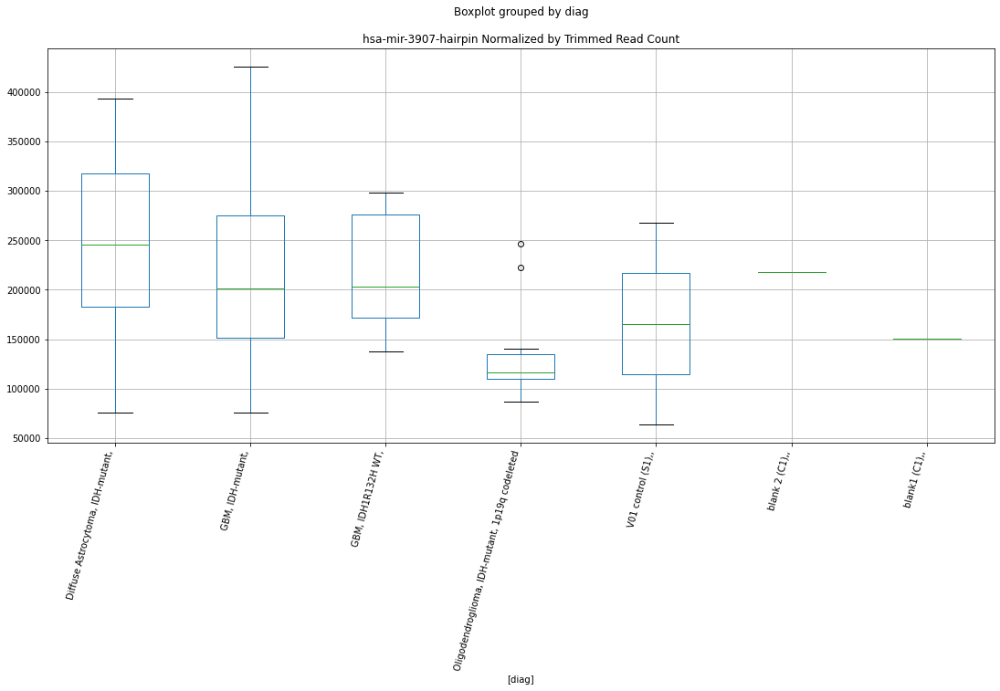

 p : 0.009523468783380031  ( t : 2.9010647289982248 ) :  D-plex  :  bbduk2  :  hsa-mir-548f-3-hairpin
Control and blanks
73     10049.109224
337    69432.266599
Name: hsa-mir-548f-3-hairpin, dtype: float64
205    94918.204685
Name: hsa-mir-548f-3-hairpin, dtype: float64
469    62110.36835
Name: hsa-mir-548f-3-hairpin, dtype: float64


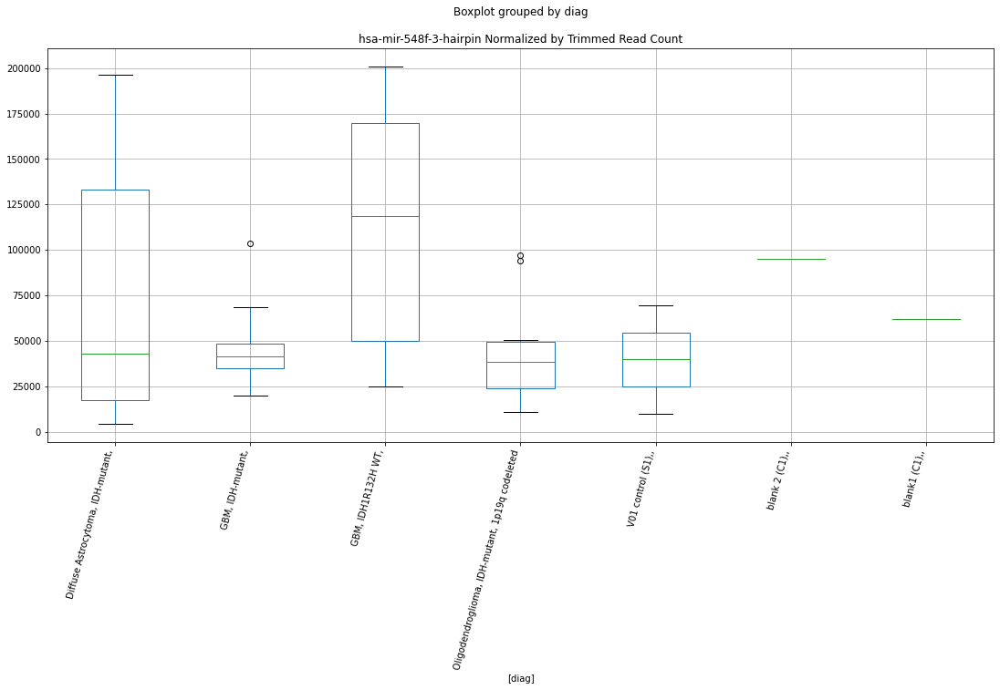

 p : 0.009570209821691102  ( t : 2.8987978129907064 ) :  Lexogen  :  cutadapt2  :  hsa-mir-25-hairpin
Control and blanks
82     80942.913945
346    68812.088706
Name: hsa-mir-25-hairpin, dtype: float64
214    35530.665405
Name: hsa-mir-25-hairpin, dtype: float64
478    32057.165287
Name: hsa-mir-25-hairpin, dtype: float64


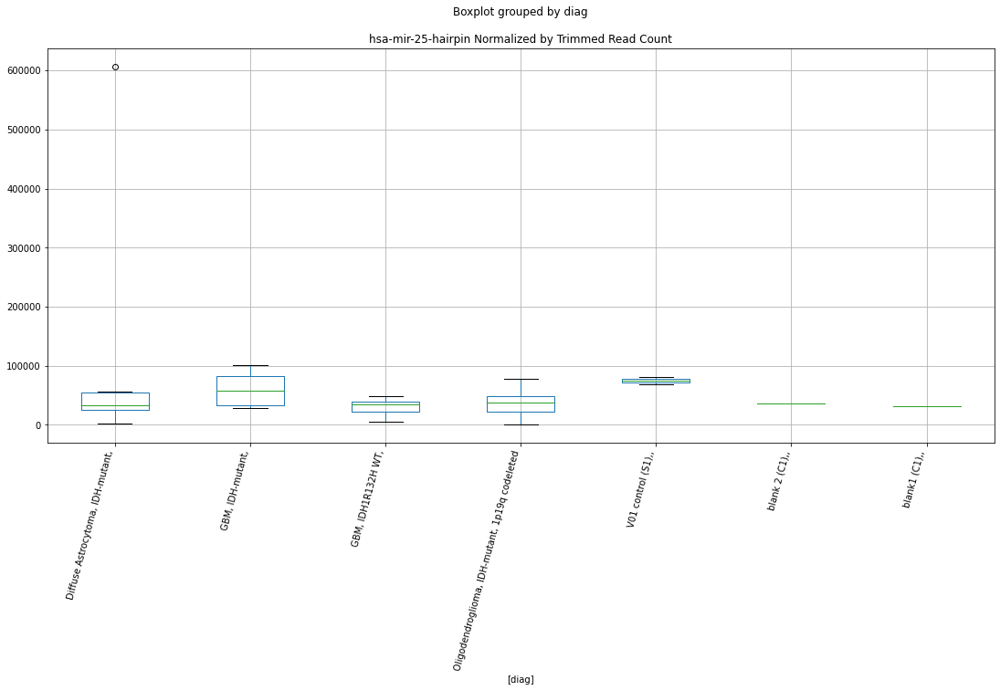

 p : 0.00957362762650072  ( t : 2.898632471103838 ) :  Lexogen  :  bbduk2  :  hsa-mir-10b-hairpin
Control and blanks
79       1430.598791
343    137579.676255
Name: hsa-mir-10b-hairpin, dtype: float64
211    9565.721701
Name: hsa-mir-10b-hairpin, dtype: float64
475    479.031475
Name: hsa-mir-10b-hairpin, dtype: float64


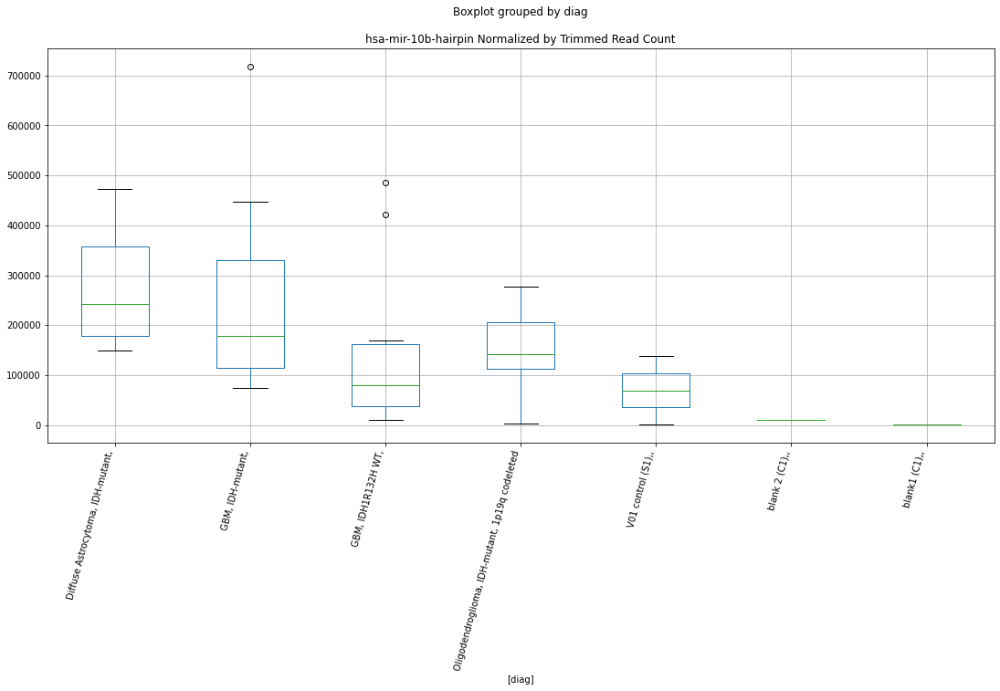

 p : 0.009595834543149271  ( t : 2.8975595619618995 ) :  Lexogen  :  bbduk2  :  hsa-mir-6127-mature
Control and blanks
79     0.0
343    0.0
Name: hsa-mir-6127-mature, dtype: float64
211    0.0
Name: hsa-mir-6127-mature, dtype: float64
475    0.0
Name: hsa-mir-6127-mature, dtype: float64


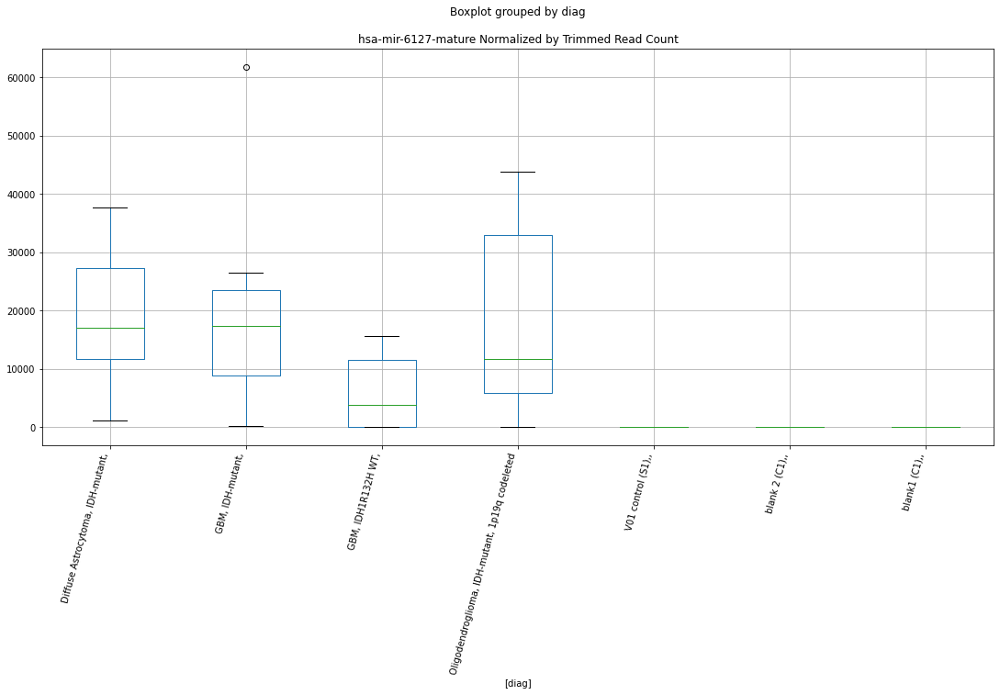

 p : 0.009605343903763858  ( t : 2.8971008581117497 ) :  Lexogen  :  cutadapt2  :  hsa-mir-6858-5p-mature
Control and blanks
82         0.000000
346    16203.458197
Name: hsa-mir-6858-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-6858-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-6858-5p-mature, dtype: float64


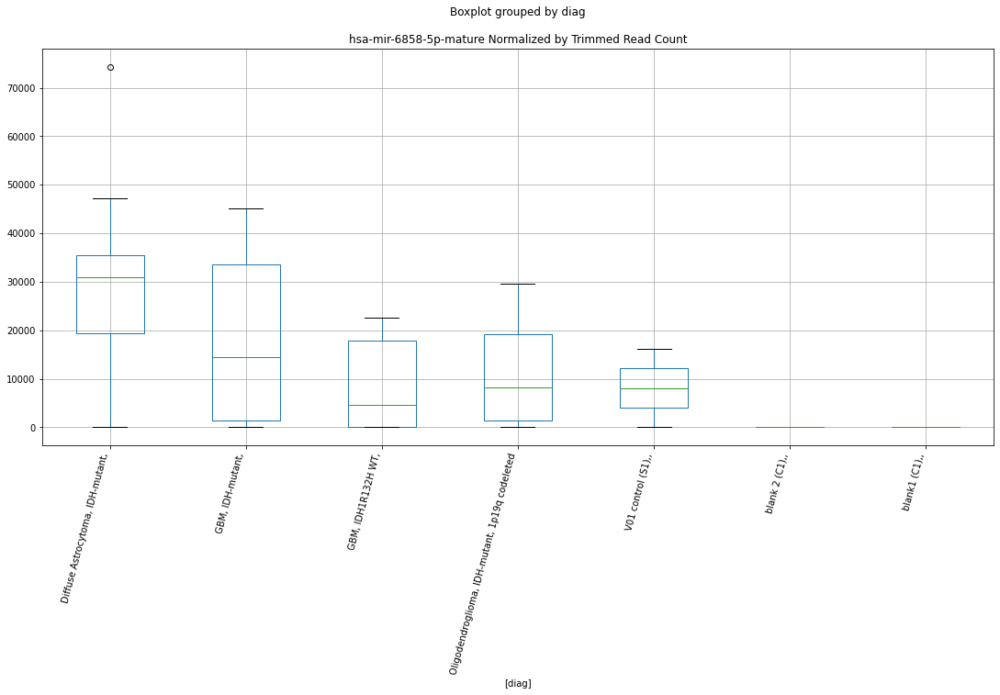

 p : 0.009660069348550132  ( t : 2.894469556828656 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1227-hairpin
Control and blanks
82      1420.051122
346    14940.851065
Name: hsa-mir-1227-hairpin, dtype: float64
214    1898.585174
Name: hsa-mir-1227-hairpin, dtype: float64
478    0.0
Name: hsa-mir-1227-hairpin, dtype: float64


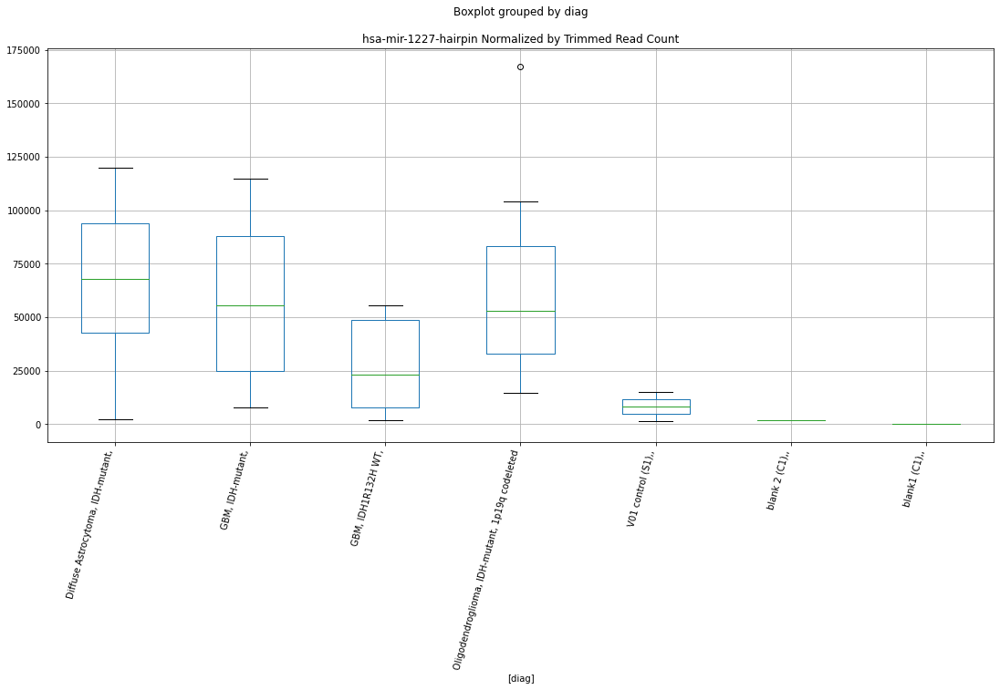

 p : 0.009663729941754623  ( t : 2.89429406275801 ) :  Lexogen  :  cutadapt2  :  hsa-mir-550a-2-hairpin
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-550a-2-hairpin, dtype: float64
214    5153.302616
Name: hsa-mir-550a-2-hairpin, dtype: float64
478    7361.274992
Name: hsa-mir-550a-2-hairpin, dtype: float64


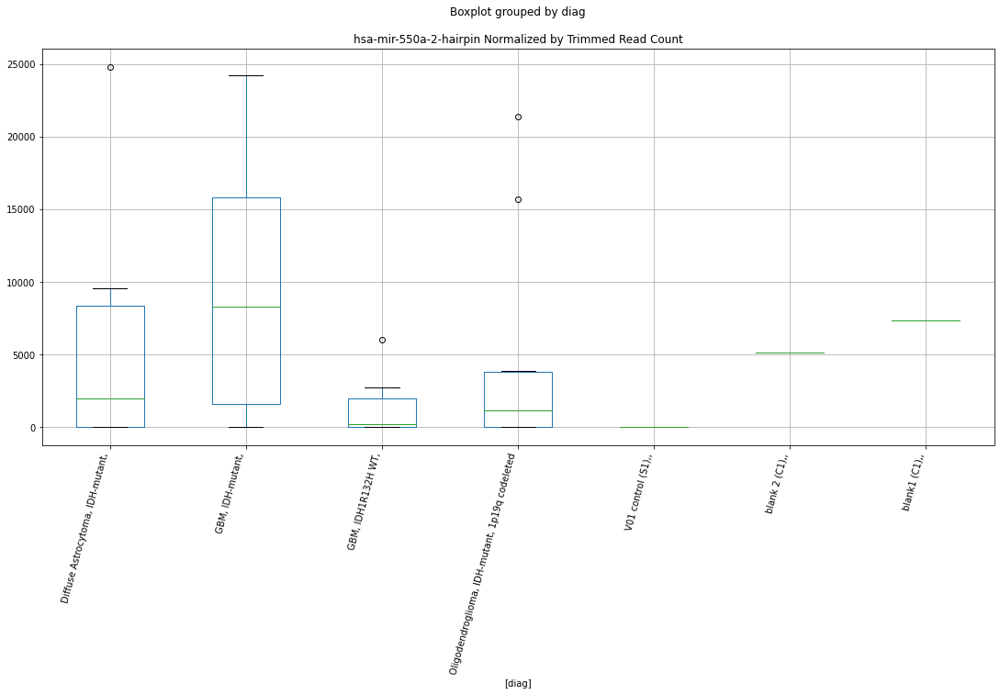

 p : 0.009663729941754623  ( t : 2.89429406275801 ) :  Lexogen  :  cutadapt2  :  hsa-mir-550b-2-hairpin
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-550b-2-hairpin, dtype: float64
214    5153.302616
Name: hsa-mir-550b-2-hairpin, dtype: float64
478    7361.274992
Name: hsa-mir-550b-2-hairpin, dtype: float64


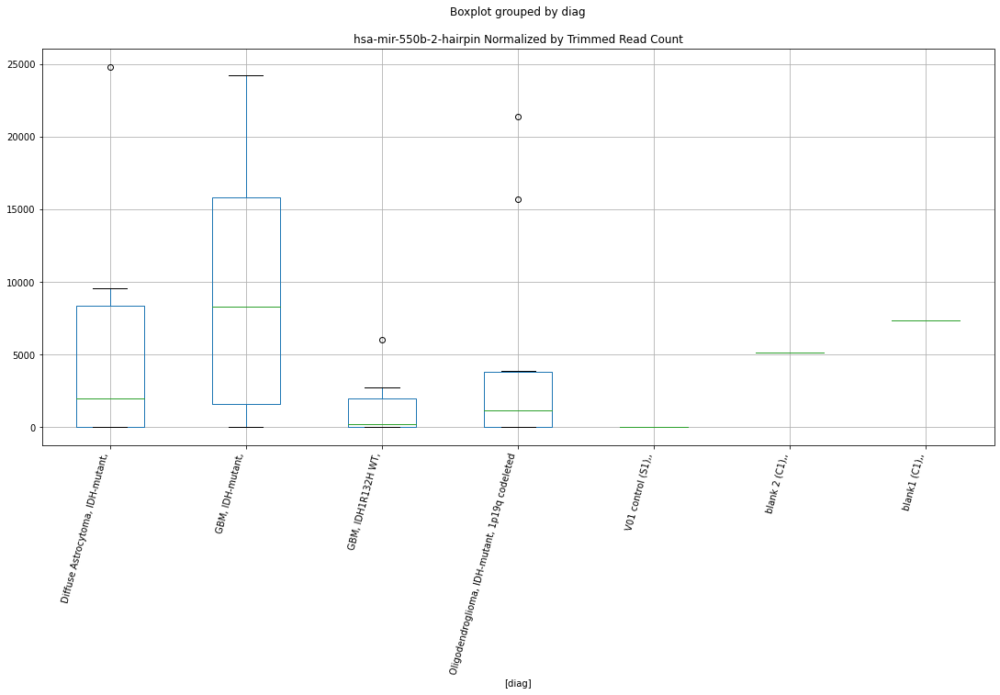

 p : 0.009666254496866622  ( t : 2.8941730693775494 ) :  D-plex  :  bbduk2  :  hsa-mir-1343-5p-mature
Control and blanks
73     5411.058813
337    1780.314528
Name: hsa-mir-1343-5p-mature, dtype: float64
205    18983.640937
Name: hsa-mir-1343-5p-mature, dtype: float64
469    10647.491717
Name: hsa-mir-1343-5p-mature, dtype: float64


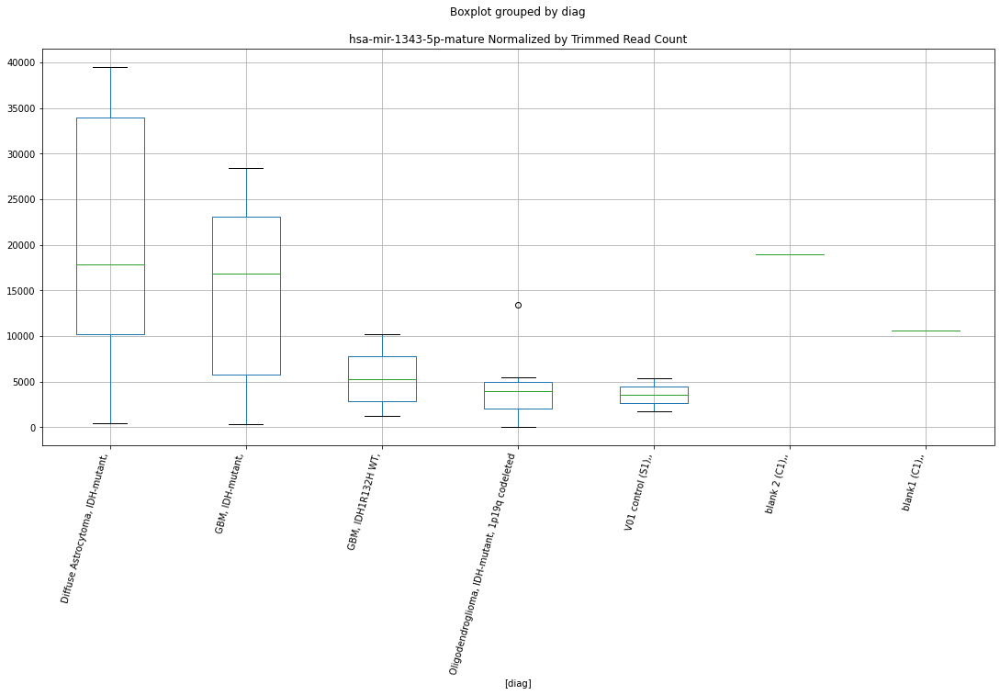

 p : 0.009668876072310529  ( t : 2.8940474584348386 ) :  Lexogen  :  bbduk2  :  hsa-mir-329-2-hairpin
Control and blanks
79        0.000000
343    1061.571576
Name: hsa-mir-329-2-hairpin, dtype: float64
211    7105.964692
Name: hsa-mir-329-2-hairpin, dtype: float64
475    5987.893438
Name: hsa-mir-329-2-hairpin, dtype: float64


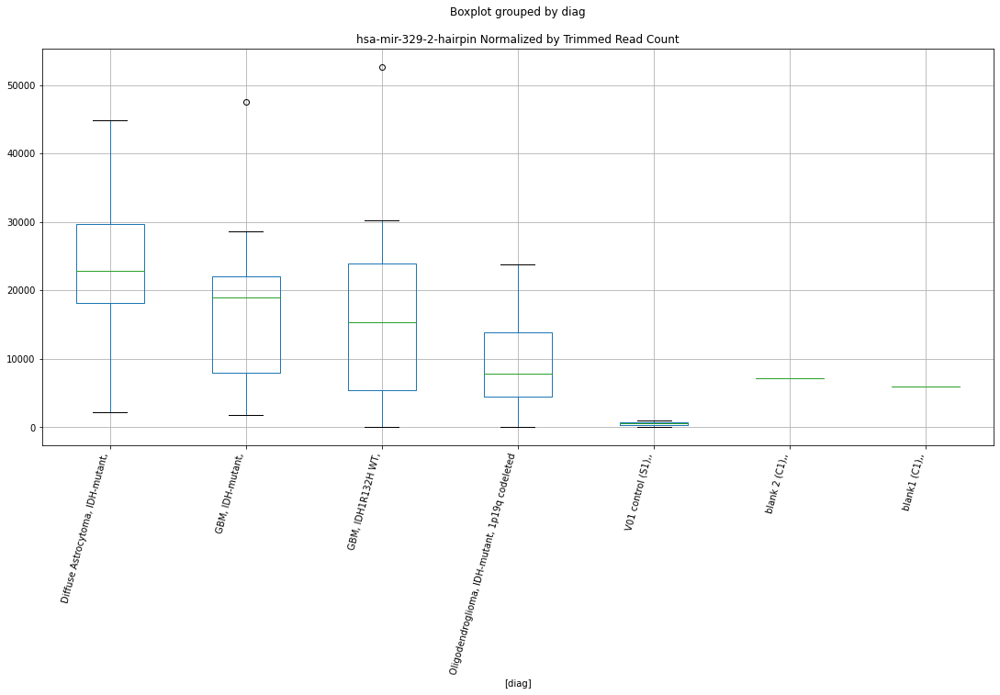

 p : 0.00972081377328758  ( t : 2.891565656673027 ) :  D-plex  :  cutadapt2  :  hsa-mir-3199-mature
Control and blanks
76     0.0
340    0.0
Name: hsa-mir-3199-mature, dtype: float64
208    2292.682832
Name: hsa-mir-3199-mature, dtype: float64
472    577.95584
Name: hsa-mir-3199-mature, dtype: float64


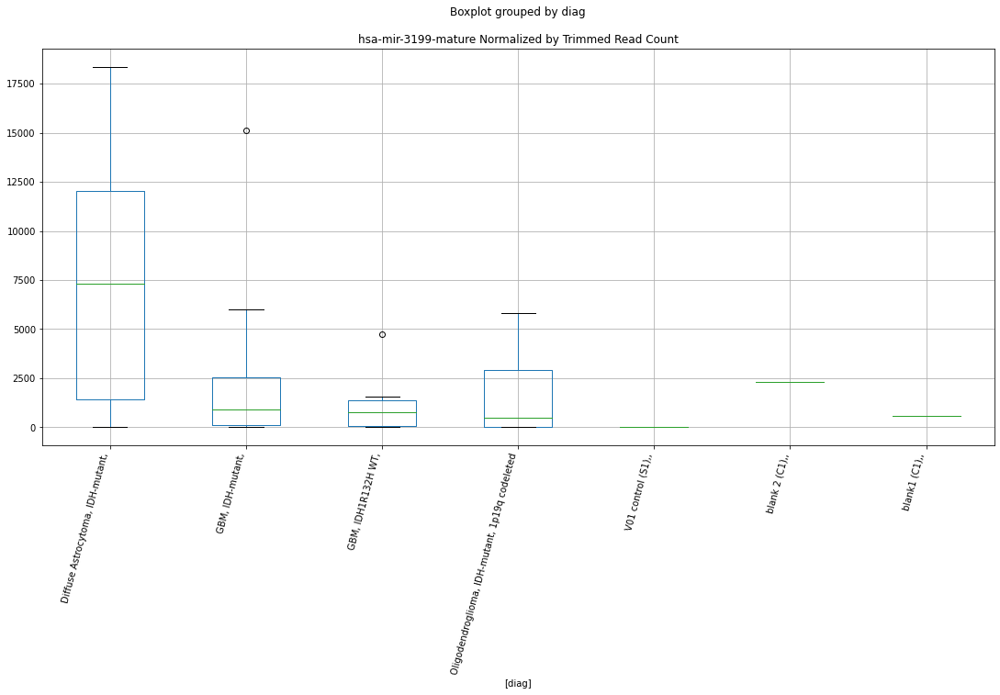

 p : 0.009736351182815229  ( t : 2.89082570173236 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4649-hairpin
Control and blanks
82      1420.051122
346    16624.327241
Name: hsa-mir-4649-hairpin, dtype: float64
214    2169.811628
Name: hsa-mir-4649-hairpin, dtype: float64
478    3799.367738
Name: hsa-mir-4649-hairpin, dtype: float64


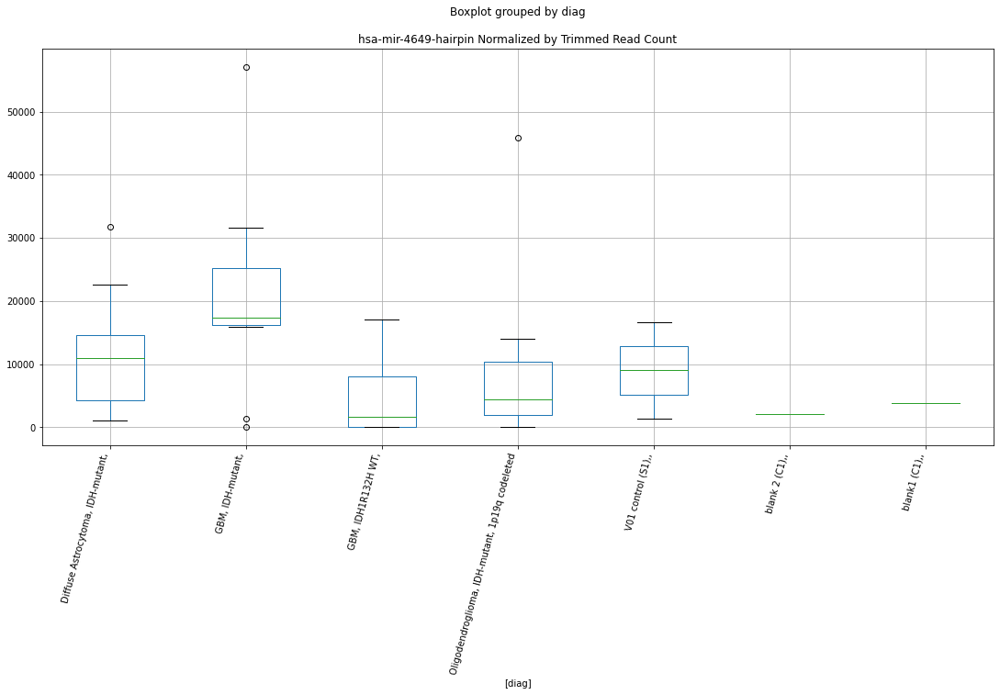

 p : 0.009758319364898715  ( t : 2.889781430404004 ) :  D-plex  :  bbduk2  :  hsa-mir-320e-hairpin
Control and blanks
73     101264.100640
337     31155.504243
Name: hsa-mir-320e-hairpin, dtype: float64
205    73606.381369
Name: hsa-mir-320e-hairpin, dtype: float64
469    30759.420516
Name: hsa-mir-320e-hairpin, dtype: float64


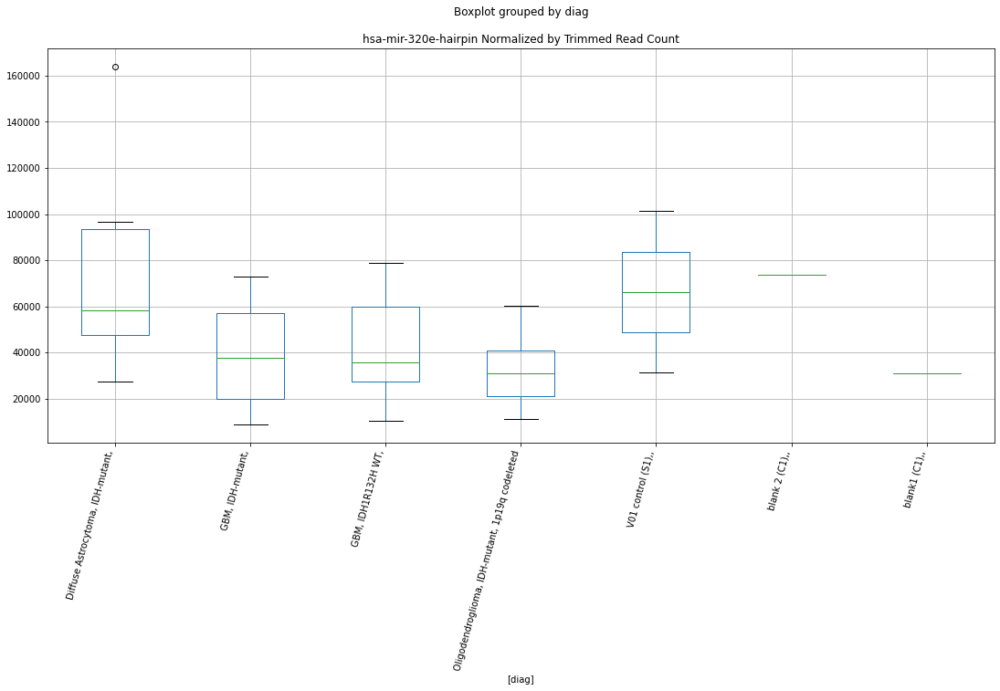

 p : 0.009762608475713063  ( t : 2.889577809695235 ) :  Lexogen  :  cutadapt2  :  hsa-mir-3187-5p-mature
Control and blanks
82     0.0
346    0.0
Name: hsa-mir-3187-5p-mature, dtype: float64
214    0.0
Name: hsa-mir-3187-5p-mature, dtype: float64
478    0.0
Name: hsa-mir-3187-5p-mature, dtype: float64


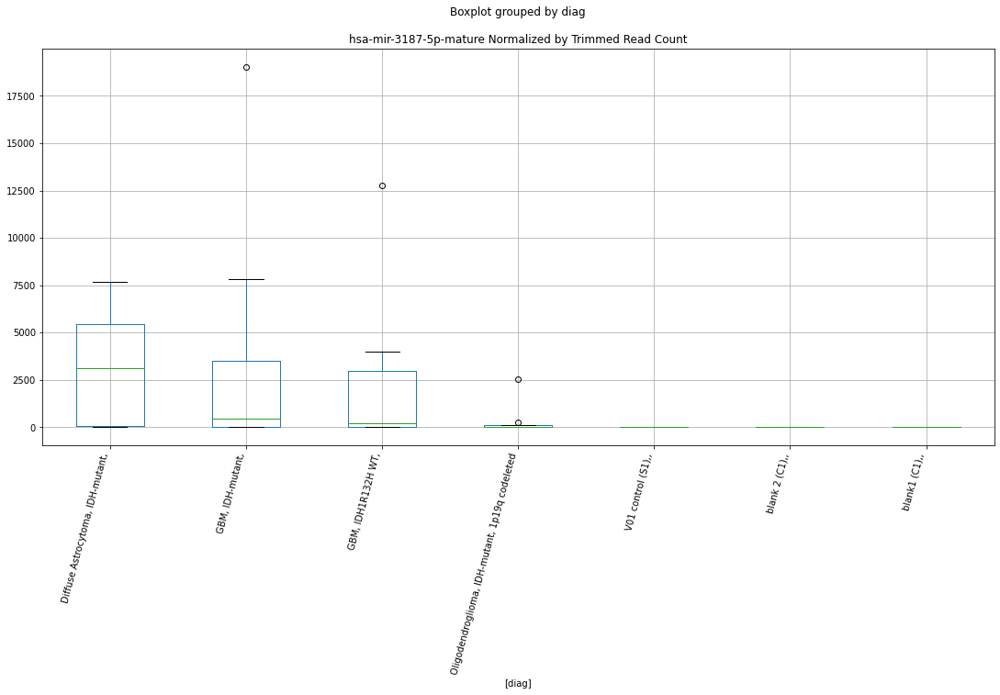

 p : 0.00980011887581323  ( t : 2.887800717242709 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4725-3p-mature
Control and blanks
82        0.000000
346    5260.863051
Name: hsa-mir-4725-3p-mature, dtype: float64
214    0.0
Name: hsa-mir-4725-3p-mature, dtype: float64
478    237.460484
Name: hsa-mir-4725-3p-mature, dtype: float64


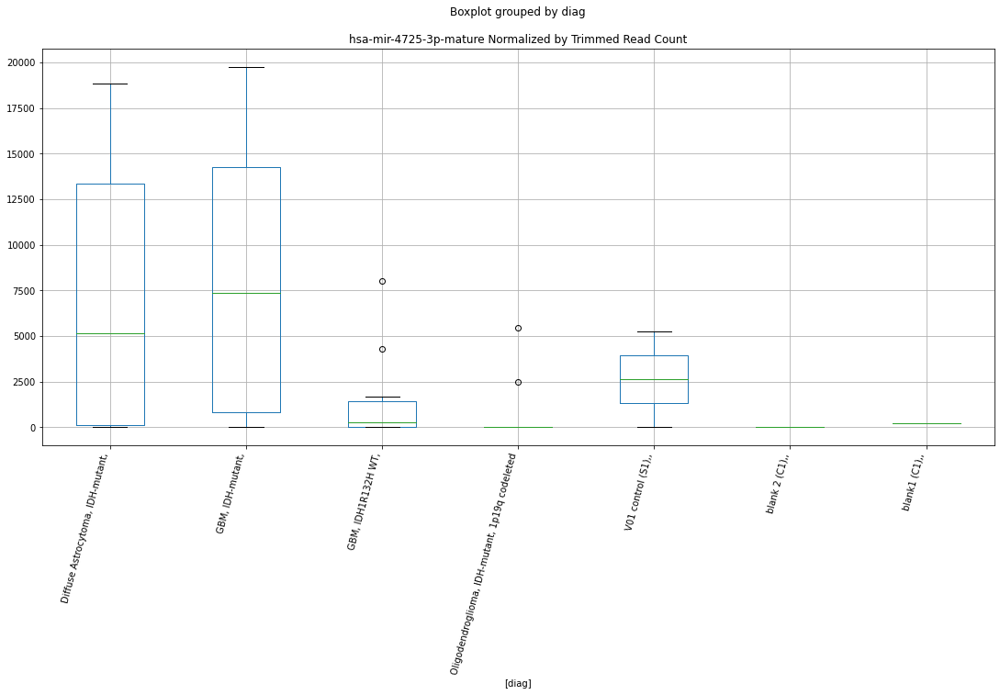

 p : 0.009802208719304846  ( t : 2.8877019020506087 ) :  Lexogen  :  bbduk2  :  hsa-mir-550b-2-hairpin
Control and blanks
79       0.00000
343    424.62863
Name: hsa-mir-550b-2-hairpin, dtype: float64
211    5192.820352
Name: hsa-mir-550b-2-hairpin, dtype: float64
475    7424.987863
Name: hsa-mir-550b-2-hairpin, dtype: float64


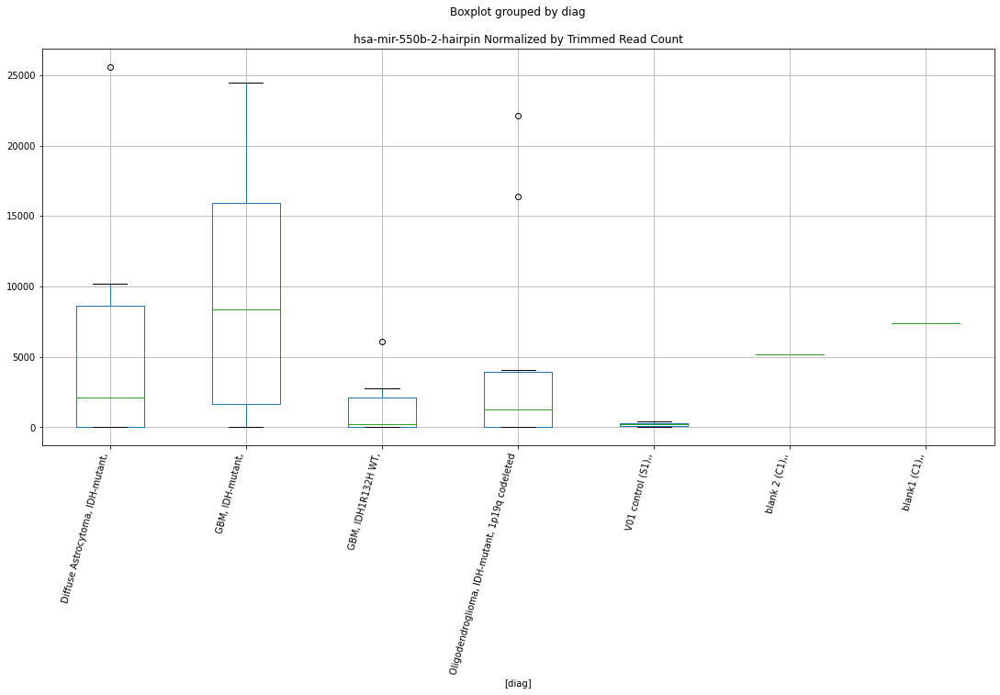

 p : 0.009802208719304846  ( t : 2.8877019020506087 ) :  Lexogen  :  bbduk2  :  hsa-mir-550a-2-hairpin
Control and blanks
79       0.00000
343    424.62863
Name: hsa-mir-550a-2-hairpin, dtype: float64
211    5192.820352
Name: hsa-mir-550a-2-hairpin, dtype: float64
475    7424.987863
Name: hsa-mir-550a-2-hairpin, dtype: float64


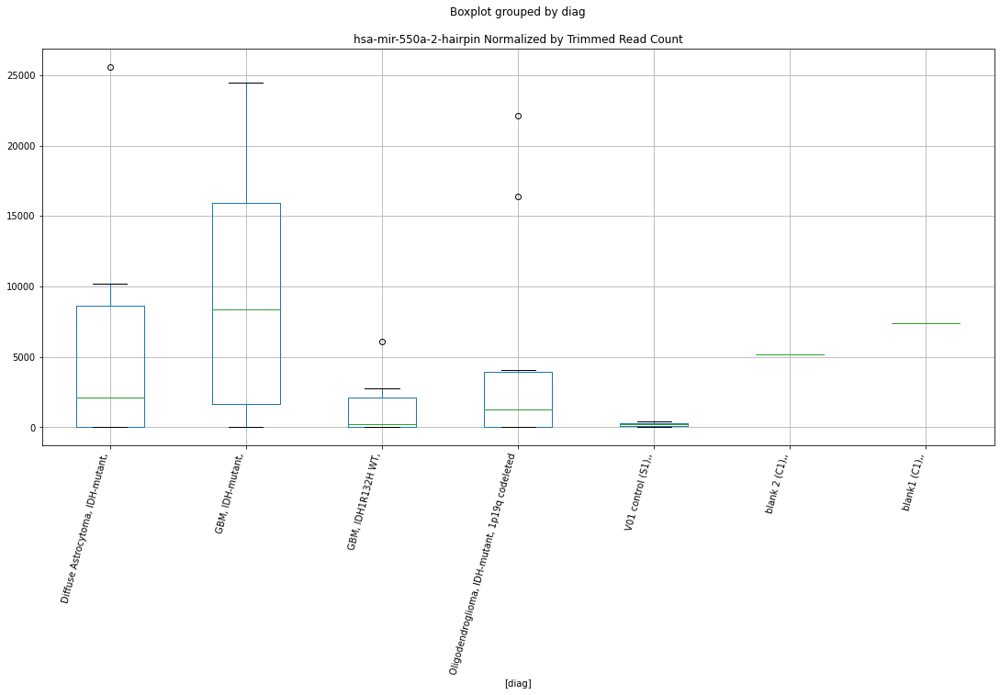

 p : 0.009803820127073022  ( t : 2.887625722877783 ) :  Lexogen  :  bbduk2  :  hsa-mir-4687-5p-mature
Control and blanks
79       0.000000
343    212.314315
Name: hsa-mir-4687-5p-mature, dtype: float64
211    0.0
Name: hsa-mir-4687-5p-mature, dtype: float64
475    0.0
Name: hsa-mir-4687-5p-mature, dtype: float64


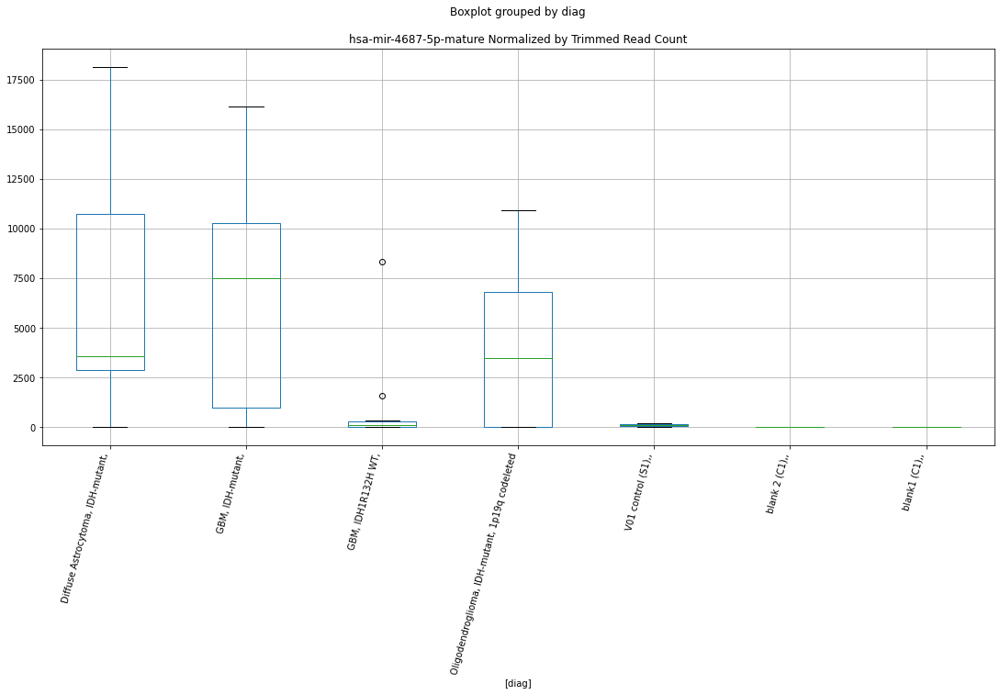

 p : 0.009820944371106111  ( t : 2.886816921537534 ) :  Lexogen  :  bbduk2  :  hsa-mir-548v-hairpin
Control and blanks
79     124462.094854
343     90233.583963
Name: hsa-mir-548v-hairpin, dtype: float64
211    18311.524399
Name: hsa-mir-548v-hairpin, dtype: float64
475    18442.711788
Name: hsa-mir-548v-hairpin, dtype: float64


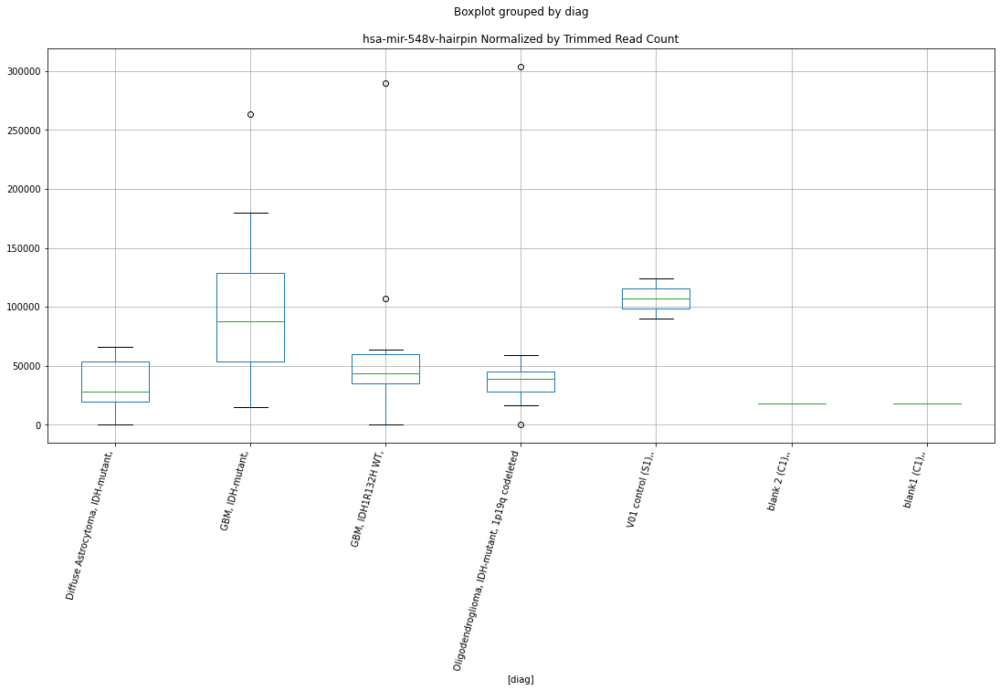

 p : 0.009824766825980845  ( t : 2.886636567663698 ) :  D-plex  :  bbduk2  :  hsa-mir-519e-3p-mature
Control and blanks
73       0.000000
337    890.157264
Name: hsa-mir-519e-3p-mature, dtype: float64
205    3223.63714
Name: hsa-mir-519e-3p-mature, dtype: float64
469    7098.327811
Name: hsa-mir-519e-3p-mature, dtype: float64


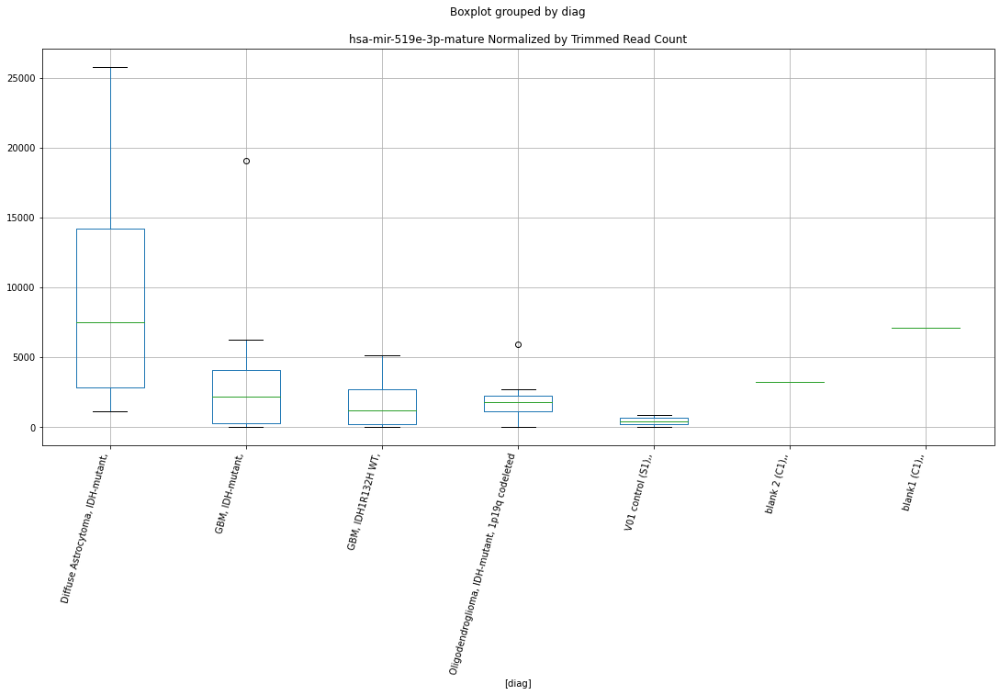

 p : 0.009836121822473598  ( t : 2.886101207076583 ) :  Lexogen  :  cutadapt2  :  hsa-mir-1229-5p-mature
Control and blanks
82       0.000000
346    210.434522
Name: hsa-mir-1229-5p-mature, dtype: float64
214    6238.20843
Name: hsa-mir-1229-5p-mature, dtype: float64
478    5699.051607
Name: hsa-mir-1229-5p-mature, dtype: float64


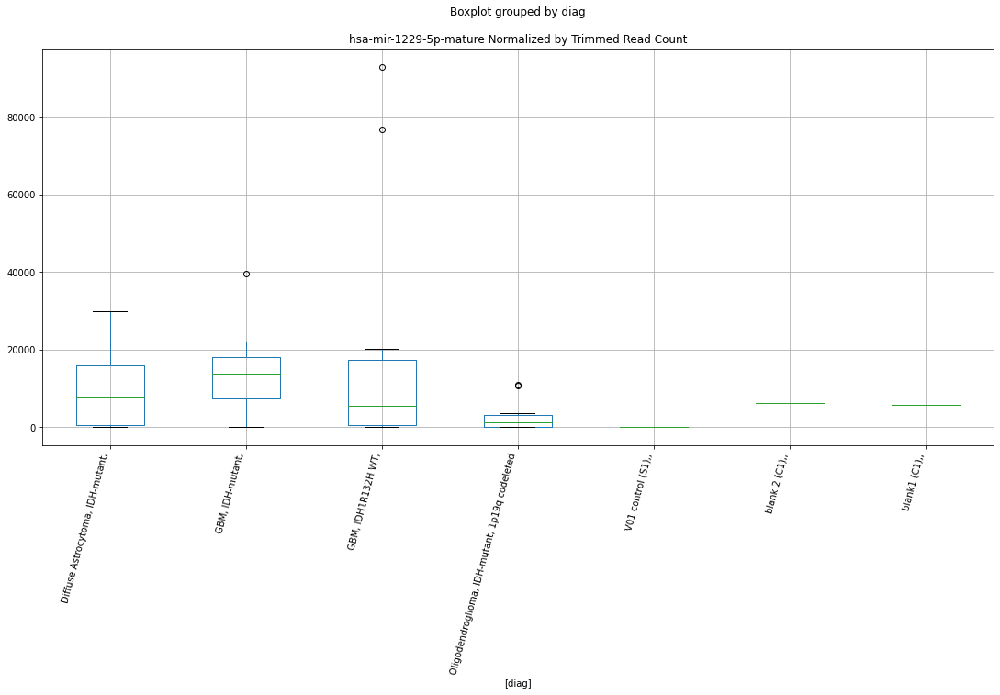

 p : 0.00983956749332176  ( t : 2.8859388700213673 ) :  Lexogen  :  cutadapt2  :  hsa-mir-4700-5p-mature
Control and blanks
82         0.000000
346    13678.243932
Name: hsa-mir-4700-5p-mature, dtype: float64
214    271.226453
Name: hsa-mir-4700-5p-mature, dtype: float64
478    5936.51209
Name: hsa-mir-4700-5p-mature, dtype: float64


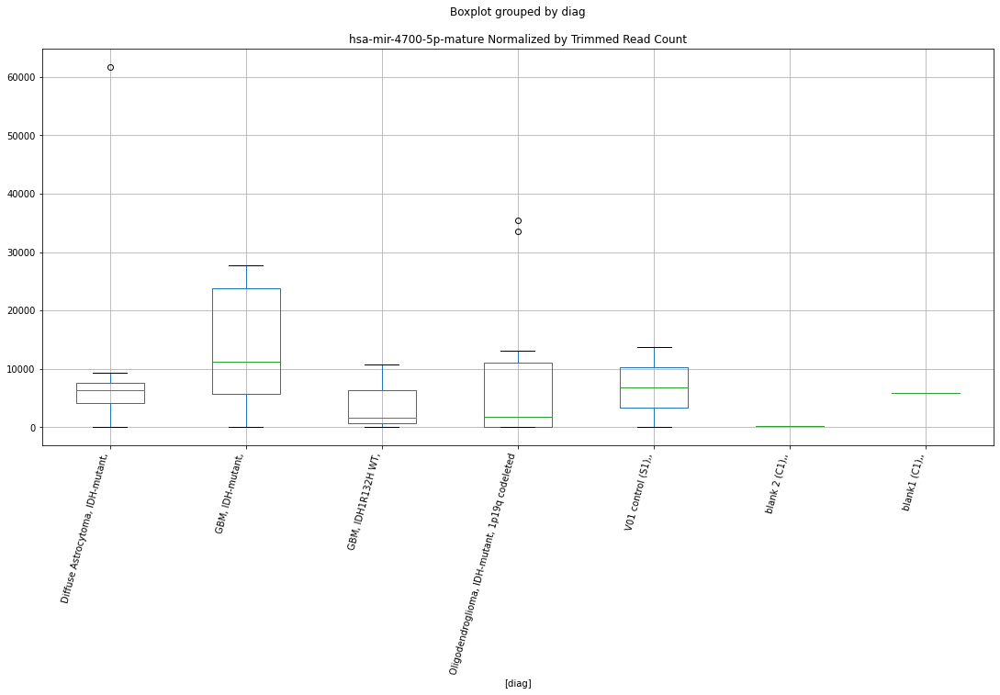

 p : 0.009850260362642646  ( t : 2.885435442403513 ) :  Lexogen  :  bbduk2  :  hsa-mir-1227-hairpin
Control and blanks
79      1430.598791
343    14862.002065
Name: hsa-mir-1227-hairpin, dtype: float64
211    1913.14434
Name: hsa-mir-1227-hairpin, dtype: float64
475    0.0
Name: hsa-mir-1227-hairpin, dtype: float64


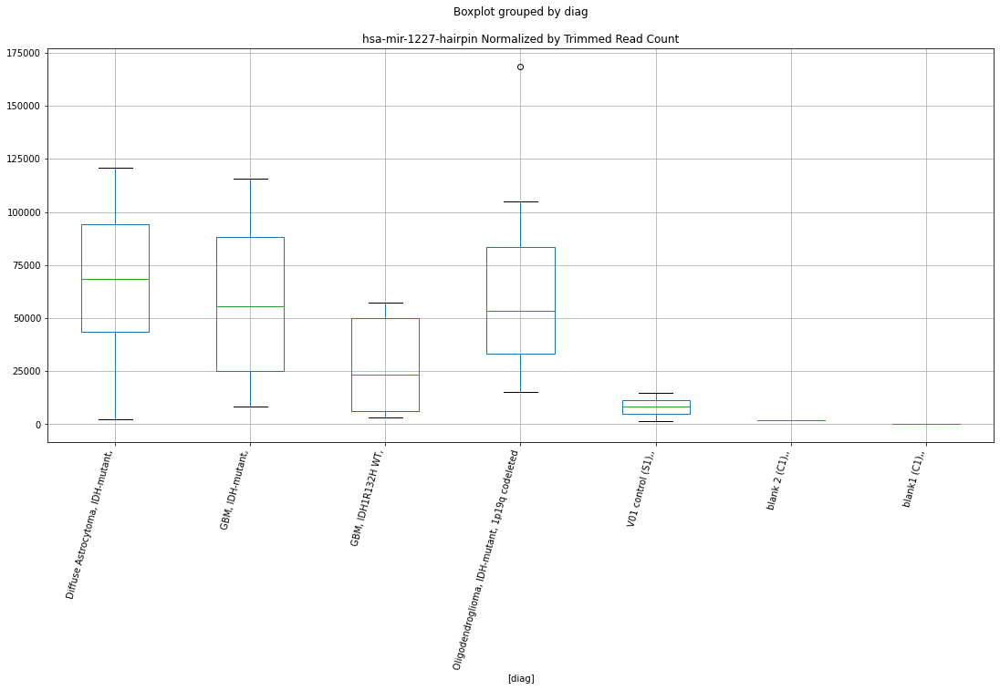

 p : 0.009898097538359215  ( t : 2.883189674783589 ) :  D-plex  :  cutadapt2  :  hsa-mir-3124-hairpin
Control and blanks
76     47729.695371
340    22018.303375
Name: hsa-mir-3124-hairpin, dtype: float64
208    28041.27464
Name: hsa-mir-3124-hairpin, dtype: float64
472    41612.820448
Name: hsa-mir-3124-hairpin, dtype: float64


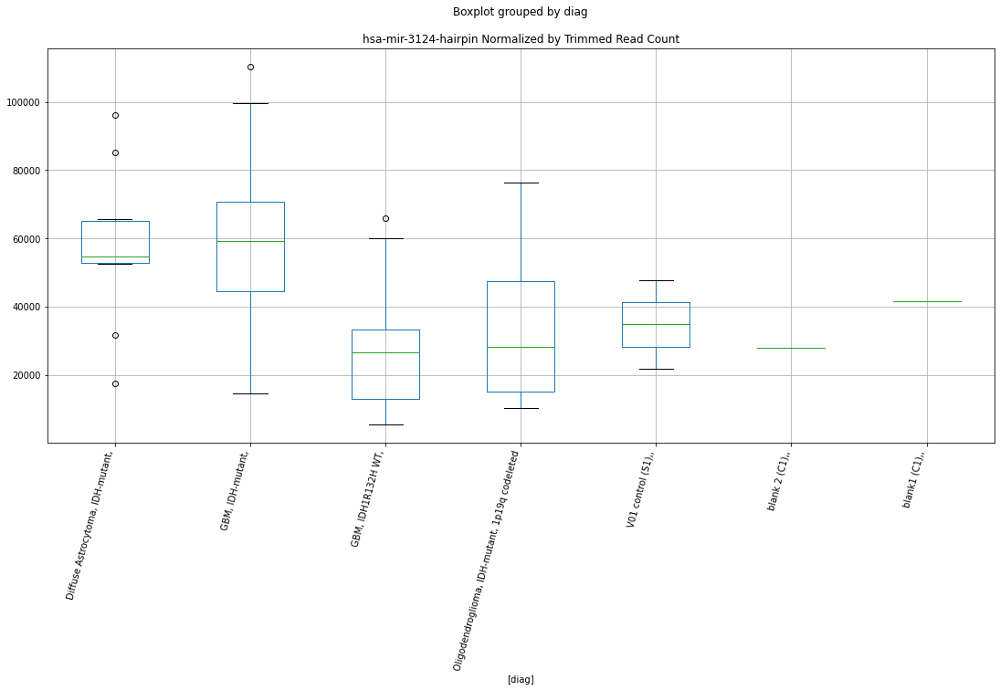

 p : 0.009980844390269387  ( t : 2.879329651871684 ) :  Lexogen  :  bbduk2  :  hsa-mir-3924-hairpin
Control and blanks
79         0.000000
343    28025.489607
Name: hsa-mir-3924-hairpin, dtype: float64
211    6559.352023
Name: hsa-mir-3924-hairpin, dtype: float64
475    1437.094425
Name: hsa-mir-3924-hairpin, dtype: float64


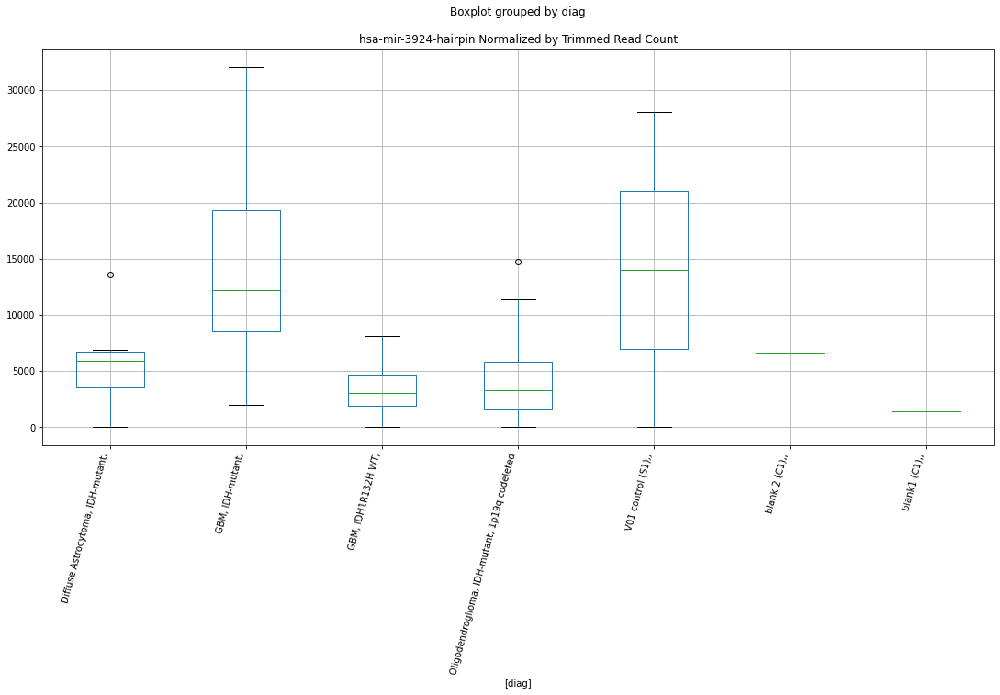

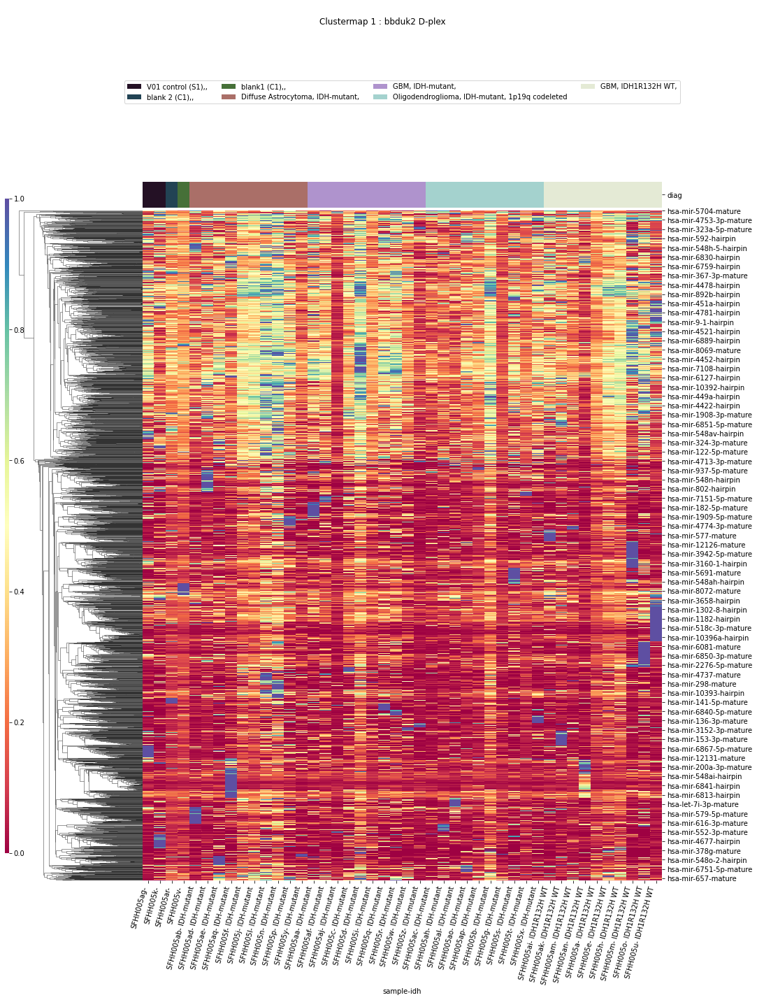

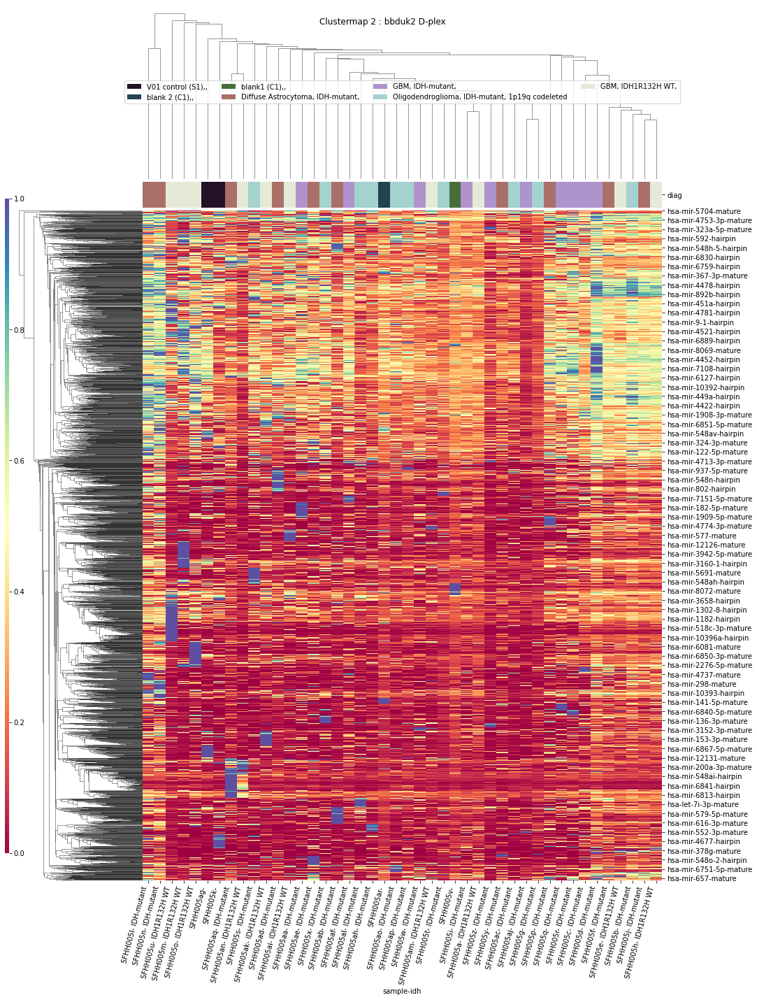

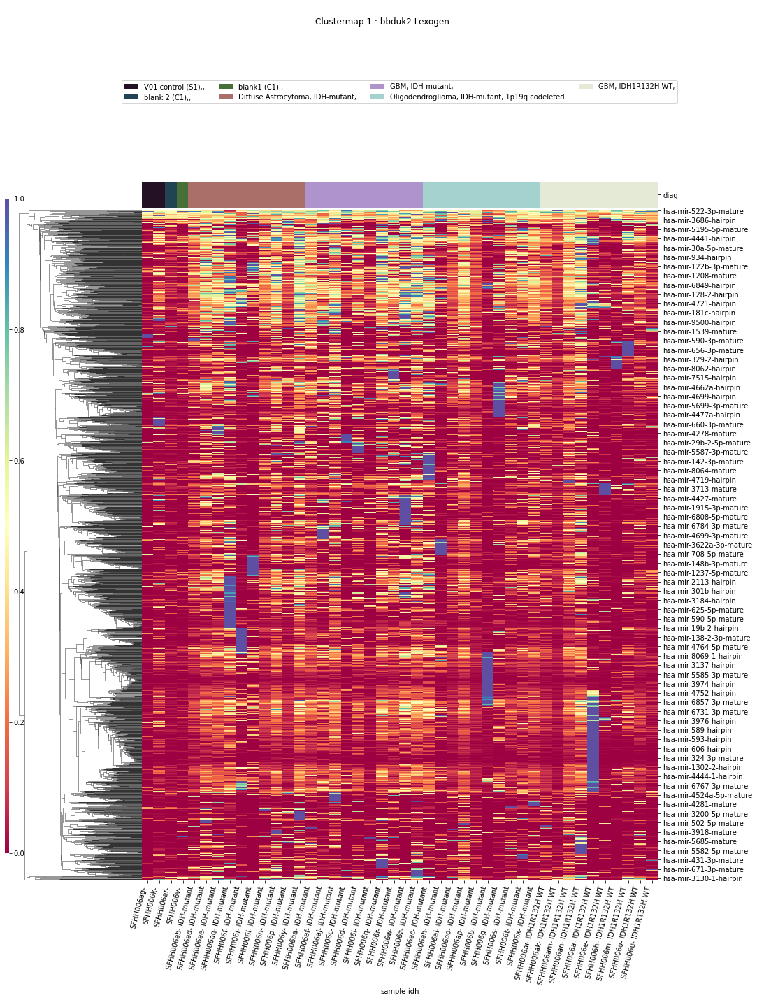

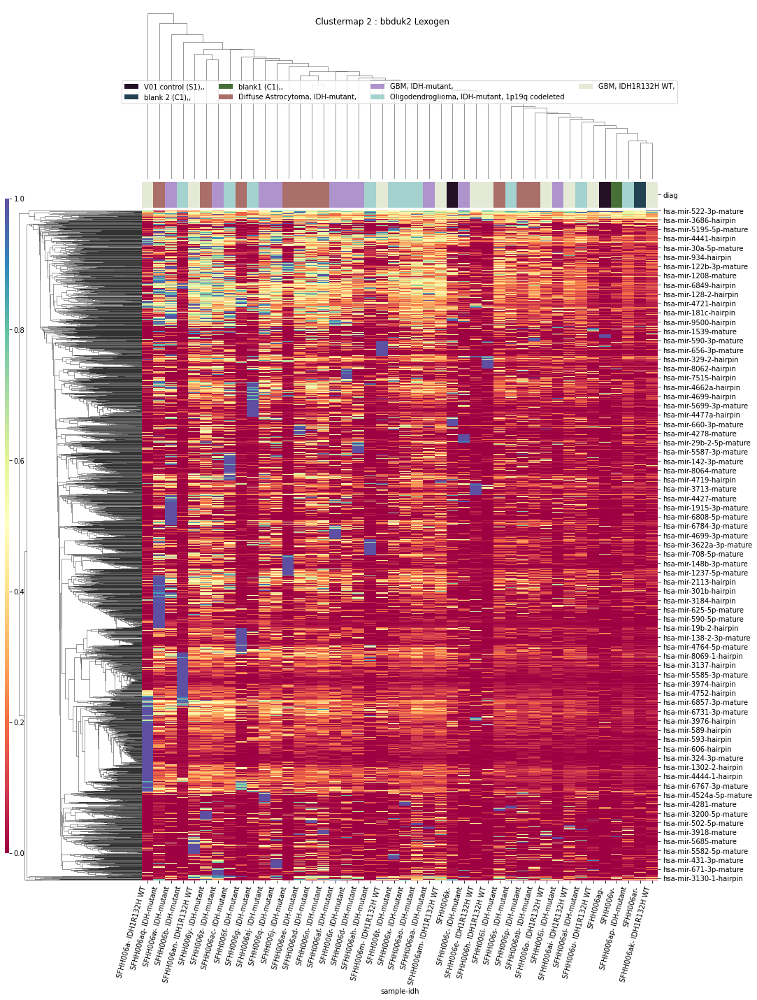

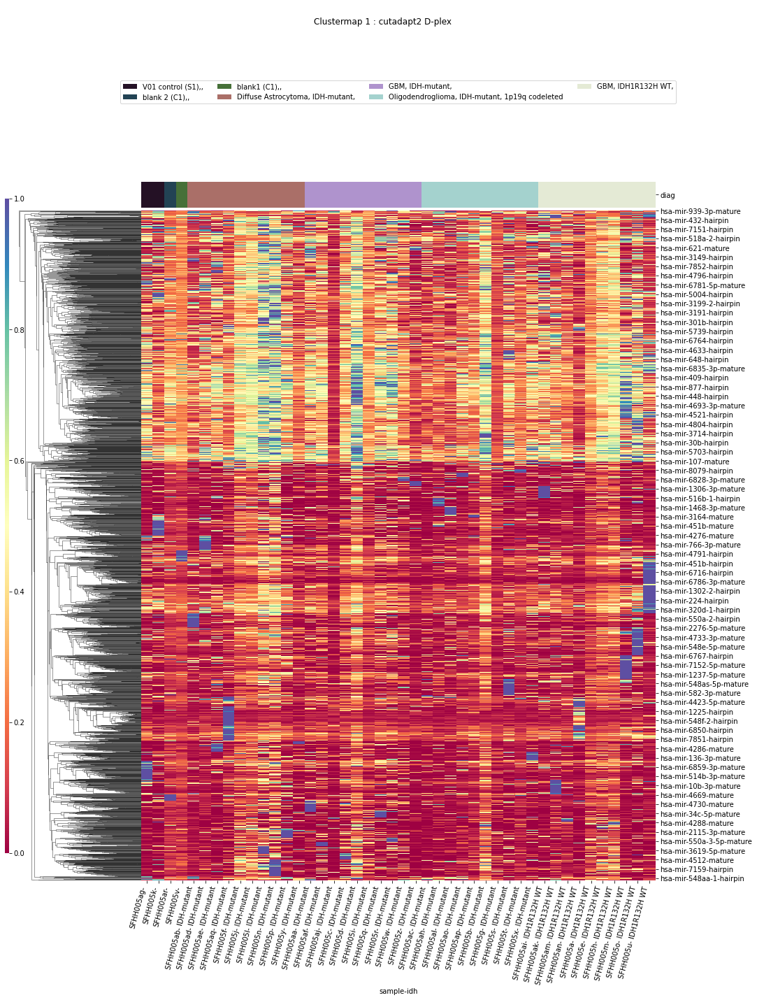

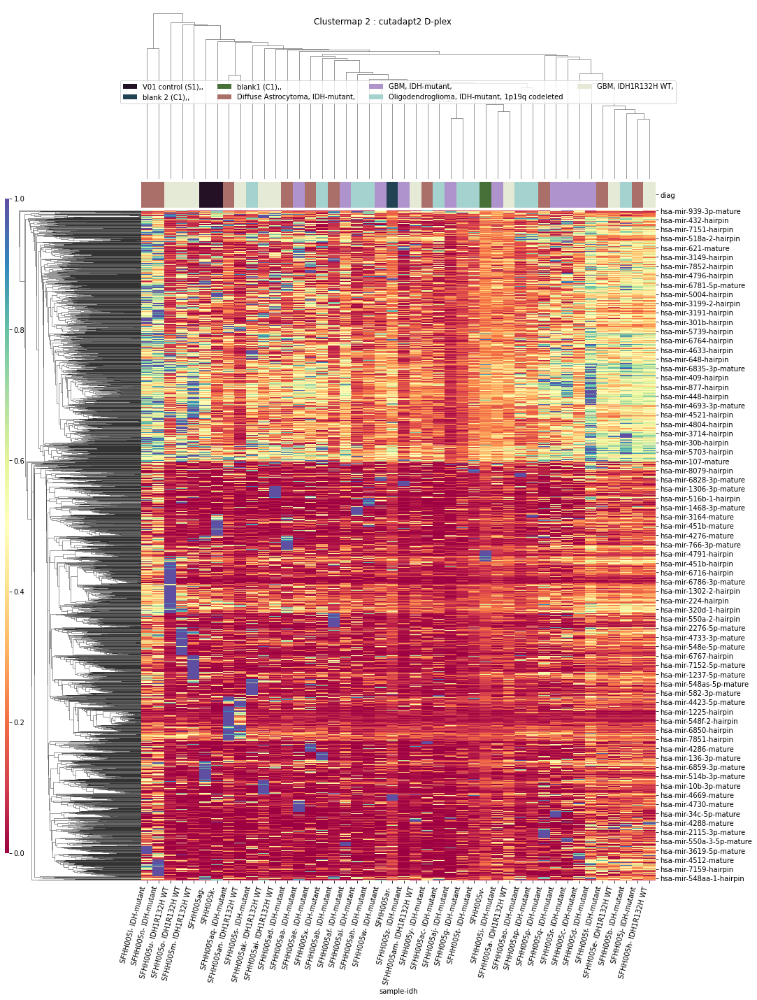

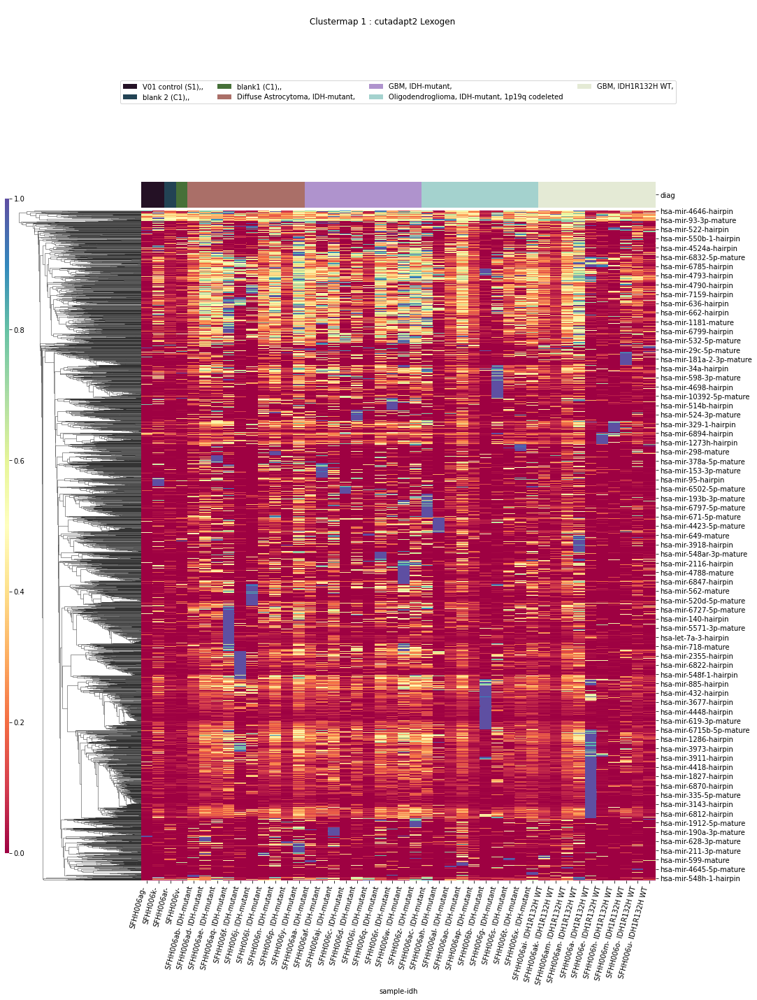

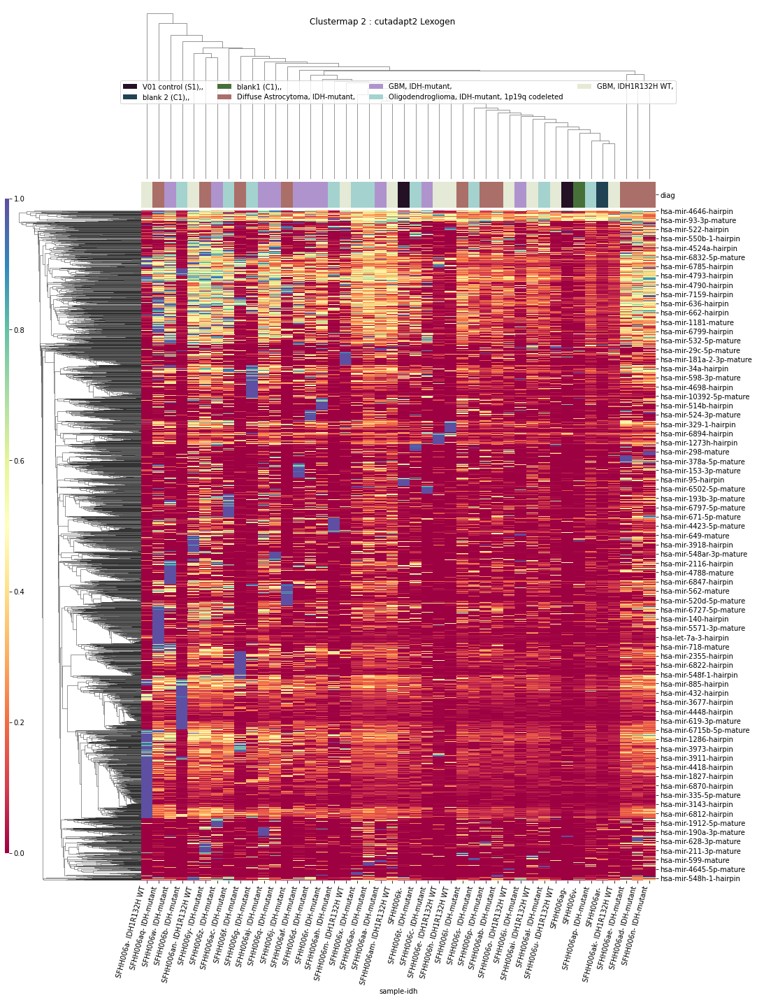

In [70]:
ttests_boxplots_and_heatmaps(dfn,elements,box_p=0.01,heat_p=0.1)

In [71]:
datetime.now().strftime("%H:%M:%S")

'13:15:20'

In [72]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [73]:
pd.set_option('display.max_columns', default_max_columns)

In [74]:
pd.set_option('display.max_rows',default_max_rows)

In [75]:
pd.set_option('display.precision', default_precision)